# Differential Gene Expression — Conditions

Pseudobulk DEG following the [sc-best-practices tutorial](https://www.sc-best-practices.org/conditions/differential_gene_expression.html), using **decoupler** (`dc.pp.pseudobulk`, `dc.pp.filter_samples`, `dc.pp.filter_by_expr`) for pseudobulk aggregation and gene filtering, then PyDESeq2 for testing.

**Comparisons (cohort design from Pekayvaz et al. 2024; DESeq2 pseudobulk analysis is our own):**
1. ACS vs CCS — sterile ACS, all timepoints (TP1M–TP4M) vs CCS, blocked by patient (`~ patient_id + condition`) — beyond the tutorial's baseline, since ACS patients contribute up to 4 correlated timepoint samples. Pekayvaz et al. handle the same repeated-measures problem via mixed-effects models (cross-timepoint outcome comparisons) or by testing timepoints separately (CCS baseline comparisons); this is the pseudobulk-DE equivalent.
2. ACS vs non-CCS — sterile ACS (TP1M) vs non-CCS + Sclerosis, pooled as Control (not a comparison the paper makes)
3. ACS longitudinal: TP1M (acute) vs TP4M (pre-discharge), paired within-patient (`~ patient_id + timepoint`) — immune resolution

**Run across cell-type groupings — Harmony and DRVI only:** Scanorama is not run as a separate method here — it's only ever the source of the named labels. For each of Harmony and DRVI, run the pipeline twice: once on that integration's **own raw Leiden clusters already in the working object** (`harmony_leiden`: 25 clusters, `drvi_leiden`: 32 clusters — not recomputed), and once on the **Scanorama-transferred named cell types** for those same clusters.

In [1]:
DATA_PATH  = "/vol/disk/ubuntu/master_practicum_cytokines/repo/Mapra_Cytokines/data/data_for_practicum_post_integration_curated.h5ad"
OUTPUT_DIR = "/vol/disk/ubuntu/master_practicum_cytokines/lisa/deg_conditions_curated"

# Curated object: 102,146 cells (vs 109,504 in the original), doublet/QC-filtered,
# with harmony_leiden/drvi_leiden reclustered from scratch on this smaller cell set
# (still resolution 1.0, but 14/18 clusters instead of 25/32 -- cluster IDs do NOT
# correspond to the original file's numbering). Reference annotation is the richer,
# manually curated `cell_type_curated` (14 types) instead of `cell_type_Scanorama`.
CELL_TYPE_COL = "cell_type_curated"

# Cell type annotations to run the DEG comparison pipeline on. We only compare
# Harmony and DRVI (Scanorama is not a separate method here, only the label source).
# For each, run both the raw Leiden clusters already in the working object
# (harmony_leiden, drvi_leiden -- not recomputed) and the Scanorama-transferred
# named types for those same clusters (cell_type_Harmony, cell_type_DRVI; Step 1b).
CELL_TYPE_COLS = {
    "Harmony_leiden": "harmony_leiden",
    "Harmony_named":  "cell_type_Harmony",
    "DRVI_leiden":    "drvi_leiden",
    "DRVI_named":     "cell_type_DRVI",
}

SAMPLE_COL    = "display_name"    # unique patient-timepoint ID (e.g. "2.1", "2.4", "29")
CONDITION_COL = "classification"  # ACS / CCS / non-CCS
TIMEPOINT_COL = "timepoint"       # derived below from display_name suffix

PADJ_THRESH = 0.05
LFC_THRESH  = 1.0

import os
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"Output: {OUTPUT_DIR}")

Output: /vol/disk/ubuntu/master_practicum_cytokines/lisa/deg_conditions_curated


In [2]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import decoupler as dc
from scipy.sparse import issparse

sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False)

## Step 1 — Load data and inspect metadata

In [3]:
adata = sc.read_h5ad(DATA_PATH)
print(f"Cells: {adata.n_obs:,}   Genes: {adata.n_vars:,}")

print("\nCondition counts:")
print(adata.obs[CONDITION_COL].value_counts().to_string())

print("\nSamples per condition:")
print(adata.obs.groupby(CONDITION_COL)[SAMPLE_COL].nunique().to_string())

print("\nCell types (Scanorama, reference annotation):")
print(adata.obs[CELL_TYPE_COL].value_counts().to_string())

print(f"\nharmony_leiden: {adata.obs['harmony_leiden'].nunique()} clusters")
print(f"drvi_leiden: {adata.obs['drvi_leiden'].nunique()} clusters")

Cells: 102,146   Genes: 19,220

Condition counts:
classification
acs_w_o_infection            57056
ccs                          11920
vollstaendiger_ausschluss     9622
acs_subacute                  9316
acs_w_infection               9256
koronarsklerose               4976

Samples per condition:
classification
acs_subacute                  9
acs_w_infection              15
acs_w_o_infection            62
ccs                          16
koronarsklerose               7
vollstaendiger_ausschluss    10

Cell types (Scanorama, reference annotation):
cell_type_curated
T-cell-CD4                 50809
Monocytes - CD14           15193
T-cell-CD8                 13316
NK                         12759
B-cell                      4727
Monocytes - CD16_FCGR3A     2482
Dendritic                    873
Tregs                        755
pDC                          554
Other                        256
Progenitor                   234
Plasma cells                 119
Megakaryocytes                60


In [4]:
def parse_timepoint(display_name):
    s = str(display_name)
    if "." not in s:
        return "TP0M"
    return f"TP{s.split('.')[-1]}M"

adata.obs["timepoint"] = adata.obs["display_name"].apply(parse_timepoint)

condition_map = {
    "acs_w_o_infection":         "ACS_sterile",
    "acs_w_infection":           "ACS_infection",
    "acs_subacute":              "ACS_subacute",
    "ccs":                       "CCS",
    "vollstaendiger_ausschluss": "non-CCS",
    "koronarsklerose":           "Sclerosis",
}
adata.obs["condition"] = adata.obs[CONDITION_COL].map(condition_map)

print("Timepoint distribution:")
print(adata.obs["timepoint"].value_counts().to_string())

print("\nCondition:")
print(adata.obs["condition"].value_counts().to_string())

print("\nTimepoint x condition:")
display(pd.crosstab(adata.obs["timepoint"], adata.obs["condition"]))

Timepoint distribution:
timepoint
TP0M    26518
TP2M    23484
TP1M    20027
TP3M    17006
TP4M    15111

Condition:
condition
ACS_sterile      57056
CCS              11920
non-CCS           9622
ACS_subacute      9316
ACS_infection     9256
Sclerosis         4976

Timepoint x condition:


condition,ACS_subacute,ACS_infection,ACS_sterile,CCS,Sclerosis,non-CCS
timepoint,,,,,,
TP0M,0,0,0,11920,4976,9622
TP1M,3356,2006,14665,0,0,0
TP2M,2207,1566,19711,0,0,0
TP3M,2381,3354,11271,0,0,0
TP4M,1372,2330,11409,0,0,0


## Step 1b — Derive named cell types for Harmony and DRVI

Curated-file variant: label source is `cell_type_curated` (the manually curated annotation, 14 types) instead of `cell_type_Scanorama`. Harmony (`harmony_leiden`, 14 clusters) and DRVI (`drvi_leiden`, 18 clusters) only have unlabeled Leiden clusters already computed in the working object -- reclustered from scratch on this curated cell set, so cluster IDs don't correspond to the original file's numbering. Each cluster is assigned the majority `cell_type_curated` label among its cells (label transfer). Cluster purity is reported as a sanity check.

In [5]:
def transfer_celltype_labels(adata, source_col, cluster_col, new_col):
    """Assign each cluster in `cluster_col` the majority `source_col` label; store in `new_col`."""
    majority = adata.obs.groupby(cluster_col, observed=True)[source_col].agg(lambda s: s.value_counts().idxmax())
    adata.obs[new_col] = adata.obs[cluster_col].map(majority).astype("category")

    match = adata.obs[source_col] == adata.obs[cluster_col].map(majority)
    purity = match.groupby(adata.obs[cluster_col], observed=True).mean()

    print(f"{new_col}: {adata.obs[new_col].nunique()} cell types mapped from "
          f"{adata.obs[cluster_col].nunique()} '{cluster_col}' clusters")
    print(f"Mean cluster purity vs '{source_col}': {purity.mean():.1%}  (worst cluster: {purity.min():.1%})")
    return adata


transfer_celltype_labels(adata, source_col=CELL_TYPE_COL, cluster_col="harmony_leiden", new_col="cell_type_Harmony")
transfer_celltype_labels(adata, source_col=CELL_TYPE_COL, cluster_col="drvi_leiden", new_col="cell_type_DRVI")

print("\ncell_type_Harmony counts:")
print(adata.obs["cell_type_Harmony"].value_counts().to_string())
print("\ncell_type_DRVI counts:")
print(adata.obs["cell_type_DRVI"].value_counts().to_string())

cell_type_Harmony: 10 cell types mapped from 14 'harmony_leiden' clusters
Mean cluster purity vs 'cell_type_curated': 92.0%  (worst cluster: 64.6%)
cell_type_DRVI: 9 cell types mapped from 18 'drvi_leiden' clusters
Mean cluster purity vs 'cell_type_curated': 85.3%  (worst cluster: 51.7%)

cell_type_Harmony counts:
cell_type_Harmony
T-cell-CD4                 51233
Monocytes - CD14           15457
NK                         13229
T-cell-CD8                 13079
B-cell                      4716
Monocytes - CD16_FCGR3A     2540
Dendritic                    996
pDC                          498
Progenitor                   339
Megakaryocytes                59
Plasma cells                   0
Plasma Blast                   0
Other                          0
Tregs                          0

cell_type_DRVI counts:
cell_type_DRVI
T-cell-CD4                 51000
NK                         20722
Monocytes - CD14           14589
T-cell-CD8                  6253
B-cell                      4749


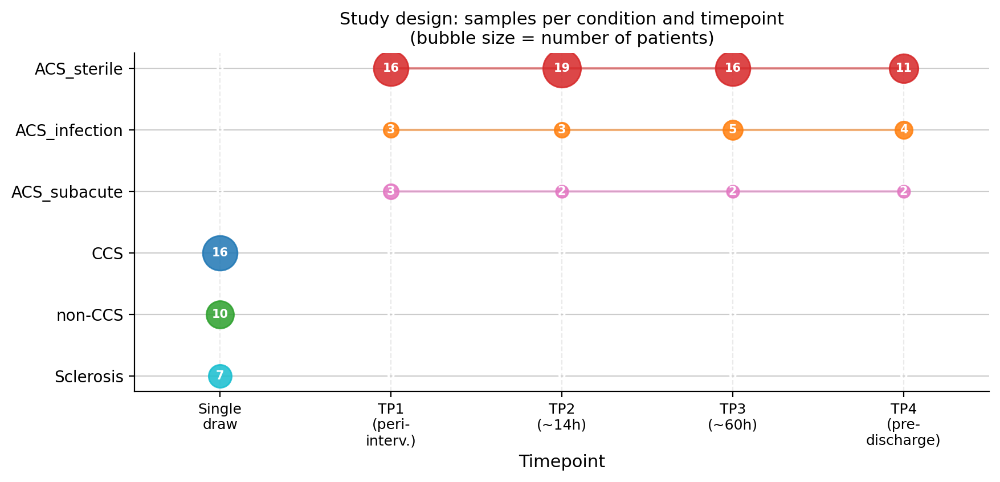

In [6]:
# ── Plot 1: Study design timeline ────────────────────────────────────────────
# ACS patients: 4 longitudinal timepoints; CCS/non-CCS: single draw

condition_order = ["ACS_sterile", "ACS_infection", "ACS_subacute", "CCS", "non-CCS", "Sclerosis"]
timepoints_acs  = ["TP1M", "TP2M", "TP3M", "TP4M"]
timepoints_ctrl = ["TP0M"]

tp_x = {"TP0M": 0, "TP1M": 1, "TP2M": 2, "TP3M": 3, "TP4M": 4}
tp_labels = {0: "Single\ndraw", 1: "TP1\n(peri-\ninterv.)", 2: "TP2\n(~14h)", 3: "TP3\n(~60h)", 4: "TP4\n(pre-\ndischarge)"}

colors_cond = {
    "ACS_sterile":   "#d62728",
    "ACS_infection": "#ff7f0e",
    "ACS_subacute":  "#e377c2",
    "CCS":           "#1f77b4",
    "non-CCS":       "#2ca02c",
    "Sclerosis":     "#17becf",
}

# Count patients per (condition, timepoint)
obs_unique = adata.obs[["condition", "timepoint", "display_name"]].drop_duplicates("display_name")
pt_counts = obs_unique.groupby(["condition", "timepoint"]).size().reset_index(name="n")

fig, ax = plt.subplots(figsize=(9, 4.5))

y_positions = {c: i for i, c in enumerate(reversed(condition_order))}
labels_shown = set()

for _, row in pt_counts.iterrows():
    cond, tp, n = row["condition"], row["timepoint"], row["n"]
    if cond not in y_positions or tp not in tp_x:
        continue
    y = y_positions[cond]
    x = tp_x[tp]
    color = colors_cond.get(cond, "grey")
    ax.scatter(x, y, s=n * 30, color=color, zorder=3, alpha=0.85,
               label=cond if cond not in labels_shown else "")
    ax.text(x, y, str(n), ha="center", va="center", fontsize=7.5,
            color="white", fontweight="bold")
    labels_shown.add(cond)

# Draw lines connecting ACS timepoints
for cond in ["ACS_sterile", "ACS_infection", "ACS_subacute"]:
    y = y_positions[cond]
    xs = [tp_x[tp] for tp in timepoints_acs
          if pt_counts[(pt_counts.condition == cond) & (pt_counts.timepoint == tp)].shape[0] > 0]
    if xs:
        ax.plot(xs, [y] * len(xs), color=colors_cond[cond], linewidth=1.5,
                alpha=0.5, zorder=2)

ax.set_yticks(list(y_positions.values()))
ax.set_yticklabels(list(reversed(condition_order)), fontsize=10)
ax.set_xticks(list(tp_labels.keys()))
ax.set_xticklabels(list(tp_labels.values()), fontsize=9)
ax.set_xlim(-0.5, 4.5)
ax.set_xlabel("Timepoint", fontsize=11)
ax.set_title("Study design: samples per condition and timepoint\n(bubble size = number of patients)", fontsize=11)
ax.grid(axis="x", linestyle="--", alpha=0.4)
ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "study_design_timeline.png"), bbox_inches="tight", dpi=150)
plt.show()

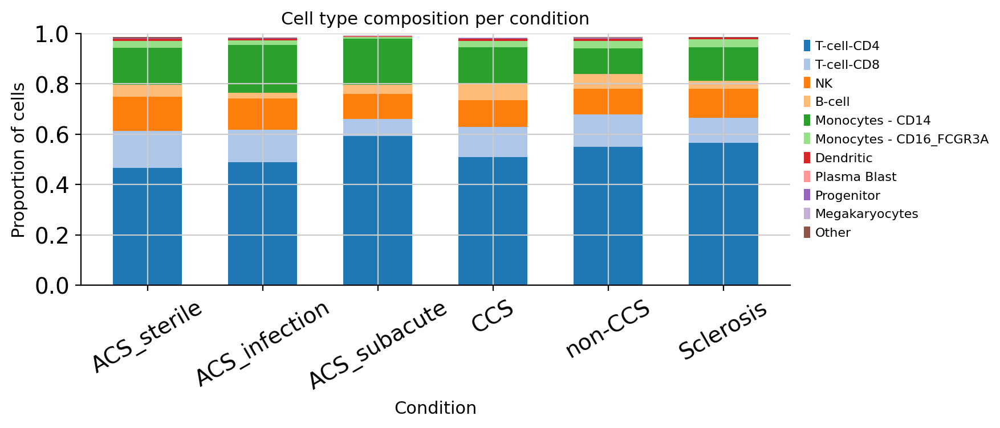

In [7]:
# ── Plot 2: Cell type composition per condition ───────────────────────────────
ct_order = [
    "T-cell-CD4", "T-cell-CD8", "NK", "B-cell",
    "Monocytes - CD14", "Monocytes - CD16_FCGR3A",
    "Dendritic", "Plasma Blast", "Progenitor", "Megakaryocytes", "Other"
]
ct_colors = plt.cm.tab20.colors[:len(ct_order)]

# Proportion of each cell type within each condition
ct_prop = (
    adata.obs.groupby(["condition", CELL_TYPE_COL])
             .size()
             .unstack(fill_value=0)
)
ct_prop = ct_prop.div(ct_prop.sum(axis=1), axis=0)
ct_prop = ct_prop.reindex(columns=[c for c in ct_order if c in ct_prop.columns])
ct_prop = ct_prop.reindex(condition_order)

fig, ax = plt.subplots(figsize=(9, 4))
bottom = np.zeros(len(ct_prop))

for i, ct in enumerate(ct_prop.columns):
    vals = ct_prop[ct].values
    ax.bar(ct_prop.index, vals, bottom=bottom,
           color=ct_colors[i], label=ct, width=0.6)
    bottom += vals

ax.set_ylabel("Proportion of cells", fontsize=11)
ax.set_xlabel("Condition", fontsize=11)
ax.set_title("Cell type composition per condition", fontsize=11)
ax.set_ylim(0, 1)
ax.tick_params(axis="x", rotation=30)
ax.legend(bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=8, frameon=False)
ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "celltype_composition.png"), bbox_inches="tight", dpi=150)
plt.show()

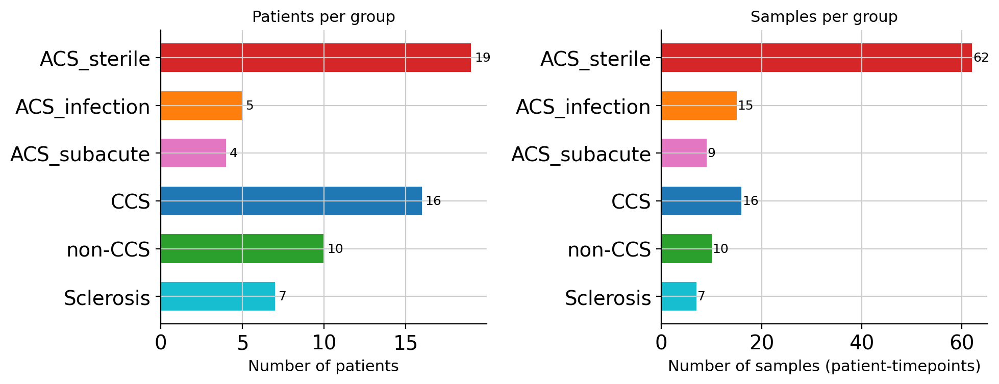

In [8]:
# ── Plot 3: Cohort overview bar chart (patients and cells per group) ──────────
obs_pt = adata.obs.drop_duplicates("display_name")
summary = obs_pt.groupby("condition").agg(
    patients=("display_name", lambda x: adata.obs.loc[adata.obs["display_name"].isin(x), "display_name"]
              .apply(lambda d: str(d).split(".")[0]).nunique()),
    samples=("display_name", "count"),
).reindex(condition_order)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

bar_colors = [colors_cond[c] for c in summary.index]

axes[0].barh(summary.index, summary["patients"], color=bar_colors, height=0.6)
axes[0].set_xlabel("Number of patients", fontsize=11)
axes[0].set_title("Patients per group", fontsize=11)
axes[0].invert_yaxis()
axes[0].spines[["top", "right"]].set_visible(False)
for i, v in enumerate(summary["patients"]):
    axes[0].text(v + 0.2, i, str(v), va="center", fontsize=9)

axes[1].barh(summary.index, summary["samples"], color=bar_colors, height=0.6)
axes[1].set_xlabel("Number of samples (patient-timepoints)", fontsize=11)
axes[1].set_title("Samples per group", fontsize=11)
axes[1].invert_yaxis()
axes[1].spines[["top", "right"]].set_visible(False)
for i, v in enumerate(summary["samples"]):
    axes[1].text(v + 0.2, i, str(v), va="center", fontsize=9)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "cohort_overview.png"), bbox_inches="tight", dpi=150)
plt.show()

## Step 2 — Pseudobulk aggregation\n",
    "\n",
    "Following the sc-best-practices tutorial: aggregate raw counts per (patient × cell type).  \n",
    "Each resulting row is one patient's summed counts for one cell type — the correct statistical unit for DESeq2."

In [9]:
def get_pseudobulk(adata, sample_col, groups_col, layer="counts", min_cells=10, min_counts=1000):
    """
    Aggregate raw counts per (sample, cell_type) by summing, via decoupler.
    Returns an AnnData where each obs is one (sample, cell_type) pseudobulk sample,
    already filtered to units with >= min_cells contributing cells and >= min_counts
    total counts (decoupler's dc.pp.filter_samples).
    """
    pdata = dc.pp.pseudobulk(adata, sample_col=sample_col, groups_col=groups_col, layer=layer, mode="sum")
    dc.pp.filter_samples(pdata, min_cells=min_cells, min_counts=min_counts)
    return pdata


def filter_by_expr(pdata, group, min_count=10, min_total_count=15):
    """Genes with sufficiently large counts to retain, via decoupler's edgeR-style filterByExpr."""
    return dc.pp.filter_by_expr(pdata, group=group, min_count=min_count,
                                min_total_count=min_total_count, inplace=False)


print("Pseudobulk aggregation functions ready (decoupler-backed).")

Pseudobulk aggregation functions ready (decoupler-backed).


In [10]:
# QC: library sizes per pseudobulk sample (low-count samples can skew DESeq2)
def plot_pseudobulk_qc(pdata, condition_col, title_suffix, save_path):
    total_counts = pdata.X.sum(axis=1) if not issparse(pdata.X) else pdata.X.sum(axis=1).A1

    # .astype(str) avoids a pandas Categorical.map() quirk: mapping a categorical
    # column through a dict of RGB tuples makes pandas build a MultiIndex from the
    # tuple results, which then crashes checking that MultiIndex for NaNs.
    condition_vals = pdata.obs[condition_col].astype(str)
    colors = condition_vals.map(
        {c: col for c, col in zip(condition_vals.unique(), plt.cm.Set2.colors)}
    )
    fig, ax = plt.subplots(figsize=(max(10, pdata.n_obs * 0.25), 4))
    ax.bar(range(pdata.n_obs), sorted(total_counts), color=list(colors[np.argsort(total_counts)]))
    ax.set_xlabel("Pseudobulk sample (sorted by size)")
    ax.set_ylabel("Total counts")
    ax.set_title(f"Pseudobulk library sizes, QC ({title_suffix})")
    handles = [plt.Rectangle((0, 0), 1, 1, color=plt.cm.Set2.colors[i])
               for i, c in enumerate(condition_vals.unique())]
    ax.legend(handles, condition_vals.unique(), title="Condition", frameon=False)
    plt.tight_layout()
    plt.savefig(save_path, bbox_inches="tight", dpi=150)
    plt.show()


print("QC plotting function ready.")

QC plotting function ready.


## Step 3 — PyDESeq2 helper

For each cell type, subset the pseudobulk object to the two groups, filter low-expressed genes,
and run DESeq2. Positive log2FC = higher in `group_a` vs `group_b`.

In [11]:
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds  import DeseqStats


def run_deseq2_per_celltype(pdata, condition_col, group_a, group_b,
                             cell_type_col, min_samples=3, n_cpus=4,
                             covariate_col=None):
    """
    Run PyDESeq2 for group_a vs group_b for each cell type.
    Positive log2FC = higher in group_a vs group_b (group_b is reference).

    If `covariate_col` is given, it's added to the design as a blocking factor
    (e.g. patient_id) to account for repeated measures within the same patient
    when a group can contain more than one sample per patient.
    """
    results = {}

    for ct in sorted(pdata.obs[cell_type_col].unique()):
        mask = (
            (pdata.obs[cell_type_col] == ct) &
            (pdata.obs[condition_col].isin([group_a, group_b]))
        )
        pdata_ct = pdata[mask].copy()

        n_a = (pdata_ct.obs[condition_col] == group_a).sum()
        n_b = (pdata_ct.obs[condition_col] == group_b).sum()

        if n_a < min_samples or n_b < min_samples:
            print(f"  SKIP {ct}: {group_a}={n_a}, {group_b}={n_b} (need ≥{min_samples})")
            continue

        print(f"  {ct}: {group_a}={n_a}, {group_b}={n_b} samples")

        # Filter lowly expressed genes
        genes_to_keep = filter_by_expr(pdata_ct, group=condition_col,
                                       min_count=10, min_total_count=15)
        pdata_ct = pdata_ct[:, genes_to_keep].copy()

        X = pdata_ct.X if not issparse(pdata_ct.X) else pdata_ct.X.toarray()
        counts_df = pd.DataFrame(X.astype(int),
                                 index=pdata_ct.obs_names,
                                 columns=pdata_ct.var_names)

        meta_cols = [condition_col] if covariate_col is None else [covariate_col, condition_col]
        meta_df = pdata_ct.obs[meta_cols].copy()
        meta_df[condition_col] = pd.Categorical(
            meta_df[condition_col],
            categories=[group_b, group_a],  # group_b = reference level
        )
        design_factors = condition_col if covariate_col is None else [covariate_col, condition_col]

        try:
            dds = DeseqDataSet(
                counts=counts_df,
                metadata=meta_df,
                design_factors=design_factors,
                n_cpus=n_cpus,
            )
            dds.deseq2()
            stat_res = DeseqStats(
                dds,
                contrast=[condition_col, group_a, group_b],  # explicit contrast required
                n_cpus=n_cpus,
            )
            stat_res.summary()
            res = stat_res.results_df.copy()
            res["cell_type"] = ct
            results[ct] = res
        except Exception as e:
            print(f"    ERROR in {ct}: {e}")

    return results


print("PyDESeq2 ready.")

PyDESeq2 ready.


## Step 4 — Comparison pipeline

For each cell-type grouping (Harmony_leiden, Harmony_named, DRVI_leiden, DRVI_named), run the same three comparisons on the pseudobulk data:

1. **ACS vs CCS** — sterile ACS, **all timepoints (TP1M–TP4M)** vs CCS (TP0M), matching the paper's IAI comparison. Blocked by `patient_id` to avoid pseudoreplication from ACS patients contributing up to 4 correlated samples.
2. **ACS vs non-CCS** — sterile ACS (TP1M) vs non-CCS + Sclerosis, pooled as "Control". Not a comparison the paper makes.
3. **ACS longitudinal: TP1M vs TP4M** — paired within-patient design (`~ patient_id + timepoint`), sterile ACS only.

Defined once as a function below; called per cell-type grouping in Step 8. Note: `Harmony_leiden` (25 clusters) and `DRVI_leiden` (32 clusters) are much finer than their named-type counterparts — expect some smaller clusters to be skipped for not meeting the minimum sample/cell thresholds.

In [12]:
def run_all_comparisons(adata, cell_type_col, method_name):
    """Run the DESeq2 comparisons (ACS vs CCS, ACS vs non-CCS, ACS longitudinal, and
    ACS-per-timepoint vs CCS) for the given cell-type annotation column. Returns a
    dict of results dicts, one per comparison."""

    # ── Comparison 1 — ACS (all timepoints) vs CCS ───────────────────────────
    # Pools sterile ACS across TP1M-TP4M, matching the paper's IAI comparison
    # (which uses all 4 ACS timepoints vs CCS). Since this means some patients
    # contribute up to 4 correlated pseudobulk samples while CCS patients only
    # contribute 1, patient_id is added as a blocking covariate to avoid
    # pseudoreplication (~ patient_id + condition), same principle as Comparison 3.
    print(f"\n{'='*70}\n{method_name}: Comparison 1 — ACS (TP1M-TP4M) vs CCS\n{'='*70}")
    mask = (
        ((adata.obs["condition"] == "ACS_sterile") & (adata.obs["timepoint"].isin(["TP1M", "TP2M", "TP3M", "TP4M"]))) |
        (adata.obs["condition"] == "CCS")
    )
    adata_sub = adata[mask].copy()
    adata_sub.obs["patient_id"] = adata_sub.obs["display_name"].apply(lambda x: str(x).split(".")[0])
    print(f"ACS sterile (all timepoints) vs CCS — {adata_sub.n_obs:,} cells")
    print(adata_sub.obs["condition"].value_counts().to_string())
    print(f"ACS patients: {adata_sub.obs.loc[adata_sub.obs['condition'] == 'ACS_sterile', 'patient_id'].nunique()}, "
          f"CCS patients: {adata_sub.obs.loc[adata_sub.obs['condition'] == 'CCS', 'patient_id'].nunique()}")

    pdata_acs_ccs = get_pseudobulk(adata_sub, sample_col=SAMPLE_COL,
                                    groups_col=cell_type_col, layer="counts", min_cells=10)
    print(f"\nPseudobulk samples: {pdata_acs_ccs.n_obs}")
    plot_pseudobulk_qc(pdata_acs_ccs, condition_col="condition",
                        title_suffix=f"{method_name}, ACS vs CCS",
                        save_path=os.path.join(OUTPUT_DIR, f"pseudobulk_qc_{method_name}_ACS_vs_CCS.png"))

    results_acs_ccs = run_deseq2_per_celltype(
        pdata_acs_ccs, condition_col="condition",
        group_a="ACS_sterile", group_b="CCS", cell_type_col=cell_type_col,
        covariate_col="patient_id",
    )

    # ── Comparison 2 — ACS vs non-CCS ────────────────────────────────────────
    print(f"\n{'='*70}\n{method_name}: Comparison 2 — ACS vs non-CCS\n{'='*70}")
    mask = (
        ((adata.obs["condition"] == "ACS_sterile") & (adata.obs["timepoint"] == "TP1M")) |
        (adata.obs["condition"].isin(["non-CCS", "Sclerosis"]))
    )
    adata_sub = adata[mask].copy()
    adata_sub.obs["condition2"] = adata_sub.obs["condition"].replace(
        {"non-CCS": "Control", "Sclerosis": "Control"}
    )
    print(f"ACS sterile (TP1M) vs Control — {adata_sub.n_obs:,} cells")
    print(adata_sub.obs["condition2"].value_counts().to_string())

    pdata_acs_ctrl = get_pseudobulk(adata_sub, sample_col=SAMPLE_COL,
                                     groups_col=cell_type_col, layer="counts", min_cells=10)
    print(f"\nPseudobulk samples: {pdata_acs_ctrl.n_obs}")
    plot_pseudobulk_qc(pdata_acs_ctrl, condition_col="condition2",
                        title_suffix=f"{method_name}, ACS vs non-CCS",
                        save_path=os.path.join(OUTPUT_DIR, f"pseudobulk_qc_{method_name}_ACS_vs_nonCCS.png"))

    results_acs_nonccs = run_deseq2_per_celltype(
        pdata_acs_ctrl, condition_col="condition2",
        group_a="ACS_sterile", group_b="Control", cell_type_col=cell_type_col,
    )

    # ── Comparison 3 — ACS longitudinal: TP1M vs TP4M ────────────────────────
    print(f"\n{'='*70}\n{method_name}: Comparison 3 — ACS longitudinal TP1M vs TP4M\n{'='*70}")
    mask_long = (
        (adata.obs["condition"] == "ACS_sterile") &
        (adata.obs["timepoint"].isin(["TP1M", "TP4M"]))
    )
    adata_long = adata[mask_long].copy()
    adata_long.obs["patient_id"] = adata_long.obs["display_name"].apply(
        lambda x: str(x).split(".")[0]
    )
    print(f"ACS sterile TP1M vs TP4M — {adata_long.n_obs:,} cells")
    print(adata_long.obs["timepoint"].value_counts().to_string())
    print(f"\nPatients: {adata_long.obs['patient_id'].nunique()}")

    pdata_long = get_pseudobulk(adata_long, sample_col=SAMPLE_COL,
                                 groups_col=cell_type_col, layer="counts", min_cells=10)
    print(f"\nPseudobulk samples: {pdata_long.n_obs}")
    plot_pseudobulk_qc(pdata_long, condition_col="timepoint",
                        title_suffix=f"{method_name}, ACS TP1M vs TP4M",
                        save_path=os.path.join(OUTPUT_DIR, f"pseudobulk_qc_{method_name}_ACS_TP1M_vs_TP4M.png"))

    # Paired DESeq2: patient_id as covariate, timepoint as the tested factor
    # design: ~ patient_id + timepoint  (controls for per-patient baseline differences)
    results_longitudinal = {}

    for ct in sorted(pdata_long.obs[cell_type_col].unique()):
        mask_ct = pdata_long.obs[cell_type_col] == ct
        pdata_ct = pdata_long[mask_ct].copy()

        n_tp1 = (pdata_ct.obs["timepoint"] == "TP1M").sum()
        n_tp4 = (pdata_ct.obs["timepoint"] == "TP4M").sum()

        if n_tp1 < 3 or n_tp4 < 3:
            print(f"  SKIP {ct}: TP1M={n_tp1}, TP4M={n_tp4} (need ≥3)")
            continue

        # Keep only patients with both timepoints present (required for paired design)
        patients_tp1 = set(pdata_ct.obs.loc[pdata_ct.obs["timepoint"] == "TP1M", "patient_id"])
        patients_tp4 = set(pdata_ct.obs.loc[pdata_ct.obs["timepoint"] == "TP4M", "patient_id"])
        paired_patients = patients_tp1 & patients_tp4
        pdata_ct = pdata_ct[pdata_ct.obs["patient_id"].isin(paired_patients)].copy()

        if pdata_ct.obs["patient_id"].nunique() < 3:
            print(f"  SKIP {ct}: only {pdata_ct.obs['patient_id'].nunique()} paired patients")
            continue

        print(f"  {ct}: {pdata_ct.obs['patient_id'].nunique()} paired patients")

        genes_to_keep = filter_by_expr(pdata_ct, group="timepoint",
                                       min_count=10, min_total_count=15)
        pdata_ct = pdata_ct[:, genes_to_keep].copy()

        X = pdata_ct.X if not issparse(pdata_ct.X) else pdata_ct.X.toarray()
        counts_df = pd.DataFrame(X.astype(int),
                                 index=pdata_ct.obs_names,
                                 columns=pdata_ct.var_names)

        meta_df = pdata_ct.obs[["patient_id", "timepoint"]].copy()
        meta_df["timepoint"] = pd.Categorical(meta_df["timepoint"],
                                              categories=["TP4M", "TP1M"])

        try:
            dds = DeseqDataSet(
                counts=counts_df,
                metadata=meta_df,
                design_factors=["patient_id", "timepoint"],  # paired design
                n_cpus=4,
            )
            dds.deseq2()
            stat_res = DeseqStats(
                dds,
                contrast=["timepoint", "TP1M", "TP4M"],
                n_cpus=4,
            )
            stat_res.summary()
            res = stat_res.results_df.copy()
            res["cell_type"] = ct
            results_longitudinal[ct] = res
        except Exception as e:
            print(f"    ERROR in {ct}: {e}")

    # ── Comparison 4 -- ACS (sterile) vs CCS, per timepoint ──────────────────
    # Same design as Comparison 2: a single ACS timepoint against the full CCS
    # group, so each ACS patient contributes only one pseudobulk sample and no
    # patient-blocking covariate is needed (unlike Comparison 1's pooled,
    # rank-deficient design -- see README). Shows whether the ACS-vs-CCS signal
    # is constant across the post-event timeline or timepoint-specific.
    results_by_timepoint = {"TP1M": {}, "TP2M": {}, "TP3M": {}, "TP4M": {}}
    for tp in ["TP1M", "TP2M", "TP3M", "TP4M"]:
        print(f"\n{'='*70}\n{method_name}: Comparison 4 -- ACS ({tp}) vs CCS\n{'='*70}")
        mask_tp = (
            ((adata.obs["condition"] == "ACS_sterile") & (adata.obs["timepoint"] == tp)) |
            (adata.obs["condition"] == "CCS")
        )
        adata_tp = adata[mask_tp].copy()
        print(f"ACS sterile ({tp}) vs CCS -- {adata_tp.n_obs:,} cells")
        print(adata_tp.obs["condition"].value_counts().to_string())

        pdata_tp = get_pseudobulk(adata_tp, sample_col=SAMPLE_COL,
                                   groups_col=cell_type_col, layer="counts", min_cells=10)
        print(f"\nPseudobulk samples: {pdata_tp.n_obs}")
        plot_pseudobulk_qc(pdata_tp, condition_col="condition",
                            title_suffix=f"{method_name}, ACS {tp} vs CCS",
                            save_path=os.path.join(OUTPUT_DIR, f"pseudobulk_qc_{method_name}_ACS_{tp}_vs_CCS.png"))

        results_by_timepoint[tp] = run_deseq2_per_celltype(
            pdata_tp, condition_col="condition",
            group_a="ACS_sterile", group_b="CCS", cell_type_col=cell_type_col,
        )

    return {
        "ACS_vs_CCS": results_acs_ccs,
        "ACS_vs_nonCCS": results_acs_nonccs,
        "ACS_TP1M_vs_TP4M": results_longitudinal,
        "ACS_TP1M_vs_CCS": results_by_timepoint["TP1M"],
        "ACS_TP2M_vs_CCS": results_by_timepoint["TP2M"],
        "ACS_TP3M_vs_CCS": results_by_timepoint["TP3M"],
        "ACS_TP4M_vs_CCS": results_by_timepoint["TP4M"],
    }


print("Comparison pipeline function ready.")

Comparison pipeline function ready.


## Step 5 — Volcano plots

In [13]:
def volcano_panel(results_dict, title, padj_thresh=0.05, lfc_thresh=1.0,
                  top_n=8, save=None):
    if not results_dict:
        print(f"No results for: {title}")
        return

    cell_types = list(results_dict.keys())
    n = len(cell_types)
    ncols = min(3, n)
    nrows = (n + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows, ncols, figsize=(7 * ncols, 5 * nrows))
    axes = np.array(axes).flatten() if n > 1 else [axes]

    for ax, ct in zip(axes, cell_types):
        df = results_dict[ct].dropna(subset=["log2FoldChange", "padj"]).copy()
        df["-log10padj"] = -np.log10(df["padj"].clip(lower=1e-300))

        sig_up   = (df["padj"] < padj_thresh) & (df["log2FoldChange"] >  lfc_thresh)
        sig_down = (df["padj"] < padj_thresh) & (df["log2FoldChange"] < -lfc_thresh)
        ns       = ~(sig_up | sig_down)

        ax.scatter(df.loc[ns,       "log2FoldChange"], df.loc[ns,       "-log10padj"],
                   color="lightgrey", s=5, alpha=0.5, rasterized=True)
        ax.scatter(df.loc[sig_up,   "log2FoldChange"], df.loc[sig_up,   "-log10padj"],
                   color="#d62728", s=10, alpha=0.8, label=f"up ({sig_up.sum()})")
        ax.scatter(df.loc[sig_down, "log2FoldChange"], df.loc[sig_down, "-log10padj"],
                   color="#1f77b4", s=10, alpha=0.8, label=f"down ({sig_down.sum()})")

        ax.axhline(-np.log10(padj_thresh), color="black", linestyle="--", linewidth=0.7)
        ax.axvline( lfc_thresh,  color="black", linestyle="--", linewidth=0.7)
        ax.axvline(-lfc_thresh,  color="black", linestyle="--", linewidth=0.7)

        # Label top genes by padj
        top = df[sig_up | sig_down].nsmallest(top_n, "padj")
        for _, row in top.iterrows():
            ax.text(row["log2FoldChange"], row["-log10padj"],
                    row.name, fontsize=6, ha="center", va="bottom")

        ax.set_xlabel("log$_2$ Fold Change", fontsize=10)
        ax.set_ylabel("-log$_{10}$(padj)", fontsize=10)
        ax.set_title(ct, fontsize=10)
        ax.legend(fontsize=8, frameon=False)

    for ax in axes[n:]:
        ax.set_visible(False)

    fig.suptitle(title, fontsize=13, y=1.01)
    plt.tight_layout()
    if save:
        plt.savefig(save, bbox_inches="tight", dpi=150)
    plt.show()

print("Volcano function ready.")

Volcano function ready.


## Step 6 — Summary tables

In [14]:
def summarise(results_dict, label, padj_thresh=0.05, lfc_thresh=1.0):
    if not results_dict:
        print(f"No results for {label}")
        return None

    all_res = pd.concat(results_dict.values())
    all_res["gene"] = all_res.index
    all_res["significant"] = (
        (all_res["padj"] < padj_thresh) &
        (all_res["log2FoldChange"].abs() > lfc_thresh)
    )

    sig = all_res[all_res["significant"]]
    fname = label.replace(" ", "_") + ".csv"
    all_res.to_csv(os.path.join(OUTPUT_DIR, fname), index=False)

    print(f"{label}")
    print(f"Significant DEGs (padj<{padj_thresh}, |LFC|>{lfc_thresh}): {len(sig)}")
    if not sig.empty:
        print(sig.groupby("cell_type").size().sort_values(ascending=False).to_string())
    return all_res


print("Summary function ready.")

Summary function ready.


## Step 7 — Heatmap: top DEGs across cell types

In [15]:
def heatmap_top_degs(res, label, top_n=5, save=None):
    """Heatmap of the top `top_n` most upregulated and top `top_n` most
    downregulated significant genes (ranked by log2FoldChange) per cell type."""
    if res is None:
        return
    sig = res[res["significant"]].copy()
    if sig.empty:
        print(f"No significant DEGs for {label}")
        return

    up = sig.sort_values("log2FoldChange", ascending=False).groupby("cell_type").head(top_n)
    down = sig.sort_values("log2FoldChange", ascending=True).groupby("cell_type").head(top_n)
    top_genes = pd.concat([up, down])["gene"].unique()

    pivot = (
        sig[sig["gene"].isin(top_genes)]
           .pivot_table(index="gene", columns="cell_type",
                        values="log2FoldChange", aggfunc="mean")
           .fillna(0)
    )
    vmax = np.abs(pivot.values).max()

    fig, ax = plt.subplots(figsize=(max(8, len(pivot.columns) * 1.3),
                                    max(5, len(pivot.index) * 0.35)))
    sns.heatmap(pivot, cmap="RdBu_r", center=0, vmin=-vmax, vmax=vmax,
                linewidths=0.4, ax=ax,
                cbar_kws={"label": f"log2FC ({label})"})
    ax.set_title(f"Top {top_n} up / top {top_n} down per cell type, {label}", fontsize=12)
    ax.set_xlabel("Cell type"); ax.set_ylabel("Gene")
    plt.xticks(rotation=45, ha="right", fontsize=8)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    if save:
        plt.savefig(save, bbox_inches="tight", dpi=150)
    plt.show()


print("Heatmap function ready.")


Heatmap function ready.


## Step 8 — Run the full pipeline for each cell-type grouping

For each of Harmony_leiden, Harmony_named, DRVI_leiden and DRVI_named: build pseudobulk, run the three comparisons, plot pseudobulk QC and volcano plots, write summary CSVs, and plot top-DEG heatmaps. Outputs are written to `OUTPUT_DIR` with the grouping name in the filename so results can be compared side by side.



######################################################################
# Harmony_leiden  (cell_type_col = 'harmony_leiden')
######################################################################

Harmony_leiden: Comparison 1 — ACS (TP1M-TP4M) vs CCS


ACS sterile (all timepoints) vs CCS — 68,976 cells
condition
ACS_sterile    57056
CCS            11920
ACS patients: 19, CCS patients: 16



Pseudobulk samples: 746


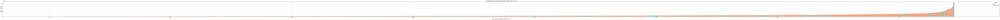

  0: ACS_sterile=57, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 2.02 seconds.

Fitting dispersion trend curve...
... done in 0.15 seconds.

Fitting MAP dispersions...


... done in 2.26 seconds.

Fitting LFCs...


... done in 1.79 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.39 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       8.671667       -0.270412  0.257554 -1.049922  0.293754  0.593594
HES4        7.564156        0.925709  0.570681  1.622113  0.104779  0.347643
ISG15      72.815532       -0.556804  0.338813 -1.643397  0.100301  0.339586
SDF4       29.527924       -0.143566  0.151348 -0.948585  0.342832  0.640076
UBE2J2     18.902224       -0.159519  0.183789 -0.867944  0.385425  0.677083
...              ...             ...       ...       ...       ...       ...
MT-ND4L   167.818248        0.397532  0.134863  2.947671  0.003202  0.042865
MT-ND4   1882.222922        0.267112  0.113569  2.351987  0.018673  0.132808
MT-ND5    557.635404        0.260881  0.100461  2.596853  0.009408  0.085251
MT-ND6     36.548369        0.447158  0.176370  2.535333  0.011234  0.096055
MT-CYB   1737.537183        0.066930  0.098500  0.679490  0.496827  0.763519

[6145 ro

Fitting dispersions...


... done in 1.08 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 1.42 seconds.

Fitting LFCs...


... done in 1.02 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.27 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L        8.289124       -0.079435  0.188841 -0.420644  0.674015  0.881283
ISG15       30.573004       -0.099373  0.164220 -0.605121  0.545098  0.818286
SDF4        13.149220       -0.210744  0.152176 -1.384868  0.166093  0.510861
UBE2J2      10.413682       -0.148359  0.176056 -0.842680  0.399407  0.733578
AURKAIP1    23.064134       -0.201048  0.121326 -1.657086  0.097502  0.394421
...               ...             ...       ...       ...       ...       ...
MT-ND4L     78.917254        0.278316  0.159404  1.745981  0.080814  0.367572
MT-ND4    1066.251244       -0.033304  0.103276 -0.322473  0.747095  0.909866
MT-ND5     357.557724        0.298306  0.094471  3.157641  0.001591  0.049875
MT-ND6      38.400156        0.537542  0.130725  4.112009  0.000039  0.004459
MT-CYB    1545.219559       -0.184690  0.106432 -1.735279  0.082691  0.3708

/vol/disk/miniforge3/envs/mapra_cytokines/lib/python3.11/site-packages/pydeseq2/utils.py:356: RuntimeWarning: divide by zero encountered in log
  beta_init[0] = np.log(counts / size_factors).mean()
/vol/disk/miniforge3/envs/mapra_cytokines/lib/python3.11/site-packages/pydeseq2/utils.py:356: RuntimeWarning: divide by zero encountered in log
  beta_init[0] = np.log(counts / size_factors).mean()
/vol/disk/miniforge3/envs/mapra_cytokines/lib/python3.11/site-packages/pydeseq2/utils.py:356: RuntimeWarning: divide by zero encountered in log
  beta_init[0] = np.log(counts / size_factors).mean()
/vol/disk/miniforge3/envs/mapra_cytokines/lib/python3.11/site-packages/pydeseq2/utils.py:356: RuntimeWarning: divide by zero encountered in log
  beta_init[0] = np.log(counts / size_factors).mean()


Fitting dispersions...


    ERROR in 10: Singular matrix
  SKIP 11: ACS_sterile=8, CCS=1 (need ≥3)
  SKIP 12: ACS_sterile=7, CCS=0 (need ≥3)
  2: ACS_sterile=62, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.36 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...


... done in 1.64 seconds.

Fitting LFCs...


... done in 1.16 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.31 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L        9.824410        0.232648  0.228089  1.019987  0.307735  0.573557
ISG15       36.957726       -0.317434  0.180151 -1.762045  0.078062  0.283610
TNFRSF18    12.364013       -0.331883  0.231662 -1.432620  0.151966  0.411807
SDF4        29.547451       -0.023918  0.146273 -0.163517  0.870111  0.942760
UBE2J2      11.846666       -0.072151  0.194687 -0.370598  0.710937  0.859826
...               ...             ...       ...       ...       ...       ...
MT-ND4L     75.926333        0.320120  0.158185  2.023706  0.043000  0.195166
MT-ND4     800.327021        0.044687  0.087020  0.513528  0.607582  0.800187
MT-ND5     359.795249        0.286281  0.078433  3.649986  0.000262  0.007449
MT-ND6      41.166548        0.302161  0.142574  2.119327  0.034063  0.169016
MT-CYB    1001.197120        0.031674  0.094167  0.336355  0.736603  0.8732

Fitting dispersions...


... done in 1.36 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.85 seconds.

Fitting LFCs...


... done in 1.26 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.34 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       11.816127        0.048212  0.199548  0.241604  0.809087  0.922124
ISG15       40.482909       -0.050798  0.210653 -0.241145  0.809443  0.922313
SDF4        21.949460       -0.010763  0.149355 -0.072064  0.942551  0.980044
UBE2J2      13.970137       -0.454740  0.165516 -2.747409  0.006007  0.072290
AURKAIP1    32.864253       -0.203777  0.132797 -1.534495  0.124908  0.386817
...               ...             ...       ...       ...       ...       ...
MT-ND4L    100.676009        0.236298  0.139371  1.695467  0.089987  0.326389
MT-ND4    1250.305689       -0.025629  0.108753 -0.235664  0.813694  0.924531
MT-ND5     509.473859        0.160181  0.094860  1.688601  0.091296  0.328801
MT-ND6      64.632591        0.199849  0.107161  1.864941  0.062190  0.268770
MT-CYB    1841.017502       -0.213076  0.108795 -1.958499  0.050171  0.2412

Fitting dispersions...


... done in 1.25 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.68 seconds.

Fitting LFCs...


... done in 1.27 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.32 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      10.348354        0.433888  0.206299  2.103197  0.035449       NaN
ISG15      51.340330       -0.168301  0.241401 -0.697185  0.485687  0.796342
TNFRSF4    14.101299       -0.426487  0.189778 -2.247294  0.024621       NaN
SDF4       20.707610        0.094585  0.148064  0.638816  0.522943  0.815663
UBE2J2     14.014839       -0.124977  0.167760 -0.744979  0.456284       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    79.883499        0.329560  0.148521  2.218946  0.026490  0.222180
MT-ND4   1209.800752        0.035529  0.100460  0.353662  0.723592  0.903997
MT-ND5    420.971368        0.294295  0.092448  3.183353  0.001456  0.048252
MT-ND6     58.058874        0.436051  0.124136  3.512702  0.000444  0.028378
MT-CYB   1937.729185       -0.161698  0.108591 -1.489059  0.136472  0.483752

[4640 ro

Fitting dispersions...


... done in 1.14 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.38 seconds.

Fitting LFCs...


... done in 0.98 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.27 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L        9.129314       -0.073872  0.214059 -0.345100  0.730020  0.913260
ISG15       27.560435       -0.359524  0.209906 -1.712782  0.086753  0.422136
SDF4        11.638975       -0.137649  0.180322 -0.763352  0.445254  0.789657
UBE2J2       9.090210       -0.142543  0.195770 -0.728115  0.466543  0.801835
AURKAIP1    21.010124       -0.291824  0.152467 -1.914018  0.055618  0.348364
...               ...             ...       ...       ...       ...       ...
MT-ND4L     63.677796        0.309185  0.156570  1.974749  0.048297  0.319827
MT-ND4     963.689006        0.054958  0.107688  0.510347  0.609808  0.859827
MT-ND5     278.668926        0.305993  0.105030  2.913399  0.003575  0.087365
MT-ND6      41.658278        0.656282  0.157441  4.168427  0.000031  0.004838
MT-CYB    1414.331650       -0.134274  0.116370 -1.153852  0.248561  0.6480

Fitting dispersions...


... done in 1.19 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.59 seconds.

Fitting LFCs...


... done in 1.07 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.29 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       10.114791       -0.316805  0.225482 -1.405011  0.160018       NaN
ISG15       52.391288       -0.354289  0.188386 -1.880658  0.060018  0.280549
TNFRSF18     8.905225       -0.016780  0.244216 -0.068712  0.945219       NaN
TNFRSF4     17.246543       -0.177803  0.219913 -0.808518  0.418793       NaN
SDF4        20.919562       -0.158928  0.149515 -1.062958  0.287801       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND4L     73.732417        0.556516  0.156254  3.561597  0.000369  0.016039
MT-ND4    1092.803287        0.027465  0.106754  0.257272  0.796969  0.919377
MT-ND5     407.369168        0.287699  0.102945  2.794700  0.005195  0.069115
MT-ND6      53.231317        0.473617  0.126056  3.757189  0.000172  0.010855
MT-CYB    1793.829978       -0.108566  0.115844 -0.937171  0.348670  0.6645

Fitting dispersions...


... done in 0.49 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.65 seconds.

Fitting LFCs...


... done in 0.43 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.15 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      11.557611        0.368060  0.365874  1.005976  0.314427  0.632900
AURKAIP1   11.255866        0.095929  0.214592  0.447032  0.654852  0.850118
MRPL20     10.563202       -0.105190  0.225823 -0.465807  0.641353  0.844559
SSU72      14.001574       -0.198658  0.189564 -1.047974  0.294650  0.615899
GNB1       14.584579        0.498572  0.220131  2.264891  0.023519  0.153944
...              ...             ...       ...       ...       ...       ...
MT-ND4L    43.037369        0.333789  0.152850  2.183768  0.028979  0.173957
MT-ND4    521.193870       -0.001141  0.104599 -0.010913  0.991293  0.998010
MT-ND5    162.312306        0.290489  0.107913  2.691870  0.007105  0.074457
MT-ND6     22.256863        0.285980  0.195267  1.464555  0.143042  0.426496
MT-CYB    637.117887       -0.016624  0.117520 -0.141453  0.887512  0.955538

[1783 ro

Fitting dispersions...


... done in 0.59 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.87 seconds.

Fitting LFCs...


... done in 0.57 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.17 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       47.687575       -0.298861  0.238100 -1.255190  0.209410  0.412767
ISG15      40.510993       -0.969848  0.343056 -2.827089  0.004697  0.035995
AURKAIP1   19.449375       -0.245444  0.221165 -1.109776  0.267095       NaN
MRPL20     14.763102        0.148550  0.243096  0.611078  0.541148       NaN
SSU72      18.795280       -0.084328  0.199683 -0.422312  0.672797       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    49.155341        0.388399  0.209087  1.857594  0.063227  0.190799
MT-ND4    558.915120        0.373385  0.129942  2.873472  0.004060  0.033727
MT-ND5    213.004814        0.409536  0.129367  3.165697  0.001547  0.017586
MT-ND6     18.973929        0.715405  0.268046  2.668962  0.007609       NaN
MT-CYB    724.911279       -0.032963  0.123359 -0.267213  0.789305  0.885883

[2589 ro

ACS sterile (TP1M) vs Control — 29,263 cells
condition2
ACS_sterile    14665
Control        14598



Pseudobulk samples: 318


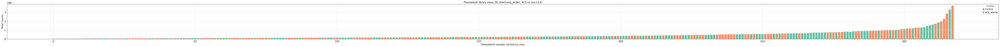

  0: ACS_sterile=16, Control=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.56 seconds.

Fitting dispersion trend curve...
... done in 0.14 seconds.

Fitting MAP dispersions...


... done in 1.64 seconds.

Fitting LFCs...


... done in 0.86 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.30 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       9.891164       -0.103390  0.173626 -0.595474  0.551527  0.797201
HES4        9.355842       -0.379646  0.437399 -0.867963  0.385415       NaN
ISG15      68.647711       -0.002032  0.242139 -0.008393  0.993304  0.998745
SDF4       32.949749        0.039197  0.108373  0.361684  0.717588  0.887443
UBE2J2     22.717038       -0.151515  0.124362 -1.218339  0.223095  0.519516
...              ...             ...       ...       ...       ...       ...
MT-ND4L   256.469963       -0.507611  0.138279 -3.670919  0.000242  0.009481
MT-ND4   2647.881666        0.035723  0.069437  0.514467  0.606925  0.828859
MT-ND5    765.543423       -0.069859  0.082562 -0.846142  0.397474  0.685487
MT-ND6     47.467659       -0.484641  0.135639 -3.573013  0.000353  0.012309
MT-CYB   2271.783019        0.213179  0.068972  3.090824  0.001996  0.038571

[62

Fitting dispersions...


... done in 0.80 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.85 seconds.

Fitting LFCs...


... done in 0.60 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.18 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L        9.524741       -0.187213  0.181541 -1.031244  0.302426       NaN
ISG15       32.838702       -0.168280  0.168818 -0.996813  0.318855  0.660883
SDF4        13.810669       -0.127253  0.153576 -0.828597  0.407333  0.738078
UBE2J2      12.363203        0.172645  0.156801  1.101046  0.270877       NaN
AURKAIP1    23.485189       -0.063868  0.119911 -0.532626  0.594293  0.858220
...               ...             ...       ...       ...       ...       ...
MT-ND4L    100.155583       -0.402440  0.151986 -2.647873  0.008100  0.093808
MT-ND4    1290.212297        0.058446  0.064544  0.905528  0.365186  0.704369
MT-ND5     431.896509        0.027800  0.082194  0.338224  0.735194  0.914003
MT-ND6      49.984456       -0.461623  0.153032 -3.016519  0.002557  0.046801
MT-CYB    1873.091925        0.099493  0.081693  1.217890  0.223266  0

Fitting dispersions...


... done in 0.39 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 0.45 seconds.

Fitting LFCs...


... done in 0.25 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...
... done in 0.11 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      16.136524        0.322742  0.510641  0.632033  0.527365       NaN
AURKAIP1   19.512676        0.129066  0.239936  0.537920  0.590633       NaN
MRPL20     15.291348       -0.376414  0.256398 -1.468086  0.142081       NaN
SSU72      14.738483       -0.071111  0.254187 -0.279760  0.779662       NaN
GNB1       29.278799       -0.186873  0.206911 -0.903161  0.366441       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    51.263778       -0.536096  0.175621 -3.052575  0.002269       NaN
MT-ND4    643.153703        0.239440  0.107137  2.234895  0.025424  0.077706
MT-ND5    215.503691       -0.006311  0.122425 -0.051553  0.958885       NaN
MT-ND6     19.196423       -0.758243  0.253781 -2.987787  0.002810       NaN
MT-CYB    706.882682        0.350023  0.127032  2.755397  0.005862  0.029076

[17

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.22 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.26 seconds.

Fitting LFCs...
... done in 0.17 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.08 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
GNB1      16.407306       -0.496354  0.391208 -1.268773  0.204522  0.803449
FAAP20     8.176513       -0.399336  0.572850 -0.697104  0.485738  0.924878
RER1       9.159633        0.045237  0.521149  0.086803  0.930828  0.988094
RPL22    135.410661       -0.286913  0.171401 -1.673922  0.094146  0.732381
PARK7     53.323575       -0.130961  0.229852 -0.569763  0.568838  0.954836
...             ...             ...       ...       ...       ...       ...
MT-ND4L   19.796235       -0.072429  0.363408 -0.199306  0.842024  0.977196
MT-ND4   275.478286        0.516784  0.169148  3.055207  0.002249  0.169128
MT-ND5   115.076489        0.299868  0.181479  1.652350  0.098463  0.732381
MT-ND6     9.170152       -0.099956  0.515944 -0.193735  0.846383  0.977196
MT-CYB   263.476395        0.462595  0.169074  2.736041  0.006218  0.292262

[1128 rows x 6 

Fitting dispersions...


... done in 0.91 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.94 seconds.

Fitting LFCs...


... done in 0.52 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       10.911835       -0.056567  0.160702 -0.352000  0.724839  0.889609
ISG15       32.914297       -0.384879  0.138277 -2.783391  0.005379  0.075627
TNFRSF18    12.983735       -0.333529  0.284206 -1.173547  0.240577  0.561866
SDF4        26.464807        0.308905  0.114189  2.705215  0.006826  0.085898
UBE2J2      11.005445       -0.074028  0.159701 -0.463542  0.642976  0.852477
...               ...             ...       ...       ...       ...       ...
MT-ND4L     80.714513       -0.452165  0.120997 -3.736983  0.000186  0.007771
MT-ND4     852.102958       -0.032015  0.050539 -0.633467  0.526428  0.782576
MT-ND5     386.218677        0.005149  0.070677  0.072858  0.941919  0.982190
MT-ND6      44.888447       -0.609633  0.174075 -3.502117  0.000462  0.015382
MT-CYB    1089.444635        0.036677  0.066200  0.554033  0.579556  0

Fitting dispersions...


... done in 0.79 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.82 seconds.

Fitting LFCs...


... done in 0.62 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       30.224847       -0.229199  0.185285 -1.237012  0.216083  0.550325
SDF4        15.894659        0.112155  0.149864  0.748378  0.454232  0.756458
UBE2J2      11.185650       -0.417328  0.168286 -2.479882  0.013143  0.146429
AURKAIP1    26.202272        0.073230  0.117570  0.622864  0.533374  0.801422
CCNL2       12.555838        0.194172  0.152564  1.272728  0.203114  0.534537
...               ...             ...       ...       ...       ...       ...
MT-ND4L     88.941504       -0.523783  0.127084 -4.121556  0.000038  0.003695
MT-ND4    1081.054502        0.020577  0.061879  0.332540  0.739482  0.905476
MT-ND5     441.520971        0.009035  0.063734  0.141755  0.887273  0.955712
MT-ND6      54.397160       -0.348398  0.131953 -2.640330  0.008283  0.114139
MT-CYB    1587.828819        0.017967  0.066365  0.270736  0.786594  0

Fitting dispersions...


... done in 0.88 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.90 seconds.

Fitting LFCs...


... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       49.082699       -0.096776  0.219512 -0.440868  0.659308  0.861620
TNFRSF4     13.260830       -0.278399  0.209971 -1.325891  0.184876  0.488081
SDF4        20.216221       -0.007197  0.117303 -0.061356  0.951076  0.985762
UBE2J2      13.240392       -0.062469  0.166504 -0.375178  0.707528  0.886377
AURKAIP1    30.467283        0.090846  0.109406  0.830356  0.406337  0.711634
...               ...             ...       ...       ...       ...       ...
MT-ND4L     97.120341       -0.520399  0.120997 -4.300942  0.000017  0.002139
MT-ND4    1378.290717        0.016921  0.058652  0.288503  0.772962  0.916190
MT-ND5     492.635897       -0.057417  0.067272 -0.853501  0.393382  0.702389
MT-ND6      68.595701       -0.501286  0.140280 -3.573466  0.000352  0.013774
MT-CYB    2217.836988        0.062598  0.071937  0.870179  0.384202  0

Fitting dispersions...


... done in 0.83 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 0.84 seconds.

Fitting LFCs...


... done in 0.48 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L        7.795700       -0.012957  0.180719 -0.071698  0.942842       NaN
ISG15       27.902163       -0.238417  0.254600 -0.936439  0.349047  0.683044
SDF4        11.012313       -0.000035  0.157140 -0.000222  0.999822  0.999822
UBE2J2       9.468205        0.160894  0.167324  0.961572  0.336265  0.673795
AURKAIP1    20.541521       -0.031025  0.120985 -0.256436  0.797614  0.927023
...               ...             ...       ...       ...       ...       ...
MT-ND4L     80.725020       -0.481532  0.128508 -3.747104  0.000179  0.010749
MT-ND4    1077.718555        0.063740  0.070637  0.902359  0.366866  0.696750
MT-ND5     316.365721       -0.019551  0.082702 -0.236404  0.813120  0.933332
MT-ND6      46.650169       -0.470189  0.174844 -2.689200  0.007162  0.106434
MT-CYB    1586.824694        0.094122  0.077531  1.213998  0.224748  0

Fitting dispersions...


... done in 0.83 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.85 seconds.

Fitting LFCs...


... done in 0.47 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.17 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       40.821933        0.027947  0.141192  0.197934  0.843097  0.946796
TNFRSF4     13.917022       -0.215829  0.206544 -1.044954  0.296044  0.602380
SDF4        18.382434        0.167798  0.132094  1.270291  0.203981  0.508890
UBE2J2      12.911597       -0.155531  0.157216 -0.989286  0.322523  0.625219
AURKAIP1    33.703653        0.202441  0.102678  1.971616  0.048653  0.269063
...               ...             ...       ...       ...       ...       ...
MT-ND4L     73.956042       -0.513802  0.148292 -3.464803  0.000531  0.022138
MT-ND4    1070.032323       -0.004239  0.066634 -0.063614  0.949278  0.981437
MT-ND5     397.431825       -0.098373  0.073017 -1.347255  0.177898  0.480955
MT-ND6      55.167448       -0.521963  0.143822 -3.629243  0.000284  0.014573
MT-CYB    1752.738518        0.122416  0.075924  1.612338  0.106888  0

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.32 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.35 seconds.

Fitting LFCs...


... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AURKAIP1   11.717103       -0.105253  0.195378 -0.538711  0.590086  0.892676
SSU72      13.059630        0.025399  0.168719  0.150542  0.880337  0.973470
GNB1       13.720053       -0.084401  0.192278 -0.438954  0.660695  0.917757
TNFRSF14   10.861411       -0.177966  0.188252 -0.945359  0.344476       NaN
RPL22     293.003179        0.037577  0.063453  0.592200  0.553717  0.875014
...              ...             ...       ...       ...       ...       ...
MT-ND4L    49.297147       -0.496168  0.166240 -2.984658  0.002839  0.098647
MT-ND4    549.147836        0.007912  0.059777  0.132354  0.894704  0.974807
MT-ND5    175.368180       -0.053614  0.085604 -0.626297  0.531120  0.860672
MT-ND6     23.953302       -0.484409  0.167135 -2.898309  0.003752  0.114524
MT-CYB    705.101409        0.128538  0.076681  1.676276  0.093684  0.506355

[12

Fitting dispersions...


... done in 0.55 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.59 seconds.

Fitting LFCs...


... done in 0.33 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       51.908458       -0.137041  0.164406 -0.833553  0.404533  0.663262
ISG15      44.224844       -0.187279  0.197849 -0.946575  0.343855  0.611057
AURKAIP1   20.870734        0.146439  0.141107  1.037785  0.299370  0.571628
MRPL20     16.756706        0.097777  0.152152  0.642626  0.520467       NaN
SSU72      21.106094        0.003503  0.145292  0.024110  0.980765  0.989696
...              ...             ...       ...       ...       ...       ...
MT-ND4L    63.904165       -0.551670  0.194941 -2.829936  0.004656  0.048728
MT-ND4    688.500196        0.033043  0.087635  0.377052  0.706135  0.870978
MT-ND5    263.359944       -0.089990  0.105313 -0.854496  0.392830  0.654432
MT-ND6     25.242168       -0.459077  0.202493 -2.267127  0.023382  0.139921
MT-CYB    845.359890        0.238268  0.087874  2.711491  0.006698  0.062576

[22

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.60 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.59 seconds.

Fitting LFCs...


... done in 0.36 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      17.671888       -0.196222  0.471935 -0.415782  0.677570  0.932151
AURKAIP1   15.694573       -0.114123  0.307331 -0.371336  0.710387  0.941685
MRPL20     14.953297       -0.004244  0.314497 -0.013495  0.989233  0.998371
SSU72      17.459188        0.249661  0.315102  0.792320  0.428174  0.843262
GNB1       22.495829       -0.253585  0.257497 -0.984809  0.324718  0.786143
...              ...             ...       ...       ...       ...       ...
MT-ND4L    55.921998       -0.952216  0.259540 -3.668867  0.000244  0.102040
MT-ND4    690.666599        0.086153  0.141354  0.609486  0.542203  0.890559
MT-ND5    219.148880       -0.181447  0.177592 -1.021709  0.306918  0.780057
MT-ND6     17.447604       -0.600406  0.312664 -1.920291  0.054821  0.556570
MT-CYB    805.861302        0.234342  0.140272  1.670627  0.094795  0.643840

[25

ACS sterile TP1M vs TP4M — 26,074 cells
timepoint
TP1M    14665
TP4M    11409

Patients: 19



Pseudobulk samples: 265


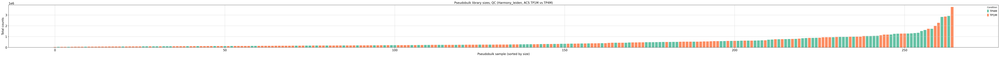

  0: 6 paired patients
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 1.06 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...


... done in 1.49 seconds.

Fitting LFCs...


... done in 1.10 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.36 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
NOC2L         15.510710       -0.228570  0.344768 -0.662967  0.507352   
HES4          11.958037       -1.402794  0.447904 -3.131910  0.001737   
ISG15        155.692783       -1.012320  0.447591 -2.261707  0.023716   
SDF4          53.024389        0.000994  0.212491  0.004679  0.996267   
UBE2J2        32.102100        0.068014  0.261528  0.260063  0.794815   
...                 ...             ...       ...       ...       ...   
MT-ND4      3490.199412        0.444327  0.126307  3.517819  0.000435   
MT-ND5      1040.040092        0.251494  0.114028  2.205546  0.027416   
MT-ND6        62.587916       -0.205403  0.200143 -1.026281  0.304759   
MT-CYB      3298.209841        0.399392  0.118085  3.382244  0.000719   
AL592183.1     9.510866        0.185286  0.454229  0.407913  0.683337   

                padj  
NOC2L       0.908448  
HES4            

Fitting dispersions...


... done in 0.72 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...


... done in 0.92 seconds.

Fitting LFCs...


... done in 0.77 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.24 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L        9.404054        0.390245  0.367819  1.060969  2.887041e-01   
ISG15       42.583274       -0.444413  0.217863 -2.039871  4.136317e-02   
SDF4        16.633548       -0.231387  0.240088 -0.963760  3.351663e-01   
UBE2J2      13.155705        0.550396  0.269447  2.042689  4.108319e-02   
AURKAIP1    26.836900       -0.128183  0.202395 -0.633332  5.265171e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L     99.049490       -0.336270  0.167180 -2.011425  4.428063e-02   
MT-ND4    1250.106898        0.415231  0.066880  6.208592  5.346151e-10   
MT-ND5     447.152010        0.308046  0.072064  4.274593  1.914870e-05   
MT-ND6      49.181986        0.043811  0.156877  0.279267  7.800399e-01   
MT-CYB    1944.648669        0.351057  0.056393  6.225212  4.809063e-10   

                  padj  
NOC2L        

Fitting dispersions...


... done in 0.58 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.80 seconds.

Fitting LFCs...


... done in 0.73 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.20 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       13.055955        0.330349  0.254165  1.299741  0.193690  0.538998
ISG15       52.257824       -0.582473  0.174595 -3.336130  0.000850  0.023006
TNFRSF18    18.751674       -0.094752  0.241006 -0.393150  0.694209  0.877242
SDF4        39.878005        0.309507  0.200119  1.546612  0.121957  0.435899
UBE2J2      16.004488       -0.209551  0.255484 -0.820213  0.412095  0.730988
...               ...             ...       ...       ...       ...       ...
MT-ND4L    110.832134       -0.417694  0.182212 -2.292348  0.021886  0.175316
MT-ND4    1072.788964        0.325383  0.095909  3.392622  0.000692  0.020963
MT-ND5     497.120039        0.274157  0.102215  2.682153  0.007315  0.090246
MT-ND6      57.591062       -0.357699  0.190145 -1.881186  0.059947  0.308628
MT-CYB    1493.900621        0.198647  0.083086  2.390863  0.016809  0.146694

[3

Fitting dispersions...


... done in 0.71 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...


... done in 1.10 seconds.

Fitting LFCs...


... done in 0.82 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.27 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      16.527937        0.066639  0.267674  0.248954  0.803396       NaN
ISG15      69.312344       -0.715082  0.319008 -2.241579  0.024989  0.243056
SDF4       30.575575        0.041587  0.209073  0.198910  0.842333  0.956777
UBE2J2     19.027517       -0.210927  0.246942 -0.854156  0.393019  0.790181
INTS11     10.956865       -0.209809  0.316066 -0.663812  0.506811       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L   148.133418       -0.275464  0.149115 -1.847333  0.064699  0.410968
MT-ND4   1728.748719        0.382128  0.091998  4.153639  0.000033  0.002475
MT-ND5    712.665798        0.432501  0.089186  4.849413  0.000001  0.000163
MT-ND6     91.839215       -0.133182  0.138558 -0.961202  0.336451  0.757756
MT-CYB   2699.735828        0.245129  0.072235  3.393486  0.000690  0.021974

[4790 rows x 6

Fitting dispersions...


... done in 0.73 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 0.95 seconds.

Fitting LFCs...


... done in 0.78 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.24 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L      13.172299        0.194844  0.279635  0.696778  4.859417e-01   
ISG15      86.661031       -0.512135  0.323246 -1.584352  1.131137e-01   
TNFRSF4    20.361519       -0.357043  0.228412 -1.563150  1.180174e-01   
SDF4       27.509872       -0.111730  0.199479 -0.560110  5.754045e-01   
UBE2J2     17.920056        0.036750  0.232360  0.158159  8.743314e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L   117.456747       -0.202641  0.124009 -1.634093  1.022394e-01   
MT-ND4   1616.543175        0.412735  0.077963  5.293993  1.196743e-07   
MT-ND5    600.543463        0.437805  0.077447  5.652975  1.576942e-08   
MT-ND6     79.643386       -0.234327  0.154184 -1.519786  1.285648e-01   
MT-CYB   2756.381502        0.325495  0.065550  4.965623  6.848086e-07   

             padj  
NOC2L         NaN  
ISG15    0

Fitting dispersions...


... done in 0.69 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.10 seconds.

Fitting LFCs...


... done in 0.72 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.22 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L        7.591759        0.333042  0.302612  1.100560  2.710883e-01   
ISG15       24.721916       -0.637510  0.224722 -2.836876  4.555730e-03   
SDF4        10.432666       -0.124523  0.274954 -0.452888  6.506295e-01   
UBE2J2       8.936080        0.238149  0.281232  0.846806  3.971031e-01   
AURKAIP1    19.542636       -0.221704  0.252744 -0.877189  3.803842e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L     71.587106       -0.025914  0.137666 -0.188235  8.506921e-01   
MT-ND4     959.907907        0.446089  0.070716  6.308145  2.823997e-10   
MT-ND5     285.250964        0.447937  0.098159  4.563378  5.033697e-06   
MT-ND6      43.494162       -0.027509  0.144826 -0.189945  8.493526e-01   
MT-CYB    1479.436186        0.374957  0.084129  4.456921  8.314509e-06   

                  padj  
NOC2L        

Fitting dispersions...


... done in 0.80 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...


... done in 1.09 seconds.

Fitting LFCs...


... done in 0.94 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.27 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       11.723028       -0.379892  0.368489 -1.030944  0.302567       NaN
ISG15       79.069506       -0.463195  0.181088 -2.557849  0.010532  0.143928
TNFRSF18    14.331467       -0.059589  0.283585 -0.210128  0.833568       NaN
TNFRSF4     23.444126       -0.359731  0.207774 -1.731356  0.083388       NaN
SDF4        27.886873        0.028097  0.182705  0.153782  0.877781  0.969431
...               ...             ...       ...       ...       ...       ...
MT-ND4L    104.218861       -0.375509  0.173478 -2.164588  0.030419  0.248504
MT-ND4    1480.477074        0.371936  0.080059  4.645771  0.000003  0.000346
MT-ND5     546.224001        0.353878  0.088280  4.008601  0.000061  0.003386
MT-ND6      78.471836       -0.150775  0.124533 -1.210720  0.226003  0.633591
MT-CYB    2609.651315        0.316191  0.067824  4.661929  0.000003  0.000338

[4

Fitting dispersions...


... done in 0.21 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...


... done in 0.27 seconds.

Fitting LFCs...
... done in 0.20 seconds.



Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      16.197610       -0.025642  0.444705 -0.057662  0.954018       NaN
SSU72      13.035451        0.121210  0.402103  0.301440  0.763079       NaN
GNB1       13.162800        0.354385  0.397353  0.891864  0.372466       NaN
TNFRSF14   10.030128       -0.129786  0.498596 -0.260303  0.794630       NaN
RPL22     315.814923       -0.063205  0.108636 -0.581807  0.560697  0.957149
...              ...             ...       ...       ...       ...       ...
MT-ND4L    46.420643       -0.333636  0.246632 -1.352768  0.176130  0.776503
MT-ND4    492.376951        0.256605  0.120477  2.129918  0.033178  0.354667
MT-ND5    156.018753        0.368844  0.140579  2.623759  0.008697  0.202496
MT-ND6     22.230916       -0.169028  0.306014 -0.552352  0.580707       NaN
MT-CYB    639.281083        0.467885  0.100608  4.650559  0.000003  0.000420

[1108 rows x 6

Fitting dispersions...


... done in 0.28 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.36 seconds.

Fitting LFCs...


... done in 0.28 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       50.182012       -0.446158  0.248347 -1.796510  0.072413  0.433598
ISG15      57.608999       -0.394211  0.512257 -0.769558  0.441562  0.871226
AURKAIP1   19.479487        0.212881  0.381070  0.558641  0.576407       NaN
MRPL20     15.618154        0.322446  0.447889  0.719924  0.471572       NaN
SSU72      20.341408       -0.017804  0.367242 -0.048480  0.961334       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    52.078350       -0.522760  0.242347 -2.157076  0.031000  0.285594
MT-ND4    618.240840        0.441574  0.113700  3.883692  0.000103  0.003633
MT-ND5    234.883396        0.257260  0.136226  1.888471  0.058963  0.382553
MT-ND6     20.929825       -0.115144  0.371868 -0.309636  0.756838       NaN
MT-CYB    848.709679        0.199818  0.104192  1.917787  0.055138  0.368332

[1681 rows x 6

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.43 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 0.53 seconds.

Fitting LFCs...


... done in 0.45 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.15 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      35.678538       -0.802374  0.474500 -1.690988  0.090839  0.724411
SDF4        8.596157        0.170526  0.591832  0.288131  0.773246       NaN
AURKAIP1   21.288441       -0.207373  0.400916 -0.517249  0.604982       NaN
MRPL20     21.460469        0.076127  0.398612  0.190979  0.848542       NaN
SSU72      26.051780       -0.160221  0.362653 -0.441802  0.658633  0.992721
...              ...             ...       ...       ...       ...       ...
MT-ND4L    58.746300       -0.559951  0.295699 -1.893649  0.058272  0.708698
MT-ND4    735.664948        0.486230  0.213512  2.277294  0.022769  0.475612
MT-ND5    233.358441        0.511160  0.227333  2.248508  0.024544  0.490876
MT-ND6     17.353975        0.063579  0.435605  0.145956  0.883956       NaN
MT-CYB    921.608367        0.727531  0.198878  3.658179  0.000254  0.025322

[2610 rows x 6

ACS sterile (TP1M) vs CCS -- 26,585 cells
condition
ACS_sterile    14665
CCS            11920



Pseudobulk samples: 302


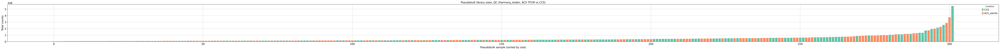

  0: ACS_sterile=16, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.28 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.37 seconds.

Fitting LFCs...


... done in 0.74 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.26 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       68.708259       -0.017579  0.239134 -0.073509  9.414008e-01   
SDF4        34.703989       -0.097510  0.098277 -0.992195  3.211022e-01   
UBE2J2      23.859804       -0.298569  0.120068 -2.486672  1.289443e-02   
INTS11      13.188790       -0.286751  0.140870 -2.035565  4.179410e-02   
AURKAIP1    75.980664       -0.222576  0.075099 -2.963761  3.039041e-03   
...               ...             ...       ...       ...           ...   
MT-ND4L    183.599371        0.390242  0.117180  3.330274  8.676053e-04   
MT-ND4    2271.478452        0.470791  0.056883  8.276511  1.268370e-16   
MT-ND5     657.725869        0.344665  0.077753  4.432798  9.301798e-06   
MT-ND6      36.953406        0.190816  0.116889  1.632460  1.025826e-01   
MT-CYB    2177.088828        0.296745  0.063719  4.657063  3.207529e-06   

                  padj  
ISG15  

Fitting dispersions...


... done in 0.80 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.83 seconds.

Fitting LFCs...


... done in 0.82 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L        8.887668       -0.165249  0.191334 -0.863667  0.387771  0.709752
ISG15       29.232792       -0.027238  0.152957 -0.178074  0.858665  0.952573
SDF4        13.569770       -0.157059  0.145081 -1.082557  0.279005  0.622481
UBE2J2      11.910948        0.110777  0.164098  0.675066  0.499634  0.781847
AURKAIP1    24.286168       -0.215990  0.128941 -1.675108  0.093913  0.379110
...               ...             ...       ...       ...       ...       ...
MT-ND4L     76.167771        0.216615  0.139058  1.557729  0.119297  0.424328
MT-ND4    1179.744696        0.202522  0.067415  3.004115  0.002664  0.042748
MT-ND5     370.251173        0.363987  0.083384  4.365181  0.000013  0.000880
MT-ND6      34.441349        0.389920  0.117679  3.313415  0.000922  0.022161
MT-CYB    1810.815471        0.080985  0.080745  1.002975  0.315873  0.6488

Fitting dispersions...


... done in 0.49 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.53 seconds.

Fitting LFCs...


... done in 0.31 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.12 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      22.202237       -0.380528  0.465435 -0.817575  0.413600  0.843246
AURKAIP1   23.031426       -0.018732  0.242346 -0.077296  0.938388  0.989183
MRPL20     16.259857       -0.073942  0.241520 -0.306151  0.759490  0.942327
SSU72      19.593170       -0.574057  0.209967 -2.734032  0.006256  0.203641
GNB1       31.323783        0.081489  0.191515  0.425497  0.670475  0.927366
...              ...             ...       ...       ...       ...       ...
MT-ND4L    48.341117        0.189577  0.210186  0.901947  0.367085  0.834696
MT-ND4    712.291084        0.420538  0.126231  3.331494  0.000864  0.076061
MT-ND5    223.744848        0.452913  0.139227  3.253052  0.001142  0.092994
MT-ND6     16.336040        0.358440  0.286282  1.252051  0.210551  0.725134
MT-CYB    843.755100        0.187906  0.106459  1.765057  0.077554  0.504133

[2178 ro

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.93 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.96 seconds.

Fitting LFCs...


... done in 0.52 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.21 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       10.506840        0.128368  0.169766  0.756149  0.449560  0.645255
ISG15       34.777105       -0.336172  0.138061 -2.434941  0.014894  0.068370
TNFRSF18    12.475852       -0.036494  0.255558 -0.142800  0.886448  0.940410
SDF4        31.534916        0.021495  0.117833  0.182417  0.855255  0.923337
UBE2J2      11.772095       -0.041415  0.161963 -0.255708  0.798176  0.891714
...               ...             ...       ...       ...       ...       ...
MT-ND4L     70.152629        0.068329  0.119359  0.572469  0.567004  0.735519
MT-ND4     838.991536        0.176531  0.059646  2.959650  0.003080  0.023068
MT-ND5     369.627678        0.307602  0.065613  4.688145  0.000003  0.000111
MT-ND6      36.347017        0.009137  0.127911  0.071429  0.943056  0.969598
MT-CYB    1096.330402        0.190758  0.073788  2.585219  0.009732  0.0518

Fitting dispersions...


... done in 0.79 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.85 seconds.

Fitting LFCs...


... done in 0.61 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.18 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       27.628825       -0.042555  0.155780 -0.273173  0.784720  0.895789
SDF4        16.812729       -0.092808  0.148582 -0.624620  0.532220  0.740303
UBE2J2      10.905298       -0.505997  0.158532 -3.191765  0.001414  0.015376
AURKAIP1    26.671297       -0.133704  0.116747 -1.145253  0.252104  0.484778
CCNL2       12.500209        0.287667  0.154989  1.856047  0.063447  0.206324
...               ...             ...       ...       ...       ...       ...
MT-ND4L     69.533527        0.153783  0.119239  1.289696  0.197156  0.425644
MT-ND4    1000.438118        0.220553  0.064510  3.418914  0.000629  0.008608
MT-ND5     393.953660        0.339335  0.083110  4.082979  0.000044  0.001324
MT-ND6      44.923899        0.142047  0.091395  1.554217  0.120133  0.313010
MT-CYB    1550.673237        0.049800  0.059413  0.838209  0.401913  0.6330

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.85 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 0.87 seconds.

Fitting LFCs...


... done in 0.47 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       42.603471       -0.030308  0.226898 -0.133575  8.937384e-01   
TNFRSF4     12.725680       -0.383894  0.190296 -2.017359  4.365805e-02   
SDF4        18.233633       -0.031014  0.124847 -0.248419  8.038100e-01   
UBE2J2      12.014403       -0.119793  0.147495 -0.812188  4.166836e-01   
AURKAIP1    30.761059       -0.159714  0.107762 -1.482096  1.383149e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L     65.611805        0.239070  0.100819  2.371272  1.772699e-02   
MT-ND4    1148.612340        0.233854  0.064688  3.615126  3.002021e-04   
MT-ND5     378.020917        0.421739  0.068301  6.174679  6.629819e-10   
MT-ND6      45.995945        0.293345  0.114951  2.551901  1.071370e-02   
MT-CYB    1966.712304        0.091966  0.079985  1.149787  2.502318e-01   

                  padj  
ISG15  

Fitting dispersions...


... done in 0.74 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.76 seconds.

Fitting LFCs...


... done in 0.42 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.17 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       27.793757       -0.191347  0.177847 -1.075911  2.819670e-01   
SDF4        12.256044       -0.110315  0.153698 -0.717736  4.729200e-01   
UBE2J2       9.831797        0.114916  0.166023  0.692171  4.888302e-01   
AURKAIP1    23.330504       -0.148958  0.114879 -1.296657  1.947494e-01   
CCNL2       11.346361       -0.019730  0.169781 -0.116210  9.074859e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L     62.638255        0.370469  0.105449  3.513243  4.426722e-04   
MT-ND4    1083.512285        0.235551  0.065405  3.601401  3.165066e-04   
MT-ND5     291.265554        0.419351  0.084082  4.987382  6.120285e-07   
MT-ND6      37.082656        0.394103  0.123967  3.179099  1.477335e-03   
MT-CYB    1679.327665        0.117259  0.078426  1.495161  1.348725e-01   

              padj  
ISG15     0

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.84 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.85 seconds.

Fitting LFCs...


... done in 0.46 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      10.319843       -0.215582  0.180664 -1.193275  0.232762       NaN
ISG15      50.497412       -0.193698  0.177338 -1.092255  0.274721  0.557088
TNFRSF4    15.495463       -0.215557  0.199701 -1.079399  0.280410  0.561760
SDF4       20.721237       -0.013434  0.121639 -0.110443  0.912058  0.966756
UBE2J2     13.864025       -0.091427  0.145638 -0.627770  0.530154  0.762827
...              ...             ...       ...       ...       ...       ...
MT-ND4L    61.305384        0.244773  0.120076  2.038479  0.041502  0.204685
MT-ND4   1098.090560        0.217447  0.063590  3.419500  0.000627  0.015747
MT-ND5    383.827600        0.310042  0.070248  4.413539  0.000010  0.000893
MT-ND6     44.489035        0.377288  0.104723  3.602740  0.000315  0.010299
MT-CYB   1920.342075        0.159626  0.073879  2.160634  0.030724  0.170897

[3239 ro

Fitting dispersions...


... done in 0.26 seconds.

Fitting dispersion trend curve...
... done in 0.02 seconds.

Fitting MAP dispersions...


... done in 0.28 seconds.

Fitting LFCs...
... done in 0.15 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.08 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     13.327886       -0.153728  0.164757 -0.933062  0.350788  0.697245
RPL22    287.847112        0.018347  0.067537  0.271651  0.785890  0.931146
PARK7     20.643952        0.122647  0.134662  0.910777  0.362413  0.711567
RERE      12.479475       -0.445179  0.194035 -2.294330  0.021772  0.181304
ENO1      15.946623       -0.231868  0.175924 -1.318007  0.187501  0.527998
...             ...             ...       ...       ...       ...       ...
MT-ND4L   36.820616        0.165707  0.156608  1.058097  0.290011  0.649716
MT-ND4   514.404889        0.122128  0.065886  1.853625  0.063793  0.301521
MT-ND5   149.974284        0.287324  0.092405  3.109405  0.001875  0.046434
MT-ND6    18.975650        0.068881  0.203156  0.339056  0.734567  0.918746
MT-CYB   675.746316        0.188022  0.086900  2.163648  0.030491  0.213075

[966 rows x 6 column

Fitting dispersions...


... done in 0.61 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.63 seconds.

Fitting LFCs...


... done in 0.51 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.13 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
HES4       54.066003       -0.049710  0.172615 -0.287983  7.733599e-01   
ISG15      45.894490       -0.099436  0.244844 -0.406121  6.846535e-01   
SDF4       10.208539        0.063293  0.193585  0.326950  7.437060e-01   
AURKAIP1   24.176775       -0.077894  0.148597 -0.524199  6.001402e-01   
MRPL20     17.124340        0.206432  0.176582  1.169041  2.423871e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    52.637504        0.170086  0.150266  1.131899  2.576768e-01   
MT-ND4    665.616490        0.405899  0.082277  4.933324  8.084203e-07   
MT-ND5    246.247159        0.360464  0.096928  3.718883  2.001055e-04   
MT-ND6     19.797805        0.405324  0.158738  2.553417  1.066717e-02   
MT-CYB    936.172039        0.201081  0.096153  2.091258  3.650495e-02   

              padj  
HES4      0.886311  
IS

ACS sterile (TP2M) vs CCS -- 31,631 cells
condition
ACS_sterile    19711
CCS            11920



Pseudobulk samples: 342


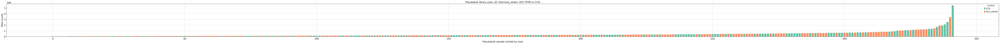

  0: ACS_sterile=19, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.21 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 1.27 seconds.

Fitting LFCs...


... done in 0.68 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.26 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       61.897400        0.121234  0.309454  0.391768  0.695230  0.828884
SDF4        30.891854       -0.097773  0.099334 -0.984283  0.324976  0.538814
UBE2J2      19.252595       -0.394320  0.119271 -3.306080  0.000946  0.010247
INTS11      11.905748       -0.207736  0.155930 -1.332240  0.182781  0.384029
AURKAIP1    63.179822       -0.337974  0.085329 -3.960818  0.000075  0.001438
...               ...             ...       ...       ...       ...       ...
MT-ND4L    160.141341        0.422843  0.088536  4.775949  0.000002  0.000071
MT-ND4    1832.498670        0.289596  0.071685  4.039814  0.000053  0.001088
MT-ND5     552.178797        0.277161  0.072778  3.808302  0.000140  0.002416
MT-ND6      37.329214        0.582097  0.129252  4.503587  0.000007  0.000216
MT-CYB    1676.586657       -0.005650  0.068183 -0.082870  0.933955  0.9670

Fitting dispersions...


... done in 0.90 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 0.90 seconds.

Fitting LFCs...


... done in 0.67 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       28.645847        0.043509  0.146189  0.297620  7.659933e-01   
SDF4        13.275290       -0.119500  0.136670 -0.874373  3.819152e-01   
UBE2J2      10.487340       -0.015624  0.161928 -0.096490  9.231318e-01   
AURKAIP1    24.095564       -0.189954  0.118462 -1.603500  1.088242e-01   
CCNL2       13.459902        0.010242  0.154296  0.066380  9.470754e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L     73.837585        0.174073  0.098799  1.761892  7.808748e-02   
MT-ND4    1049.922516       -0.043051  0.094071 -0.457646  6.472068e-01   
MT-ND5     347.470802        0.253517  0.069906  3.626563  2.872190e-04   
MT-ND6      37.281271        0.667493  0.102240  6.528674  6.635447e-11   
MT-CYB    1537.102168       -0.302498  0.101579 -2.977966  2.901683e-03   

                  padj  
ISG15  

Fitting dispersions...


... done in 0.48 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.54 seconds.

Fitting LFCs...


... done in 0.31 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      20.805646       -0.327856  0.267669 -1.224855  0.220630  0.637477
AURKAIP1   20.099227       -0.110581  0.280250 -0.394581  0.693152  0.912265
MRPL20     16.805449        0.174120  0.259866  0.670037  0.502834  0.839829
SSU72      19.917860       -0.292018  0.217420 -1.343104  0.179238  0.597285
GNB1       27.825204        0.018914  0.192394  0.098308  0.921687  0.984690
...              ...             ...       ...       ...       ...       ...
MT-ND4L    48.889393        0.367709  0.182192  2.018250  0.043565  0.339079
MT-ND4    585.254198        0.178864  0.154792  1.155516  0.247879  0.663489
MT-ND5    197.688745        0.353262  0.137438  2.570330  0.010160  0.195815
MT-ND6     16.723678        0.605829  0.252803  2.396452  0.016555  0.233539
MT-CYB    672.488820       -0.129754  0.136094 -0.953415  0.340380  0.735705

[2228 ro

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 1.02 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.04 seconds.

Fitting LFCs...


... done in 0.55 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.21 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       10.723921       -0.101766  0.173011 -0.588208  0.556393  0.736809
ISG15       41.084599       -0.175705  0.122578 -1.433419  0.151738  0.345300
TNFRSF18    13.096615       -0.307044  0.284560 -1.079014  0.280581  0.506474
SDF4        33.078114       -0.147734  0.101446 -1.456277  0.145316  0.338263
UBE2J2      13.128063        0.052991  0.145354  0.364564  0.715437  0.850030
...               ...             ...       ...       ...       ...       ...
MT-ND4L     82.103794        0.185679  0.085580  2.169662  0.030032  0.121314
MT-ND4     879.511128        0.009877  0.090389  0.109274  0.912985  0.956172
MT-ND5     387.395374        0.122538  0.064693  1.894146  0.058206  0.188332
MT-ND6      45.851214        0.252177  0.099230  2.541345  0.011043  0.060866
MT-CYB    1061.437783       -0.193192  0.087143 -2.216948  0.026627  0.1123

Fitting dispersions...


... done in 1.26 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...


... done in 1.28 seconds.

Fitting LFCs...


... done in 1.02 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.25 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      12.270870       -0.059867  0.149161 -0.401356  0.688158  0.827163
ISG15      38.853764       -0.088828  0.137248 -0.647207  0.517498  0.704748
SDF4       25.003773        0.042835  0.106594  0.401856  0.687790  0.827163
UBE2J2     16.294252       -0.390162  0.127400 -3.062499  0.002195  0.017449
INTS11      8.536591       -0.257190  0.171839 -1.496691  0.134474  0.311991
...              ...             ...       ...       ...       ...       ...
MT-ND4L   102.861941        0.218272  0.071571  3.049743  0.002290  0.017967
MT-ND4   1316.962003       -0.002119  0.094086 -0.022526  0.982028  0.990484
MT-ND5    527.801841        0.163912  0.072272  2.267995  0.023330  0.093991
MT-ND6     67.918019        0.261299  0.089353  2.924363  0.003452  0.024083
MT-CYB   1932.666359       -0.328181  0.095234 -3.446048  0.000569  0.006308

[4746 ro

Fitting dispersions...


... done in 0.91 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.98 seconds.

Fitting LFCs...


... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       40.982773       -0.173980  0.212247 -0.819703  4.123853e-01   
TNFRSF4     13.242653       -0.366335  0.168305 -2.176613  2.950946e-02   
SDF4        18.819678        0.009282  0.117591  0.078932  9.370871e-01   
UBE2J2      13.407775        0.100354  0.138059  0.726892  4.672920e-01   
AURKAIP1    30.951582       -0.169210  0.101194 -1.672141  9.449649e-02   
...               ...             ...       ...       ...           ...   
MT-ND4L     68.165803        0.201875  0.084425  2.391170  1.679476e-02   
MT-ND4    1081.367214       -0.000200  0.083501 -0.002396  9.980881e-01   
MT-ND5     367.771177        0.269911  0.067953  3.972022  7.126509e-05   
MT-ND6      52.519348        0.527102  0.087216  6.043665  1.506519e-09   
MT-CYB    1737.316520       -0.324791  0.101911 -3.187006  1.437537e-03   

                  padj  
ISG15  

Fitting dispersions...


... done in 0.77 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 0.77 seconds.

Fitting LFCs...


... done in 0.41 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L        9.085517        0.024088  0.176030  0.136839  8.911584e-01   
ISG15       23.682683       -0.362797  0.150873 -2.404651  1.618793e-02   
SDF4        11.631734       -0.046571  0.152528 -0.305329  7.601158e-01   
UBE2J2       8.673338       -0.015114  0.161268 -0.093719  9.253323e-01   
AURKAIP1    20.612020       -0.227120  0.117214 -1.937648  5.266615e-02   
...               ...             ...       ...       ...           ...   
MT-ND4L     55.345828        0.262090  0.107346  2.441531  1.462515e-02   
MT-ND4     891.143398       -0.038018  0.093557 -0.406364  6.844753e-01   
MT-ND5     256.232846        0.320768  0.076256  4.206486  2.593726e-05   
MT-ND6      39.299901        0.742001  0.099061  7.490385  6.867205e-14   
MT-CYB    1313.244632       -0.306666  0.105334 -2.911363  3.598560e-03   

                  padj  
NOC2L  

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.85 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 0.88 seconds.

Fitting LFCs...


... done in 0.81 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L       9.659532       -0.329314  0.170634 -1.929938  5.361451e-02   
ISG15      45.076087       -0.290649  0.158090 -1.838511  6.598711e-02   
TNFRSF4    14.424780       -0.218562  0.186216 -1.173703  2.405141e-01   
SDF4       18.335812       -0.129108  0.118734 -1.087372  2.768724e-01   
UBE2J2     12.581336       -0.158188  0.143382 -1.103260  2.699144e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    61.104435        0.326747  0.103243  3.164819  1.551792e-03   
MT-ND4    943.418024       -0.006392  0.092531 -0.069079  9.449268e-01   
MT-ND5    356.715270        0.277725  0.077257  3.594832  3.246005e-04   
MT-ND6     45.361379        0.541946  0.094263  5.749301  8.961318e-09   
MT-CYB   1534.977597       -0.269282  0.099522 -2.705762  6.814780e-03   

             padj  
NOC2L    0.224136  
ISG1

Fitting dispersions...


... done in 0.38 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.39 seconds.

Fitting LFCs...


... done in 0.22 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AURKAIP1   11.644412       -0.084887  0.190599 -0.445367  0.656054  0.800533
MRPL20     10.777781        0.192580  0.174343  1.104602  0.269332  0.501345
SSU72      14.889839       -0.092053  0.142152 -0.647563  0.517268  0.714441
GNB1       14.359861        0.153496  0.157225  0.976284  0.328924  0.561616
TNFRSF14   11.920973       -0.273402  0.169721 -1.610892  0.107203  0.288033
...              ...             ...       ...       ...       ...       ...
MT-ND4L    41.645626        0.273141  0.107743  2.535124  0.011241  0.064753
MT-ND4    534.840696        0.014612  0.087763  0.166495  0.867767  0.937922
MT-ND5    166.645537        0.303965  0.086159  3.527955  0.000419  0.005626
MT-ND6     23.824696        0.370961  0.155522  2.385273  0.017066  0.086795
MT-CYB    634.544364       -0.183921  0.100626 -1.827767  0.067585  0.217099

[1424 ro

Fitting dispersions...


... done in 0.60 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.64 seconds.

Fitting LFCs...


... done in 0.34 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       49.801185       -0.004278  0.192112 -0.022271  0.982232  0.990130
ISG15      37.881371       -0.288164  0.232072 -1.241701  0.214347  0.431133
SDF4        9.039219       -0.027533  0.210689 -0.130680  0.896029  0.939824
AURKAIP1   20.664860       -0.335997  0.153478 -2.189209  0.028582  0.119076
MRPL20     15.386321        0.165706  0.175746  0.942870  0.345747  0.568090
...              ...             ...       ...       ...       ...       ...
MT-ND4L    52.747003        0.380269  0.119087  3.193191  0.001407  0.014378
MT-ND4    587.549284        0.327059  0.098658  3.315066  0.000916  0.010414
MT-ND5    225.020935        0.371824  0.083531  4.451345  0.000009  0.000328
MT-ND6     20.661426        0.796322  0.179369  4.439567  0.000009  0.000335
MT-CYB    735.645717       -0.139639  0.077066 -1.811947  0.069994  0.215688

[2382 ro

ACS sterile (TP3M) vs CCS -- 23,191 cells
condition
CCS            11920
ACS_sterile    11271



Pseudobulk samples: 282


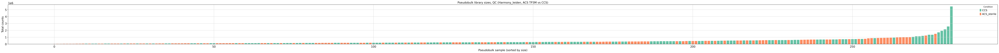

  0: ACS_sterile=13, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 1.17 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 1.22 seconds.

Fitting LFCs...


... done in 0.67 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.25 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       61.166246        0.423112  0.263530  1.605553  0.108372  0.393632
SDF4        26.247824       -0.144311  0.118540 -1.217407  0.223449  0.539082
UBE2J2      17.897217       -0.197662  0.143800 -1.374563  0.169267  0.477916
INTS11      10.248666       -0.340774  0.192457 -1.770652  0.076619       NaN
AURKAIP1    55.783014       -0.283654  0.099552 -2.849301  0.004382  0.073453
...               ...             ...       ...       ...       ...       ...
MT-ND4L    128.121632        0.220356  0.141210  1.560482  0.118646  0.404857
MT-ND4    1448.191696        0.009291  0.092144  0.100828  0.919687  0.967054
MT-ND5     438.371665        0.002896  0.103138  0.028084  0.977595  0.989679
MT-ND6      30.169116        0.404268  0.159707  2.531303  0.011364  0.125503
MT-CYB    1453.782900       -0.065160  0.082609 -0.788771  0.430246  0.7333

Fitting dispersions...


... done in 0.98 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 0.81 seconds.

Fitting LFCs...


... done in 0.45 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.18 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L        9.859059       -0.035204  0.167412 -0.210283  0.833447       NaN
ISG15       30.863230        0.031326  0.158761  0.197316  0.843580  0.929889
SDF4        14.218144       -0.227168  0.143874 -1.578936  0.114351  0.328947
UBE2J2      10.648313       -0.282599  0.171483 -1.647975  0.099358  0.306309
AURKAIP1    25.946090       -0.202743  0.124129 -1.633328  0.102400  0.310699
...               ...             ...       ...       ...       ...       ...
MT-ND4L     79.372754        0.176000  0.157510  1.117390  0.263828  0.529828
MT-ND4    1123.150732       -0.049001  0.093974 -0.521434  0.602064  0.809910
MT-ND5     352.723097        0.125189  0.108496  1.153861  0.248557  0.514692
MT-ND6      34.774592        0.425684  0.115100  3.698381  0.000217  0.005764
MT-CYB    1662.506483       -0.296530  0.098254 -3.017984  0.002545  0.0317

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.82 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.83 seconds.

Fitting LFCs...


... done in 0.46 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.18 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      33.411292       -0.049917  0.175891 -0.283798  0.776565  0.908864
TNFRSF18   11.252030       -0.126049  0.294709 -0.427708  0.668864  0.848387
SDF4       27.445853       -0.159602  0.127374 -1.253017  0.210200  0.471306
UBE2J2     10.560350       -0.048719  0.167292 -0.291223  0.770881       NaN
AURKAIP1   25.941439       -0.299093  0.125585 -2.381591  0.017238  0.111311
...              ...             ...       ...       ...       ...       ...
MT-ND4L    63.007934        0.152231  0.148593  1.024481  0.305608  0.578762
MT-ND4    699.555418        0.000020  0.079063  0.000255  0.999796  0.999796
MT-ND5    303.007527        0.082005  0.079519  1.031260  0.302419  0.577760
MT-ND6     34.406648        0.198320  0.114512  1.731877  0.083295  0.272391
MT-CYB    870.837642       -0.127665  0.093954 -1.358806  0.174208  0.426893

[3165 ro

Fitting dispersions...


... done in 0.92 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 1.05 seconds.

Fitting LFCs...


... done in 0.57 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.20 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L        9.900108        0.059386  0.180008  0.329906  0.741471  0.876604
ISG15       32.131244        0.153389  0.190680  0.804430  0.421149  0.688879
SDF4        16.926257       -0.260505  0.136733 -1.905215  0.056752  0.232088
UBE2J2      12.494336       -0.395638  0.148998 -2.655323  0.007923  0.077565
AURKAIP1    26.884238       -0.357562  0.123558 -2.893875  0.003805  0.049732
...               ...             ...       ...       ...       ...       ...
MT-ND4L     77.534935        0.214928  0.125690  1.709993  0.087267  0.301174
MT-ND4     993.943501       -0.031879  0.079043 -0.403318  0.686714  0.849197
MT-ND5     398.648313        0.140285  0.094711  1.481199  0.138554  0.386158
MT-ND6      49.920658        0.193431  0.101093  1.913408  0.055696  0.229672
MT-CYB    1530.323039       -0.240149  0.083124 -2.889042  0.003864  0.0500

Fitting dispersions...


... done in 1.02 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.12 seconds.

Fitting LFCs...


... done in 0.56 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.22 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      10.484051        0.207441  0.164627  1.260063  0.207647       NaN
ISG15      47.936041        0.107052  0.192318  0.556639  0.577774  0.811013
TNFRSF4    14.982474       -0.260968  0.166594 -1.566493  0.117233  0.374042
SDF4       20.308365        0.024505  0.124273  0.197185  0.843683  0.940511
UBE2J2     13.695118       -0.077244  0.140713 -0.548949  0.583041  0.814116
...              ...             ...       ...       ...       ...       ...
MT-ND4L    72.890671        0.282739  0.154245  1.833056  0.066794  0.274393
MT-ND4   1145.090203        0.002086  0.085989  0.024258  0.980647  0.996027
MT-ND5    380.299939        0.227740  0.100343  2.269625  0.023230  0.155101
MT-ND6     49.828695        0.285462  0.099526  2.868204  0.004128  0.054772
MT-CYB   1888.391337       -0.269092  0.096521 -2.787929  0.005305  0.064862

[3964 ro

Fitting dispersions...


... done in 0.77 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.81 seconds.

Fitting LFCs...


... done in 0.43 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.18 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       10.620275        0.009177  0.175840  0.052190  0.958377  0.985421
ISG15       34.220650        0.197282  0.167335  1.178967  0.238411  0.511877
SDF4        13.196806       -0.140307  0.154438 -0.908506  0.363611  0.641641
UBE2J2       9.945748       -0.121455  0.161520 -0.751945  0.452084  0.708262
AURKAIP1    23.800383       -0.337477  0.115499 -2.921900  0.003479  0.041844
...               ...             ...       ...       ...       ...       ...
MT-ND4L     64.843365        0.255004  0.144546  1.764171  0.077703  0.279694
MT-ND4    1053.238894       -0.045753  0.090869 -0.503504  0.614610  0.823998
MT-ND5     284.617964        0.183444  0.099071  1.851643  0.064077  0.252918
MT-ND6      39.143278        0.429974  0.127897  3.361880  0.000774  0.017500
MT-CYB    1587.689076       -0.270129  0.096384 -2.802635  0.005069  0.0549

Fitting dispersions...


... done in 0.99 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.03 seconds.

Fitting LFCs...


... done in 0.52 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.21 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      10.210659       -0.332312  0.164592 -2.019008  0.043486       NaN
ISG15      50.599331       -0.214058  0.210300 -1.017869  0.308740  0.605965
TNFRSF4    18.389650        0.186287  0.183071  1.017566  0.308884  0.605965
SDF4       20.600712       -0.136558  0.123111 -1.109227  0.267332  0.563789
UBE2J2     13.777555       -0.138479  0.143615 -0.964240  0.334925  0.628706
...              ...             ...       ...       ...       ...       ...
MT-ND4L    66.891278        0.410270  0.140094  2.928538  0.003406  0.049458
MT-ND4   1038.980067        0.040236  0.093458  0.430528  0.666812  0.850900
MT-ND5    373.335141        0.203431  0.105887  1.921205  0.054706  0.242007
MT-ND6     45.591768        0.392439  0.094623  4.147392  0.000034  0.002594
MT-CYB   1732.488244       -0.167431  0.100115 -1.672386  0.094448  0.330099

[3744 ro

Fitting dispersions...


... done in 0.28 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.46 seconds.

Fitting LFCs...
... done in 0.16 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.07 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     12.761934       -0.185484  0.160892 -1.152846  0.248974  0.539528
GNB1      14.416373        0.284836  0.187990  1.515170  0.129729  0.369500
RPL22    281.827769        0.004315  0.070179  0.061492  0.950968  0.984697
PARK7     17.501597       -0.328224  0.148298 -2.213268  0.026879  0.146291
RERE      13.519026       -0.183932  0.191457 -0.960697  0.336705  0.614920
...             ...             ...       ...       ...       ...       ...
MT-ND4L   35.216380        0.139396  0.124526  1.119413  0.262964  0.552751
MT-ND4   466.967912       -0.092370  0.088911 -1.038906  0.298848  0.577274
MT-ND5   132.928092        0.021811  0.113428  0.192288  0.847517  0.935378
MT-ND6    17.786448        0.061843  0.199502  0.309988  0.756570  0.892525
MT-CYB   578.345977       -0.204971  0.103478 -1.980810  0.047613  0.211222

[1051 rows x 6 colum

Fitting dispersions...


... done in 0.59 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.62 seconds.

Fitting LFCs...


... done in 0.36 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       47.351010       -0.087452  0.282649 -0.309402  0.757016  0.912362
ISG15      37.632402       -0.326801  0.314111 -1.040402  0.298153  0.654063
AURKAIP1   21.605577       -0.108223  0.214069 -0.505551  0.613172       NaN
MRPL20     14.798632        0.257535  0.252668  1.019264  0.308078       NaN
SSU72      20.642930       -0.231758  0.229267 -1.010867  0.312080       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    46.731326        0.253282  0.206212  1.228259  0.219350  0.550344
MT-ND4    523.703421        0.209962  0.105649  1.987358  0.046883  0.231104
MT-ND5    199.083649        0.239669  0.135735  1.765708  0.077445  0.316579
MT-ND6     15.333723        0.300675  0.230974  1.301769  0.192995       NaN
MT-CYB    751.601472       -0.015586  0.120561 -0.129276  0.897139  0.971714

[2458 ro

ACS sterile (TP4M) vs CCS -- 23,329 cells
condition
CCS            11920
ACS_sterile    11409



Pseudobulk samples: 249


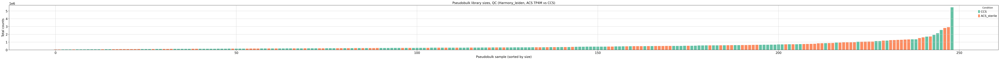

  0: ACS_sterile=9, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 1.34 seconds.

Fitting dispersion trend curve...
... done in 0.13 seconds.

Fitting MAP dispersions...


... done in 1.41 seconds.

Fitting LFCs...


... done in 0.95 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.29 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      10.230521       -0.144834  0.202240 -0.716147  0.473901  0.759478
ISG15      85.916489        1.103170  0.380139  2.902015  0.003708  0.048699
SDF4       31.408440       -0.109558  0.123554 -0.886716  0.375232  0.685318
UBE2J2     21.518314       -0.255142  0.149947 -1.701547  0.088840  0.341069
INTS11     12.405369       -0.238705  0.182630 -1.307046  0.191197  0.502287
...              ...             ...       ...       ...       ...       ...
MT-ND4L   161.235144        0.439627  0.117837  3.730809  0.000191  0.006028
MT-ND4   1741.417272        0.064710  0.091868  0.704371  0.481202  0.763747
MT-ND5    533.275219        0.092827  0.096609  0.960853  0.336626  0.651345
MT-ND6     33.705594        0.325020  0.158735  2.047559  0.040603  0.214130
MT-CYB   1720.621518       -0.090428  0.080080 -1.129220  0.258805  0.576375

[5417 ro

Fitting dispersions...


... done in 1.03 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.04 seconds.

Fitting LFCs...


... done in 0.59 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.23 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       11.510546       -0.497743  0.181180 -2.747229  0.006010  0.077810
ISG15       45.669242        0.504590  0.171867  2.935929  0.003326  0.052652
SDF4        19.534679       -0.043304  0.151821 -0.285234  0.775465  0.923792
UBE2J2      14.128824       -0.214467  0.176561 -1.214692  0.224483  0.560133
AURKAIP1    34.034471       -0.121778  0.119655 -1.017743  0.308800  0.635909
...               ...             ...       ...       ...       ...       ...
MT-ND4L    108.537787        0.444403  0.107587  4.130619  0.000036  0.002174
MT-ND4    1375.151954       -0.211489  0.073069 -2.894356  0.003799  0.058412
MT-ND5     441.130023        0.087926  0.078014  1.127062  0.259716  0.596403
MT-ND6      44.724382        0.518261  0.107306  4.829752  0.000001  0.000205
MT-CYB    2160.825193       -0.295032  0.086485 -3.411361  0.000646  0.0170

Fitting dispersions...


... done in 0.51 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.58 seconds.

Fitting LFCs...


... done in 0.36 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4        7.406227        0.229704  1.160912  0.197865  0.843150  0.999041
ISG15      43.774490        1.151177  0.517942  2.222600  0.026243  0.679962
SDF4       10.361171        0.461534  0.397231  1.161879  0.245285  0.999041
AURKAIP1   24.929013       -0.017552  0.314900 -0.055739  0.955550  0.999041
MRPL20     21.228321        0.481681  0.276415  1.742603  0.081403  0.935548
...              ...             ...       ...       ...       ...       ...
MT-ND4L    50.527962        0.186758  0.253704  0.736127  0.461654  0.999041
MT-ND4    608.046571       -0.151667  0.170430 -0.889910  0.373514  0.999041
MT-ND5    205.680052        0.144174  0.181323  0.795119  0.426544  0.999041
MT-ND6     19.809302        0.809936  0.308519  2.625243  0.008659  0.468491
MT-CYB    790.278319       -0.220609  0.132020 -1.671026  0.094717  0.935548

[2543 ro

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.95 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.00 seconds.

Fitting LFCs...


... done in 0.56 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.38 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       10.969504       -0.121026  0.187862 -0.644230  0.519426  0.743457
ISG15       48.721583        0.348400  0.163704  2.128232  0.033318  0.144246
TNFRSF18    16.068396        0.286242  0.322072  0.888753  0.374136  0.623467
SDF4        33.926777       -0.207778  0.132148 -1.572315  0.115878  0.314758
UBE2J2      13.845319        0.166334  0.162758  1.021970  0.306795  0.557215
...               ...             ...       ...       ...       ...       ...
MT-ND4L     89.083738        0.465611  0.106570  4.369051  0.000012  0.000329
MT-ND4     867.921810       -0.078502  0.076353 -1.028156  0.303877  0.553701
MT-ND5     382.477797        0.074690  0.085738  0.871141  0.383677  0.633386
MT-ND6      47.003708        0.408661  0.119908  3.408113  0.000654  0.008417
MT-CYB    1159.457322        0.018957  0.085034  0.222937  0.823585  0.9289

Fitting dispersions...


... done in 1.18 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.22 seconds.

Fitting LFCs...


... done in 0.66 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.26 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      13.576804       -0.073107  0.181426 -0.402954  0.686982       NaN
ISG15      55.619353        0.737082  0.202091  3.647280  0.000265  0.006290
SDF4       25.582414       -0.078669  0.123679 -0.636079  0.524725  0.718823
UBE2J2     18.756364       -0.237922  0.131985 -1.802638  0.071445       NaN
INTS11     10.063980       -0.020829  0.184771 -0.112729  0.910246       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L   117.939086        0.459274  0.098704  4.653021  0.000003  0.000272
MT-ND4   1379.359743       -0.135550  0.082253 -1.647959  0.099361  0.275733
MT-ND5    537.221823       -0.022308  0.096034 -0.232288  0.816314  0.917751
MT-ND6     72.544982        0.282822  0.091047  3.106313  0.001894  0.022480
MT-CYB   2231.232736       -0.208907  0.071765 -2.910977  0.003603  0.036351

[4660 ro

Fitting dispersions...


... done in 1.16 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.16 seconds.

Fitting LFCs...


... done in 0.64 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...


... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.23 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L      11.604813       -0.249888  0.173374 -1.441326  1.494926e-01   
ISG15      73.150667        0.673149  0.250791  2.684105  7.272421e-03   
TNFRSF4    21.120311        0.174558  0.153296  1.138701  2.548280e-01   
SDF4       25.263821        0.032866  0.116040  0.283233  7.769983e-01   
UBE2J2     17.568271       -0.046460  0.147579 -0.314812  7.529044e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    96.662965        0.436946  0.097763  4.469456  7.841874e-06   
MT-ND4   1388.649164       -0.184102  0.085839 -2.144746  3.197313e-02   
MT-ND5    452.521996        0.046090  0.079984  0.576245  5.644495e-01   
MT-ND6     64.976985        0.439206  0.085835  5.116847  3.106849e-07   
MT-CYB   2447.598328       -0.272875  0.089169 -3.060199  2.211901e-03   

             padj  
NOC2L         NaN  
ISG1

Fitting dispersions...


... done in 1.05 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...


... done in 1.06 seconds.

Fitting LFCs...


... done in 0.59 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.23 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      11.300033       -0.187466  0.205931 -0.910337  0.362645  0.683786
ISG15      38.698148        0.171916  0.181854  0.945354  0.344478  0.666541
SDF4       15.636793       -0.036799  0.154635 -0.237974  0.811901  0.942530
UBE2J2     12.197980        0.002608  0.164149  0.015888  0.987324  0.997534
INTS11      7.376235       -0.399848  0.228633 -1.748860  0.080315       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    81.821735        0.498175  0.105486  4.722684  0.000002  0.000219
MT-ND4   1185.309698       -0.185128  0.079620 -2.325133  0.020065  0.156781
MT-ND5    316.819809        0.050534  0.094276  0.536020  0.591945  0.836197
MT-ND6     46.911907        0.538099  0.112258  4.793391  0.000002  0.000167
MT-CYB   1880.590170       -0.272841  0.093235 -2.926374  0.003429  0.051558

[4199 ro

Fitting dispersions...


... done in 1.16 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...


... done in 1.18 seconds.

Fitting LFCs...


... done in 0.66 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.25 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L       13.439606       -0.278418  0.167636 -1.660849  9.674368e-02   
ISG15       73.425607        0.298816  0.250439  1.193170  2.328029e-01   
TNFRSF18    11.629448        0.382528  0.235472  1.624513  1.042665e-01   
TNFRSF4     23.258519        0.253647  0.210617  1.204304  2.284721e-01   
SDF4        26.116162       -0.031454  0.120351 -0.261357  7.938170e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L     83.714413        0.518759  0.112549  4.609194  4.042335e-06   
MT-ND4    1222.102083       -0.133109  0.090553 -1.469954  1.415742e-01   
MT-ND5     429.353247       -0.001372  0.094007 -0.014599  9.883524e-01   
MT-ND6      58.784805        0.559545  0.106022  5.277659  1.308449e-07   
MT-CYB    2148.150633       -0.197251  0.092481 -2.132880  3.293455e-02   

              padj  
NOC2L     0

Fitting dispersions...


... done in 0.35 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.36 seconds.

Fitting LFCs...


... done in 0.20 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      11.760623        0.682871  0.304207  2.244758  0.024784  0.138896
AURKAIP1   11.910584       -0.026256  0.190067 -0.138139  0.890130  0.956592
SSU72      15.269399       -0.188664  0.165801 -1.137894  0.255165  0.542109
GNB1       13.755772       -0.096562  0.204868 -0.471336  0.637401  0.841813
TNFRSF14   13.501360       -0.071973  0.184044 -0.391063  0.695751  0.875390
...              ...             ...       ...       ...       ...       ...
MT-ND4L    47.520131        0.472189  0.132724  3.557686  0.000374  0.008461
MT-ND4    537.401586       -0.162278  0.081450 -1.992361  0.046331  0.204585
MT-ND5    159.093411        0.093689  0.121638  0.770230  0.441163  0.714396
MT-ND6     22.426221        0.219936  0.163541  1.344832  0.178679  0.445947
MT-CYB    676.063360       -0.219343  0.097896 -2.240577  0.025053  0.139801

[1341 ro

Fitting dispersions...


... done in 0.54 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.58 seconds.

Fitting LFCs...


... done in 0.32 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       55.126837        0.326031  0.182429  1.787167  0.073910  0.350408
ISG15      54.455832        0.773861  0.338684  2.284910  0.022318  0.183898
AURKAIP1   21.216493       -0.230603  0.184318 -1.251114  0.210893  0.577679
MRPL20     13.927571       -0.059580  0.237723 -0.250628  0.802101  0.932375
SSU72      21.120778       -0.233329  0.196981 -1.184530  0.236203  0.609535
...              ...             ...       ...       ...       ...       ...
MT-ND4L    49.025449        0.298128  0.160012  1.863161  0.062440  0.322749
MT-ND4    503.518190       -0.049341  0.096656 -0.510476  0.609718  0.838110
MT-ND5    194.654145        0.049488  0.122835  0.402883  0.687034  0.874484
MT-ND6     16.775812        0.485476  0.200188  2.425104  0.015304  0.143587
MT-CYB    742.493078       -0.157733  0.121810 -1.294906  0.195353  0.552181

[2233 ro

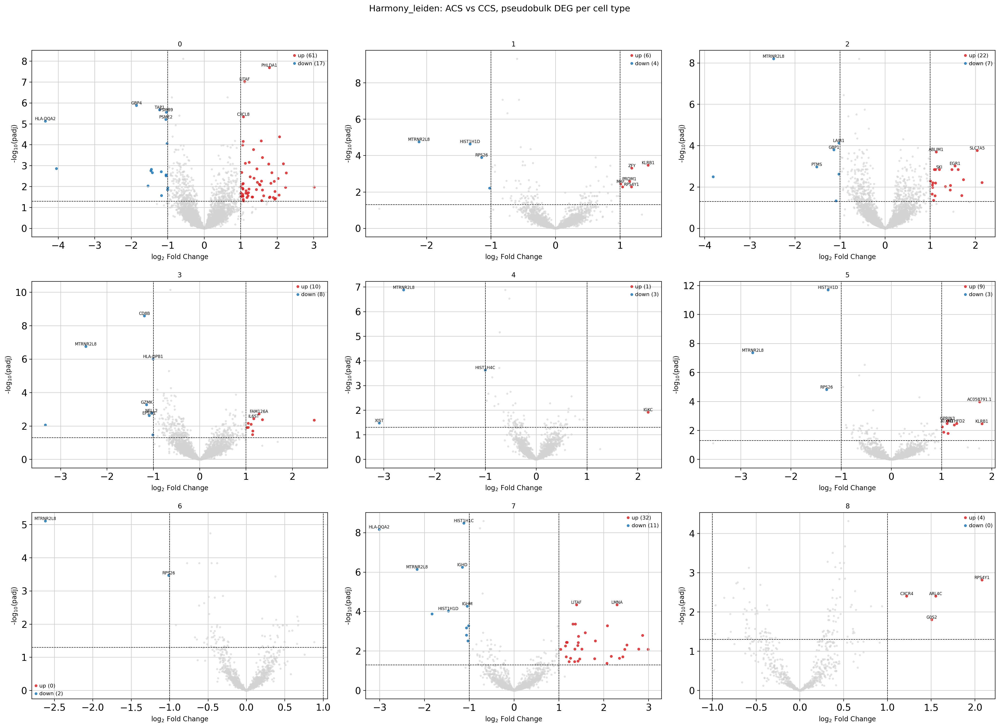

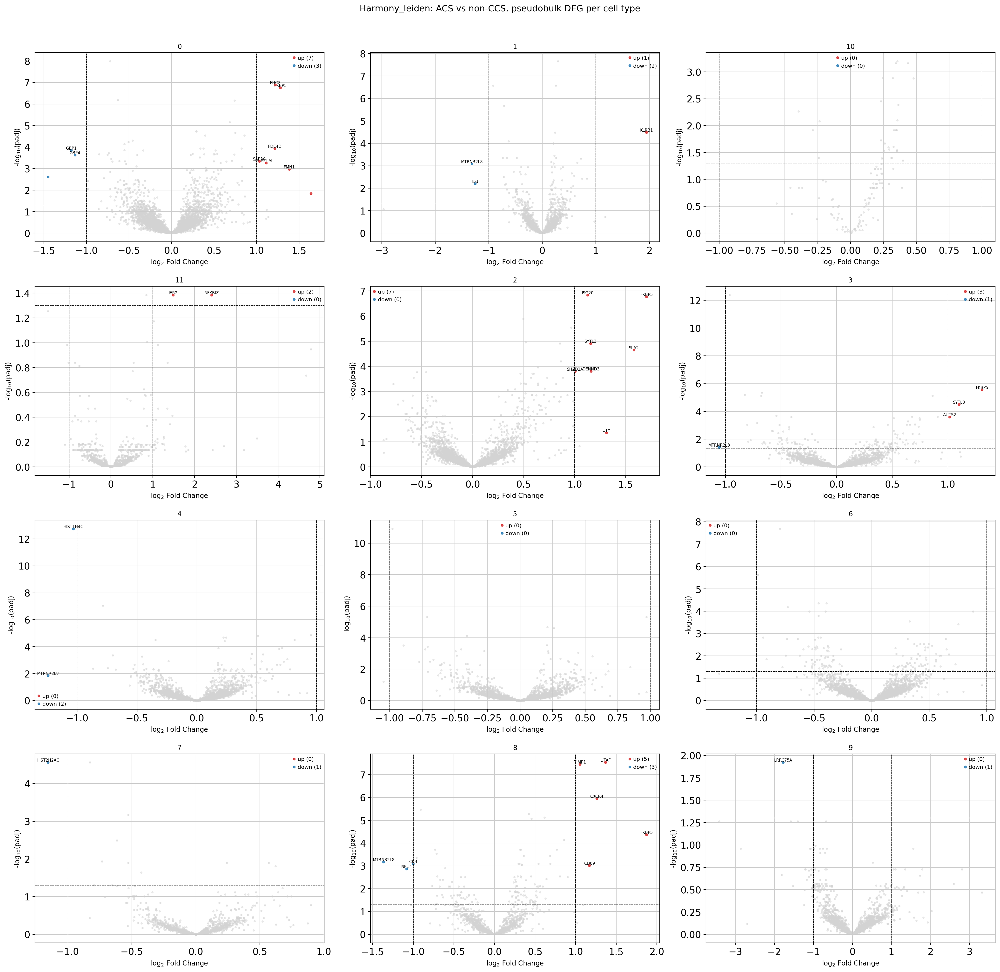

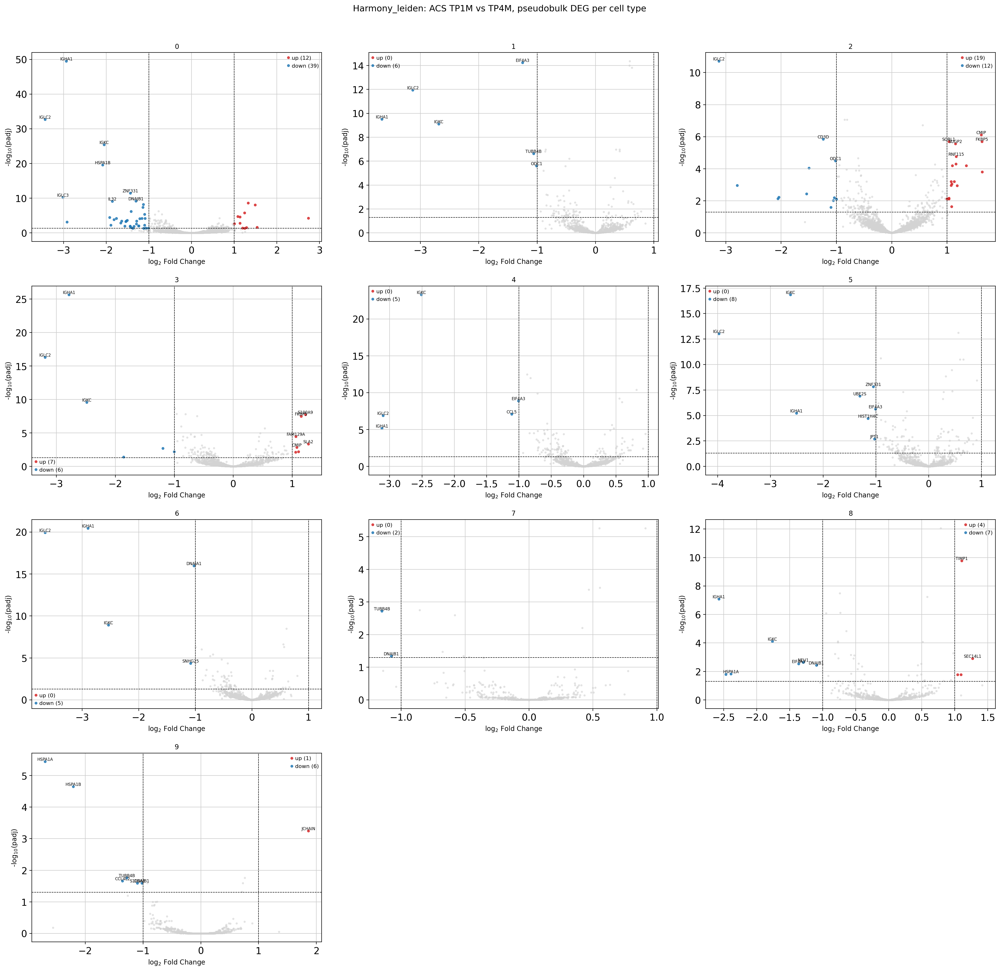

Harmony_leiden_ACS_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 200
cell_type
0    78
7    43
2    29
3    18
5    12
1    10
4     4
8     4
6     2


Harmony_leiden_ACS_vs_nonCCS
Significant DEGs (padj<0.05, |LFC|>1.0): 38
cell_type
0     10
8      8
2      7
3      4
1      3
11     2
4      2
7      1
9      1


Harmony_leiden_ACS_TP1M_vs_TP4M
Significant DEGs (padj<0.05, |LFC|>1.0): 139
cell_type
0    51
2    31
3    13
8    11
5     8
9     7
1     6
4     5
6     5
7     2


Harmony_leiden_ACS_TP1M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 92
cell_type
0     21
2     19
8     14
1     10
3      9
5      6
7      5
4      4
10     2
6      2


Harmony_leiden_ACS_TP2M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 125
cell_type
7     22
3     22
0     18
8     15
5     11
2     10
1      9
10     9
6      5
4      4


Harmony_leiden_ACS_TP3M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 23
cell_type
7    5
5    5
1    3
3    3
0    2
6    2
2    1
4    1
8    1


Harmony_leiden_ACS_TP4M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 118
cell_type
0     42
7     13
8     11
1     10
2     10
10     9
5      7
3      6
4      5
6      5

Harmony_leiden, ACS vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,5,HIST1H1D,-1.26,2.03e-12,35.1
1,3,CD8B,-1.20,2.52e-09,44.1
2,7,HIST1H1C,-1.12,3.28e-09,24.0
3,2,MTRNR2L8,-2.47,6.32e-09,43.0
4,7,HLA-DQA2,-3.01,6.83e-09,9.3
5,0,PHLDA1,1.79,2.05e-08,63.8
6,5,MTRNR2L8,-2.76,4.28e-08,33.2
7,0,LITAF,1.11,9.38e-08,77.1
8,4,MTRNR2L8,-2.61,1.31e-07,44.9
9,3,MTRNR2L8,-2.46,1.75e-07,47.3



Harmony_leiden, ACS vs Control, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,4,HIST1H4C,-1.03,1.76e-13,150.7
1,8,LITAF,1.37,2.91e-08,22.0
2,8,TIMP1,1.05,3.51e-08,218.6
3,0,PHC2,1.22,1.27e-07,30.6
4,2,ISG20,1.13,1.45e-07,56.3
5,2,FKBP5,1.70,1.70e-07,20.8
6,0,FKBP5,1.28,1.75e-07,80.3
7,8,CXCR4,1.26,1.12e-06,44.6
8,3,FKBP5,1.31,2.79e-06,32.7
9,2,SYTL3,1.16,1.23e-05,68.8



Harmony_leiden, ACS TP1M vs TP4M, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,0,IGHA1,-2.93,3.11e-50,150.7
1,0,IGLC2,-3.43,1.84e-33,55.2
2,3,IGHA1,-2.79,2.16e-26,72.2
3,0,IGKC,-2.05,3.89e-26,166.8
4,4,IGKC,-2.51,4.97e-24,95.9
5,6,IGHA1,-2.90,3.45e-21,63.0
6,6,IGLC2,-3.66,1.20e-20,26.4
7,0,HSPA1B,-2.08,2.62e-20,247.6
8,5,IGKC,-2.62,1.38e-17,54.7
9,3,IGLC2,-3.19,4.85e-17,30.8



Harmony_leiden, ACS TP1M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,4,HIST1H4C,-1.25,2.31e-30,148.0
1,5,HIST1H4C,-1.29,4.93e-30,122.1
2,1,HIST1H4C,-1.15,5.37e-20,146.2
3,5,AC058791.1,1.59,9.15e-18,14.9
4,5,HIST1H1D,-1.27,8.97e-16,46.9
5,5,HIST2H2AC,-1.16,5.65e-14,27.7
6,3,HIST1H4C,-1.04,6.48e-14,104.6
7,3,HIST2H2AC,-1.05,6.07e-12,34.3
8,1,AC058791.1,1.26,3.00e-11,17.7
9,2,PTPN6,-1.15,4.29e-11,16.1



Harmony_leiden, ACS TP2M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,1,HIST1H4C,-1.00,7.75e-53,143.9
1,5,HIST1H4C,-1.05,1.14e-35,113.8
2,3,MAL,1.86,1.16e-19,15.3
3,5,NEAT1,1.02,1.03e-18,115.3
4,8,IL32,4.11,2.43e-16,11.0
5,6,AC058791.1,1.18,6.61e-14,28.4
6,5,HIST2H2AC,-1.01,1.57e-13,26.1
7,5,AC058791.1,1.60,4.56e-13,13.8
8,3,IL6ST,1.38,5.28e-13,19.1
9,1,AC058791.1,1.43,5.44e-13,19.8



Harmony_leiden, ACS TP3M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,3,HLA-DPB1,-1.09,3.31e-09,50.5
1,5,HIST1H1D,-1.23,3.14e-08,51.3
2,5,RYBP,1.10,3.14e-08,19.4
3,2,MTRNR2L8,-2.22,8.36e-07,51.0
4,5,FABP5,1.04,1.25e-06,11.2
5,1,HIST1H1D,-1.15,9.42e-06,59.3
6,7,CREM,1.11,3.83e-05,19.7
7,7,RGCC,1.32,1.83e-04,16.3
8,7,TNFAIP3,1.01,4.71e-04,20.3
9,3,IGKC,1.17,6.20e-04,9.7



Harmony_leiden, ACS TP4M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,4,IGKC,3.81,3.33e-32,60.1
1,5,IGKC,3.48,9.47e-29,52.6
2,3,IGKC,3.89,1.41e-28,55.4
3,2,IGKC,4.00,4.56e-27,52.5
4,6,IGKC,3.33,4.18e-26,53.0
5,0,IGHA1,4.48,4.33e-20,54.6
6,3,IGHA1,4.14,4.60e-20,43.8
7,0,IGKC,3.71,3.66e-19,56.7
8,4,IGHA1,4.04,9.41e-19,49.5
9,1,IGHA1,4.24,1.12e-18,45.3


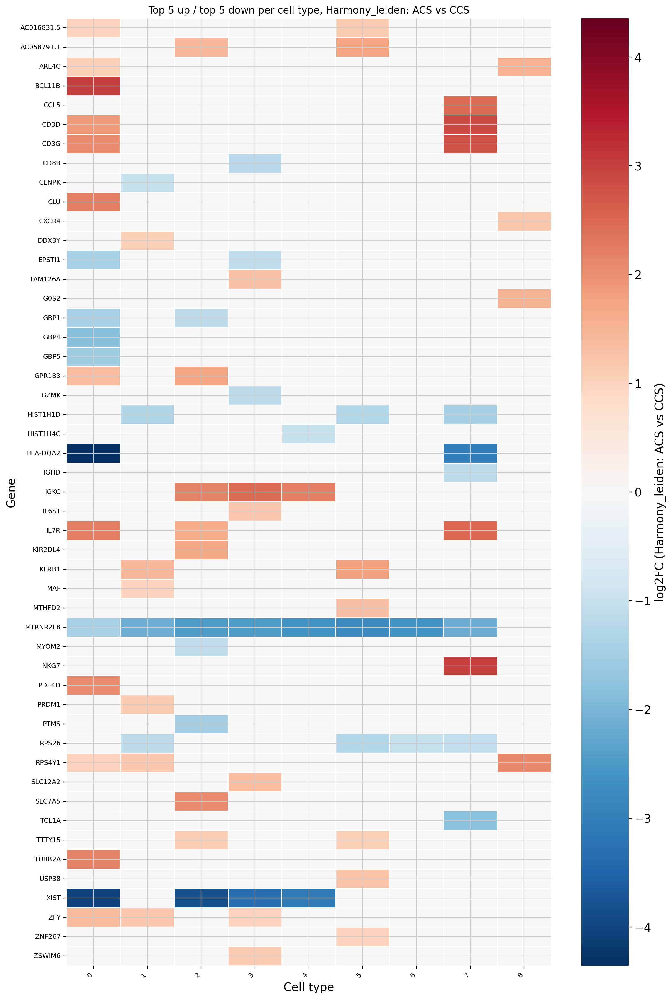

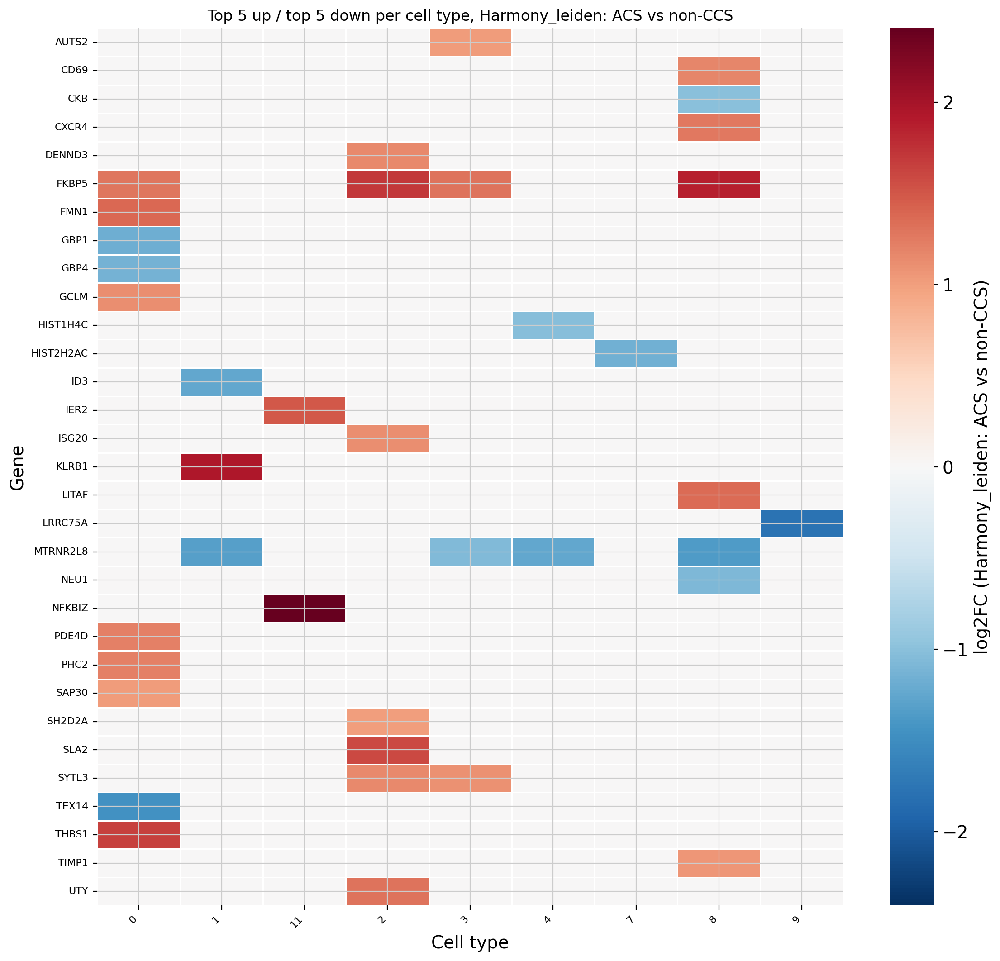

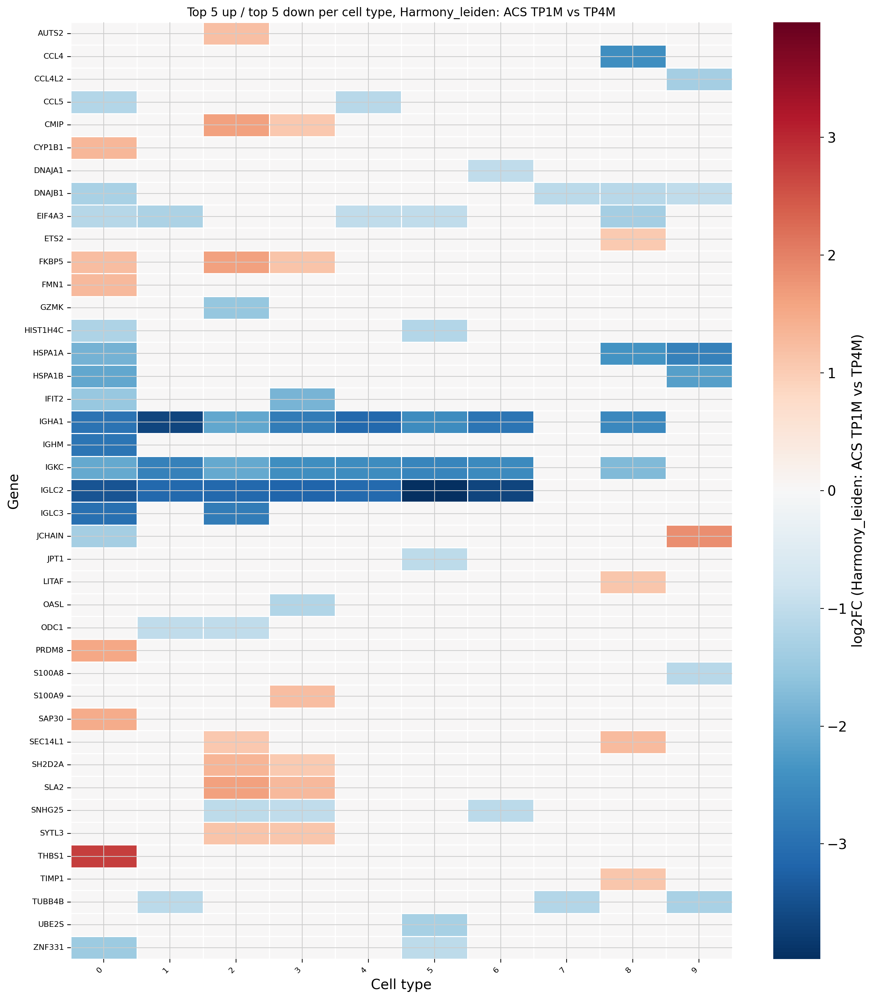



######################################################################
# Harmony_named  (cell_type_col = 'cell_type_Harmony')
######################################################################

Harmony_named: Comparison 1 — ACS (TP1M-TP4M) vs CCS


ACS sterile (all timepoints) vs CCS — 68,976 cells
condition
ACS_sterile    57056
CCS            11920
ACS patients: 19, CCS patients: 16



Pseudobulk samples: 476


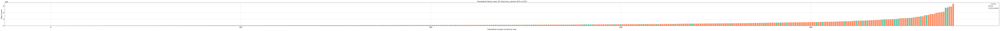

  B-cell: ACS_sterile=55, CCS=13 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.49 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.70 seconds.

Fitting LFCs...


... done in 0.44 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.16 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      11.557611        0.368060  0.365874  1.005976  0.314427  0.632900
AURKAIP1   11.255866        0.095929  0.214592  0.447032  0.654852  0.850118
MRPL20     10.563202       -0.105190  0.225823 -0.465807  0.641353  0.844559
SSU72      14.001574       -0.198658  0.189564 -1.047974  0.294650  0.615899
GNB1       14.584579        0.498572  0.220131  2.264891  0.023519  0.153944
...              ...             ...       ...       ...       ...       ...
MT-ND4L    43.037369        0.333789  0.152850  2.183768  0.028979  0.173957
MT-ND4    521.193870       -0.001141  0.104599 -0.010913  0.991293  0.998010
MT-ND5    162.312306        0.290489  0.107913  2.691870  0.007105  0.074457
MT-ND6     22.256863        0.285980  0.195267  1.464555  0.143042  0.426496
MT-CYB    637.117887       -0.016624  0.117520 -0.141453  0.887512  0.955538

[1783 ro

/vol/disk/miniforge3/envs/mapra_cytokines/lib/python3.11/site-packages/pydeseq2/utils.py:356: RuntimeWarning: divide by zero encountered in log
  beta_init[0] = np.log(counts / size_factors).mean()
/vol/disk/miniforge3/envs/mapra_cytokines/lib/python3.11/site-packages/pydeseq2/utils.py:356: RuntimeWarning: divide by zero encountered in log
  beta_init[0] = np.log(counts / size_factors).mean()
/vol/disk/miniforge3/envs/mapra_cytokines/lib/python3.11/site-packages/pydeseq2/utils.py:356: RuntimeWarning: divide by zero encountered in log
  beta_init[0] = np.log(counts / size_factors).mean()
/vol/disk/miniforge3/envs/mapra_cytokines/lib/python3.11/site-packages/pydeseq2/utils.py:356: RuntimeWarning: divide by zero encountered in log
  beta_init[0] = np.log(counts / size_factors).mean()


Fitting dispersions...


    ERROR in Dendritic: Singular matrix
  Monocytes - CD14: ACS_sterile=60, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.02 seconds.



Fitting dispersions...


... done in 2.35 seconds.

Fitting dispersion trend curve...
... done in 0.15 seconds.

Fitting MAP dispersions...


... done in 2.51 seconds.

Fitting LFCs...


... done in 1.84 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.56 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
NOC2L          9.833427       -0.249278  0.243466 -1.023872  0.305896   
HES4           7.733804        0.775305  0.542677  1.428666  0.153100   
ISG15         77.192329       -0.535362  0.314473 -1.702412  0.088678   
SDF4          31.987419       -0.131920  0.144376 -0.913724  0.360862   
UBE2J2        20.079458       -0.225776  0.179209 -1.259849  0.207724   
...                 ...             ...       ...       ...       ...   
MT-ND4      2046.574567        0.242192  0.106358  2.277129  0.022779   
MT-ND5       608.335056        0.248984  0.097497  2.553770  0.010656   
MT-ND6        44.086633        0.572050  0.175387  3.261637  0.001108   
MT-CYB      1956.706617        0.079866  0.098972  0.806959  0.419690   
AC004556.1     3.793095       -1.278200  0.808068 -1.581798  0.113696   

                padj  
NOC2L       0.605377  
HES4      

Fitting dispersions...


... done in 0.59 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.87 seconds.

Fitting LFCs...


... done in 0.58 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.18 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       47.687575       -0.298861  0.238100 -1.255190  0.209410  0.412767
ISG15      40.510993       -0.969848  0.343056 -2.827089  0.004697  0.035995
AURKAIP1   19.449375       -0.245444  0.221165 -1.109776  0.267095       NaN
MRPL20     14.763102        0.148550  0.243096  0.611078  0.541148       NaN
SSU72      18.795280       -0.084328  0.199683 -0.422312  0.672797       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    49.155341        0.388399  0.209087  1.857594  0.063227  0.190799
MT-ND4    558.915120        0.373385  0.129942  2.873472  0.004060  0.033727
MT-ND5    213.004814        0.409536  0.129367  3.165697  0.001547  0.017586
MT-ND6     18.973929        0.715405  0.268046  2.668962  0.007609       NaN
MT-CYB    724.911279       -0.032963  0.123359 -0.267213  0.789305  0.885883

[2589 ro

Fitting dispersions...


... done in 1.35 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...


... done in 1.63 seconds.

Fitting LFCs...


... done in 1.26 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.31 seconds.

Fitting size factors...
... done in 0.02 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L        9.824410        0.232648  0.228089  1.019987  0.307735  0.573557
ISG15       36.957726       -0.317434  0.180151 -1.762045  0.078062  0.283610
TNFRSF18    12.364013       -0.331883  0.231662 -1.432620  0.151966  0.411807
SDF4        29.547451       -0.023918  0.146273 -0.163517  0.870111  0.942760
UBE2J2      11.846666       -0.072151  0.194687 -0.370598  0.710937  0.859826
...               ...             ...       ...       ...       ...       ...
MT-ND4L     75.926333        0.320120  0.158185  2.023706  0.043000  0.195166
MT-ND4     800.327021        0.044687  0.087020  0.513528  0.607582  0.800187
MT-ND5     359.795249        0.286281  0.078433  3.649986  0.000262  0.007449
MT-ND6      41.166548        0.302161  0.142574  2.119327  0.034063  0.169016
MT-CYB    1001.197120        0.031674  0.094167  0.336355  0.736603  0.8732

Fitting dispersions...


... done in 2.41 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...


... done in 3.23 seconds.

Fitting LFCs...


... done in 2.19 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.56 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AL669831.5    15.845985        0.576384  0.187340  3.076669  2.093276e-03   
NOC2L         40.615388       -0.019997  0.114531 -0.174600  8.613936e-01   
HES4          10.472042       -0.314190  0.371770 -0.845120  3.980436e-01   
ISG15        173.481574       -0.164997  0.152281 -1.083503  2.785854e-01   
C1orf159       6.676693        0.045103  0.277832  0.162340  8.710379e-01   
...                 ...             ...       ...       ...           ...   
MT-ND5      1578.635811        0.277451  0.081988  3.384035  7.142888e-04   
MT-ND6       209.147892        0.513417  0.084673  6.063501  1.331901e-09   
MT-CYB      7279.297635       -0.161499  0.108012 -1.495201  1.348620e-01   
AL592183.1    16.063646       -0.213518  0.216445 -0.986475  3.239001e-01   
AC004556.1     8.495465       -1.262507  0.545048 -2.316322  2.054071e-02   

        

Fitting dispersions...


... done in 1.35 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.81 seconds.

Fitting LFCs...


... done in 1.25 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       11.816127        0.048212  0.199548  0.241604  0.809087  0.922124
ISG15       40.482909       -0.050798  0.210653 -0.241145  0.809443  0.922313
SDF4        21.949460       -0.010763  0.149355 -0.072064  0.942551  0.980044
UBE2J2      13.970137       -0.454740  0.165516 -2.747409  0.006007  0.072290
AURKAIP1    32.864253       -0.203777  0.132797 -1.534495  0.124908  0.386817
...               ...             ...       ...       ...       ...       ...
MT-ND4L    100.676009        0.236298  0.139371  1.695467  0.089987  0.326389
MT-ND4    1250.305689       -0.025629  0.108753 -0.235664  0.813694  0.924531
MT-ND5     509.473859        0.160181  0.094860  1.688601  0.091296  0.328801
MT-ND6      64.632591        0.199849  0.107161  1.864941  0.062190  0.268770
MT-CYB    1841.017502       -0.213076  0.108795 -1.958499  0.050171  0.2412

ACS sterile (TP1M) vs Control — 29,263 cells
condition2
ACS_sterile    14665
Control        14598



Pseudobulk samples: 207


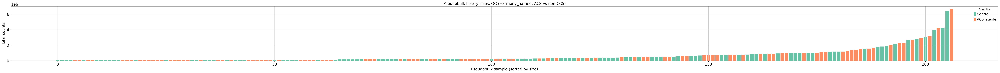

  B-cell: ACS_sterile=12, Control=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.32 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.34 seconds.

Fitting LFCs...
... done in 0.20 seconds.

Calculating cook's distance...


... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AURKAIP1   11.717103       -0.105253  0.195378 -0.538711  0.590086  0.892676
SSU72      13.059630        0.025399  0.168719  0.150542  0.880337  0.973470
GNB1       13.720053       -0.084401  0.192278 -0.438954  0.660695  0.917757
TNFRSF14   10.861411       -0.177966  0.188252 -0.945359  0.344476       NaN
RPL22     293.003179        0.037577  0.063453  0.592200  0.553717  0.875014
...              ...             ...       ...       ...       ...       ...
MT-ND4L    49.297147       -0.496168  0.166240 -2.984658  0.002839  0.098647
MT-ND4    549.147836        0.007912  0.059777  0.132354  0.894704  0.974807
MT-ND5    175.368180       -0.053614  0.085604 -0.626297  0.531120  0.860672
MT-ND6     23.953302       -0.484409  0.167135 -2.898309  0.003752  0.114524
MT-CYB    705.101409        0.128538  0.076681  1.676276  0.093684  0.506355

[12

Fitting dispersions...


... done in 0.38 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.43 seconds.

Fitting LFCs...


... done in 0.26 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...
... done in 0.11 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      16.136524        0.322742  0.510641  0.632033  0.527365       NaN
AURKAIP1   19.512676        0.129066  0.239936  0.537920  0.590633       NaN
MRPL20     15.291348       -0.376414  0.256398 -1.468086  0.142081       NaN
SSU72      14.738483       -0.071111  0.254187 -0.279760  0.779662       NaN
GNB1       29.278799       -0.186873  0.206911 -0.903161  0.366441       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    51.263778       -0.536096  0.175621 -3.052575  0.002269       NaN
MT-ND4    643.153703        0.239440  0.107137  2.234895  0.025424  0.077706
MT-ND5    215.503691       -0.006311  0.122425 -0.051553  0.958885       NaN
MT-ND6     19.196423       -0.758243  0.253781 -2.987787  0.002810       NaN
MT-CYB    706.882682        0.350023  0.127032  2.755397  0.005862  0.029076

[17

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.62 seconds.

Fitting dispersion trend curve...
... done in 0.14 seconds.

Fitting MAP dispersions...


... done in 1.73 seconds.

Fitting LFCs...


... done in 1.33 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.33 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      10.653623        0.030818  0.173153  0.177982  0.858737  0.950676
HES4        9.896746       -0.462595  0.411145 -1.125138  0.260531  0.569293
ISG15      74.358259       -0.002244  0.238312 -0.009417  0.992487  0.998272
SDF4       34.489192        0.068388  0.105457  0.648496  0.516664  0.780331
UBE2J2     22.869901       -0.195634  0.117718 -1.661893  0.096534  0.346327
...              ...             ...       ...       ...       ...       ...
MT-ND4L   269.376441       -0.503763  0.138519 -3.636790  0.000276  0.011363
MT-ND4   2807.742590        0.030602  0.068451  0.447061  0.654831  0.862983
MT-ND5    816.512731       -0.053618  0.079882 -0.671217  0.502083  0.772084
MT-ND6     53.412406       -0.373841  0.131764 -2.837212  0.004551  0.066415
MT-CYB   2483.869193        0.229809  0.066485  3.456554  0.000547  0.018212

[65

Fitting dispersions...


... done in 0.53 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.58 seconds.

Fitting LFCs...


... done in 0.33 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       51.908458       -0.137041  0.164406 -0.833553  0.404533  0.663262
ISG15      44.224844       -0.187279  0.197849 -0.946575  0.343855  0.611057
AURKAIP1   20.870734        0.146439  0.141107  1.037785  0.299370  0.571628
MRPL20     16.756706        0.097777  0.152152  0.642626  0.520467       NaN
SSU72      21.106094        0.003503  0.145292  0.024110  0.980765  0.989696
...              ...             ...       ...       ...       ...       ...
MT-ND4L    63.904165       -0.551670  0.194941 -2.829936  0.004656  0.048728
MT-ND4    688.500196        0.033043  0.087635  0.377052  0.706135  0.870978
MT-ND5    263.359944       -0.089990  0.105313 -0.854496  0.392830  0.654432
MT-ND6     25.242168       -0.459077  0.202493 -2.267127  0.023382  0.139921
MT-CYB    845.359890        0.238268  0.087874  2.711491  0.006698  0.062576

[22

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.92 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 0.94 seconds.

Fitting LFCs...


... done in 0.69 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       10.911835       -0.056567  0.160702 -0.352000  0.724839  0.889609
ISG15       32.914297       -0.384879  0.138277 -2.783391  0.005379  0.075627
TNFRSF18    12.983735       -0.333529  0.284206 -1.173547  0.240577  0.561866
SDF4        26.464807        0.308905  0.114189  2.705215  0.006826  0.085898
UBE2J2      11.005445       -0.074028  0.159701 -0.463542  0.642976  0.852477
...               ...             ...       ...       ...       ...       ...
MT-ND4L     80.714513       -0.452165  0.120997 -3.736983  0.000186  0.007771
MT-ND4     852.102958       -0.032015  0.050539 -0.633467  0.526428  0.782576
MT-ND5     386.218677        0.005149  0.070677  0.072858  0.941919  0.982190
MT-ND6      44.888447       -0.609633  0.174075 -3.502117  0.000462  0.015382
MT-CYB    1089.444635        0.036677  0.066200  0.554033  0.579556  0

Fitting dispersions...


... done in 1.93 seconds.

Fitting dispersion trend curve...
... done in 0.17 seconds.

Fitting MAP dispersions...


... done in 2.03 seconds.

Fitting LFCs...


... done in 1.04 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.38 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
AL669831.5    15.944509        0.058347  0.159466  0.365888  0.714449   
NOC2L         38.736814       -0.041924  0.097287 -0.430936  0.666515   
ISG15        160.685368       -0.099084  0.137056 -0.722947  0.469713   
TNFRSF18      14.747187        0.308840  0.300681  1.027136  0.304356   
TNFRSF4       34.752378       -0.029102  0.244802 -0.118878  0.905372   
...                 ...             ...       ...       ...       ...   
MT-ND4      5186.214883        0.013083  0.058423  0.223937  0.822807   
MT-ND5      1759.149139       -0.041746  0.066990 -0.623175  0.533169   
MT-ND6       239.029758       -0.476993  0.122165 -3.904505  0.000094   
MT-CYB      8051.856121        0.086922  0.075549  1.150532  0.249925   
AL592183.1    15.601122       -0.035429  0.227092 -0.156011  0.876024   

                padj  
AL669831.5  0.879976  
NOC2L

Fitting dispersions...


... done in 0.77 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.83 seconds.

Fitting LFCs...


... done in 0.44 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.17 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       30.224847       -0.229199  0.185285 -1.237012  0.216083  0.550325
SDF4        15.894659        0.112155  0.149864  0.748378  0.454232  0.756458
UBE2J2      11.185650       -0.417328  0.168286 -2.479882  0.013143  0.146429
AURKAIP1    26.202272        0.073230  0.117570  0.622864  0.533374  0.801422
CCNL2       12.555838        0.194172  0.152564  1.272728  0.203114  0.534537
...               ...             ...       ...       ...       ...       ...
MT-ND4L     88.941504       -0.523783  0.127084 -4.121556  0.000038  0.003695
MT-ND4    1081.054502        0.020577  0.061879  0.332540  0.739482  0.905476
MT-ND5     441.520971        0.009035  0.063734  0.141755  0.887273  0.955712
MT-ND6      54.397160       -0.348398  0.131953 -2.640330  0.008283  0.114139
MT-CYB    1587.828819        0.017967  0.066365  0.270736  0.786594  0

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.23 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.26 seconds.

Fitting LFCs...
... done in 0.17 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.08 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
GNB1      16.407306       -0.496354  0.391208 -1.268773  0.204522  0.803449
FAAP20     8.176513       -0.399336  0.572850 -0.697104  0.485738  0.924878
RER1       9.159633        0.045237  0.521149  0.086803  0.930828  0.988094
RPL22    135.410661       -0.286913  0.171401 -1.673922  0.094146  0.732381
PARK7     53.323575       -0.130961  0.229852 -0.569763  0.568838  0.954836
...             ...             ...       ...       ...       ...       ...
MT-ND4L   19.796235       -0.072429  0.363408 -0.199306  0.842024  0.977196
MT-ND4   275.478286        0.516784  0.169148  3.055207  0.002249  0.169128
MT-ND5   115.076489        0.299868  0.181479  1.652350  0.098463  0.732381
MT-ND6     9.170152       -0.099956  0.515944 -0.193735  0.846383  0.977196
MT-CYB   263.476395        0.462595  0.169074  2.736041  0.006218  0.292262

[1128 rows x 6 

ACS sterile TP1M vs TP4M — 26,074 cells
timepoint
TP1M    14665
TP4M    11409

Patients: 19



Pseudobulk samples: 170


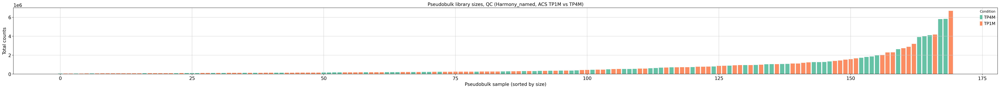

  B-cell: 6 paired patients
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.21 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...


... done in 0.27 seconds.

Fitting LFCs...
... done in 0.20 seconds.



Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.

Fitting size factors...


Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      16.197610       -0.025642  0.444705 -0.057662  0.954018       NaN
SSU72      13.035451        0.121210  0.402103  0.301440  0.763079       NaN
GNB1       13.162800        0.354385  0.397353  0.891864  0.372466       NaN
TNFRSF14   10.030128       -0.129786  0.498596 -0.260303  0.794630       NaN
RPL22     315.814923       -0.063205  0.108636 -0.581807  0.560697  0.957149
...              ...             ...       ...       ...       ...       ...
MT-ND4L    46.420643       -0.333636  0.246632 -1.352768  0.176130  0.776503
MT-ND4    492.376951        0.256605  0.120477  2.129918  0.033178  0.354667
MT-ND5    156.018753        0.368844  0.140579  2.623759  0.008697  0.202496
MT-ND6     22.230916       -0.169028  0.306014 -0.552352  0.580707       NaN
MT-CYB    639.281083        0.467885  0.100608  4.650559  0.000003  0.000420

[1108 rows x 6

... done in 0.00 seconds.



Fitting dispersions...


... done in 1.11 seconds.

Fitting dispersion trend curve...
... done in 0.15 seconds.

Fitting MAP dispersions...


... done in 1.56 seconds.

Fitting LFCs...


... done in 1.12 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.35 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
AL669831.5     9.189204        0.076460  0.461957  0.165513  0.868540   
NOC2L         20.077556       -0.062809  0.319171 -0.196787  0.843994   
HES4          14.073928       -1.107301  0.436286 -2.538016  0.011148   
ISG15        188.347195       -0.945645  0.451873 -2.092724  0.036374   
SDF4          62.601319       -0.007440  0.206913 -0.035960  0.971315   
...                 ...             ...       ...       ...       ...   
MT-ND4      4264.808269        0.446365  0.122517  3.643305  0.000269   
MT-ND5      1282.588265        0.280134  0.108672  2.577809  0.009943   
MT-ND6        82.815353       -0.118717  0.180144 -0.659011  0.509888   
MT-CYB      4190.795816        0.430465  0.116196  3.704650  0.000212   
AL592183.1    11.868905        0.273206  0.420717  0.649380  0.516092   

                padj  
AL669831.5       NaN  
NOC2L           

Fitting dispersions...


... done in 0.27 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.37 seconds.

Fitting LFCs...


... done in 0.45 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...


Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       50.182012       -0.446158  0.248347 -1.796510  0.072413  0.433598
ISG15      57.608999       -0.394211  0.512257 -0.769558  0.441562  0.871226
AURKAIP1   19.479487        0.212881  0.381070  0.558641  0.576407       NaN
MRPL20     15.618154        0.322446  0.447889  0.719924  0.471572       NaN
SSU72      20.341408       -0.017804  0.367242 -0.048480  0.961334       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    52.078350       -0.522760  0.242347 -2.157076  0.031000  0.285594
MT-ND4    618.240840        0.441574  0.113700  3.883692  0.000103  0.003633
MT-ND5    234.883396        0.257260  0.136226  1.888471  0.058963  0.382553
MT-ND6     20.929825       -0.115144  0.371868 -0.309636  0.756838       NaN
MT-CYB    848.709679        0.199818  0.104192  1.917787  0.055138  0.368332

[1681 rows x 6

... done in 0.00 seconds.



Fitting dispersions...


... done in 0.57 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.79 seconds.

Fitting LFCs...


... done in 0.60 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.20 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       13.055955        0.330349  0.254165  1.299741  0.193690  0.538998
ISG15       52.257824       -0.582473  0.174595 -3.336130  0.000850  0.023006
TNFRSF18    18.751674       -0.094752  0.241006 -0.393150  0.694209  0.877242
SDF4        39.878005        0.309507  0.200119  1.546612  0.121957  0.435899
UBE2J2      16.004488       -0.209551  0.255484 -0.820213  0.412095  0.730988
...               ...             ...       ...       ...       ...       ...
MT-ND4L    110.832134       -0.417694  0.182212 -2.292348  0.021886  0.175316
MT-ND4    1072.788964        0.325383  0.095909  3.392622  0.000692  0.020963
MT-ND5     497.120039        0.274157  0.102215  2.682153  0.007315  0.090246
MT-ND6      57.591062       -0.357699  0.190145 -1.881186  0.059947  0.308628
MT-CYB    1493.900621        0.198647  0.083086  2.390863  0.016809  0.146694

[3

Fitting dispersions...


... done in 1.45 seconds.

Fitting dispersion trend curve...
... done in 0.17 seconds.

Fitting MAP dispersions...


... done in 1.89 seconds.

Fitting LFCs...


... done in 1.59 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.42 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AL669831.5    21.544282        0.123087  0.230812  0.533277  5.938417e-01   
NOC2L         45.671583        0.152638  0.171852  0.888191  3.744379e-01   
HES4          12.311401       -0.896227  0.337379 -2.656442  7.896994e-03   
ISG15        249.188627       -0.521166  0.164153 -3.174880  1.498985e-03   
C1orf159       9.946705       -0.452825  0.350779 -1.290915  1.967332e-01   
...                 ...             ...       ...       ...           ...   
MT-ND5      2026.622579        0.358926  0.072774  4.932029  8.137991e-07   
MT-ND6       270.240977       -0.151154  0.087691 -1.723700  8.476207e-02   
MT-CYB      9505.747743        0.305793  0.065867  4.642602  3.440488e-06   
AL592183.1    20.658097        0.033865  0.251218  0.134803  8.927674e-01   
AC004556.1    16.732820       -0.218979  0.286713 -0.763757  4.450120e-01   

              

Fitting dispersions...


... done in 0.69 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...


... done in 1.09 seconds.

Fitting LFCs...


... done in 0.80 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.25 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      16.527937        0.066639  0.267674  0.248954  0.803396       NaN
ISG15      69.312344       -0.715082  0.319008 -2.241579  0.024989  0.243056
SDF4       30.575575        0.041587  0.209073  0.198910  0.842333  0.956777
UBE2J2     19.027517       -0.210927  0.246942 -0.854156  0.393019  0.790181
INTS11     10.956865       -0.209809  0.316066 -0.663812  0.506811       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L   148.133418       -0.275464  0.149115 -1.847333  0.064699  0.410968
MT-ND4   1728.748719        0.382128  0.091998  4.153639  0.000033  0.002475
MT-ND5    712.665798        0.432501  0.089186  4.849413  0.000001  0.000163
MT-ND6     91.839215       -0.133182  0.138558 -0.961202  0.336451  0.757756
MT-CYB   2699.735828        0.245129  0.072235  3.393486  0.000690  0.021974

[4790 rows x 6

ACS sterile (TP1M) vs CCS -- 26,585 cells
condition
ACS_sterile    14665
CCS            11920



Pseudobulk samples: 196


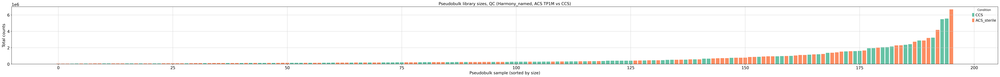

  B-cell: ACS_sterile=12, CCS=13 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.25 seconds.

Fitting dispersion trend curve...
... done in 0.02 seconds.

Fitting MAP dispersions...


... done in 0.28 seconds.

Fitting LFCs...
... done in 0.15 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.08 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     13.327886       -0.153728  0.164757 -0.933062  0.350788  0.697245
RPL22    287.847112        0.018347  0.067537  0.271651  0.785890  0.931146
PARK7     20.643952        0.122647  0.134662  0.910777  0.362413  0.711567
RERE      12.479475       -0.445179  0.194035 -2.294330  0.021772  0.181304
ENO1      15.946623       -0.231868  0.175924 -1.318007  0.187501  0.527998
...             ...             ...       ...       ...       ...       ...
MT-ND4L   36.820616        0.165707  0.156608  1.058097  0.290011  0.649716
MT-ND4   514.404889        0.122128  0.065886  1.853625  0.063793  0.301521
MT-ND5   149.974284        0.287324  0.092405  3.109405  0.001875  0.046434
MT-ND6    18.975650        0.068881  0.203156  0.339056  0.734567  0.918746
MT-CYB   675.746316        0.188022  0.086900  2.163648  0.030491  0.213075

[966 rows x 6 column

Fitting dispersions...


... done in 0.68 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.53 seconds.

Fitting LFCs...


... done in 0.32 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.13 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      22.202237       -0.380528  0.465435 -0.817575  0.413600  0.843246
AURKAIP1   23.031426       -0.018732  0.242346 -0.077296  0.938388  0.989183
MRPL20     16.259857       -0.073942  0.241520 -0.306151  0.759490  0.942327
SSU72      19.593170       -0.574057  0.209967 -2.734032  0.006256  0.203641
GNB1       31.323783        0.081489  0.191515  0.425497  0.670475  0.927366
...              ...             ...       ...       ...       ...       ...
MT-ND4L    48.341117        0.189577  0.210186  0.901947  0.367085  0.834696
MT-ND4    712.291084        0.420538  0.126231  3.331494  0.000864  0.076061
MT-ND5    223.744848        0.452913  0.139227  3.253052  0.001142  0.092994
MT-ND6     16.336040        0.358440  0.286282  1.252051  0.210551  0.725134
MT-CYB    843.755100        0.187906  0.106459  1.765057  0.077554  0.504133

[2178 ro

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.51 seconds.

Fitting dispersion trend curve...
... done in 0.13 seconds.

Fitting MAP dispersions...


... done in 1.62 seconds.

Fitting LFCs...


... done in 0.85 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.31 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L      12.494603       -0.235513  0.169105 -1.392706  1.637087e-01   
ISG15      77.834234        0.006452  0.255973  0.025207  9.798898e-01   
SDF4       38.845479       -0.096810  0.097673 -0.991168  3.216037e-01   
UBE2J2     25.971032       -0.332495  0.112600 -2.952870  3.148349e-03   
ACAP3      10.332509        0.222801  0.165848  1.343402  1.791417e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L   205.572908        0.365833  0.115870  3.157258  1.592603e-03   
MT-ND4   2557.974296        0.461329  0.057351  8.043930  8.700243e-16   
MT-ND5    745.514225        0.357819  0.075278  4.753317  2.001066e-06   
MT-ND6     44.734084        0.296896  0.111639  2.659417  7.827593e-03   
MT-CYB   2522.907389        0.324205  0.063747  5.085827  3.660280e-07   

                 padj  
NOC2L    3.545472e-0

Fitting dispersions...


... done in 0.59 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.61 seconds.

Fitting LFCs...


... done in 0.72 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
HES4       54.066003       -0.049710  0.172615 -0.287983  7.733599e-01   
ISG15      45.894490       -0.099436  0.244844 -0.406121  6.846535e-01   
SDF4       10.208539        0.063293  0.193585  0.326950  7.437060e-01   
AURKAIP1   24.176775       -0.077894  0.148597 -0.524199  6.001402e-01   
MRPL20     17.124340        0.206432  0.176582  1.169041  2.423871e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    52.637504        0.170086  0.150266  1.131899  2.576768e-01   
MT-ND4    665.616490        0.405899  0.082277  4.933324  8.084203e-07   
MT-ND5    246.247159        0.360464  0.096928  3.718883  2.001055e-04   
MT-ND6     19.797805        0.405324  0.158738  2.553417  1.066717e-02   
MT-CYB    936.172039        0.201081  0.096153  2.091258  3.650495e-02   

              padj  
HES4      0.886311  
IS

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.94 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.97 seconds.

Fitting LFCs...


... done in 0.53 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.21 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       10.506840        0.128368  0.169766  0.756149  0.449560  0.645255
ISG15       34.777105       -0.336172  0.138061 -2.434941  0.014894  0.068370
TNFRSF18    12.475852       -0.036494  0.255558 -0.142800  0.886448  0.940410
SDF4        31.534916        0.021495  0.117833  0.182417  0.855255  0.923337
UBE2J2      11.772095       -0.041415  0.161963 -0.255708  0.798176  0.891714
...               ...             ...       ...       ...       ...       ...
MT-ND4L     70.152629        0.068329  0.119359  0.572469  0.567004  0.735519
MT-ND4     838.991536        0.176531  0.059646  2.959650  0.003080  0.023068
MT-ND5     369.627678        0.307602  0.065613  4.688145  0.000003  0.000111
MT-ND6      36.347017        0.009137  0.127911  0.071429  0.943056  0.969598
MT-CYB    1096.330402        0.190758  0.073788  2.585219  0.009732  0.0518

Fitting dispersions...


... done in 1.92 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...


... done in 2.01 seconds.

Fitting LFCs...


... done in 1.42 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.41 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AL669831.5    13.993647        0.454912  0.166962  2.724638  6.437197e-03   
NOC2L         40.256834       -0.123815  0.099695 -1.241942  2.142580e-01   
ISG15        158.806664       -0.099866  0.131067 -0.761945  4.460928e-01   
TNFRSF18      15.076474        0.201197  0.321875  0.625078  5.319197e-01   
TNFRSF4       35.018373       -0.074156  0.186331 -0.397983  6.906431e-01   
...                 ...             ...       ...       ...           ...   
MT-ND4      4861.322685        0.191405  0.057183  3.347241  8.162009e-04   
MT-ND5      1529.022474        0.370276  0.066185  5.594552  2.211918e-08   
MT-ND6       176.079736        0.364929  0.072747  5.016376  5.265527e-07   
MT-CYB      7980.727822        0.100822  0.074562  1.352190  1.763146e-01   
AL592183.1    15.017261        0.031134  0.320793  0.097054  9.226835e-01   

        

Fitting dispersions...


... done in 0.80 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.84 seconds.

Fitting LFCs...


... done in 0.44 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.18 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       27.628825       -0.042555  0.155780 -0.273173  0.784720  0.895789
SDF4        16.812729       -0.092808  0.148582 -0.624620  0.532220  0.740303
UBE2J2      10.905298       -0.505997  0.158532 -3.191765  0.001414  0.015376
AURKAIP1    26.671297       -0.133704  0.116747 -1.145253  0.252104  0.484778
CCNL2       12.500209        0.287667  0.154989  1.856047  0.063447  0.206324
...               ...             ...       ...       ...       ...       ...
MT-ND4L     69.533527        0.153783  0.119239  1.289696  0.197156  0.425644
MT-ND4    1000.438118        0.220553  0.064510  3.418914  0.000629  0.008608
MT-ND5     393.953660        0.339335  0.083110  4.082979  0.000044  0.001324
MT-ND6      44.923899        0.142047  0.091395  1.554217  0.120133  0.313010
MT-CYB    1550.673237        0.049800  0.059413  0.838209  0.401913  0.6330

ACS sterile (TP2M) vs CCS -- 31,631 cells
condition
ACS_sterile    19711
CCS            11920



Pseudobulk samples: 220


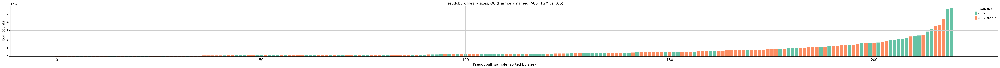

  B-cell: ACS_sterile=19, CCS=13 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.37 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.39 seconds.

Fitting LFCs...


... done in 0.22 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AURKAIP1   11.644412       -0.084887  0.190599 -0.445367  0.656054  0.800533
MRPL20     10.777781        0.192580  0.174343  1.104602  0.269332  0.501345
SSU72      14.889839       -0.092053  0.142152 -0.647563  0.517268  0.714441
GNB1       14.359861        0.153496  0.157225  0.976284  0.328924  0.561616
TNFRSF14   11.920973       -0.273402  0.169721 -1.610892  0.107203  0.288033
...              ...             ...       ...       ...       ...       ...
MT-ND4L    41.645626        0.273141  0.107743  2.535124  0.011241  0.064753
MT-ND4    534.840696        0.014612  0.087763  0.166495  0.867767  0.937922
MT-ND5    166.645537        0.303965  0.086159  3.527955  0.000419  0.005626
MT-ND6     23.824696        0.370961  0.155522  2.385273  0.017066  0.086795
MT-CYB    634.544364       -0.183921  0.100626 -1.827767  0.067585  0.217099

[1424 ro

Fitting dispersions...


... done in 0.48 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.53 seconds.

Fitting LFCs...


... done in 0.71 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      20.805646       -0.327856  0.267669 -1.224855  0.220630  0.637477
AURKAIP1   20.099227       -0.110581  0.280250 -0.394581  0.693152  0.912265
MRPL20     16.805449        0.174120  0.259866  0.670037  0.502834  0.839829
SSU72      19.917860       -0.292018  0.217420 -1.343104  0.179238  0.597285
GNB1       27.825204        0.018914  0.192394  0.098308  0.921687  0.984690
...              ...             ...       ...       ...       ...       ...
MT-ND4L    48.889393        0.367709  0.182192  2.018250  0.043565  0.339079
MT-ND4    585.254198        0.178864  0.154792  1.155516  0.247879  0.663489
MT-ND5    197.688745        0.353262  0.137438  2.570330  0.010160  0.195815
MT-ND6     16.723678        0.605829  0.252803  2.396452  0.016555  0.233539
MT-CYB    672.488820       -0.129754  0.136094 -0.953415  0.340380  0.735705

[2228 ro

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.34 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.43 seconds.

Fitting LFCs...


... done in 0.74 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.29 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L      11.762908       -0.143386  0.158005 -0.907477  3.641546e-01   
ISG15      71.479707        0.080987  0.255251  0.317284  7.510285e-01   
SDF4       35.522944       -0.112594  0.090304 -1.246824  2.124622e-01   
UBE2J2     22.498120       -0.388346  0.111897 -3.470564  5.193669e-04   
INTS11     13.769838       -0.248000  0.147557 -1.680714  9.281851e-02   
...              ...             ...       ...       ...           ...   
MT-ND4L   185.211032        0.378381  0.084882  4.457716  8.283760e-06   
MT-ND4   2154.687568        0.283105  0.070022  4.043062  5.275775e-05   
MT-ND5    651.721985        0.283539  0.069957  4.053048  5.055473e-05   
MT-ND6     47.680240        0.723267  0.112834  6.410030  1.454913e-10   
MT-CYB   2031.747379        0.029957  0.070799  0.423136  6.721958e-01   

                 padj  
NOC2L    5.565447e-0

Fitting dispersions...


... done in 0.59 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.63 seconds.

Fitting LFCs...


... done in 0.36 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       49.801185       -0.004278  0.192112 -0.022271  0.982232  0.990130
ISG15      37.881371       -0.288164  0.232072 -1.241701  0.214347  0.431133
SDF4        9.039219       -0.027533  0.210689 -0.130680  0.896029  0.939824
AURKAIP1   20.664860       -0.335997  0.153478 -2.189209  0.028582  0.119076
MRPL20     15.386321        0.165706  0.175746  0.942870  0.345747  0.568090
...              ...             ...       ...       ...       ...       ...
MT-ND4L    52.747003        0.380269  0.119087  3.193191  0.001407  0.014378
MT-ND4    587.549284        0.327059  0.098658  3.315066  0.000916  0.010414
MT-ND5    225.020935        0.371824  0.083531  4.451345  0.000009  0.000328
MT-ND6     20.661426        0.796322  0.179369  4.439567  0.000009  0.000335
MT-CYB    735.645717       -0.139639  0.077066 -1.811947  0.069994  0.215688

[2382 ro

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.01 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 1.06 seconds.

Fitting LFCs...


... done in 0.94 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.22 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       10.723921       -0.101766  0.173011 -0.588208  0.556393  0.736809
ISG15       41.084599       -0.175705  0.122578 -1.433419  0.151738  0.345300
TNFRSF18    13.096615       -0.307044  0.284560 -1.079014  0.280581  0.506474
SDF4        33.078114       -0.147734  0.101446 -1.456277  0.145316  0.338263
UBE2J2      13.128063        0.052991  0.145354  0.364564  0.715437  0.850030
...               ...             ...       ...       ...       ...       ...
MT-ND4L     82.103794        0.185679  0.085580  2.169662  0.030032  0.121314
MT-ND4     879.511128        0.009877  0.090389  0.109274  0.912985  0.956172
MT-ND5     387.395374        0.122538  0.064693  1.894146  0.058206  0.188332
MT-ND6      45.851214        0.252177  0.099230  2.541345  0.011043  0.060866
MT-CYB    1061.437783       -0.193192  0.087143 -2.216948  0.026627  0.1123

Fitting dispersions...


... done in 2.00 seconds.

Fitting dispersion trend curve...
... done in 0.17 seconds.

Fitting MAP dispersions...


... done in 2.10 seconds.

Fitting LFCs...


... done in 1.08 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.55 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AL669831.5    13.801630        0.362189  0.152817  2.370082  1.778413e-02   
NOC2L         38.852146       -0.171805  0.089769 -1.913862  5.563784e-02   
HES4           8.438372       -0.571210  0.347974 -1.641529  1.006876e-01   
ISG15        149.696850       -0.184633  0.131754 -1.401345  1.611110e-01   
TNFRSF18      14.375245        0.063564  0.214635  0.296147  7.671177e-01   
...                 ...             ...       ...       ...           ...   
MT-ND4      4332.811647       -0.064082  0.088963 -0.720328  4.713230e-01   
MT-ND5      1435.237834        0.246982  0.063354  3.898450  9.681051e-05   
MT-ND6       191.048852        0.580394  0.059635  9.732446  2.192551e-22   
MT-CYB      6673.441980       -0.339412  0.100180 -3.388035  7.039516e-04   
AL592183.1    13.933741       -0.121133  0.310270 -0.390412  6.962322e-01   

        

Fitting dispersions...


... done in 1.24 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...


... done in 1.26 seconds.

Fitting LFCs...


... done in 0.69 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.26 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      12.270870       -0.059867  0.149161 -0.401356  0.688158  0.827163
ISG15      38.853764       -0.088828  0.137248 -0.647207  0.517498  0.704748
SDF4       25.003773        0.042835  0.106594  0.401856  0.687790  0.827163
UBE2J2     16.294252       -0.390162  0.127400 -3.062499  0.002195  0.017449
INTS11      8.536591       -0.257190  0.171839 -1.496691  0.134474  0.311991
...              ...             ...       ...       ...       ...       ...
MT-ND4L   102.861941        0.218272  0.071571  3.049743  0.002290  0.017967
MT-ND4   1316.962003       -0.002119  0.094086 -0.022526  0.982028  0.990484
MT-ND5    527.801841        0.163912  0.072272  2.267995  0.023330  0.093991
MT-ND6     67.918019        0.261299  0.089353  2.924363  0.003452  0.024083
MT-CYB   1932.666359       -0.328181  0.095234 -3.446048  0.000569  0.006308

[4746 ro

ACS sterile (TP3M) vs CCS -- 23,191 cells
condition
CCS            11920
ACS_sterile    11271



Pseudobulk samples: 180


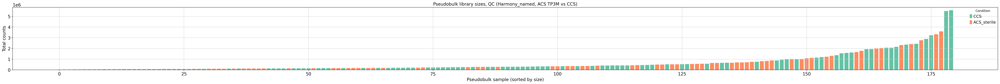

  B-cell: ACS_sterile=13, CCS=13 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.27 seconds.

Fitting dispersion trend curve...
... done in 0.02 seconds.

Fitting MAP dispersions...


... done in 0.29 seconds.

Fitting LFCs...
... done in 0.16 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.07 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     12.761934       -0.185484  0.160892 -1.152846  0.248974  0.539528
GNB1      14.416373        0.284836  0.187990  1.515170  0.129729  0.369500
RPL22    281.827769        0.004315  0.070179  0.061492  0.950968  0.984697
PARK7     17.501597       -0.328224  0.148298 -2.213268  0.026879  0.146291
RERE      13.519026       -0.183932  0.191457 -0.960697  0.336705  0.614920
...             ...             ...       ...       ...       ...       ...
MT-ND4L   35.216380        0.139396  0.124526  1.119413  0.262964  0.552751
MT-ND4   466.967912       -0.092370  0.088911 -1.038906  0.298848  0.577274
MT-ND5   132.928092        0.021811  0.113428  0.192288  0.847517  0.935378
MT-ND6    17.786448        0.061843  0.199502  0.309988  0.756570  0.892525
MT-CYB   578.345977       -0.204971  0.103478 -1.980810  0.047613  0.211222

[1051 rows x 6 colum

Fitting dispersions...


... done in 1.18 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.24 seconds.

Fitting LFCs...


... done in 1.08 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.25 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       53.150873        0.338158  0.239407  1.412481  0.157809  0.460445
SDF4        23.999483       -0.112526  0.116888 -0.962686  0.335705  0.652977
UBE2J2      15.987706       -0.216746  0.142207 -1.524161  0.127469  0.414160
AURKAIP1    48.444657       -0.304934  0.095799 -3.183054  0.001457  0.035767
CCNL2       15.504746       -0.075457  0.196550 -0.383906  0.701048  0.869027
...               ...             ...       ...       ...       ...       ...
MT-ND4L    112.875631        0.159612  0.132854  1.201402  0.229595  0.545107
MT-ND4    1327.551803        0.047779  0.081844  0.583783  0.559366  0.797823
MT-ND5     398.983654        0.026546  0.093162  0.284947  0.775684  0.905626
MT-ND6      30.466014        0.507360  0.145711  3.481954  0.000498  0.018474
MT-CYB    1357.706207       -0.008419  0.072260 -0.116511  0.907247  0.9660

Fitting dispersions...


... done in 0.60 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.61 seconds.

Fitting LFCs...


... done in 0.35 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       47.351010       -0.087452  0.282649 -0.309402  0.757016  0.912362
ISG15      37.632402       -0.326801  0.314111 -1.040402  0.298153  0.654063
AURKAIP1   21.605577       -0.108223  0.214069 -0.505551  0.613172       NaN
MRPL20     14.798632        0.257535  0.252668  1.019264  0.308078       NaN
SSU72      20.642930       -0.231758  0.229267 -1.010867  0.312080       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    46.731326        0.253282  0.206212  1.228259  0.219350  0.550344
MT-ND4    523.703421        0.209962  0.105649  1.987358  0.046883  0.231104
MT-ND5    199.083649        0.239669  0.135735  1.765708  0.077445  0.316579
MT-ND6     15.333723        0.300675  0.230974  1.301769  0.192995       NaN
MT-CYB    751.601472       -0.015586  0.120561 -0.129276  0.897139  0.971714

[2458 ro

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.81 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.83 seconds.

Fitting LFCs...


... done in 0.46 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.18 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      33.411292       -0.049917  0.175891 -0.283798  0.776565  0.908864
TNFRSF18   11.252030       -0.126049  0.294709 -0.427708  0.668864  0.848387
SDF4       27.445853       -0.159602  0.127374 -1.253017  0.210200  0.471306
UBE2J2     10.560350       -0.048719  0.167292 -0.291223  0.770881       NaN
AURKAIP1   25.941439       -0.299093  0.125585 -2.381591  0.017238  0.111311
...              ...             ...       ...       ...       ...       ...
MT-ND4L    63.007934        0.152231  0.148593  1.024481  0.305608  0.578762
MT-ND4    699.555418        0.000020  0.079063  0.000255  0.999796  0.999796
MT-ND5    303.007527        0.082005  0.079519  1.031260  0.302419  0.577760
MT-ND6     34.406648        0.198320  0.114512  1.731877  0.083295  0.272391
MT-CYB    870.837642       -0.127665  0.093954 -1.358806  0.174208  0.426893

[3165 ro

Fitting dispersions...


... done in 1.96 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...


... done in 2.10 seconds.

Fitting LFCs...


... done in 1.45 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 3 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.41 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AL669831.5    15.496033        0.588985  0.151628  3.884404  1.025813e-04   
NOC2L         44.571979       -0.031256  0.092172 -0.339101  7.345336e-01   
HES4          12.096059        0.175553  0.312458  0.561847  5.742205e-01   
ISG15        177.778171        0.043012  0.151370  0.284148  7.762972e-01   
TNFRSF18      15.683050        0.090986  0.224389  0.405481  6.851238e-01   
...                 ...             ...       ...       ...           ...   
MT-ND4      4813.464327       -0.026514  0.083926 -0.315916  7.520660e-01   
MT-ND5      1527.418958        0.190094  0.094417  2.013348  4.407802e-02   
MT-ND6       191.592987        0.401122  0.074797  5.362794  8.194434e-08   
MT-CYB      7620.031623       -0.236849  0.094177 -2.514926  1.190575e-02   
AL592183.1    17.424140        0.233189  0.293249  0.795190  4.265030e-01   

        

Fitting dispersions...


... done in 0.91 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.99 seconds.

Fitting LFCs...


... done in 0.53 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.20 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L        9.900108        0.059386  0.180008  0.329906  0.741471  0.876604
ISG15       32.131244        0.153389  0.190680  0.804430  0.421149  0.688879
SDF4        16.926257       -0.260505  0.136733 -1.905215  0.056752  0.232088
UBE2J2      12.494336       -0.395638  0.148998 -2.655323  0.007923  0.077565
AURKAIP1    26.884238       -0.357562  0.123558 -2.893875  0.003805  0.049732
...               ...             ...       ...       ...       ...       ...
MT-ND4L     77.534935        0.214928  0.125690  1.709993  0.087267  0.301174
MT-ND4     993.943501       -0.031879  0.079043 -0.403318  0.686714  0.849197
MT-ND5     398.648313        0.140285  0.094711  1.481199  0.138554  0.386158
MT-ND6      49.920658        0.193431  0.101093  1.913408  0.055696  0.229672
MT-CYB    1530.323039       -0.240149  0.083124 -2.889042  0.003864  0.0500

ACS sterile (TP4M) vs CCS -- 23,329 cells
condition
CCS            11920
ACS_sterile    11409



Pseudobulk samples: 162


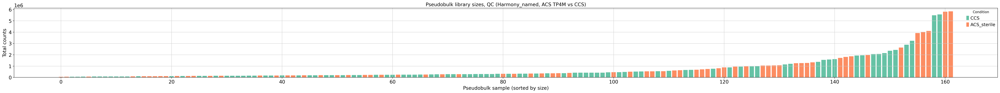

  B-cell: ACS_sterile=11, CCS=13 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.35 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.74 seconds.

Fitting LFCs...


... done in 0.21 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      11.760623        0.682871  0.304207  2.244758  0.024784  0.138896
AURKAIP1   11.910584       -0.026256  0.190067 -0.138139  0.890130  0.956592
SSU72      15.269399       -0.188664  0.165801 -1.137894  0.255165  0.542109
GNB1       13.755772       -0.096562  0.204868 -0.471336  0.637401  0.841813
TNFRSF14   13.501360       -0.071973  0.184044 -0.391063  0.695751  0.875390
...              ...             ...       ...       ...       ...       ...
MT-ND4L    47.520131        0.472189  0.132724  3.557686  0.000374  0.008461
MT-ND4    537.401586       -0.162278  0.081450 -1.992361  0.046331  0.204585
MT-ND5    159.093411        0.093689  0.121638  0.770230  0.441163  0.714396
MT-ND6     22.426221        0.219936  0.163541  1.344832  0.178679  0.445947
MT-CYB    676.063360       -0.219343  0.097896 -2.240577  0.025053  0.139801

[1341 ro

Fitting dispersions...


... done in 0.49 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.60 seconds.

Fitting LFCs...


... done in 0.35 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4        7.406227        0.229704  1.160912  0.197865  0.843150  0.999041
ISG15      43.774490        1.151177  0.517942  2.222600  0.026243  0.679962
SDF4       10.361171        0.461534  0.397231  1.161879  0.245285  0.999041
AURKAIP1   24.929013       -0.017552  0.314900 -0.055739  0.955550  0.999041
MRPL20     21.228321        0.481681  0.276415  1.742603  0.081403  0.935548
...              ...             ...       ...       ...       ...       ...
MT-ND4L    50.527962        0.186758  0.253704  0.736127  0.461654  0.999041
MT-ND4    608.046571       -0.151667  0.170430 -0.889910  0.373514  0.999041
MT-ND5    205.680052        0.144174  0.181323  0.795119  0.426544  0.999041
MT-ND6     19.809302        0.809936  0.308519  2.625243  0.008659  0.468491
MT-CYB    790.278319       -0.220609  0.132020 -1.671026  0.094717  0.935548

[2543 ro

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.41 seconds.

Fitting dispersion trend curve...
... done in 0.13 seconds.

Fitting MAP dispersions...


... done in 1.46 seconds.

Fitting LFCs...


... done in 0.78 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.29 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      11.676774       -0.197752  0.200099 -0.988266  0.323022  0.603644
ISG15      94.445687        1.073307  0.365394  2.937394  0.003310  0.037145
SDF4       34.380987       -0.125207  0.115745 -1.081748  0.279364  0.558827
UBE2J2     23.537937       -0.309746  0.151926 -2.038799  0.041470  0.188663
INTS11     13.624851       -0.277945  0.173859 -1.598681  0.109892  0.334501
...              ...             ...       ...       ...       ...       ...
MT-ND4L   178.015936        0.421214  0.114662  3.673539  0.000239  0.005486
MT-ND4   1931.399055        0.052420  0.090200  0.581156  0.561135  0.784266
MT-ND5    590.750804        0.083656  0.098501  0.849292  0.395719  0.667197
MT-ND6     38.180427        0.342797  0.158293  2.165582  0.030343  0.154763
MT-CYB   1948.546526       -0.076257  0.078554 -0.970754  0.331671  0.610562

[5687 ro

Fitting dispersions...


... done in 0.53 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.57 seconds.

Fitting LFCs...


... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       55.126837        0.326031  0.182429  1.787167  0.073910  0.350408
ISG15      54.455832        0.773861  0.338684  2.284910  0.022318  0.183898
AURKAIP1   21.216493       -0.230603  0.184318 -1.251114  0.210893  0.577679
MRPL20     13.927571       -0.059580  0.237723 -0.250628  0.802101  0.932375
SSU72      21.120778       -0.233329  0.196981 -1.184530  0.236203  0.609535
...              ...             ...       ...       ...       ...       ...
MT-ND4L    49.025449        0.298128  0.160012  1.863161  0.062440  0.322749
MT-ND4    503.518190       -0.049341  0.096656 -0.510476  0.609718  0.838110
MT-ND5    194.654145        0.049488  0.122835  0.402883  0.687034  0.874484
MT-ND6     16.775812        0.485476  0.200188  2.425104  0.015304  0.143587
MT-CYB    742.493078       -0.157733  0.121810 -1.294906  0.195353  0.552181

[2233 ro

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.95 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...


... done in 0.98 seconds.

Fitting LFCs...


... done in 0.55 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.21 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       10.969504       -0.121026  0.187862 -0.644230  0.519426  0.743457
ISG15       48.721583        0.348400  0.163704  2.128232  0.033318  0.144246
TNFRSF18    16.068396        0.286242  0.322072  0.888753  0.374136  0.623467
SDF4        33.926777       -0.207778  0.132148 -1.572315  0.115878  0.314758
UBE2J2      13.845319        0.166334  0.162758  1.021970  0.306795  0.557215
...               ...             ...       ...       ...       ...       ...
MT-ND4L     89.083738        0.465611  0.106570  4.369051  0.000012  0.000329
MT-ND4     867.921810       -0.078502  0.076353 -1.028156  0.303877  0.553701
MT-ND5     382.477797        0.074690  0.085738  0.871141  0.383677  0.633386
MT-ND6      47.003708        0.408661  0.119908  3.408113  0.000654  0.008417
MT-CYB    1159.457322        0.018957  0.085034  0.222937  0.823585  0.9289

Fitting dispersions...


... done in 2.05 seconds.

Fitting dispersion trend curve...
... done in 0.17 seconds.

Fitting MAP dispersions...


... done in 2.18 seconds.

Fitting LFCs...


... done in 1.27 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.42 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AL669831.5    17.169224        0.366255  0.168671  2.171416  2.989977e-02   
NOC2L         52.367936       -0.281814  0.104088 -2.707473  6.779766e-03   
HES4          15.902598        0.421574  0.356692  1.181898  2.372462e-01   
ISG15        252.282489        0.488429  0.198974  2.454735  1.409884e-02   
C1orf159      10.084181        0.426286  0.213240  1.999087  4.559897e-02   
...                 ...             ...       ...       ...           ...   
MT-ND5      1794.601815        0.060961  0.079777  0.764135  4.447868e-01   
MT-ND6       240.348928        0.530160  0.060306  8.791137  1.480537e-18   
MT-CYB      9526.209114       -0.250099  0.087894 -2.845472  4.434564e-03   
AL592183.1    20.759800        0.162882  0.390469  0.417144  6.765734e-01   
AC004556.1    11.730044        0.873788  1.010518  0.864693  3.872072e-01   

        

Fitting dispersions...


... done in 1.26 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...


... done in 1.22 seconds.

Fitting LFCs...


... done in 1.05 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.25 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      13.576804       -0.073107  0.181426 -0.402954  0.686982       NaN
ISG15      55.619353        0.737082  0.202091  3.647280  0.000265  0.006290
SDF4       25.582414       -0.078669  0.123679 -0.636079  0.524725  0.718823
UBE2J2     18.756364       -0.237922  0.131985 -1.802638  0.071445       NaN
INTS11     10.063980       -0.020829  0.184771 -0.112729  0.910246       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L   117.939086        0.459274  0.098704  4.653021  0.000003  0.000272
MT-ND4   1379.359743       -0.135550  0.082253 -1.647959  0.099361  0.275733
MT-ND5    537.221823       -0.022308  0.096034 -0.232288  0.816314  0.917751
MT-ND6     72.544982        0.282822  0.091047  3.106313  0.001894  0.022480
MT-CYB   2231.232736       -0.208907  0.071765 -2.910977  0.003603  0.036351

[4660 ro

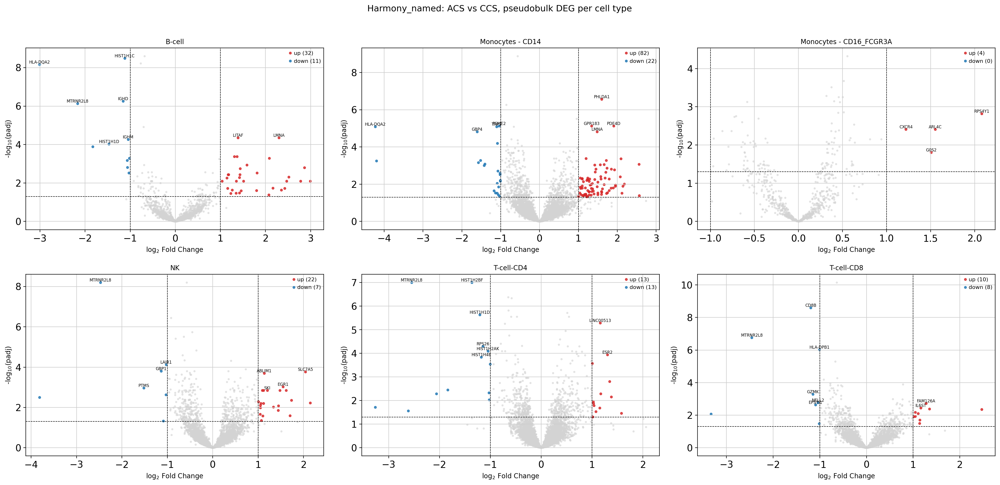

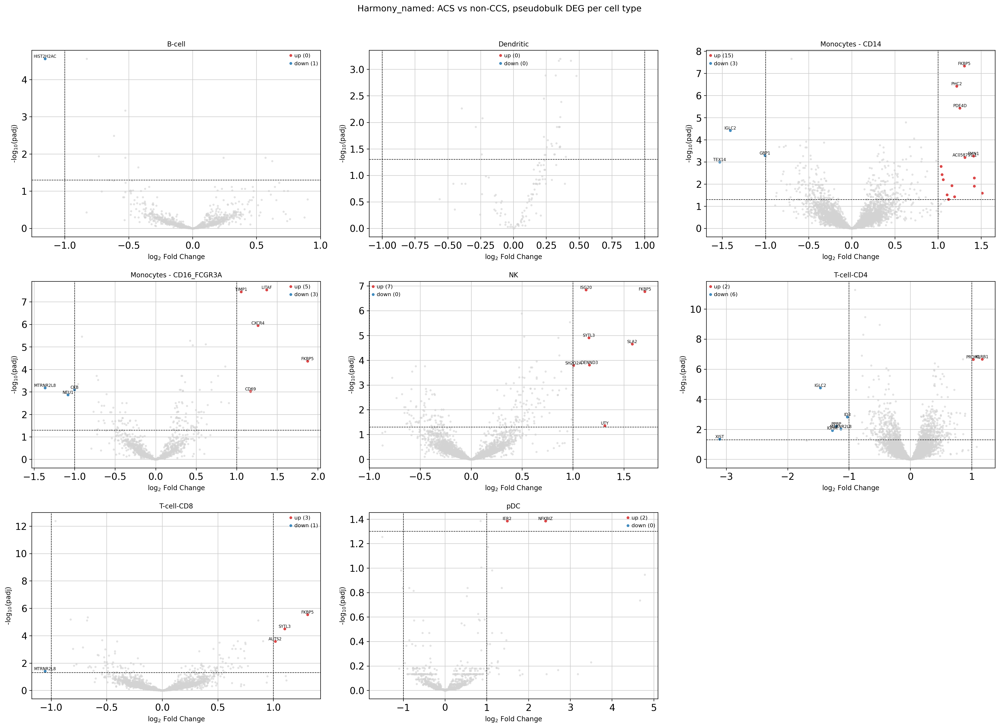

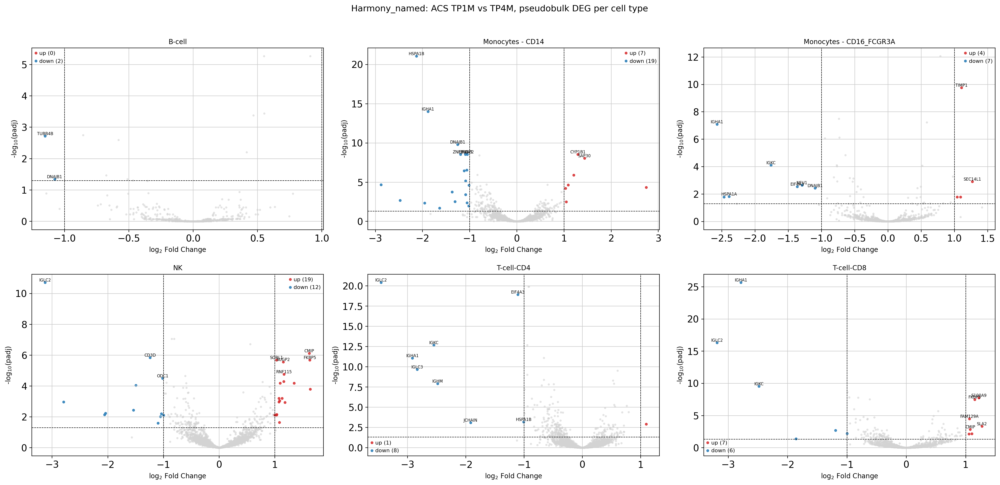

Harmony_named_ACS_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 224
cell_type
Monocytes - CD14           104
B-cell                      43
NK                          29
T-cell-CD4                  26
T-cell-CD8                  18
Monocytes - CD16_FCGR3A      4


Harmony_named_ACS_vs_nonCCS
Significant DEGs (padj<0.05, |LFC|>1.0): 48
cell_type
Monocytes - CD14           18
Monocytes - CD16_FCGR3A     8
T-cell-CD4                  8
NK                          7
T-cell-CD8                  4
pDC                         2
B-cell                      1


Harmony_named_ACS_TP1M_vs_TP4M
Significant DEGs (padj<0.05, |LFC|>1.0): 92
cell_type
NK                         31
Monocytes - CD14           26
T-cell-CD8                 13
Monocytes - CD16_FCGR3A    11
T-cell-CD4                  9
B-cell                      2


Harmony_named_ACS_TP1M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 100
cell_type
Monocytes - CD14           44
NK                         19
Monocytes - CD16_FCGR3A    14
T-cell-CD8                  9
T-cell-CD4                  7
B-cell                      5
Dendritic                   2


Harmony_named_ACS_TP2M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 143
cell_type
Monocytes - CD14           50
B-cell                     22
T-cell-CD8                 22
T-cell-CD4                 15
Monocytes - CD16_FCGR3A    15
NK                         10
Dendritic                   9


Harmony_named_ACS_TP3M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 34
cell_type
Monocytes - CD14           17
T-cell-CD4                  7
B-cell                      5
T-cell-CD8                  3
NK                          1
Monocytes - CD16_FCGR3A     1


Harmony_named_ACS_TP4M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 129
cell_type
Monocytes - CD14           66
T-cell-CD4                 14
B-cell                     13
Monocytes - CD16_FCGR3A    11
NK                         10
Dendritic                   9
T-cell-CD8                  6

Harmony_named, ACS vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,T-cell-CD8,CD8B,-1.20,2.52e-09,44.1
1,B-cell,HIST1H1C,-1.12,3.28e-09,24.0
2,NK,MTRNR2L8,-2.47,6.32e-09,43.0
3,B-cell,HLA-DQA2,-3.01,6.83e-09,9.3
4,T-cell-CD4,HIST1H2BF,-1.36,9.98e-08,10.0
5,T-cell-CD4,MTRNR2L8,-2.55,9.98e-08,197.9
6,T-cell-CD8,MTRNR2L8,-2.46,1.75e-07,47.3
7,Monocytes - CD14,PHLDA1,1.60,2.68e-07,62.6
8,B-cell,IGHD,-1.16,5.58e-07,61.8
9,B-cell,MTRNR2L8,-2.17,7.30e-07,28.5



Harmony_named, ACS vs Control, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,Monocytes - CD16_FCGR3A,LITAF,1.37,2.91e-08,22.0
1,Monocytes - CD16_FCGR3A,TIMP1,1.05,3.51e-08,218.6
2,Monocytes - CD14,FKBP5,1.30,4.57e-08,83.8
3,NK,ISG20,1.13,1.45e-07,56.3
4,NK,FKBP5,1.70,1.70e-07,20.8
5,T-cell-CD4,KLRB1,1.17,2.16e-07,357.0
6,T-cell-CD4,PRDM1,1.02,2.19e-07,60.8
7,Monocytes - CD14,PHC2,1.21,3.71e-07,30.9
8,Monocytes - CD16_FCGR3A,CXCR4,1.26,1.12e-06,44.6
9,T-cell-CD8,FKBP5,1.31,2.79e-06,32.7



Harmony_named, ACS TP1M vs TP4M, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,T-cell-CD8,IGHA1,-2.79,2.16e-26,72.2
1,Monocytes - CD14,HSPA1B,-2.13,8.82e-22,301.1
2,T-cell-CD4,IGLC2,-3.46,3.87e-21,110.2
3,T-cell-CD4,EIF4A3,-1.11,1.21e-19,331.6
4,T-cell-CD8,IGLC2,-3.19,4.85e-17,30.8
5,Monocytes - CD14,IGHA1,-1.89,1.01e-14,213.5
6,T-cell-CD4,IGKC,-2.55,2.13e-13,321.5
7,T-cell-CD4,IGHA1,-2.92,8.62e-12,254.7
8,NK,IGLC2,-3.13,1.93e-11,27.7
9,Monocytes - CD14,DNAJB1,-1.26,1.59e-10,385.1



Harmony_named, ACS TP1M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,T-cell-CD4,HIST1H4C,-1.12,2.40e-33,616.1
1,T-cell-CD4,LINC00513,1.52,2.88e-27,37.5
2,T-cell-CD4,HIST1H4E,-1.31,1.64e-21,31.4
3,T-cell-CD4,AC058791.1,1.20,3.22e-21,100.6
4,T-cell-CD8,HIST1H4C,-1.04,6.48e-14,104.6
5,T-cell-CD8,HIST2H2AC,-1.05,6.07e-12,34.3
6,NK,PTPN6,-1.15,4.29e-11,16.1
7,Monocytes - CD16_FCGR3A,CXCR4,1.47,2.90e-09,49.0
8,T-cell-CD4,HIST1H1D,-1.15,3.36e-09,213.5
9,Monocytes - CD14,PDE4D,1.58,8.70e-09,16.3



Harmony_named, ACS TP2M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,T-cell-CD4,HIST1H4C,-1.01,3.86e-55,600.6
1,T-cell-CD4,HIST1H4E,-1.24,1.07e-24,30.2
2,T-cell-CD4,AC058791.1,1.30,1.01e-21,108.4
3,T-cell-CD8,MAL,1.86,1.16e-19,15.3
4,Monocytes - CD14,HLA-DMB,-1.06,2.79e-19,71.0
5,Monocytes - CD16_FCGR3A,IL32,4.11,2.43e-16,11.0
6,Monocytes - CD14,PSMB10,-1.07,4.90e-15,28.0
7,T-cell-CD8,IL6ST,1.38,5.28e-13,19.1
8,T-cell-CD4,LINC00513,1.14,1.06e-12,31.9
9,T-cell-CD8,HLA-DPB1,-1.01,2.39e-12,65.3



Harmony_named, ACS TP3M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,T-cell-CD8,HLA-DPB1,-1.09,3.31e-09,50.5
1,T-cell-CD4,LINC00513,1.04,1.05e-07,31.3
2,NK,MTRNR2L8,-2.22,8.36e-07,51.0
3,T-cell-CD4,HIST1H2AK,-1.19,1.11e-06,13.3
4,B-cell,CREM,1.11,3.83e-05,19.7
5,T-cell-CD4,HIST1H1D,-1.03,6.29e-05,235.2
6,Monocytes - CD14,NKG7,1.57,1.13e-04,24.6
7,B-cell,RGCC,1.32,1.83e-04,16.3
8,T-cell-CD4,BCL3,1.14,3.80e-04,22.0
9,B-cell,TNFAIP3,1.01,4.71e-04,20.3



Harmony_named, ACS TP4M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,T-cell-CD4,IGKC,3.42,2.09e-36,246.6
1,T-cell-CD4,IGHG2,5.17,7.32e-30,13.1
2,T-cell-CD8,IGKC,3.89,1.41e-28,55.4
3,NK,IGKC,4.00,4.56e-27,52.5
4,T-cell-CD4,IGHA1,4.16,7.30e-27,191.1
5,T-cell-CD4,IGHM,3.17,1.60e-23,44.9
6,T-cell-CD8,IGHA1,4.14,4.60e-20,43.8
7,Monocytes - CD14,IGHA1,4.50,1.67e-19,61.8
8,Monocytes - CD14,IGKC,3.88,2.82e-18,77.3
9,NK,IGHA1,3.97,3.49e-18,37.4


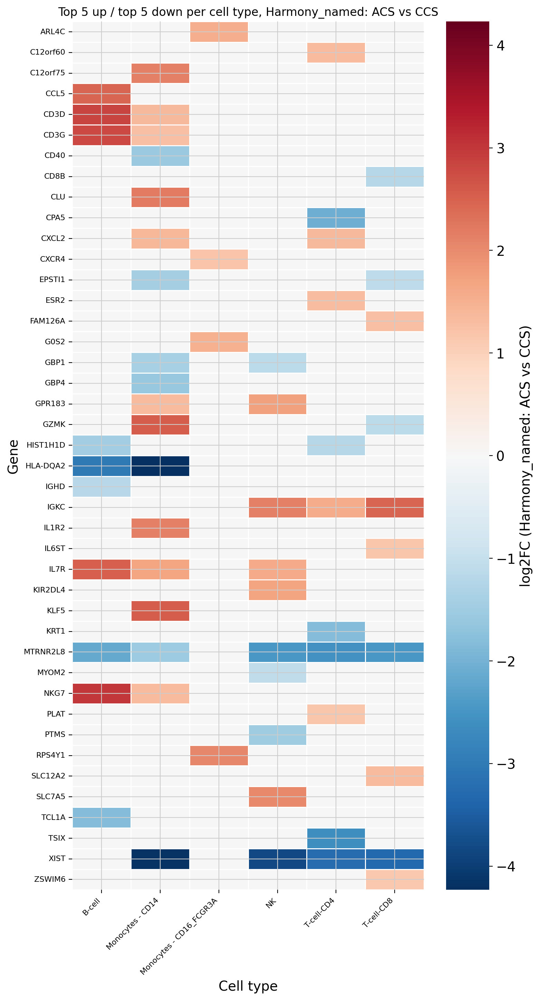

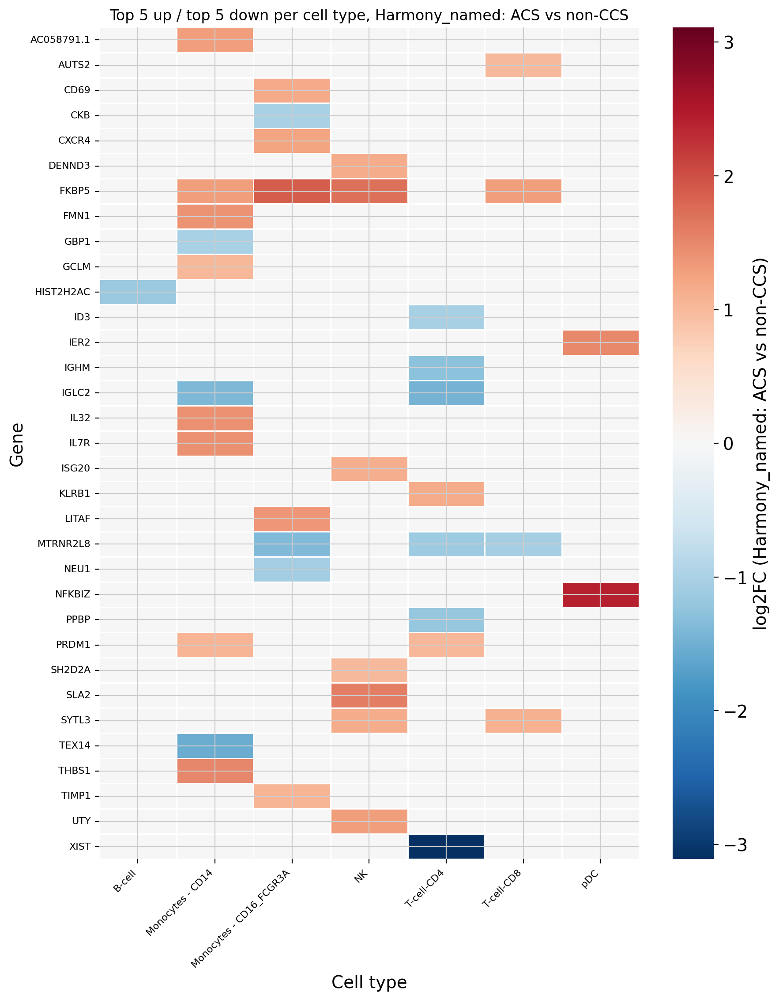

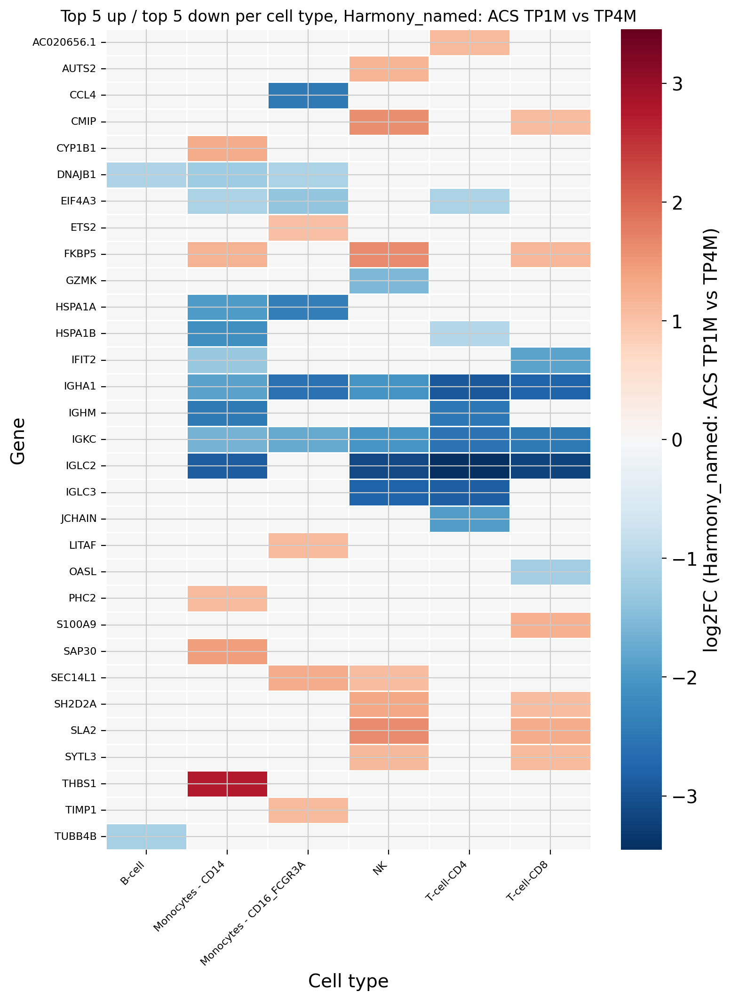



######################################################################
# DRVI_leiden  (cell_type_col = 'drvi_leiden')
######################################################################

DRVI_leiden: Comparison 1 — ACS (TP1M-TP4M) vs CCS


ACS sterile (all timepoints) vs CCS — 68,976 cells
condition
ACS_sterile    57056
CCS            11920
ACS patients: 19, CCS patients: 16



Pseudobulk samples: 931


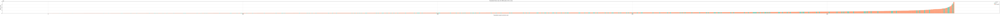

  0: ACS_sterile=62, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.02 seconds.



Fitting dispersions...


... done in 1.77 seconds.

Fitting dispersion trend curve...
... done in 0.13 seconds.

Fitting MAP dispersions...


... done in 2.32 seconds.

Fitting LFCs...


... done in 1.57 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.41 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       17.012267        0.090208  0.172568  0.522742  0.601154  0.783550
ISG15       55.950901       -0.290670  0.169548 -1.714379  0.086459  0.258829
TNFRSF18    13.111457       -0.591302  0.260976 -2.265732  0.023468  0.110723
SDF4        41.418872       -0.138914  0.127940 -1.085773  0.277579  0.518975
UBE2J2      18.447492       -0.146893  0.157335 -0.933631  0.350495  0.587491
...               ...             ...       ...       ...       ...       ...
MT-ND4L    128.623288        0.301416  0.145663  2.069273  0.038520  0.153678
MT-ND4    1402.884404        0.063644  0.082400  0.772375  0.439892  0.663864
MT-ND5     620.073266        0.240824  0.072454  3.323826  0.000888  0.011069
MT-ND6      74.601093        0.259768  0.128008  2.029303  0.042427  0.162072
MT-CYB    1876.528123        0.036751  0.087255  0.421190  0.673616  0.8282

Fitting dispersions...


... done in 1.20 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.71 seconds.

Fitting LFCs...


... done in 1.12 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.32 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L      11.345922       -0.085850  0.205220 -0.418332  6.757042e-01   
ISG15      61.518346       -0.147212  0.198560 -0.741397  4.584528e-01   
TNFRSF4    16.961770       -0.654837  0.210594 -3.109473  1.874215e-03   
SDF4       22.626461       -0.033900  0.140988 -0.240444  8.099864e-01   
UBE2J2     15.450577       -0.166016  0.166344 -0.998027  3.182664e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    82.580844        0.419384  0.147665  2.840107  4.509837e-03   
MT-ND4   1267.173773        0.047321  0.109675  0.431465  6.661306e-01   
MT-ND5    448.161881        0.309270  0.101255  3.054378  2.255279e-03   
MT-ND6     59.961432        0.593093  0.121008  4.901287  9.521060e-07   
MT-CYB   2021.769561       -0.118741  0.118537 -1.001729  3.164747e-01   

             padj  
NOC2L         NaN  
ISG1

Fitting dispersions...


... done in 0.66 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.97 seconds.

Fitting LFCs...


... done in 0.66 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.22 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       49.797543       -0.327691  0.243461 -1.345966  0.178313  0.493441
ISG15      44.049352       -0.941739  0.333413 -2.824541  0.004735  0.080173
SDF4        9.411840       -0.027445  0.278014 -0.098719  0.921361  0.982136
AURKAIP1   21.516956       -0.207834  0.220697 -0.941715  0.346338  0.656965
MRPL20     16.542500        0.208149  0.220801  0.942701  0.345834  0.656860
...              ...             ...       ...       ...       ...       ...
MT-ND4L    56.653334        0.435730  0.196991  2.211929  0.026972  0.188030
MT-ND4    637.775285        0.390191  0.135513  2.879367  0.003985  0.071947
MT-ND5    238.687273        0.414695  0.135683  3.056345  0.002241  0.050933
MT-ND6     21.501677        0.745402  0.263946  2.824066  0.004742  0.080173
MT-CYB    797.744260        0.000760  0.126425  0.006009  0.995206  0.999064

[2925 ro

Fitting dispersions...


... done in 0.24 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...


... done in 0.34 seconds.

Fitting LFCs...


... done in 0.21 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.08 seconds.

Fitting size factors...


Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15     10.501723        0.033499  0.334200  0.100237  0.920156  0.994209
MRPL20    10.098881       -0.222255  0.301426 -0.737345  0.460913  0.918147
SSU72     11.309529        0.048205  0.265797  0.181359  0.856086  0.984486
RPL22    289.182845        0.006817  0.086160  0.079116  0.936941  0.995151
PARK7     14.117992       -0.213461  0.241587 -0.883579  0.376924  0.878203
...             ...             ...       ...       ...       ...       ...
MT-ND4L   25.153657        0.539604  0.236634  2.280336  0.022588  0.347205
MT-ND4   388.434436        0.007260  0.151348  0.047969  0.961741  0.999366
MT-ND5   102.738272        0.396098  0.168166  2.355395  0.018503  0.324158
MT-ND6    13.315475        0.549689  0.254533  2.159599  0.030804  0.358204
MT-CYB   537.949726       -0.136744  0.149726 -0.913293  0.361088  0.867946

[911 rows x 6 column

... done in 0.00 seconds.



Fitting dispersions...


... done in 0.42 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.77 seconds.

Fitting LFCs...


... done in 0.48 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.15 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      22.567719        1.461237  1.118667  1.306231  0.191474  0.999248
SDF4        9.549107       -0.598343  0.847083 -0.706357  0.479966  0.999248
AURKAIP1   20.287642        0.640276  0.678680  0.943414  0.345469  0.999248
MRPL20     16.500035       -0.039551  0.666810 -0.059314  0.952702  0.999248
SSU72      17.342592       -0.189856  0.708114 -0.268115  0.788611  0.999248
...              ...             ...       ...       ...       ...       ...
MT-ND4L    47.847401        0.091022  0.476224  0.191134  0.848421  0.999248
MT-ND4    600.862582        0.197563  0.366770  0.538656  0.590124  0.999248
MT-ND5    205.977858        0.118476  0.320364  0.369818  0.711518  0.999248
MT-ND6     17.993281        0.348805  0.805898  0.432816  0.665149  0.999248
MT-CYB    682.714933       -0.150362  0.310111 -0.484864  0.627773  0.999248

[2578 ro

Fitting dispersions...


... done in 1.29 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...


... done in 1.70 seconds.

Fitting LFCs...


... done in 1.37 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.32 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       49.383202       -0.232333  0.452471 -0.513476  0.607618  0.862705
SDF4        21.484675       -0.287149  0.242378 -1.184713  0.236131  0.604489
UBE2J2      14.569199       -0.408945  0.269767 -1.515917  0.129540  0.461595
INTS11       8.093082        0.258919  0.441913  0.585904  0.557940       NaN
AURKAIP1    46.377489       -0.249756  0.173330 -1.440934  0.149603  0.499093
...               ...             ...       ...       ...       ...       ...
MT-ND4L    121.771663        0.529231  0.207776  2.547121  0.010862  0.136451
MT-ND4    1409.735090        0.337083  0.143685  2.345979  0.018977  0.180559
MT-ND5     400.996608        0.374654  0.132259  2.832729  0.004615  0.088392
MT-ND6      30.223146        0.537174  0.259316  2.071504  0.038312  0.254634
MT-CYB    1317.017400        0.092143  0.138948  0.663153  0.507233  0.8043

Fitting dispersions...


... done in 1.00 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 1.39 seconds.

Fitting LFCs...


... done in 0.96 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.28 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       7.982965        0.473696  0.251071  1.886699  0.059201       NaN
ISG15      35.931599       -0.385779  0.205841 -1.874162  0.060908  0.324089
TNFRSF4    13.204250       -0.273196  0.222837 -1.225989  0.220203       NaN
SDF4       16.656892       -0.022446  0.156846 -0.143112  0.886202       NaN
UBE2J2     11.182802       -0.211438  0.190056 -1.112507  0.265920       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    61.889092        0.435672  0.157521  2.765796  0.005678  0.111794
MT-ND4    909.427987        0.104193  0.102328  1.018226  0.308571  0.657029
MT-ND5    342.178802        0.384768  0.097709  3.937886  0.000082  0.009248
MT-ND6     43.004599        0.444437  0.138601  3.206591  0.001343  0.045011
MT-CYB   1490.919852       -0.066099  0.111769 -0.591395  0.554256  0.821217

[3765 ro

Fitting dispersions...


... done in 0.98 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 1.08 seconds.

Fitting LFCs...


... done in 0.80 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.23 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       19.933221       -0.207823  0.177642 -1.169897  0.242042  0.647953
SDF4         8.501918       -0.249679  0.192849 -1.294690  0.195427       NaN
AURKAIP1    16.049088       -0.354872  0.153564 -2.310906  0.020838  0.228262
CCNL2        8.499185       -0.148007  0.206931 -0.715250  0.474455       NaN
MRPL20      18.883007       -0.146664  0.150622 -0.973726  0.330193  0.726055
...               ...             ...       ...       ...       ...       ...
MT-ND4L     48.131603        0.439255  0.173442  2.532572  0.011323  0.173174
MT-ND4     694.557433        0.064158  0.115097  0.557420  0.577240  0.870413
MT-ND5     219.104912        0.248342  0.118514  2.095463  0.036130  0.289529
MT-ND6      26.820120        0.437722  0.161771  2.705806  0.006814  0.136292
MT-CYB    1020.955303       -0.169816  0.117301 -1.447693  0.147703  0.5509

Fitting dispersions...


... done in 0.84 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 1.02 seconds.

Fitting LFCs...


... done in 0.78 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.22 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      19.265953       -0.299624  0.222786 -1.344896  0.178659  0.578850
SDF4        7.860145       -0.112350  0.218707 -0.513699  0.607463  0.882835
AURKAIP1   13.765011       -0.121428  0.170491 -0.712226  0.476325  0.813352
CCNL2       7.443010       -0.171036  0.199737 -0.856304  0.391830  0.760579
MRPL20     16.820821       -0.114571  0.158543 -0.722651  0.469894  0.812111
...              ...             ...       ...       ...       ...       ...
MT-ND4L    42.353865        0.283072  0.173588  1.630713  0.102951  0.466288
MT-ND4    596.778329       -0.002074  0.113234 -0.018318  0.985385  0.996807
MT-ND5    183.882962        0.263611  0.108172  2.436967  0.014811  0.215549
MT-ND6     23.862765        0.549040  0.155804  3.523926  0.000425  0.032003
MT-CYB    881.467671       -0.172211  0.122987 -1.400233  0.161443  0.552808

[2867 ro

Fitting dispersions...


... done in 0.77 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 1.20 seconds.

Fitting LFCs...


... done in 0.75 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.23 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      16.429886       -0.418265  0.258424 -1.618526  0.105549  0.499041
SDF4        7.836910       -0.100504  0.210580 -0.477271  0.633169  0.896838
AURKAIP1   13.688550        0.089914  0.173541  0.518116  0.604377  0.878324
CCNL2       6.838414       -0.067198  0.214322 -0.313537  0.753873  0.938465
MRPL20     17.609829       -0.236075  0.157761 -1.496403  0.134549  0.546499
...              ...             ...       ...       ...       ...       ...
MT-ND4L    40.903129        0.216229  0.156586  1.380895  0.167311  0.593541
MT-ND4    587.185243       -0.002916  0.105442 -0.027652  0.977940  0.995163
MT-ND5    190.718839        0.291306  0.094364  3.087061  0.002021  0.101539
MT-ND6     27.450967        0.615681  0.151732  4.057678  0.000050  0.010671
MT-CYB    877.623765       -0.144047  0.108488 -1.327774  0.184253  0.612347

[2799 ro

Fitting dispersions...


... done in 1.14 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.40 seconds.

Fitting LFCs...


... done in 1.04 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.29 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      32.498438       -1.052390  0.390158 -2.697345  0.006989  0.068213
SDF4       13.859831       -0.273941  0.215838 -1.269194  0.204372  0.505430
UBE2J2      7.962023       -0.117247  0.296887 -0.394922  0.692900  0.877458
AURKAIP1   26.907895       -0.341808  0.164091 -2.083035  0.037248  0.196006
CCNL2       9.697329       -0.015083  0.244753 -0.061627  0.950860  0.981508
...              ...             ...       ...       ...       ...       ...
MT-ND4L    80.491089        0.306998  0.152122  2.018111  0.043580  0.215823
MT-ND4    882.197941        0.323493  0.120773  2.678519  0.007395  0.070290
MT-ND5    279.564812        0.305751  0.113788  2.687018  0.007209  0.069831
MT-ND6     16.783391        0.640178  0.262797  2.436011  0.014850  0.110959
MT-CYB    847.296714        0.178437  0.118304  1.508293  0.131480  0.398778

[3952 ro

Fitting dispersions...


... done in 0.85 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 1.14 seconds.

Fitting LFCs...


... done in 0.81 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.24 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      24.739338       -0.080468  0.247341 -0.325331  0.744931  0.933759
SDF4       10.605964       -0.126206  0.200020 -0.630968  0.528061  0.852369
UBE2J2      7.155804       -0.125270  0.220137 -0.569055  0.569319       NaN
AURKAIP1   17.167321       -0.175171  0.163894 -1.068805  0.285158  0.687025
CCNL2       7.730159        0.469764  0.247329  1.899348  0.057519  0.366818
...              ...             ...       ...       ...       ...       ...
MT-ND4L    49.402140        0.389392  0.152979  2.545398  0.010915  0.169807
MT-ND4    645.477826       -0.036201  0.117297 -0.308626  0.757606  0.936334
MT-ND5    252.865115        0.270537  0.107911  2.507041  0.012175  0.185981
MT-ND6     33.273895        0.408420  0.137783  2.964223  0.003034  0.093906
MT-CYB    994.241702       -0.220101  0.102690 -2.143358  0.032084  0.279120

[3056 ro

Fitting dispersions...


... done in 0.47 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.64 seconds.

Fitting LFCs...


... done in 0.42 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      11.395785        0.363072  0.372819  0.973856  0.330128  0.644388
AURKAIP1   11.245728        0.132275  0.219651  0.602206  0.547037  0.782282
MRPL20     10.568285       -0.084780  0.227489 -0.372676  0.709389  0.877931
SSU72      13.736819       -0.225947  0.193499 -1.167690  0.242932  0.549695
GNB1       14.543976        0.513412  0.223120  2.301055  0.021389  0.136273
...              ...             ...       ...       ...       ...       ...
MT-ND4L    42.471037        0.289184  0.154287  1.874327  0.060885  0.256726
MT-ND4    516.746350        0.031326  0.104746  0.299068  0.764888  0.901385
MT-ND5    161.065365        0.278439  0.107585  2.588078  0.009651  0.084950
MT-ND6     22.058140        0.261372  0.191295  1.366328  0.171836  0.461693
MT-CYB    635.812809       -0.015187  0.116078 -0.130834  0.895907  0.959114

[1733 ro

ACS sterile (TP1M) vs Control — 29,263 cells
condition2
ACS_sterile    14665
Control        14598



Pseudobulk samples: 399


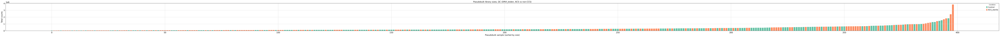

  0: ACS_sterile=16, Control=17 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.11 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 1.17 seconds.

Fitting LFCs...


... done in 0.79 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.24 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       14.314636        0.047676  0.139711  0.341251  0.732914  0.877840
ISG15       45.497818       -0.407033  0.126306 -3.222595  0.001270  0.027313
TNFRSF18    14.002057       -0.251146  0.316615 -0.793220  0.427649  0.705386
SDF4        34.058922        0.269336  0.115801  2.325864  0.020026  0.139765
UBE2J2      16.204364       -0.150575  0.133716 -1.126079  0.260132  0.562907
...               ...             ...       ...       ...       ...       ...
MT-ND4L    121.444931       -0.509890  0.116402 -4.380425  0.000012  0.001225
MT-ND4    1301.795037        0.007132  0.055429  0.128670  0.897619  0.959077
MT-ND5     581.441585       -0.000813  0.068253 -0.011918  0.990491  0.994613
MT-ND6      67.843905       -0.475898  0.148837 -3.197449  0.001386  0.028058
MT-CYB    1730.187599        0.053602  0.066430  0.806904  0.419722  0

Fitting dispersions...


... done in 0.84 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 0.90 seconds.

Fitting LFCs...


... done in 0.48 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.20 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       52.884563        0.020386  0.180687  0.112825  0.910169  0.960901
TNFRSF4     14.334596       -0.173628  0.220495 -0.787443  0.431023       NaN
SDF4        19.588149        0.085274  0.121421  0.702296  0.482495  0.736561
UBE2J2      13.354108        0.121404  0.152298  0.797150  0.425364       NaN
AURKAIP1    34.028248        0.116812  0.103559  1.127972  0.259332  0.540433
...               ...             ...       ...       ...       ...       ...
MT-ND4L     88.302382       -0.538384  0.133275 -4.039638  0.000054  0.003431
MT-ND4    1303.799123        0.019247  0.065503  0.293838  0.768882  0.895370
MT-ND5     465.576497       -0.041814  0.067270 -0.621582  0.534216  0.770728
MT-ND6      61.682035       -0.504119  0.129539 -3.891641  0.000100  0.004896
MT-CYB    2071.427558        0.099147  0.069069  1.435476  0.151152  0

Fitting dispersions...


... done in 0.63 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.69 seconds.

Fitting LFCs...


... done in 0.38 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       55.285963       -0.130740  0.168607 -0.775413  0.438096  0.761786
ISG15      49.718410       -0.253098  0.177643 -1.424751  0.154229  0.480908
SDF4       10.905721        0.142864  0.181075  0.788977  0.430125  0.757357
AURKAIP1   24.307281        0.067730  0.140189  0.483135  0.629000  0.869617
MRPL20     19.417616        0.137186  0.140134  0.978961  0.327599  0.688116
...              ...             ...       ...       ...       ...       ...
MT-ND4L    74.242532       -0.523331  0.181281 -2.886850  0.003891  0.072433
MT-ND4    796.989230        0.029297  0.092982  0.315085  0.752697  0.913488
MT-ND5    295.262436       -0.073930  0.102117 -0.723975  0.469081  0.784704
MT-ND6     27.793608       -0.403608  0.198780 -2.030425  0.042313  0.269014
MT-CYB    945.129308        0.240188  0.086224  2.785631  0.005342  0.086170

[26

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.23 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.25 seconds.

Fitting LFCs...
... done in 0.14 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.08 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     10.072935        0.366775  0.244232  1.501752  0.133161  0.584315
RPL22    263.157391        0.046101  0.058861  0.783216  0.433501  0.834581
PARK7     12.183896        0.263601  0.212639  1.239665  0.215099  0.661819
ENO1      11.751858       -0.014943  0.199021 -0.075083  0.940149  0.983452
PRDM2     11.564580        0.170529  0.242456  0.703340  0.481844  0.856936
...             ...             ...       ...       ...       ...       ...
MT-ND4L   29.846515       -0.387647  0.198790 -1.950031  0.051172  0.398779
MT-ND4   395.404687        0.035753  0.085995  0.415757  0.677588  0.916677
MT-ND5   115.494448        0.069272  0.129530  0.534794  0.592792  0.897657
MT-ND6    15.564250       -0.551500  0.273766 -2.014493  0.043958  0.390753
MT-CYB   558.359252        0.100191  0.097801  1.024438  0.305628  0.746263

[901 rows x 6 c

Fitting dispersions...


... done in 0.42 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.46 seconds.

Fitting LFCs...


... done in 0.26 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      16.194082        0.496060  0.445238  1.114145  0.265217  0.625387
AURKAIP1   19.080136        0.068199  0.206590  0.330119  0.741310  0.895223
MRPL20     15.861507       -0.283482  0.222788 -1.272426  0.203222  0.568572
SSU72      15.653663        0.050629  0.230862  0.219302  0.826415  0.926691
GNB1       29.500348       -0.131658  0.177320 -0.742487  0.457793  0.779135
...              ...             ...       ...       ...       ...       ...
MT-ND4L    54.441409       -0.634744  0.154279 -4.114263  0.000039  0.004677
MT-ND4    674.182321        0.158682  0.101091  1.569698  0.116485  0.443824
MT-ND5    224.004247        0.014009  0.109366  0.128097  0.898072  0.963622
MT-ND6     19.110394       -0.726100  0.241962 -3.000877  0.002692  0.068962
MT-CYB    710.134731        0.388770  0.110309  3.524366  0.000424  0.026003

[18

Fitting dispersions...
... done in 0.17 seconds.

Fitting dispersion trend curve...


... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.22 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.06 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
RPL22    182.620109       -0.083233  0.161771 -0.514510  0.606896  0.993969
PARK7     12.936793        0.135541  0.400154  0.338721  0.734820  0.999569
ENO1      11.359786       -0.186123  0.420405 -0.442724  0.657965  0.997306
PRDM2      9.414558        0.165862  0.501372  0.330817  0.740782  0.999569
EFHD2     10.518424        0.558152  0.571659  0.976372  0.328880  0.993969
...             ...             ...       ...       ...       ...       ...
MT-ND3   448.871593       -0.494837  0.186401 -2.654700  0.007938  0.376817
MT-ND4L   17.842230       -0.729020  0.372064 -1.959392  0.050067  0.673399
MT-ND4   270.691842        0.054485  0.124663  0.437060  0.662068  0.997863
MT-ND5    94.668728       -0.025557  0.219949 -0.116196  0.907497  0.999569
MT-CYB   383.627056        0.171027  0.121379  1.409034  0.158825  0.905719

[807 rows x 6 c

Fitting dispersions...


... done in 0.24 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.27 seconds.

Fitting LFCs...
... done in 0.17 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.08 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
GNB1      17.736130       -0.378880  0.394300 -0.960892  0.336606  0.881759
RER1       9.934195        0.151467  0.504619  0.300161  0.764054  0.968903
RPL22    142.449107       -0.269999  0.167447 -1.612448  0.106864  0.797888
PARK7     54.464076       -0.121819  0.230177 -0.529240  0.596639  0.949563
ENO1      11.584466        0.407746  0.479110  0.851049  0.394742  0.911482
...             ...             ...       ...       ...       ...       ...
MT-ND4L   21.924317       -0.006988  0.349753 -0.019979  0.984060  0.999407
MT-ND4   297.460608        0.429448  0.156434  2.745233  0.006047  0.441213
MT-ND5   122.264642        0.249315  0.172149  1.448252  0.147547  0.797888
MT-ND6     9.330004       -0.070083  0.514875 -0.136116  0.891730  0.997509
MT-CYB   284.719532        0.405888  0.155052  2.617763  0.008851  0.441213

[1173 rows x 6 

Fitting dispersions...


... done in 1.22 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.48 seconds.

Fitting LFCs...


... done in 0.71 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.27 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       42.890186       -0.173424  0.220099 -0.787938  0.430733  0.710658
SDF4        22.370291       -0.009445  0.144785 -0.065234  0.947988  0.981381
UBE2J2      17.350445       -0.308710  0.139741 -2.209156  0.027164  0.173842
INTS11       8.927516       -0.127570  0.187483 -0.680433  0.496230       NaN
AURKAIP1    48.349299       -0.070484  0.092203 -0.764443  0.444603  0.718314
...               ...             ...       ...       ...       ...       ...
MT-ND4L    178.602473       -0.625096  0.161565 -3.869007  0.000109  0.007065
MT-ND4    1797.538125        0.008883  0.071318  0.124552  0.900878  0.966952
MT-ND5     515.361359       -0.118987  0.092659 -1.284148  0.199090  0.488251
MT-ND6      35.165468       -0.393106  0.145077 -2.709633  0.006736  0.080108
MT-CYB    1556.695407        0.281676  0.064221  4.386047  0.000012  0

Fitting dispersions...


... done in 0.72 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.73 seconds.

Fitting LFCs...


... done in 0.40 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       29.730562       -0.151578  0.182910 -0.828700  0.407274  0.698941
TNFRSF4     11.118542       -0.229759  0.234216 -0.980968  0.326608       NaN
SDF4        15.115366        0.033683  0.134050  0.251269  0.801606  0.922254
UBE2J2       9.632599       -0.026357  0.184553 -0.142816  0.886435       NaN
AURKAIP1    22.614070       -0.059515  0.113630 -0.523762  0.600444  0.822771
...               ...             ...       ...       ...       ...       ...
MT-ND4L     62.818100       -0.514634  0.145719 -3.531686  0.000413  0.017132
MT-ND4     884.581129        0.034142  0.059262  0.576111  0.564540  0.804578
MT-ND5     344.113025       -0.106826  0.074875 -1.426713  0.153663  0.449469
MT-ND6      47.240209       -0.585561  0.144021 -4.065819  0.000048  0.005230
MT-CYB    1487.331935        0.059362  0.077013  0.770803  0.440824  0

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.71 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.74 seconds.

Fitting LFCs...


... done in 0.42 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.17 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       23.476507       -0.127236  0.185126 -0.687295  0.491897  0.819782
SDF4         8.374673       -0.051268  0.195843 -0.261779  0.793492  0.941665
UBE2J2       7.695063        0.054113  0.183884  0.294276  0.768547  0.931915
AURKAIP1    17.820261       -0.076215  0.133533 -0.570759  0.568163  0.856914
CCNL2        9.195002        0.014601  0.172185  0.084797  0.932423  0.980130
...               ...             ...       ...       ...       ...       ...
MT-ND4L     66.278979       -0.277964  0.155172 -1.791328  0.073241  0.454566
MT-ND4     877.105025        0.039700  0.071567  0.554727  0.579082  0.865790
MT-ND5     272.088427       -0.063068  0.089277 -0.706426  0.479923  0.816270
MT-ND6      34.787151       -0.509644  0.209057 -2.437823  0.014776  0.217375
MT-CYB    1304.315788        0.072574  0.083530  0.868845  0.384932  0

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.54 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.56 seconds.

Fitting LFCs...


... done in 0.70 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       19.887050        0.138256  0.241272  0.573027  0.566626  0.822589
AURKAIP1    14.533709        0.055639  0.139898  0.397708  0.690846       NaN
MRPL20      17.272451       -0.211485  0.140151 -1.508983  0.131303       NaN
SSU72       22.938821        0.194190  0.149113  1.302300  0.192814  0.482951
GNB1        15.841803       -0.188720  0.140187 -1.346203  0.178237       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND4L     52.394716       -0.441828  0.156311 -2.826596  0.004705  0.049810
MT-ND4     729.483029        0.030816  0.073053  0.421837  0.673144  0.882838
MT-ND5     227.049444       -0.117216  0.087985 -1.332227  0.182786  0.474529
MT-ND6      29.384658       -0.545438  0.182167 -2.994161  0.002752  0.041094
MT-CYB    1088.444300        0.103224  0.088348  1.168382  0.242653  0

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.58 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.59 seconds.

Fitting LFCs...


... done in 0.33 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       19.038781       -0.582566  0.232799 -2.502444  0.012334  0.174254
AURKAIP1    15.339527        0.157328  0.142886  1.101073  0.270865  0.637796
MRPL20      17.418979        0.082125  0.158810  0.517127  0.605067  0.857181
SSU72       23.657856        0.201409  0.138224  1.457122  0.145083  0.524981
GNB1        18.875477       -0.211284  0.149360 -1.414592  0.157188  0.539018
...               ...             ...       ...       ...       ...       ...
MT-ND4L     61.313480       -0.404926  0.137784 -2.938848  0.003294  0.084454
MT-ND4     751.355016        0.074552  0.066206  1.126062  0.260139  0.627173
MT-ND5     246.050418       -0.002532  0.073877 -0.034272  0.972660  0.989678
MT-ND6      37.393255       -0.484024  0.154772 -3.127335  0.001764  0.064900
MT-CYB    1129.686029        0.109179  0.079421  1.374690  0.169228  0

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.65 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.69 seconds.

Fitting LFCs...


... done in 0.39 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      26.629997       -0.129416  0.346140 -0.373882  0.708492  0.876813
SDF4       12.708011        0.096234  0.170847  0.563274  0.573248       NaN
AURKAIP1   25.709735        0.040433  0.115895  0.348871  0.727186  0.887927
MRPL20     20.268926       -0.115175  0.146705 -0.785074  0.432410  0.720917
SSU72      24.482990       -0.094942  0.134732 -0.704675  0.481012  0.761489
...              ...             ...       ...       ...       ...       ...
MT-ND4L    96.164507       -0.547479  0.138087 -3.964736  0.000073  0.003261
MT-ND4    987.715266        0.089566  0.075879  1.180372  0.237852  0.539526
MT-ND5    306.518499       -0.031924  0.092182 -0.346312  0.729108  0.887927
MT-ND6     18.113520       -0.422967  0.219892 -1.923522  0.054414  0.246570
MT-CYB    897.902230        0.290123  0.081190  3.573391  0.000352  0.008712

[26

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.38 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...


... done in 0.41 seconds.

Fitting LFCs...


... done in 0.23 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...
... done in 0.11 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      19.699782        0.010969  0.222494  0.049302  0.960679  0.992291
AURKAIP1   14.419759        0.339477  0.152982  2.219073  0.026482  0.197341
MRPL20     14.956031       -0.205217  0.154431 -1.328859  0.183895  0.495014
SSU72      18.478461        0.108792  0.142484  0.763536  0.445144  0.751890
GNB1       17.210938       -0.119348  0.151314 -0.788745  0.430261  0.738403
...              ...             ...       ...       ...       ...       ...
MT-ND4L    48.031875       -0.469247  0.137038 -3.424220  0.000617  0.029045
MT-ND4    599.676530       -0.011159  0.069967 -0.159495  0.873279  0.972030
MT-ND5    238.071244       -0.005583  0.083579 -0.066805  0.946737  0.992102
MT-ND6     31.735252       -0.346261  0.168883 -2.050298  0.040335  0.250954
MT-CYB    932.031807        0.015790  0.078648  0.200773  0.840876  0.959443

[14

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.31 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.36 seconds.

Fitting LFCs...
... done in 0.19 seconds.

Calculating cook's distance...


... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AURKAIP1   11.640988       -0.012238  0.193098 -0.063376  0.949467  0.993214
SSU72      12.548323       -0.044003  0.166926 -0.263609  0.792081  0.939005
GNB1       13.850203       -0.084396  0.188368 -0.448038  0.654126  0.893731
TNFRSF14   10.638119       -0.148610  0.177399 -0.837716  0.402190  0.756362
RPL22     285.976251        0.040731  0.062221  0.654618  0.512714  0.824917
...              ...             ...       ...       ...       ...       ...
MT-ND4L    47.430452       -0.531652  0.166459 -3.193888  0.001404  0.063739
MT-ND4    538.407040        0.008600  0.058278  0.147565  0.882686  0.979342
MT-ND5    171.777248       -0.063570  0.084399 -0.753207  0.451326  0.786027
MT-ND6     23.654427       -0.467192  0.163988 -2.848944  0.004386  0.114421
MT-CYB    691.565432        0.144185  0.074052  1.947066  0.051527  0.348806

[12

ACS sterile TP1M vs TP4M — 26,074 cells
timepoint
TP1M    14665
TP4M    11409

Patients: 19



Pseudobulk samples: 327


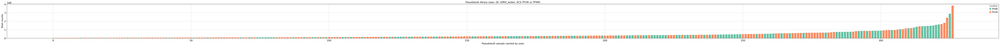

  0: 8 paired patients
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.80 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.14 seconds.

Fitting LFCs...


... done in 0.88 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.31 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       22.487699       -0.052138  0.219995 -0.236998  0.812658  0.937567
ISG15       79.406048       -0.629112  0.211815 -2.970096  0.002977  0.055531
TNFRSF18    20.730068        0.419097  0.286418  1.463238  0.143402  0.461208
SDF4        55.891896        0.326218  0.174768  1.866581  0.061960  0.310996
UBE2J2      24.467204       -0.116869  0.199479 -0.585870  0.557963  0.821577
...               ...             ...       ...       ...       ...       ...
MT-ND4L    185.345931       -0.414322  0.176099 -2.352781  0.018634  0.166636
MT-ND4    1882.619237        0.298246  0.092145  3.236687  0.001209  0.029475
MT-ND5     849.897206        0.299909  0.081997  3.657560  0.000255  0.009103
MT-ND6     106.953475       -0.385602  0.161915 -2.381511  0.017242  0.160206
MT-CYB    2745.056488        0.132033  0.074321  1.776510  0.075649  0.341000

[5

Fitting dispersions...


... done in 0.92 seconds.

Fitting dispersion trend curve...
... done in 0.13 seconds.

Fitting MAP dispersions...


... done in 1.11 seconds.

Fitting LFCs...


... done in 0.93 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.27 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L       14.719449        0.198484  0.262472  0.756211  4.495229e-01   
ISG15      111.352037       -0.325830  0.198995 -1.637378  1.015514e-01   
TNFRSF18    11.967835       -0.078029  0.267220 -0.292002  7.702852e-01   
TNFRSF4     26.077788       -0.177128  0.201672 -0.878294  3.797843e-01   
SDF4        32.426563       -0.094699  0.177842 -0.532489  5.943877e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L    133.736250       -0.238483  0.138481 -1.722129  8.504618e-02   
MT-ND4    1921.296453        0.448888  0.085790  5.232413  1.673111e-07   
MT-ND5     694.216207        0.474217  0.082868  5.722581  1.049176e-08   
MT-ND6      91.101746       -0.239253  0.125883 -1.900591  5.735558e-02   
MT-CYB    3281.150485        0.380816  0.068747  5.539389  3.035287e-08   

              padj  
NOC2L          Na

Fitting dispersions...


... done in 0.33 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.46 seconds.

Fitting LFCs...


... done in 0.34 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.12 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       53.655999       -0.572370  0.251348 -2.277205  0.022774  0.303000
ISG15      63.187081       -0.628990  0.401684 -1.565884  0.117376  0.663094
AURKAIP1   21.981201        0.188382  0.319141  0.590277  0.555005  0.952795
MRPL20     18.866409        0.237501  0.314578  0.754984  0.450259  0.929305
SSU72      24.653256       -0.023115  0.286193 -0.080768  0.935626  0.986529
...              ...             ...       ...       ...       ...       ...
MT-ND4L    59.952968       -0.451999  0.226201 -1.998219  0.045693  0.434968
MT-ND4    710.858440        0.510461  0.181592  2.811025  0.004938  0.141149
MT-ND5    263.747884        0.295018  0.166770  1.769016  0.076891  0.545607
MT-ND6     23.984747       -0.083764  0.319970 -0.261788  0.793485  0.977764
MT-CYB    943.320280        0.218101  0.166128  1.312848  0.189234  0.769131

[1971 rows x 6

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.16 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...


... done in 0.19 seconds.

Fitting LFCs...
... done in 0.15 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.07 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     13.895623       -0.117950  0.517002 -0.228143  0.819535       NaN
RPL22    377.312441        0.001656  0.141352  0.011717  0.990652  0.995620
PARK7     18.362580        0.228656  0.454580  0.503005  0.614961       NaN
ENO1      18.224732       -0.265480  0.461396 -0.575384  0.565032       NaN
PRDM2     17.659484        0.444774  0.469328  0.947684  0.343291       NaN
...             ...             ...       ...       ...       ...       ...
MT-ND4L   37.506311       -0.201538  0.360764 -0.558643  0.576406  0.995620
MT-ND4   496.465869        0.372448  0.139065  2.678228  0.007401  0.237778
MT-ND5   146.827400        0.634656  0.182010  3.486919  0.000489  0.031455
MT-ND6    19.924430       -0.046698  0.429748 -0.108663  0.913470  0.995620
MT-CYB   709.902088        0.281897  0.121276  2.324429  0.020103  0.414112

[842 rows x 6 columns]
  1

Fitting dispersions...


... done in 0.38 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.53 seconds.

Fitting LFCs...


... done in 0.43 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.17 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      45.593073       -0.888057  1.058954 -0.838617  0.401684  0.998702
SDF4       10.441539        0.036115  0.706743  0.051101  0.959245  0.998702
AURKAIP1   22.255963       -0.238374  0.521658 -0.456954  0.647704  0.998702
MRPL20     20.563131       -0.482884  0.529760 -0.911515  0.362024  0.998702
SSU72      20.270739        0.229722  0.524663  0.437846  0.661498  0.998702
...              ...             ...       ...       ...       ...       ...
MT-ND4L    52.572382       -0.433103  0.366538 -1.181606  0.237362  0.998702
MT-ND4    714.228329        0.531403  0.209221  2.539914  0.011088  0.998702
MT-ND5    259.406562        0.402703  0.239282  1.682961  0.092383  0.998702
MT-ND6     21.410508       -0.459097  0.525130 -0.874253  0.381980  0.998702
MT-CYB    861.433677        0.415926  0.203261  2.046268  0.040730  0.998702

[2642 rows x 6

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.86 seconds.

Fitting dispersion trend curve...
... done in 0.13 seconds.

Fitting MAP dispersions...


... done in 1.10 seconds.

Fitting LFCs...


... done in 0.88 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.



Running Wald tests...


... done in 0.27 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      87.848857       -1.212689  0.476213 -2.546528  0.010880  0.177969
SDF4       32.530514       -0.077155  0.256972 -0.300247  0.763989  0.959458
UBE2J2     20.351398        0.104957  0.298281  0.351874  0.724933  0.947845
ACAP3      10.230021       -0.100252  0.394248 -0.254286  0.799275       NaN
INTS11     10.406597       -0.231453  0.390749 -0.592330  0.553630       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L   179.830484       -0.211782  0.158058 -1.339901  0.180277  0.655962
MT-ND4   2136.824502        0.480246  0.137491  3.492929  0.000478  0.021899
MT-ND5    598.442681        0.341811  0.127808  2.674396  0.007486  0.148973
MT-ND6     40.428048       -0.001707  0.221324 -0.007712  0.993847  0.998468
MT-CYB   2038.032563        0.446997  0.124659  3.585756  0.000336  0.017940

[5135 rows x 6

Fitting dispersions...


... done in 0.55 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.72 seconds.

Fitting LFCs...


... done in 0.56 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       49.880658       -0.408141  0.241339 -1.691157  0.090807  0.531660
TNFRSF4     17.021817       -0.275533  0.245152 -1.123927  0.261044       NaN
SDF4        22.276823        0.043827  0.198202  0.221122  0.824997  0.973193
UBE2J2      15.578133        0.080570  0.241044  0.334255  0.738187       NaN
AURKAIP1    34.682210       -0.011166  0.173463 -0.064370  0.948675  0.988006
...               ...             ...       ...       ...       ...       ...
MT-ND4L     82.977263       -0.307819  0.185498 -1.659413  0.097033  0.552650
MT-ND4    1167.940087        0.357222  0.073308  4.872868  0.000001  0.000150
MT-ND5     454.248662        0.326424  0.083196  3.923545  0.000087  0.005791
MT-ND6      58.206186       -0.075554  0.134285 -0.562634  0.573684  0.901419
MT-CYB    2037.690040        0.323536  0.066818  4.842029  0.000001  0.000165

[3

Fitting dispersions...


... done in 0.58 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.76 seconds.

Fitting LFCs...


... done in 0.63 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.18 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       25.001178       -0.436891  0.220984 -1.977025  4.803879e-02   
SDF4         9.758511       -0.036726  0.324288 -0.113252  9.098311e-01   
UBE2J2       7.187862        0.029774  0.371084  0.080235  9.360507e-01   
AURKAIP1    18.466828       -0.161288  0.250957 -0.642692  5.204240e-01   
CCNL2        9.745915       -0.206632  0.323375 -0.638986  5.228320e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L     60.195271        0.001319  0.152551  0.008645  9.931026e-01   
MT-ND4     752.014314        0.409410  0.107967  3.791984  1.494483e-04   
MT-ND5     243.521623        0.315494  0.135755  2.323994  2.012581e-02   
MT-ND6      31.624966       -0.261891  0.240855 -1.087336  2.768882e-01   
MT-CYB    1171.368545        0.393468  0.076255  5.159886  2.471006e-07   

              padj  
ISG15     0.31393

Fitting dispersions...


... done in 0.41 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 0.58 seconds.

Fitting LFCs...


... done in 0.45 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       23.073002       -0.577990  0.256160 -2.256365  2.404777e-02   
AURKAIP1    15.624112       -0.120956  0.272570 -0.443763  6.572138e-01   
MRPL20      18.797987       -0.352628  0.254441 -1.385894  1.657794e-01   
SSU72       25.586589        0.167433  0.238460  0.702144  4.825891e-01   
GNB1        20.134794       -0.123104  0.248692 -0.495005  6.205967e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L     55.605723       -0.202056  0.217663 -0.928295  3.532546e-01   
MT-ND4     684.077682        0.510281  0.079662  6.405543  1.498352e-10   
MT-ND5     212.706969        0.389666  0.091978  4.236526  2.270045e-05   
MT-ND6      26.732563       -0.051048  0.206388 -0.247340  8.046454e-01   
MT-CYB    1062.097112        0.459525  0.073985  6.211089  5.261869e-10   

                  padj  
ISG15     1.7

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.46 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 0.55 seconds.

Fitting LFCs...


... done in 0.51 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       24.268339       -0.781602  0.379100 -2.061730  0.039233  0.338317
SDF4         8.905998       -0.247256  0.367579 -0.672661  0.501163       NaN
UBE2J2       8.839735        0.264462  0.350133  0.755319  0.450058       NaN
AURKAIP1    15.852494       -0.042940  0.287552 -0.149329  0.881294       NaN
MRPL20      20.433171       -0.213560  0.264420 -0.807656  0.419289  0.886241
...               ...             ...       ...       ...       ...       ...
MT-ND4L     52.926182       -0.143672  0.187019 -0.768221  0.442356  0.890855
MT-ND4     691.411535        0.397491  0.082567  4.814140  0.000001  0.000160
MT-ND5     248.009237        0.336536  0.097485  3.452170  0.000556  0.022234
MT-ND6      36.061659        0.074593  0.229615  0.324862  0.745285  0.962748
MT-CYB    1104.571416        0.300512  0.068910  4.360922  0.000013  0.001284

[2

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.65 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...


... done in 1.04 seconds.

Fitting LFCs...


... done in 0.71 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.23 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       53.281546       -0.617769  0.306041 -2.018586  0.043530  0.412422
SDF4        16.730184       -0.169058  0.327944 -0.515508  0.606198       NaN
AURKAIP1    36.861998       -0.110912  0.231299 -0.479517  0.631571  0.960391
CCNL2       12.105908       -0.083543  0.372425 -0.224323  0.822506       NaN
MRPL20      25.054605       -0.156483  0.290229 -0.539169  0.589770  0.952602
...               ...             ...       ...       ...       ...       ...
MT-ND4L     99.185423       -0.314099  0.183017 -1.716225  0.086121  0.537421
MT-ND4    1130.022910        0.445836  0.132290  3.370136  0.000751  0.034560
MT-ND5     379.756680        0.276864  0.139207  1.988867  0.046716  0.418785
MT-ND6      18.854482       -0.457837  0.310101 -1.476415  0.139833       NaN
MT-CYB    1159.375053        0.401646  0.141323  2.842043  0.004483  0.112444

[4

Fitting dispersions...


... done in 0.51 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.67 seconds.

Fitting LFCs...


... done in 0.57 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.18 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       39.417199       -0.471307  0.260243 -1.811028  0.070137  0.307138
SDF4        12.475860       -0.053944  0.296181 -0.182131  0.855480       NaN
UBE2J2       9.566520       -0.223537  0.318917 -0.700926  0.483349       NaN
AURKAIP1    19.891390       -0.066576  0.235755 -0.282394  0.777641       NaN
CCNL2        9.470395        0.202476  0.342349  0.591433  0.554230       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND4L     64.761552       -0.174611  0.148019 -1.179655  0.238138  0.576019
MT-ND4     781.782492        0.398728  0.108464  3.676150  0.000237  0.008103
MT-ND5     316.076806        0.429121  0.119028  3.605209  0.000312  0.009193
MT-ND6      42.169772       -0.012308  0.174620 -0.070483  0.943809  0.985110
MT-CYB    1292.011567        0.283248  0.083689  3.384523  0.000713  0.017338

[3

Fitting dispersions...
... done in 0.19 seconds.

Fitting dispersion trend curve...


... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.29 seconds.

Fitting LFCs...


... done in 0.21 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     11.916250       -0.139150  0.398573 -0.349119  0.727000       NaN
GNB1      13.176443        0.271661  0.361244  0.752014  0.452043       NaN
RPL22    303.185706       -0.088891  0.097222 -0.914313  0.360552  0.643225
PARK7     21.334088       -0.056753  0.289590 -0.195978  0.844627       NaN
ENO1      16.008243       -0.163259  0.328689 -0.496696  0.619404       NaN
...             ...             ...       ...       ...       ...       ...
MT-ND4L   42.775249       -0.387659  0.234612 -1.652341  0.098465       NaN
MT-ND4   474.042613        0.269879  0.108328  2.491310  0.012727  0.094606
MT-ND5   151.173357        0.298342  0.134434  2.219248  0.026470  0.151353
MT-ND6    21.489206       -0.123012  0.281650 -0.436755  0.662289       NaN
MT-CYB   628.383761        0.417814  0.092137  4.534707  0.000006  0.000322

[1088 rows x 6 columns]

D

ACS sterile (TP1M) vs CCS -- 26,585 cells
condition
ACS_sterile    14665
CCS            11920



Pseudobulk samples: 379


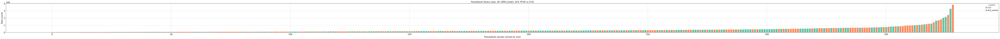

  0: ACS_sterile=16, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.13 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 1.19 seconds.

Fitting LFCs...


... done in 0.63 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.25 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       15.207494        0.012922  0.142620  0.090603  0.927808  0.962181
ISG15       45.303151       -0.295458  0.126432 -2.336897  0.019445  0.071780
TNFRSF18    12.708441        0.130911  0.288383  0.453949  0.649865  0.791956
SDF4        39.686624       -0.027174  0.112455 -0.241642  0.809057  0.892722
UBE2J2      16.107174       -0.122212  0.132890 -0.919647  0.357757  0.550127
...               ...             ...       ...       ...       ...       ...
MT-ND4L    101.434700        0.059412  0.116962  0.507957  0.611484  0.762882
MT-ND4    1262.940854        0.206763  0.061233  3.376684  0.000734  0.006096
MT-ND5     542.932450        0.321882  0.067952  4.736909  0.000002  0.000059
MT-ND6      56.577467        0.041853  0.118890  0.352029  0.724816  0.845556
MT-CYB    1737.411790        0.150556  0.079557  1.892441  0.058432  0.1572

Fitting dispersions...


... done in 0.83 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.89 seconds.

Fitting LFCs...


... done in 0.47 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       53.215610       -0.030821  0.188244 -0.163732  8.699423e-01   
TNFRSF4     16.024545       -0.398258  0.192958 -2.063967  3.902086e-02   
SDF4        20.331012       -0.044882  0.117560 -0.381778  7.026264e-01   
UBE2J2      13.872019       -0.093433  0.146555 -0.637526  5.237825e-01   
AURKAIP1    35.915492       -0.002942  0.096525 -0.030475  9.756881e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L     65.924794        0.252204  0.114676  2.199277  2.785825e-02   
MT-ND4    1185.385795        0.294448  0.064224  4.584672  4.547007e-06   
MT-ND5     398.182515        0.445706  0.068591  6.498026  8.138056e-11   
MT-ND6      45.750491        0.394444  0.102855  3.834959  1.255854e-04   
MT-CYB    2014.994000        0.175576  0.074640  2.352288  1.865833e-02   

                  padj  
ISG15  

  10: ACS_sterile=12, CCS=11 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.60 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.63 seconds.

Fitting LFCs...


... done in 0.36 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
HES4        56.696132       -0.053516  0.179550 -0.298058  7.656586e-01   
ISG15       49.832558       -0.122765  0.238919 -0.513838  6.073655e-01   
SDF4        11.548462        0.061780  0.185194  0.333598  7.386832e-01   
AURKAIP1    26.698195       -0.060415  0.147557 -0.409438  6.822182e-01   
MRPL20      19.043443        0.292117  0.165481  1.765262  7.751976e-02   
...               ...             ...       ...       ...           ...   
MT-ND4L     60.878986        0.164930  0.136661  1.206852  2.274890e-01   
MT-ND4     750.535905        0.430649  0.081957  5.254576  1.483661e-07   
MT-ND5     272.909618        0.358659  0.090028  3.983854  6.780666e-05   
MT-ND6      21.887734        0.406764  0.152823  2.661661  7.775604e-03   
MT-CYB    1026.103801        0.208327  0.095184  2.188670  2.862084e-02   

              padj  
HES4      0

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.21 seconds.

Fitting LFCs...
... done in 0.12 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.07 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
RPL22    287.000511       -0.053722  0.054204 -0.991094  0.321640  0.684457
PARK7     14.468113       -0.012379  0.219478 -0.056400  0.955023       NaN
ENO1      12.970097       -0.175899  0.199459 -0.881882  0.377841       NaN
CAPZB     12.860059       -0.112234  0.221295 -0.507167  0.612037       NaN
HP1BP3    14.551497        0.014891  0.207327  0.071826  0.942740       NaN
...             ...             ...       ...       ...       ...       ...
MT-ND4L   22.645075        0.396036  0.191359  2.069603  0.038490  0.253228
MT-ND4   399.082850        0.141114  0.076302  1.849425  0.064396  0.348765
MT-ND5   101.661528        0.564216  0.117086  4.818802  0.000001  0.000286
MT-ND6    10.696826        0.496789  0.240683  2.064086  0.039010       NaN
MT-CYB   596.034699        0.054088  0.088522  0.611004  0.541197  0.854775

[714 rows x 6 column

Fitting dispersions...


... done in 0.48 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.53 seconds.

Fitting LFCs...


... done in 0.30 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.13 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      20.292680        0.059484  0.394079  0.150945  0.880019  0.959267
AURKAIP1   22.035950       -0.024852  0.199503 -0.124567  0.900866  0.966070
MRPL20     17.572859       -0.176091  0.192214 -0.916122  0.359603  0.766882
SSU72      19.675729       -0.313856  0.177498 -1.768221  0.077024  0.445139
GNB1       31.935525        0.038043  0.155634  0.244442  0.806889  0.940366
...              ...             ...       ...       ...       ...       ...
MT-ND4L    48.518928        0.170346  0.173567  0.981443  0.326375  0.745309
MT-ND4    707.626054        0.470451  0.104025  4.522468  0.000006  0.001258
MT-ND5    226.948939        0.473663  0.119643  3.958973  0.000075  0.010970
MT-ND6     16.163538        0.297318  0.251708  1.181204  0.237522  0.649763
MT-CYB    827.149015        0.265071  0.090306  2.935264  0.003333  0.118693

[2008 ro

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 1.24 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.32 seconds.

Fitting LFCs...


... done in 0.75 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.48 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       43.898193       -0.119037  0.256655 -0.463801  6.427903e-01   
SDF4        25.313181       -0.159251  0.139641 -1.140430  2.541074e-01   
UBE2J2      18.864165       -0.378675  0.159804 -2.369618  1.780647e-02   
INTS11       8.778316       -0.176463  0.214002 -0.824584  4.096081e-01   
AURKAIP1    55.282403       -0.335605  0.088126 -3.808258  1.399491e-04   
...               ...             ...       ...       ...           ...   
MT-ND4L    132.683760        0.397319  0.149567  2.656468  7.896399e-03   
MT-ND4    1699.716115        0.410859  0.063404  6.479984  9.173262e-11   
MT-ND5     474.433120        0.330033  0.088837  3.715041  2.031711e-04   
MT-ND6      30.030160        0.211762  0.111524  1.898811  5.758932e-02   
MT-CYB    1663.358550        0.292185  0.070916  4.120156  3.786164e-05   

                  padj  
ISG15  

Fitting dispersions...


... done in 0.70 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.75 seconds.

Fitting LFCs...


... done in 0.40 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       30.587210       -0.168100  0.212312 -0.791759  0.428501  0.698963
TNFRSF4     10.948831       -0.210342  0.225545 -0.932594  0.351029       NaN
SDF4        14.315540        0.076228  0.132805  0.573984  0.565979  0.803785
UBE2J2      10.369329       -0.123289  0.171987 -0.716852  0.473465       NaN
AURKAIP1    23.224393       -0.056654  0.117424 -0.482471  0.629472  0.841761
...               ...             ...       ...       ...       ...       ...
MT-ND4L     48.973467        0.179148  0.126059  1.421140  0.155276  0.438380
MT-ND4     834.423782        0.229078  0.064174  3.569644  0.000357  0.013722
MT-ND5     297.199256        0.343348  0.085811  4.001216  0.000063  0.004596
MT-ND6      34.323381        0.367432  0.121539  3.023148  0.002502  0.046097
MT-CYB    1464.252590        0.127592  0.080945  1.576274  0.114963  0.3759

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.66 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.68 seconds.

Fitting LFCs...


... done in 0.38 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       21.686690       -0.051136  0.143739 -0.355756  0.722023  0.904752
SDF4         9.275074       -0.211183  0.171650 -1.230309  0.218582  0.561308
AURKAIP1    18.899567       -0.160462  0.140880 -1.138992  0.254706  0.600581
CCNL2        9.588016       -0.088958  0.212851 -0.417934  0.675995  0.891389
MRPL20      22.544013       -0.003412  0.121071 -0.028179  0.977520  0.994803
...               ...             ...       ...       ...       ...       ...
MT-ND4L     49.768479        0.487257  0.121151  4.021880  0.000058  0.004099
MT-ND4     802.996032        0.255933  0.069181  3.699474  0.000216  0.012005
MT-ND5     235.664123        0.299612  0.078045  3.838987  0.000124  0.007894
MT-ND6      25.101785        0.278357  0.163609  1.701354  0.088877  0.396455
MT-CYB    1273.818915        0.105691  0.084931  1.244437  0.213339  0.5535

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.55 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.58 seconds.

Fitting LFCs...


... done in 0.32 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.13 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       20.562353       -0.053825  0.214474 -0.250965  0.801841  0.936297
AURKAIP1    14.961155       -0.068270  0.154968 -0.440543  0.659544  0.866313
CCNL2        7.794503       -0.174567  0.192230 -0.908119  0.363815       NaN
MRPL20      16.290868       -0.110072  0.147090 -0.748334  0.454259  0.723072
SSU72       24.623950       -0.091410  0.137545 -0.664582  0.506318  0.762208
...               ...             ...       ...       ...       ...       ...
MT-ND4L     39.965762        0.249968  0.138535  1.804365  0.071174  0.269764
MT-ND4     669.650660        0.187156  0.061369  3.049684  0.002291  0.032851
MT-ND5     189.947472        0.307764  0.082653  3.723544  0.000196  0.004968
MT-ND6      21.408434        0.252943  0.125272  2.019157  0.043471  0.215957
MT-CYB    1046.597763        0.123563  0.073912  1.671760  0.094572  0.3073

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.54 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.55 seconds.

Fitting LFCs...


... done in 0.31 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.13 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15      13.883072       -0.249152  0.201784 -1.234748  2.169244e-01   
AURKAIP1   14.067439        0.002316  0.145126  0.015958  9.872677e-01   
MRPL20     17.752559       -0.245302  0.152590 -1.607588  1.079255e-01   
SSU72      22.619381       -0.005401  0.148524 -0.036362  9.709935e-01   
GNB1       16.035435       -0.180971  0.144643 -1.251159  2.108766e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    40.626748        0.327244  0.116985  2.797314  5.152943e-03   
MT-ND4    625.372608        0.220111  0.062605  3.515871  4.383141e-04   
MT-ND5    190.363375        0.357746  0.072367  4.943470  7.674397e-07   
MT-ND6     23.648851        0.445621  0.122611  3.634422  2.786047e-04   
MT-CYB    991.960854        0.096819  0.083620  1.157847  2.469266e-01   

              padj  
ISG15     0.554620  
AU

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.81 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.84 seconds.

Fitting LFCs...


... done in 0.86 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15      30.032065       -0.076548  0.337569 -0.226762  8.206090e-01   
SDF4       15.459533       -0.078193  0.146628 -0.533273  5.938446e-01   
AURKAIP1   32.006847       -0.160945  0.117051 -1.375006  1.691297e-01   
CCNL2      10.200570       -0.010917  0.196819 -0.055465  9.557681e-01   
MRPL20     24.259510       -0.232343  0.156191 -1.487557  1.368677e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    82.247658        0.333883  0.119910  2.784455  5.361770e-03   
MT-ND4    998.150854        0.544791  0.070412  7.737237  1.016007e-14   
MT-ND5    304.406658        0.466749  0.091647  5.092919  3.525932e-07   
MT-ND6     16.012592        0.443901  0.222275  1.997082  4.581629e-02   
MT-CYB    989.620460        0.439878  0.083624  5.260197  1.439009e-07   

                  padj  
ISG15     9.143028e

Fitting dispersions...


... done in 0.52 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.53 seconds.

Fitting LFCs...


... done in 0.29 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...
... done in 0.11 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      20.724002       -0.017139  0.242248 -0.070750  0.943597  0.977593
SDF4        9.923496       -0.120876  0.179132 -0.674787  0.499811       NaN
AURKAIP1   16.361834       -0.005132  0.137398 -0.037353  0.970203  0.990909
MRPL20     15.322844       -0.172912  0.162735 -1.062534  0.287993  0.602369
SSU72      19.269050        0.131856  0.135387  0.973917  0.330098  0.639395
...              ...             ...       ...       ...       ...       ...
MT-ND4L    38.203447        0.321320  0.119264  2.694187  0.007056  0.083874
MT-ND4    586.129150        0.180616  0.075959  2.377803  0.017416  0.145718
MT-ND5    219.565515        0.383235  0.098357  3.896369  0.000098  0.005150
MT-ND6     26.175897        0.250606  0.120366  2.082025  0.037340  0.221444
MT-CYB    961.828274        0.043004  0.082949  0.518443  0.604149  0.824077

[1994 ro

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.25 seconds.

Fitting dispersion trend curve...
... done in 0.02 seconds.

Fitting MAP dispersions...


... done in 0.27 seconds.

Fitting LFCs...
... done in 0.15 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.08 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     12.349765       -0.200803  0.169712 -1.183196  0.236732  0.564665
RPL22    276.677256        0.021671  0.066501  0.325875  0.744519  0.914338
PARK7     20.002695        0.167419  0.135089  1.239321  0.215227  0.542622
RERE      12.024552       -0.440257  0.191244 -2.302073  0.021331  0.152846
ENO1      15.488072       -0.203797  0.173229 -1.176463  0.239410  0.566815
...             ...             ...       ...       ...       ...       ...
MT-ND4L   35.125219        0.121848  0.155379  0.784195  0.432925  0.729813
MT-ND4   493.822232        0.141024  0.060316  2.338079  0.019383  0.150211
MT-ND5   144.763338        0.282991  0.089987  3.144786  0.001662  0.035999
MT-ND6    18.548381        0.078526  0.188080  0.417514  0.676303  0.891711
MT-CYB   655.157021        0.196543  0.084311  2.331164  0.019745  0.150211

[953 rows x 6 column

ACS sterile (TP2M) vs CCS -- 31,631 cells
condition
ACS_sterile    19711
CCS            11920



Pseudobulk samples: 427


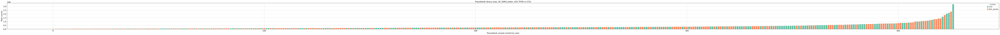

  0: ACS_sterile=19, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.51 seconds.

Fitting dispersion trend curve...
... done in 0.13 seconds.

Fitting MAP dispersions...


... done in 1.58 seconds.

Fitting LFCs...


... done in 1.27 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.31 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       18.356957       -0.175330  0.124496 -1.408311  0.159039  0.322600
ISG15       59.671891       -0.225403  0.107027 -2.106040  0.035201  0.110687
TNFRSF18    13.680356       -0.463263  0.314795 -1.471635  0.141120  0.297721
SDF4        47.275517       -0.228233  0.090443 -2.523500  0.011619  0.048455
UBE2J2      21.202429       -0.039387  0.115423 -0.341243  0.732921  0.844830
...               ...             ...       ...       ...       ...       ...
MT-ND4L    137.168698        0.161914  0.076144  2.126402  0.033470  0.106579
MT-ND4    1530.841981        0.031472  0.084028  0.374540  0.708002  0.828278
MT-ND5     659.018449        0.142116  0.062850  2.261210  0.023746  0.083245
MT-ND6      80.845409        0.259671  0.087543  2.966209  0.003015  0.017067
MT-CYB    1987.790074       -0.182730  0.088591 -2.062628  0.039148  0.1191

Fitting dispersions...


... done in 0.96 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 0.98 seconds.

Fitting LFCs...


... done in 0.52 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.22 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       48.668738       -0.130681  0.162797 -0.802720  4.221366e-01   
TNFRSF4     14.285974       -0.645576  0.199647 -3.233589  1.222454e-03   
SDF4        19.473767       -0.047434  0.115697 -0.409988  6.818146e-01   
UBE2J2      13.329987       -0.060888  0.145629 -0.418105  6.758701e-01   
AURKAIP1    32.050080       -0.176795  0.104769 -1.687472  9.151272e-02   
...               ...             ...       ...       ...           ...   
MT-ND4L     64.744433        0.240386  0.091196  2.635936  8.390554e-03   
MT-ND4    1028.319973        0.004015  0.092518  0.043398  9.653841e-01   
MT-ND5     363.913814        0.287301  0.072724  3.950574  7.796406e-05   
MT-ND6      50.073050        0.609770  0.098214  6.208607  5.345641e-10   
MT-CYB    1647.013516       -0.288506  0.103809 -2.779213  5.449086e-03   

                  padj  
ISG15  

Fitting dispersions...


... done in 0.69 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.72 seconds.

Fitting LFCs...


... done in 0.39 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
HES4       52.940068       -0.059096  0.196032 -0.301460  7.630636e-01   
ISG15      41.555272       -0.403603  0.233850 -1.725909  8.436373e-02   
SDF4       10.177985       -0.073967  0.189562 -0.390201  6.963876e-01   
AURKAIP1   23.736115       -0.314890  0.143367 -2.196393  2.806380e-02   
MRPL20     17.340997        0.217253  0.164214  1.322991  1.858385e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    63.734165        0.401122  0.108078  3.711402  2.061145e-04   
MT-ND4    696.024144        0.370202  0.083851  4.415023  1.009991e-05   
MT-ND5    265.191741        0.414098  0.071833  5.764710  8.179830e-09   
MT-ND6     24.098499        0.826091  0.154848  5.334833  9.563228e-08   
MT-CYB    835.441354       -0.145297  0.072394 -2.007020  4.474757e-02   

              padj  
HES4      0.876075  
IS

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.20 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...


... done in 0.20 seconds.

Fitting LFCs...
... done in 0.12 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.07 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
RPL22    276.313114       -0.168715  0.048034 -3.512388  0.000444  0.006676
PARK7     14.065292       -0.085036  0.174993 -0.485939  0.627010       NaN
ENO1      15.022915        0.113656  0.157198  0.723015  0.469671  0.682605
PRDM2     12.607888        0.460459  0.196111  2.347951  0.018877       NaN
CAPZB     13.453124        0.063137  0.184909  0.341450  0.732765       NaN
...             ...             ...       ...       ...       ...       ...
MT-ND4L   22.115532        0.246733  0.151648  1.627013  0.103734  0.251926
MT-ND4   386.817676       -0.003302  0.106481 -0.031008  0.975263  0.988326
MT-ND5    98.421589        0.343049  0.099779  3.438097  0.000586  0.007825
MT-ND6    12.933270        0.797906  0.225119  3.544369  0.000394       NaN
MT-CYB   529.340460       -0.315214  0.116615 -2.703032  0.006871  0.045889

[714 rows x 6 column

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.49 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.56 seconds.

Fitting LFCs...


... done in 0.31 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      18.918953        0.002550  0.247594  0.010299  0.991783  0.999191
AURKAIP1   20.304223       -0.115920  0.239505 -0.483998  0.628388  0.883679
MRPL20     16.805823       -0.099442  0.216516 -0.459281  0.646033  0.892441
SSU72      18.945658       -0.239692  0.183183 -1.308486  0.190708  0.578557
GNB1       29.770790        0.024470  0.163045  0.150082  0.880700  0.979021
...              ...             ...       ...       ...       ...       ...
MT-ND4L    49.900196        0.340583  0.138574  2.457778  0.013980  0.170877
MT-ND4    594.683602        0.217019  0.117201  1.851684  0.064071  0.344484
MT-ND5    204.164947        0.373141  0.106108  3.516622  0.000437  0.022503
MT-ND6     17.336646        0.631333  0.206707  3.054248  0.002256  0.060874
MT-CYB    669.733979       -0.083962  0.112121 -0.748850  0.453948  0.785916

[2160 ro

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.86 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.90 seconds.

Fitting LFCs...


... done in 0.87 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       38.351512        0.084132  0.337798  0.249059  8.033155e-01   
SDF4        20.639205       -0.145093  0.132588 -1.094315  2.738171e-01   
UBE2J2      13.570783       -0.577851  0.163935 -3.524881  4.236732e-04   
AURKAIP1    43.643282       -0.336252  0.098805 -3.403178  6.660687e-04   
MRPL20      42.752195        0.036032  0.114753  0.313995  7.535246e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L    106.217297        0.425865  0.119932  3.550881  3.839444e-04   
MT-ND4    1260.913312        0.248866  0.084860  2.932676  3.360544e-03   
MT-ND5     362.192386        0.245727  0.089627  2.741663  6.112910e-03   
MT-ND6      28.601820        0.660480  0.116818  5.653902  1.568458e-08   
MT-CYB    1151.780462       -0.036579  0.080843 -0.452470  6.509303e-01   

              padj  
ISG15     0

Fitting dispersions...


... done in 0.76 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.80 seconds.

Fitting LFCs...


... done in 0.43 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.18 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       28.853480       -0.258864  0.178635 -1.449122  0.147304  0.401627
TNFRSF4     10.890945       -0.225581  0.198686 -1.135362  0.256223  0.530356
SDF4        13.996750        0.085075  0.135424  0.628210  0.529866  0.761571
UBE2J2      10.059933       -0.102776  0.165934 -0.619377  0.535668  0.764712
AURKAIP1    21.471081       -0.168476  0.116955 -1.440519  0.149721  0.403957
...               ...             ...       ...       ...       ...       ...
MT-ND4L     50.808938        0.269598  0.094434  2.854879  0.004305  0.046454
MT-ND4     758.493702       -0.004040  0.088497 -0.045655  0.963585  0.987247
MT-ND5     285.016084        0.243623  0.087308  2.790385  0.005265  0.054111
MT-ND6      36.260926        0.521232  0.112694  4.625188  0.000004  0.000250
MT-CYB    1244.310678       -0.290970  0.100853 -2.885080  0.003913  0.0440

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.58 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.60 seconds.

Fitting LFCs...


... done in 0.32 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       18.504004       -0.179112  0.159651 -1.121897  2.619063e-01   
AURKAIP1    16.403678       -0.254324  0.145341 -1.749844  8.014524e-02   
CCNL2        9.600198        0.099604  0.216993  0.459019  6.462205e-01   
MRPL20      19.354683       -0.154912  0.135408 -1.144040  2.526071e-01   
SSU72       24.729826       -0.167728  0.117504 -1.427422  1.534584e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L     43.430867        0.293725  0.109467  2.683235  7.291371e-03   
MT-ND4     699.980288        0.078479  0.101064  0.776531  4.374358e-01   
MT-ND5     220.924949        0.317954  0.072252  4.400629  1.079373e-05   
MT-ND6      27.140513        0.610966  0.120847  5.055712  4.287879e-07   
MT-CYB    1043.491346       -0.254298  0.114885 -2.213496  2.686344e-02   

              padj  
ISG15     0

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.57 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.57 seconds.

Fitting LFCs...


... done in 0.32 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15      16.084745       -0.352695  0.158174 -2.229795  2.576109e-02   
AURKAIP1   13.631135       -0.100905  0.155484 -0.648971  5.163573e-01   
MRPL20     15.589650       -0.001340  0.135301 -0.009906  9.920965e-01   
SSU72      21.180637       -0.232437  0.115228 -2.017193  4.367539e-02   
GNB1       14.757029       -0.089412  0.134716 -0.663708  5.068773e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    40.645573        0.355468  0.108395  3.279388  1.040324e-03   
MT-ND4    575.066549       -0.062877  0.098637 -0.637456  5.238281e-01   
MT-ND5    178.868754        0.297684  0.083896  3.548236  3.878211e-04   
MT-ND6     23.490493        0.660559  0.112994  5.845962  5.036475e-09   
MT-CYB    846.545315       -0.307778  0.104380 -2.948629  3.191870e-03   

                  padj  
ISG15     1.303372e

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.55 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.57 seconds.

Fitting LFCs...


... done in 0.69 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.12 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15      14.276427       -0.068324  0.181303 -0.376850  7.062855e-01   
AURKAIP1   14.017623       -0.019334  0.137789 -0.140318  8.884084e-01   
MRPL20     17.394774       -0.108823  0.131900 -0.825044  4.093467e-01   
SSU72      19.609569       -0.278686  0.139521 -1.997453  4.577598e-02   
GNB1       17.236706        0.108140  0.124112  0.871310  3.835848e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    35.949188        0.085007  0.112687  0.754362  4.506319e-01   
MT-ND4    563.991533       -0.009412  0.085520 -0.110052  9.123684e-01   
MT-ND5    182.430778        0.281252  0.067842  4.145673  3.388167e-05   
MT-ND6     25.821633        0.685472  0.111361  6.155399  7.488852e-10   
MT-CYB    840.988333       -0.308378  0.103968 -2.966076  3.016261e-03   

                  padj  
ISG15     8.571586e

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.94 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.94 seconds.

Fitting LFCs...


... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15      34.723105        0.059918  0.330265  0.181424  8.560347e-01   
SDF4       16.510294       -0.064973  0.130749 -0.496931  6.192374e-01   
UBE2J2      9.900131        0.012054  0.173884  0.069325  9.447310e-01   
AURKAIP1   30.927544       -0.406296  0.114548 -3.546948  3.897216e-04   
CCNL2      11.373772       -0.010594  0.173062 -0.061217  9.511866e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    90.717984        0.393805  0.094280  4.176985  2.953986e-05   
MT-ND4    994.018239        0.344429  0.076874  4.480415  7.449808e-06   
MT-ND5    321.225635        0.398991  0.078355  5.092100  3.541185e-07   
MT-ND6     19.564756        0.793412  0.191200  4.149642  3.329964e-05   
MT-CYB    935.843755        0.116839  0.078391  1.490455  1.361047e-01   

              padj  
ISG15     0.926638  
SD

Fitting dispersions...


... done in 0.70 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.71 seconds.

Fitting LFCs...


... done in 0.37 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       23.315686       -0.202976  0.211498 -0.959706  0.337203  0.627837
SDF4        12.376571       -0.128098  0.157446 -0.813597  0.415876  0.684706
AURKAIP1    17.992564       -0.280047  0.126333 -2.216725  0.026642  0.152113
CCNL2        8.552730        0.175805  0.189698  0.926761  0.354051  0.643380
MRPL20      19.738702       -0.012504  0.125480 -0.099647  0.920624  0.966018
...               ...             ...       ...       ...       ...       ...
MT-ND4L     49.833999        0.376314  0.105989  3.550499  0.000385  0.008535
MT-ND4     676.911835        0.037105  0.092258  0.402186  0.687547  0.850426
MT-ND5     261.299201        0.302487  0.073384  4.121978  0.000038  0.001466
MT-ND6      35.031644        0.470975  0.110002  4.281497  0.000019  0.000854
MT-CYB    1031.794100       -0.290575  0.097987 -2.965450  0.003022  0.0368

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.36 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.39 seconds.

Fitting LFCs...
... done in 0.20 seconds.



Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AURKAIP1   11.609353       -0.075070  0.191889 -0.391217  0.695637  0.832248
MRPL20     10.820308        0.199852  0.177656  1.124940  0.260614  0.477564
SSU72      15.020057       -0.097732  0.142766 -0.684558  0.493623  0.693268
GNB1       14.568311        0.180747  0.159873  1.130571  0.258236  0.476347
TNFRSF14   11.936140       -0.268470  0.168165 -1.596464  0.110385  0.293726
...              ...             ...       ...       ...       ...       ...
MT-ND4L    41.927795        0.248002  0.108926  2.276782  0.022799  0.101176
MT-ND4    535.171092        0.024585  0.089873  0.273550  0.784431  0.885833
MT-ND5    167.785926        0.298266  0.086395  3.452361  0.000556  0.006327
MT-ND6     23.864309        0.347518  0.152454  2.279493  0.022638  0.100782
MT-CYB    640.216278       -0.185884  0.100510 -1.849395  0.064401  0.202382

[1389 ro

ACS sterile (TP3M) vs CCS -- 23,191 cells
condition
CCS            11920
ACS_sterile    11271



Pseudobulk samples: 360


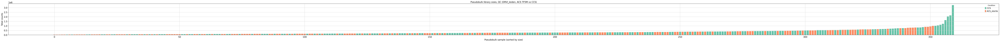

  0: ACS_sterile=16, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.24 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.24 seconds.

Fitting LFCs...


... done in 0.66 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.25 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       14.296252       -0.075079  0.148813 -0.504515  0.613899  0.799087
ISG15       48.113077       -0.005774  0.164911 -0.035015  0.972068  0.986636
TNFRSF18    11.379328       -0.201966  0.316711 -0.637696  0.523671  0.734824
SDF4        35.799174       -0.264904  0.119794 -2.211322  0.027014  0.126907
UBE2J2      15.346049       -0.135229  0.141880 -0.953128  0.340525  0.584750
...               ...             ...       ...       ...       ...       ...
MT-ND4L    100.666944        0.154740  0.136091  1.137038  0.255522  0.500575
MT-ND4    1127.552331       -0.000112  0.071489 -0.001567  0.998749  0.999598
MT-ND5     490.832359        0.149993  0.072610  2.065742  0.038853  0.161157
MT-ND6      58.392192        0.229349  0.108661  2.110678  0.034800  0.150203
MT-CYB    1530.922925       -0.099688  0.092947 -1.072519  0.283487  0.5281

Fitting dispersions...


... done in 0.97 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.97 seconds.

Fitting LFCs...


... done in 0.52 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.20 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      11.610406       -0.021687  0.164077 -0.132174  0.894847  0.962507
ISG15      56.261116       -0.072296  0.185257 -0.390249  0.696352  0.883079
TNFRSF4    19.172639       -0.207508  0.177289 -1.170453  0.241819  0.544005
SDF4       21.984995       -0.110652  0.122369 -0.904255  0.365860  0.659887
UBE2J2     14.748755       -0.193179  0.140949 -1.370558  0.170513  0.456220
...              ...             ...       ...       ...       ...       ...
MT-ND4L    76.013461        0.352401  0.147258  2.393089  0.016707  0.121871
MT-ND4   1198.615834        0.081349  0.084872  0.958488  0.337817  0.634247
MT-ND5    405.903506        0.258424  0.100675  2.566901  0.010261  0.091795
MT-ND6     51.969727        0.426226  0.103828  4.105119  0.000040  0.003656
MT-CYB   1959.797178       -0.165566  0.098071 -1.688215  0.091370  0.330062

[3802 ro

Fitting dispersions...


... done in 0.59 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.61 seconds.

Fitting LFCs...


... done in 0.73 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       47.126130       -0.056252  0.265046 -0.212235  0.831923  0.938329
ISG15      39.688173       -0.255250  0.299457 -0.852378  0.394004  0.698536
SDF4        9.082801       -0.080072  0.269071 -0.297587  0.766018       NaN
AURKAIP1   22.321985       -0.136816  0.195776 -0.698838  0.484654       NaN
MRPL20     14.952897        0.221348  0.233092  0.949621  0.342305       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    50.247482        0.184997  0.185393  0.997864  0.318345  0.642203
MT-ND4    559.122021        0.224409  0.098770  2.272043  0.023084  0.140616
MT-ND5    207.046268        0.186109  0.117902  1.578500  0.114451  0.371666
MT-ND6     16.618732        0.380620  0.211144  1.802651  0.071443       NaN
MT-CYB    776.630988       -0.020264  0.108719 -0.186390  0.852139  0.946595

[2455 ro

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.20 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...


... done in 0.20 seconds.

Fitting LFCs...
... done in 0.12 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.07 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
RPL22    346.202072        0.019441  0.055892  0.347828  0.727969  0.870895
PARK7     16.766316       -0.130769  0.178655 -0.731963  0.464191       NaN
ENO1      17.132393        0.019412  0.173328  0.111994  0.910828       NaN
PRDM2     14.144254        0.418037  0.219233  1.906813  0.056545       NaN
CAPZB     15.306731       -0.124252  0.189027 -0.657322  0.510974       NaN
...             ...             ...       ...       ...       ...       ...
MT-ND4L   26.970589        0.420678  0.208845  2.014311  0.043977  0.205704
MT-ND4   443.336747       -0.060208  0.131807 -0.456786  0.647825  0.819697
MT-ND5   105.088187        0.180390  0.152461  1.183189  0.236734  0.501796
MT-ND6    12.229562        0.480834  0.235019  2.045941  0.040762       NaN
MT-CYB   629.254439       -0.300119  0.118232 -2.538397  0.011136  0.104218

[720 rows x 6 column

Fitting dispersions...


... done in 0.44 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.53 seconds.

Fitting LFCs...


... done in 0.29 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.12 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      20.235267        0.425893  0.399653  1.065657  0.286579       NaN
AURKAIP1   20.745978        0.049012  0.315012  0.155586  0.876359       NaN
MRPL20     16.232019       -0.140185  0.292415 -0.479403  0.631652       NaN
SSU72      17.851908       -0.580502  0.322623 -1.799318  0.071968       NaN
GNB1       29.247632        0.102619  0.227600  0.450875  0.652080  0.948431
...              ...             ...       ...       ...       ...       ...
MT-ND4L    42.383822        0.132243  0.232501  0.568785  0.569502  0.943998
MT-ND4    507.059665       -0.129746  0.148893 -0.871408  0.383532  0.917903
MT-ND5    173.498396        0.133092  0.182876  0.727775  0.466752  0.927973
MT-ND6     16.114466        0.840083  0.364771  2.303042  0.021276       NaN
MT-CYB    637.316719       -0.219023  0.108010 -2.027813  0.042579  0.617949

[2002 ro

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.79 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.84 seconds.

Fitting LFCs...


... done in 0.48 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.18 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       37.914780        0.304266  0.286046  1.063697  0.287466  0.637515
SDF4        18.404478       -0.149500  0.161310 -0.926784  0.354039       NaN
UBE2J2      13.565796       -0.331954  0.193959 -1.711461  0.086996       NaN
AURKAIP1    40.263224       -0.307549  0.112933 -2.723291  0.006464  0.121817
MRPL20      38.018067       -0.028120  0.128086 -0.219536  0.826233  0.925902
...               ...             ...       ...       ...       ...       ...
MT-ND4L     91.055235        0.334331  0.189640  1.762974  0.077905  0.368727
MT-ND4    1054.539132        0.052062  0.096946  0.537018  0.591255  0.842160
MT-ND5     303.311753        0.054546  0.114418  0.476727  0.633557  0.865709
MT-ND6      23.615333        0.526015  0.163009  3.226906  0.001251  0.047597
MT-CYB    1053.330266       -0.036487  0.092935 -0.392610  0.694608  0.8952

Fitting dispersions...


... done in 0.71 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.75 seconds.

Fitting LFCs...


... done in 0.42 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.17 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       33.397880        0.012555  0.250065  0.050208  0.959957  0.989901
TNFRSF4     12.805532       -0.012663  0.178426 -0.070969  0.943423  0.983193
SDF4        14.243940       -0.048613  0.139292 -0.349003  0.727087  0.889376
UBE2J2      10.488850       -0.255702  0.172205 -1.484876  0.137577  0.435073
AURKAIP1    23.253854       -0.114258  0.126791 -0.901157  0.367505  0.684676
...               ...             ...       ...       ...       ...       ...
MT-ND4L     53.167711        0.304076  0.142419  2.135083  0.032754  0.224928
MT-ND4     805.083395        0.044983  0.087683  0.513026  0.607933  0.837627
MT-ND5     291.432575        0.203595  0.116442  1.748466  0.080383  0.341089
MT-ND6      34.491489        0.309878  0.120311  2.575643  0.010005  0.123140
MT-CYB    1350.224191       -0.199127  0.095521 -2.084649  0.037101  0.2388

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.59 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.60 seconds.

Fitting LFCs...


... done in 0.32 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.13 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       21.362810        0.067643  0.151931  0.445222  0.656159  0.837421
AURKAIP1    17.457030       -0.268562  0.152040 -1.766394  0.077330  0.266686
MRPL20      20.368448       -0.141063  0.130779 -1.078636  0.280750  0.550579
SSU72       25.737123       -0.193445  0.113348 -1.706646  0.087888  0.288030
GNB1        19.792381        0.059471  0.132600  0.448499  0.653793  0.835897
...               ...             ...       ...       ...       ...       ...
MT-ND4L     47.728723        0.370942  0.164849  2.250187  0.024437  0.132969
MT-ND4     719.205675        0.014269  0.092827  0.153717  0.877833  0.965728
MT-ND5     218.564719        0.164539  0.111985  1.469292  0.141754  0.383944
MT-ND6      24.571779        0.311175  0.132369  2.350815  0.018732  0.111540
MT-CYB    1096.898107       -0.267020  0.099891 -2.673116  0.007515  0.0657

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.58 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.59 seconds.

Fitting LFCs...


... done in 0.67 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       23.334838        0.130699  0.182000  0.718126  0.472680  0.728350
SDF4         9.298378       -0.152363  0.173790 -0.876712  0.380643  0.664277
AURKAIP1    15.831695       -0.287023  0.150283 -1.909885  0.056148  0.238198
CCNL2        8.850152       -0.141855  0.183745 -0.772018  0.440104  0.704122
MRPL20      20.255112        0.126823  0.151261  0.838439  0.401784  0.676484
...               ...             ...       ...       ...       ...       ...
MT-ND4L     44.238515        0.120331  0.162854  0.738887  0.459975  0.720939
MT-ND4     684.724969       -0.101716  0.096413 -1.055004  0.291423  0.588010
MT-ND5     197.075253        0.097542  0.107718  0.905524  0.365188  0.647107
MT-ND6      23.795566        0.327813  0.136665  2.398662  0.016455  0.119994
MT-CYB    1034.756239       -0.295605  0.099499 -2.970937  0.002969  0.0422

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.52 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.54 seconds.

Fitting LFCs...


... done in 0.29 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.12 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       18.985114        0.253930  0.211421  1.201062  0.229727  0.508496
AURKAIP1    14.952758       -0.188326  0.145073 -1.298146  0.194237  0.471227
MRPL20      20.868379        0.006653  0.121328  0.054833  0.956271  0.985289
SSU72       25.762728       -0.021988  0.127584 -0.172339  0.863171  0.948482
GNB1        19.891768        0.037996  0.130497  0.291168  0.770923  0.896193
...               ...             ...       ...       ...       ...       ...
MT-ND4L     44.091442        0.180063  0.155967  1.154492  0.248299  0.527237
MT-ND4     653.228256       -0.041232  0.092137 -0.447509  0.654507  0.826311
MT-ND5     198.639958        0.107795  0.094789  1.137207  0.255452  0.532792
MT-ND6      28.034723        0.487140  0.120548  4.041031  0.000053  0.003219
MT-CYB    1009.604903       -0.259074  0.098790 -2.622472  0.008729  0.0764

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.81 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.84 seconds.

Fitting LFCs...


... done in 0.49 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.18 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      29.555254       -0.058900  0.267699 -0.220022  0.825854  0.956178
SDF4       14.310158       -0.131256  0.166768 -0.787059  0.431248  0.808460
AURKAIP1   29.994632       -0.264973  0.135011 -1.962595  0.049693  0.388592
CCNL2      10.331082       -0.210300  0.226906 -0.926814  0.354023  0.764200
MRPL20     25.670878       -0.137518  0.167726 -0.819899  0.412274  0.796647
...              ...             ...       ...       ...       ...       ...
MT-ND4L    73.230265        0.164075  0.148472  1.105094  0.269119  0.710276
MT-ND4    793.945075        0.099897  0.100829  0.990758  0.321804  0.746827
MT-ND5    252.372938        0.122128  0.121070  1.008739  0.313100  0.746127
MT-ND6     15.500904        0.430517  0.221978  1.939460  0.052445  0.395567
MT-CYB    801.806153        0.018474  0.087686  0.210687  0.833132  0.957365

[3327 ro

Fitting dispersions...


... done in 0.61 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.63 seconds.

Fitting LFCs...


... done in 0.34 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       24.263166       -0.058320  0.238274 -0.244760  0.806642  0.922849
SDF4        10.608304       -0.516630  0.176851 -2.921271  0.003486  0.067029
AURKAIP1    17.257373       -0.380601  0.139275 -2.732732  0.006281  0.094478
MRPL20      19.790707       -0.029127  0.157961 -0.184392  0.853706  0.943721
SSU72       21.298917       -0.014233  0.132349 -0.107544  0.914357  0.969919
...               ...             ...       ...       ...       ...       ...
MT-ND4L     46.053619        0.305238  0.138984  2.196203  0.028077  0.204881
MT-ND4     648.188532       -0.007196  0.093502 -0.076956  0.938659  0.981606
MT-ND5     240.086900        0.179623  0.105617  1.700707  0.088998  0.349019
MT-ND6      29.693242        0.242125  0.123468  1.961026  0.049876  0.273022
MT-CYB    1037.905772       -0.232166  0.097284 -2.386487  0.017010  0.1565

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.28 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.31 seconds.

Fitting LFCs...
... done in 0.17 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.08 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     12.634261       -0.184383  0.167912 -1.098088  0.272166  0.560589
GNB1      14.168386        0.273036  0.189146  1.443518  0.148875  0.403805
RPL22    279.488129        0.008503  0.068541  0.124065  0.901264  0.960570
PARK7     17.061204       -0.313328  0.154618 -2.026471  0.042717  0.201163
RERE      13.412252       -0.184687  0.195858 -0.942961  0.345701  0.639191
...             ...             ...       ...       ...       ...       ...
MT-ND4L   35.267926        0.138504  0.122623  1.129506  0.258684  0.553067
MT-ND4   462.092493       -0.067925  0.089568 -0.758362  0.448234  0.730431
MT-ND5   131.781132        0.014679  0.111096  0.132132  0.894880  0.958073
MT-ND6    17.576198        0.036936  0.192485  0.191890  0.847829  0.946064
MT-CYB   574.948865       -0.206748  0.101000 -2.047010  0.040657  0.198223

[1069 rows x 6 colum

ACS sterile (TP4M) vs CCS -- 23,329 cells
condition
CCS            11920
ACS_sterile    11409



Pseudobulk samples: 314


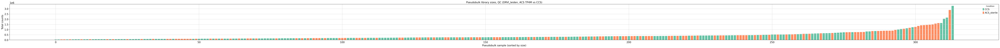

  0: ACS_sterile=11, CCS=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.31 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...


... done in 1.34 seconds.

Fitting LFCs...


... done in 0.75 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.28 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L       18.929385       -0.067495  0.148643 -0.454077  6.497734e-01   
ISG15       71.762881        0.410691  0.168411  2.438619  1.474350e-02   
TNFRSF18    15.526714        0.000152  0.368926  0.000411  9.996720e-01   
SDF4        47.039004       -0.275427  0.120721 -2.281508  2.251843e-02   
UBE2J2      21.030131        0.019289  0.133267  0.144736  8.849190e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L    145.785398        0.487461  0.097792  4.984690  6.206124e-07   
MT-ND4    1466.314828       -0.026793  0.072962 -0.367224  7.134523e-01   
MT-ND5     628.664273        0.102608  0.076631  1.338997  1.805716e-01   
MT-ND6      81.932986        0.456464  0.105192  4.339347  1.429069e-05   
MT-CYB    2107.333883        0.052788  0.085459  0.617698  5.367747e-01   

              padj  
NOC2L     0

Fitting dispersions...


... done in 1.17 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...


... done in 1.19 seconds.

Fitting LFCs...


... done in 0.86 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.28 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L       14.095614       -0.325506  0.168420 -1.932707  5.327225e-02   
ISG15       86.616959        0.494749  0.242252  2.042294  4.112236e-02   
TNFRSF18    10.300217        0.103922  0.261028  0.398127  6.905367e-01   
TNFRSF4     25.430234       -0.113150  0.181717 -0.622670  5.335013e-01   
SDF4        28.918881        0.020080  0.115246  0.174237  8.616789e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L    100.930872        0.519659  0.101023  5.143961  2.690060e-07   
MT-ND4    1451.514742       -0.101634  0.086980 -1.168475  2.426152e-01   
MT-ND5     481.616283        0.053952  0.090548  0.595843  5.512802e-01   
MT-ND6      67.645503        0.585161  0.086819  6.740018  1.583665e-11   
MT-CYB    2516.542473       -0.197697  0.087897 -2.249191  2.450035e-02   

                  padj  
NOC2L  

Fitting dispersions...


... done in 0.56 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.60 seconds.

Fitting LFCs...


... done in 0.34 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       56.465893        0.333302  0.184759  1.803988  0.071233  0.317733
ISG15      58.897211        0.787653  0.339377  2.320878  0.020293  0.144159
AURKAIP1   22.905080       -0.231958  0.177543 -1.306487  0.191387  0.508300
MRPL20     15.434271        0.089039  0.218833  0.406880  0.684096  0.864307
SSU72      22.872011       -0.144819  0.190318 -0.760932  0.446698  0.743273
...              ...             ...       ...       ...       ...       ...
MT-ND4L    54.455119        0.240560  0.151221  1.590786  0.111658  0.400298
MT-ND4    549.842774       -0.054316  0.085460 -0.635579  0.525051  0.784489
MT-ND5    209.657582        0.025584  0.102139  0.250481  0.802216  0.924074
MT-ND6     18.385788        0.547294  0.198828  2.752593  0.005913  0.068379
MT-CYB    793.752392       -0.162114  0.111004 -1.460436  0.144170  0.444303

[2380 ro

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.34 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.29 seconds.

Fitting LFCs...
... done in 0.18 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.08 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      15.147203        0.223136  0.274117  0.814019  0.415634       NaN
AURKAIP1   10.353530       -0.162483  0.223176 -0.728051  0.466582       NaN
MRPL20     13.099716       -0.121005  0.218600 -0.553545  0.579890       NaN
SSU72      14.892130        0.115507  0.172048  0.671364  0.501989       NaN
TNFRSF14   11.584883       -0.052705  0.207045 -0.254557  0.799065       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    33.025223        0.464822  0.148575  3.128538  0.001757  0.024309
MT-ND4    516.471496       -0.216341  0.091454 -2.365561  0.018003  0.115595
MT-ND5    122.947060        0.072651  0.108648  0.668683  0.503697  0.751128
MT-ND6     16.271246        0.687285  0.196405  3.499316  0.000466       NaN
MT-CYB    780.821266       -0.274157  0.099936 -2.743319  0.006082  0.061337

[1113 ro

Fitting dispersions...


... done in 0.61 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.68 seconds.

Fitting LFCs...


... done in 0.40 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      38.119664        1.408383  0.470587  2.992821  0.002764  0.198053
SDF4       12.371658        0.327427  0.333118  0.982916  0.325649  0.963915
UBE2J2      9.805539        0.504116  0.404131  1.247409  0.212248  0.895600
AURKAIP1   27.533413        0.087142  0.260513  0.334503  0.738000  0.983406
MRPL20     23.886592        0.292627  0.228311  1.281700  0.199948  0.893938
...              ...             ...       ...       ...       ...       ...
MT-ND4L    57.719926        0.252742  0.206975  1.221127  0.222038  0.896432
MT-ND4    672.723359       -0.105688  0.148803 -0.710254  0.477547  0.975249
MT-ND5    228.992478        0.144004  0.164880  0.873389  0.382451  0.967277
MT-ND6     20.879535        0.771843  0.260735  2.960253  0.003074  0.200269
MT-CYB    847.773666       -0.181601  0.136002 -1.335289  0.181782  0.886466

[2915 ro

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 1.04 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 1.06 seconds.

Fitting LFCs...


... done in 0.60 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.23 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       58.215500        1.263604  0.404467  3.124124  0.001783  0.030189
SDF4        21.315233       -0.124574  0.169299 -0.735822  0.461839  0.731006
UBE2J2      15.430828       -0.334265  0.204638 -1.633443  0.102376  0.330279
AURKAIP1    49.551343       -0.088048  0.108238 -0.813464  0.415952  0.694200
CCNL2       10.597877        0.215919  0.232973  0.926802  0.354029       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND4L    101.163207        0.359937  0.145051  2.481454  0.013085  0.102690
MT-ND4    1148.842572       -0.051021  0.105162 -0.485160  0.627563  0.833380
MT-ND5     333.982763       -0.013008  0.129024 -0.100818  0.919695  0.969759
MT-ND6      23.538604        0.237461  0.166263  1.428224  0.153227  0.408492
MT-CYB    1141.512049       -0.186563  0.088270 -2.113551  0.034554  0.1812

Fitting dispersions...


... done in 0.76 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...


... done in 0.80 seconds.

Fitting LFCs...


... done in 0.62 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.17 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       41.837586        0.356349  0.274096  1.300092  0.193570  0.465246
TNFRSF4     15.059535        0.310514  0.204096  1.521412  0.128157       NaN
SDF4        16.560633        0.060887  0.138860  0.438473  0.661043       NaN
UBE2J2      12.574227       -0.126366  0.175372 -0.720559  0.471181       NaN
AURKAIP1    27.527653       -0.055620  0.123134 -0.451702  0.651483  0.848129
...               ...             ...       ...       ...       ...       ...
MT-ND4L     61.549367        0.425764  0.118309  3.598739  0.000320  0.009523
MT-ND4     862.550605       -0.130991  0.083836 -1.562474  0.118176  0.350437
MT-ND5     308.170731        0.034482  0.103652  0.332672  0.739382  0.887776
MT-ND6      40.721589        0.492098  0.118454  4.154356  0.000033  0.002031
MT-CYB    1528.108080       -0.236712  0.089826 -2.635233  0.008408  0.0707

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.79 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.81 seconds.

Fitting LFCs...


... done in 0.44 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.17 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       31.126946        0.381398  0.176117  2.165591  3.034244e-02   
SDF4        13.095985       -0.123056  0.172825 -0.712026  4.764489e-01   
UBE2J2      10.166478       -0.017744  0.193585 -0.091662  9.269667e-01   
AURKAIP1    25.909061        0.006939  0.136307  0.050908  9.593988e-01   
CCNL2       13.034183       -0.028481  0.213452 -0.133432  8.938520e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L     65.912596        0.535679  0.101303  5.287915  1.237185e-07   
MT-ND4     925.592024       -0.163736  0.085962 -1.904745  5.681320e-02   
MT-ND5     282.555309        0.060182  0.100537  0.598605  5.494361e-01   
MT-ND6      34.761198        0.486953  0.132056  3.687477  2.264885e-04   
MT-CYB    1488.254103       -0.327936  0.093130 -3.521262  4.294982e-04   

              padj  
ISG15     0

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.63 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.65 seconds.

Fitting LFCs...


... done in 0.35 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       29.882085        0.348852  0.213230  1.636036  0.101832  0.372801
SDF4        12.271706       -0.013343  0.193738 -0.068871  0.945092  0.985161
AURKAIP1    20.788672       -0.018913  0.159654 -0.118464  0.905700  0.973675
CCNL2       10.588889       -0.185951  0.192488 -0.966042  0.334023  0.647548
MRPL20      24.277716        0.143952  0.167774  0.858015  0.390884  0.702872
...               ...             ...       ...       ...       ...       ...
MT-ND4L     59.345466        0.492503  0.126300  3.899465  0.000096  0.004209
MT-ND4     796.112706       -0.289481  0.082981 -3.488536  0.000486  0.014224
MT-ND5     228.060679       -0.035094  0.089980 -0.390024  0.696519  0.888511
MT-ND6      29.837158        0.447629  0.145872  3.068647  0.002150  0.041296
MT-CYB    1249.816609       -0.382160  0.086931 -4.396107  0.000011  0.0008

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.69 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.70 seconds.

Fitting LFCs...


... done in 0.39 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       24.638939        0.632602  0.246649  2.564785  0.010324  0.110720
SDF4        10.985394       -0.030436  0.196549 -0.154854  0.876936       NaN
UBE2J2       8.670788       -0.074719  0.198278 -0.376842  0.706291       NaN
AURKAIP1    18.837462       -0.123899  0.146631 -0.844976  0.398124  0.707915
CCNL2        8.861575       -0.084013  0.213587 -0.393345  0.694065       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND4L     54.778877        0.367848  0.107494  3.422026  0.000622  0.016567
MT-ND4     739.438227       -0.235908  0.067192 -3.510967  0.000446  0.013452
MT-ND5     230.386598        0.047758  0.081737  0.584282  0.559031  0.802050
MT-ND6      31.591340        0.474976  0.121750  3.901239  0.000096  0.004469
MT-CYB    1202.059605       -0.315525  0.084349 -3.740688  0.000184  0.0071

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.85 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.88 seconds.

Fitting LFCs...


... done in 0.84 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.20 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      48.231640        1.044829  0.442213  2.362726  0.018141  0.152116
SDF4       16.516580       -0.173819  0.173464 -1.002051  0.316319  0.650387
AURKAIP1   35.728805       -0.073079  0.144527 -0.505642  0.613108  0.854111
CCNL2      11.998744        0.088210  0.225061  0.391937  0.695105  0.899950
MRPL20     28.337682       -0.122677  0.176223 -0.696146  0.486337  0.782736
...              ...             ...       ...       ...       ...       ...
MT-ND4L    91.627687        0.474299  0.127680  3.714759  0.000203  0.008694
MT-ND4    896.409608        0.097478  0.106188  0.917981  0.358629  0.692029
MT-ND5    290.811514        0.187413  0.113679  1.648613  0.099227  0.384299
MT-ND6     16.301104        0.477096  0.239808  1.989494  0.046647  0.257529
MT-CYB    912.743912        0.033134  0.091379  0.362597  0.716906  0.902603

[3505 ro

Fitting dispersions...


... done in 0.86 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...


... done in 0.89 seconds.

Fitting LFCs...


... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.19 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       43.375781        0.630666  0.274345  2.298807  0.021516  0.163434
SDF4        16.732952       -0.229043  0.174298 -1.314091  0.188816  0.492976
UBE2J2      11.516626        0.150527  0.175781  0.856333  0.391814       NaN
AURKAIP1    26.604719       -0.151212  0.125025 -1.209455  0.226488  0.524597
CCNL2       10.843936       -0.091460  0.205412 -0.445252  0.656138       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND4L     69.622988        0.526776  0.115599  4.556934  0.000005  0.000616
MT-ND4     884.829184       -0.162563  0.092281 -1.761605  0.078136  0.332147
MT-ND5     324.948097        0.031867  0.096052  0.331765  0.740067  0.894714
MT-ND6      43.886702        0.343529  0.116020  2.960940  0.003067  0.051824
MT-CYB    1496.555343       -0.235954  0.091431 -2.580673  0.009861  0.1039

Fitting dispersions...


... done in 0.33 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.35 seconds.

Fitting LFCs...
... done in 0.20 seconds.

Calculating cook's distance...


... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      11.552270        0.673144  0.304111  2.213482  0.026864  0.143570
AURKAIP1   11.616409       -0.024496  0.192234 -0.127425  0.898604  0.959688
SSU72      15.124418       -0.165853  0.166901 -0.993717  0.320361  0.601080
GNB1       13.448398       -0.101243  0.207360 -0.488249  0.625374  0.836397
TNFRSF14   13.217964       -0.072778  0.189371 -0.384313  0.700747  0.882021
...              ...             ...       ...       ...       ...       ...
MT-ND4L    47.090218        0.455491  0.132810  3.429658  0.000604  0.012711
MT-ND4    526.082750       -0.155216  0.084405 -1.838953  0.065922  0.246310
MT-ND5    157.120718        0.090119  0.121764  0.740115  0.459230  0.730288
MT-ND6     22.125048        0.201805  0.156341  1.290801  0.196773  0.473417
MT-CYB    668.732792       -0.222749  0.097318 -2.288867  0.022087  0.125340

[1330 ro

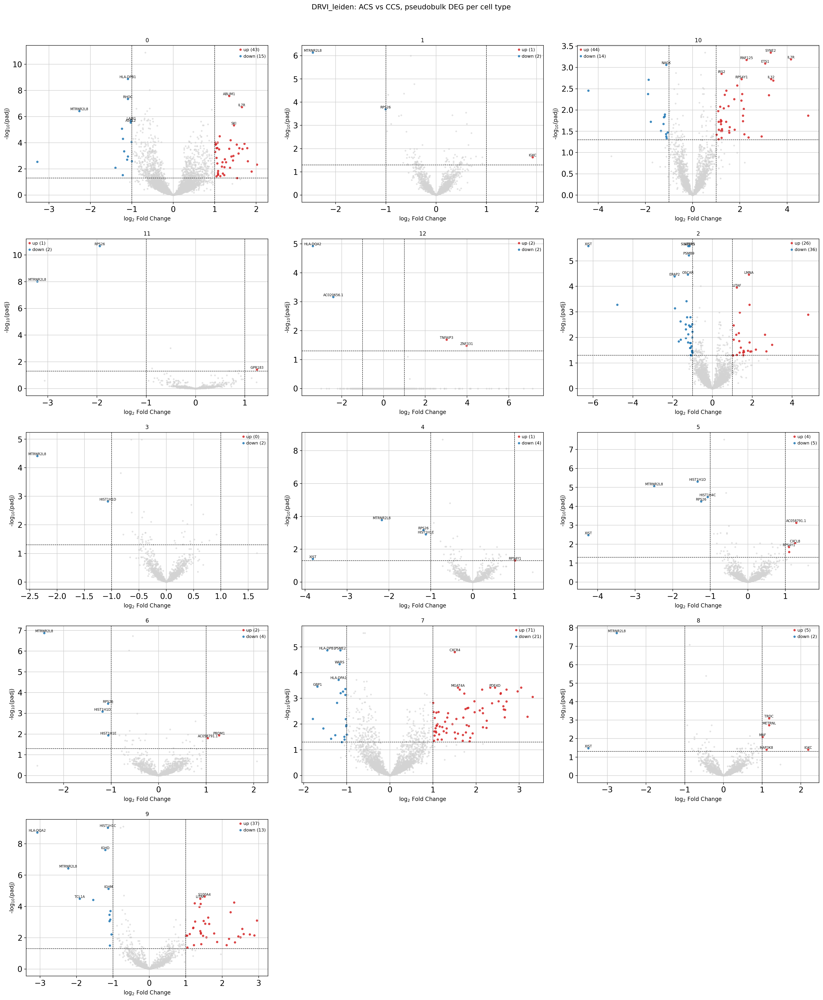

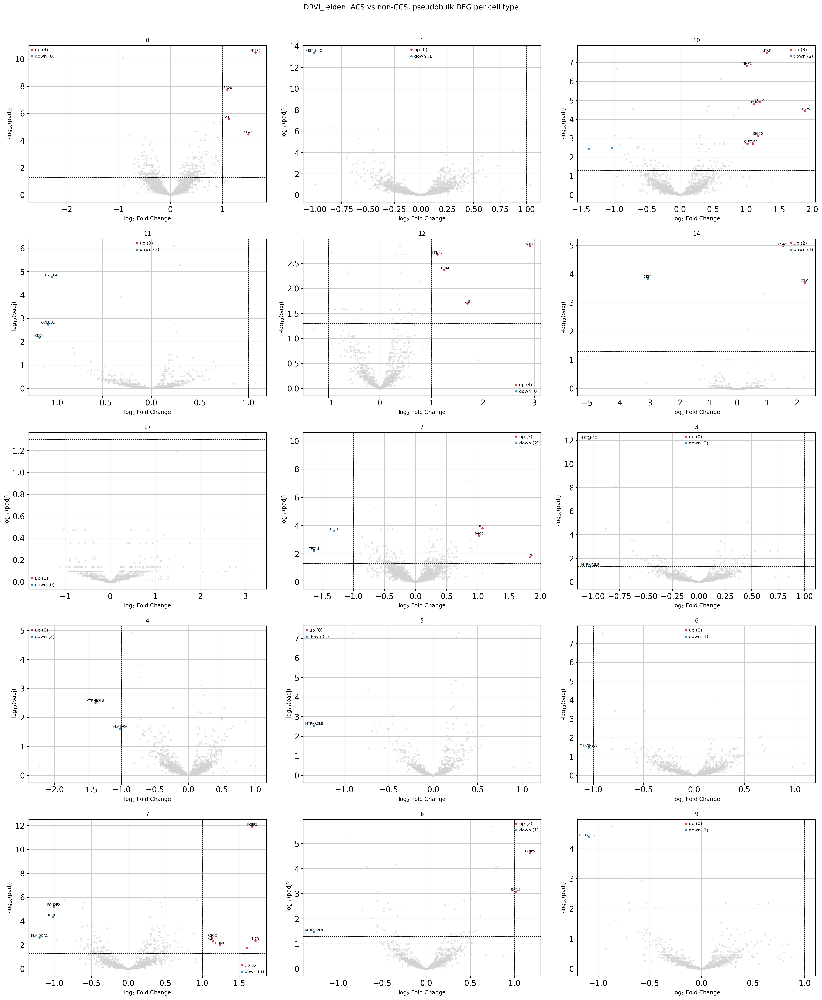

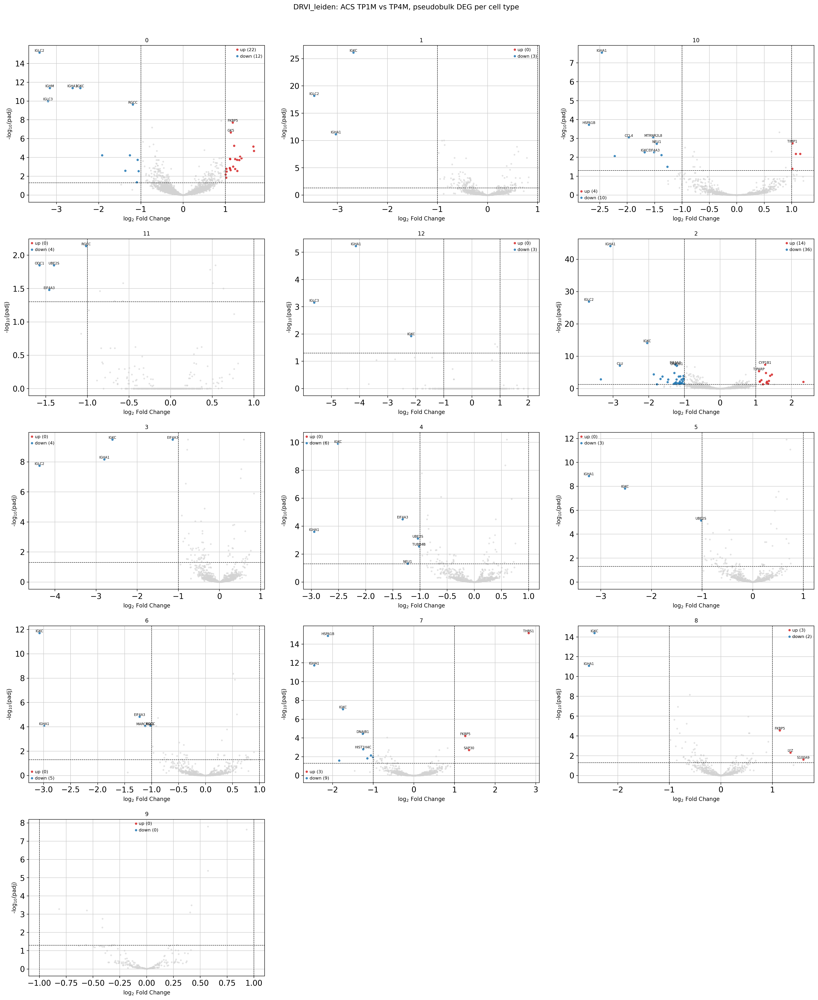

DRVI_leiden_ACS_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 359
cell_type
7     92
2     62
0     58
10    58
9     50
5      9
8      7
6      6
4      5
12     4
1      3
11     3
3      2


DRVI_leiden_ACS_vs_nonCCS
Significant DEGs (padj<0.05, |LFC|>1.0): 49
cell_type
10    10
7      9
2      5
0      4
12     4
11     3
8      3
14     3
4      2
3      2
1      1
5      1
6      1
9      1


DRVI_leiden_ACS_TP1M_vs_TP4M
Significant DEGs (padj<0.05, |LFC|>1.0): 143
cell_type
2     50
0     34
10    14
7     12
4      6
6      5
8      5
11     4
3      4
1      3
12     3
5      3


DRVI_leiden_ACS_TP1M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 117
cell_type
0     24
7     22
2     20
10    14
9      8
1      6
4      5
6      4
8      4
5      3
3      3
12     2
11     2


DRVI_leiden_ACS_TP2M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 202
cell_type
7     45
0     39
2     24
10    23
9     22
6     10
3      8
1      8
4      8
5      5
12     4
8      4
11     2


DRVI_leiden_ACS_TP3M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 37
cell_type
7     8
0     6
9     5
5     4
10    4
12    3
4     2
3     2
1     1
6     1
8     1


DRVI_leiden_ACS_TP4M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 162
cell_type
0     33
7     30
2     26
12    18
9     14
10    12
1      5
6      5
5      5
8      5
4      4
3      3
11     2

DRVI_leiden, ACS vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,11,RPS26,-1.95,2.11e-11,248.7
1,9,HIST1H1C,-1.14,9.21e-10,23.8
2,0,HLA-DPB1,-1.10,1.29e-09,58.0
3,9,HLA-DQA2,-3.08,1.87e-09,9.1
4,11,MTRNR2L8,-3.21,9.76e-09,13.2
5,8,MTRNR2L8,-2.76,1.90e-08,24.7
6,9,IGHD,-1.21,2.45e-08,60.6
7,0,ABLIM1,1.35,2.64e-08,29.0
8,0,RHOC,-1.10,4.46e-08,42.9
9,6,MTRNR2L8,-2.41,1.33e-07,24.9



DRVI_leiden, ACS vs Control, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,1,HIST1H4C,-1.01,3.90e-14,131.0
1,3,HIST1H4C,-1.04,8.56e-13,90.9
2,7,FKBP5,1.68,1.19e-12,31.9
3,0,FKBP5,1.64,3.26e-11,33.3
4,0,ISG20,1.09,1.81e-08,81.2
5,10,LITAF,1.31,2.98e-08,26.9
6,10,TIMP1,1.01,1.47e-07,238.3
7,0,SYTL3,1.12,2.49e-06,92.8
8,7,POU2F2,-1.01,6.23e-06,50.2
9,14,RPS4Y1,1.53,1.05e-05,36.7



DRVI_leiden, ACS TP1M vs TP4M, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,2,IGHA1,-3.08,7.90e-45,94.9
1,2,IGLC2,-3.68,1.25e-27,42.8
2,1,IGKC,-2.68,7.87e-27,103.7
3,1,IGLC2,-3.47,6.16e-19,31.9
4,7,THBS1,2.83,6.57e-16,56.8
5,0,IGLC2,-3.40,7.04e-16,42.5
6,7,HSPA1B,-2.12,1.33e-15,114.2
7,8,IGKC,-2.45,4.02e-15,37.7
8,2,IGKC,-2.05,7.78e-15,110.9
9,7,IGHA1,-2.46,1.83e-12,53.3



DRVI_leiden, ACS TP1M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,1,HIST1H4C,-1.20,2.76e-25,140.8
1,5,HIST1H4C,-1.26,1.10e-22,81.1
2,3,HIST1H4C,-1.19,4.65e-21,96.2
3,6,HIST1H4C,-1.17,3.55e-20,82.2
4,1,HIST2H2AC,-1.09,8.51e-15,46.1
5,11,HIST1H4C,-1.29,1.41e-14,39.6
6,4,HIST1H4C,-1.14,4.01e-13,102.6
7,0,AC058791.1,1.59,1.97e-12,20.4
8,0,PTPN6,-1.07,3.31e-11,20.9
9,1,AC058791.1,1.08,5.56e-10,30.4



DRVI_leiden, ACS TP2M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,6,HIST1H4C,-1.13,1.68e-36,77.7
1,1,HIST2H2AC,-1.03,6.80e-26,44.4
2,0,LTB,1.88,3.20e-25,91.0
3,7,IL32,3.55,1.56e-23,27.8
4,2,IL32,3.56,1.42e-21,17.5
5,2,IL7R,5.08,1.90e-21,25.9
6,0,RCAN3,2.40,1.70e-20,19.6
7,11,HIST1H4C,-1.05,9.80e-18,38.4
8,0,TCF7,1.47,1.31e-17,44.0
9,2,ETS1,3.24,2.25e-17,12.5



DRVI_leiden, ACS TP3M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,5,HIST1H1D,-1.25,1.62e-07,35.3
1,10,CXCL2,1.74,2.45e-07,26.0
2,0,IGKC,1.29,4.67e-07,14.7
3,4,HIST1H1D,-1.22,9.66e-07,37.4
4,5,HIST1H1E,-1.08,1.74e-05,15.8
5,0,AC058791.1,1.37,2.24e-05,18.1
6,0,EGR1,1.12,2.57e-05,11.9
7,0,AC108863.1,1.05,4.10e-05,8.9
8,9,CREM,1.09,6.15e-05,19.5
9,5,MTRNR2L8,-2.44,7.44e-05,48.3



DRVI_leiden, ACS TP4M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,1,IGKC,3.59,5.59e-34,63.8
1,0,IGKC,3.94,1.65e-32,76.4
2,12,IGHA1,5.12,6.80e-29,27.3
3,4,IGKC,3.61,2.81e-26,40.4
4,3,IGKC,3.48,1.00e-23,34.5
5,12,IGKC,4.41,2.94e-23,28.0
6,8,IGKC,3.65,5.04e-22,35.6
7,7,IGKC,3.98,4.04e-21,31.7
8,0,IGHA1,3.96,4.60e-21,58.7
9,0,IGLC3,4.43,9.74e-21,13.2


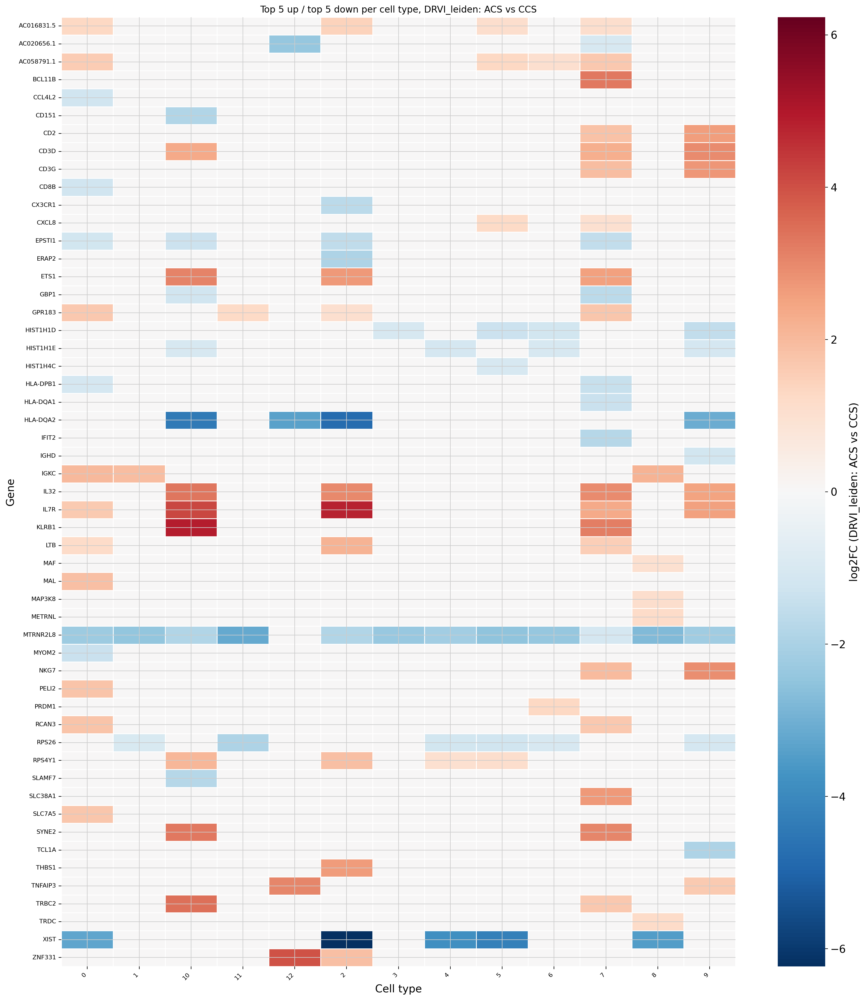

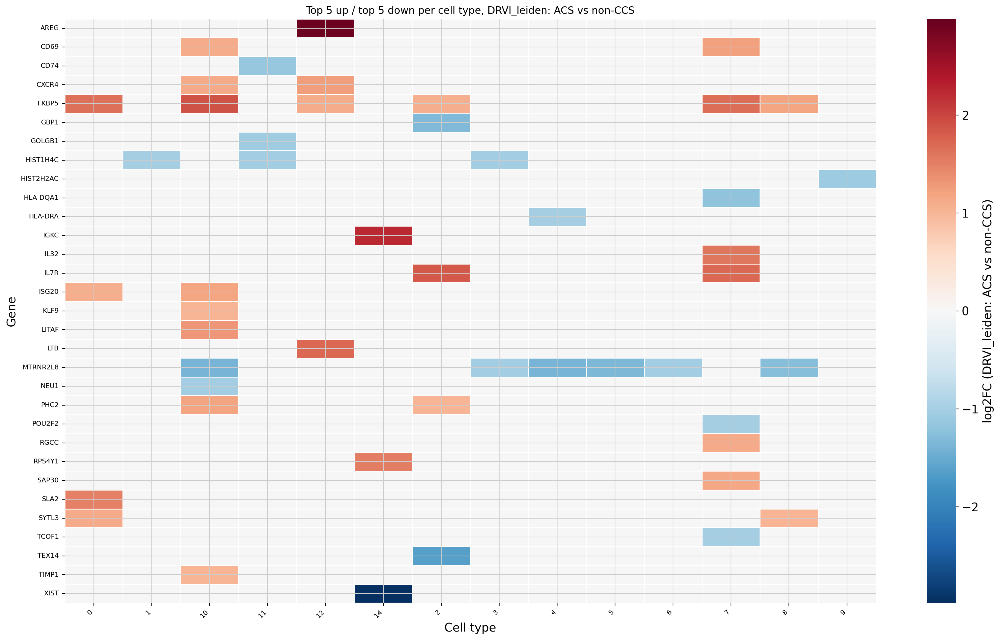

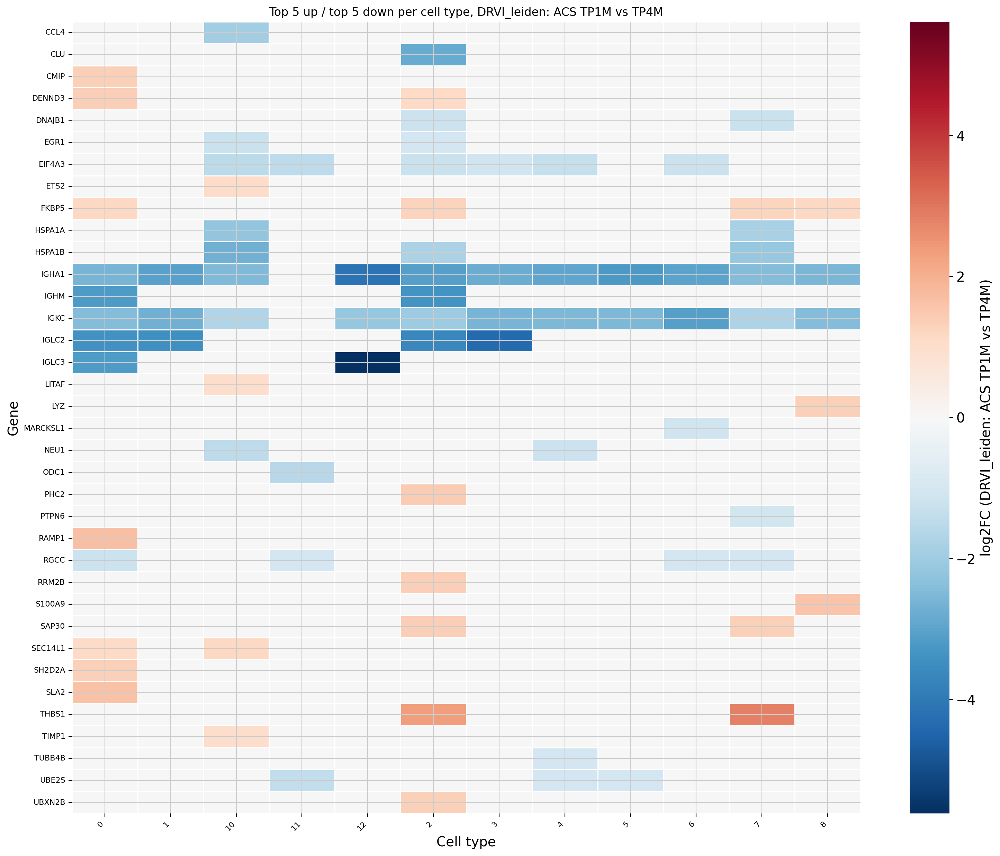



######################################################################
# DRVI_named  (cell_type_col = 'cell_type_DRVI')
######################################################################

DRVI_named: Comparison 1 — ACS (TP1M-TP4M) vs CCS


ACS sterile (all timepoints) vs CCS — 68,976 cells
condition
ACS_sterile    57056
CCS            11920
ACS patients: 19, CCS patients: 16



Pseudobulk samples: 475


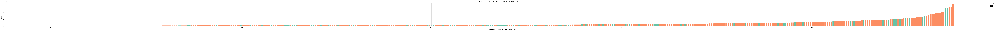

  B-cell: ACS_sterile=56, CCS=13 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.48 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.64 seconds.

Fitting LFCs...


... done in 0.43 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.14 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      11.395785        0.363072  0.372819  0.973856  0.330128  0.644388
AURKAIP1   11.245728        0.132275  0.219651  0.602206  0.547037  0.782282
MRPL20     10.568285       -0.084780  0.227489 -0.372676  0.709389  0.877931
SSU72      13.736819       -0.225947  0.193499 -1.167690  0.242932  0.549695
GNB1       14.543976        0.513412  0.223120  2.301055  0.021389  0.136273
...              ...             ...       ...       ...       ...       ...
MT-ND4L    42.471037        0.289184  0.154287  1.874327  0.060885  0.256726
MT-ND4    516.746350        0.031326  0.104746  0.299068  0.764888  0.901385
MT-ND5    161.065365        0.278439  0.107585  2.588078  0.009651  0.084950
MT-ND6     22.058140        0.261372  0.191295  1.366328  0.171836  0.461693
MT-CYB    635.812809       -0.015187  0.116078 -0.130834  0.895907  0.959114

[1733 ro

Fitting dispersions...


... done in 0.43 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.77 seconds.

Fitting LFCs...


... done in 0.86 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.16 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      22.567719        1.461237  1.118667  1.306231  0.191474  0.999248
SDF4        9.549107       -0.598343  0.847083 -0.706357  0.479966  0.999248
AURKAIP1   20.287642        0.640276  0.678680  0.943414  0.345469  0.999248
MRPL20     16.500035       -0.039551  0.666810 -0.059314  0.952702  0.999248
SSU72      17.342592       -0.189856  0.708114 -0.268115  0.788611  0.999248
...              ...             ...       ...       ...       ...       ...
MT-ND4L    47.847401        0.091022  0.476224  0.191134  0.848421  0.999248
MT-ND4    600.862582        0.197563  0.366770  0.538656  0.590124  0.999248
MT-ND5    205.977858        0.118476  0.320364  0.369818  0.711518  0.999248
MT-ND6     17.993281        0.348805  0.805898  0.432816  0.665149  0.999248
MT-CYB    682.714933       -0.150362  0.310111 -0.484864  0.627773  0.999248

[2578 ro

Fitting dispersions...


... done in 2.31 seconds.

Fitting dispersion trend curve...
... done in 0.14 seconds.

Fitting MAP dispersions...


... done in 2.45 seconds.

Fitting LFCs...


... done in 1.85 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.91 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
NOC2L          9.155024       -0.316244  0.253942 -1.245339  0.213007   
HES4           5.255231        0.933716  0.598651  1.559702  0.118830   
ISG15         73.619674       -0.487438  0.325703 -1.496574  0.134504   
SDF4          29.654299       -0.177602  0.152025 -1.168244  0.242708   
UBE2J2        19.108706       -0.208684  0.182718 -1.142106  0.253410   
...                 ...             ...       ...       ...       ...   
MT-ND4      1931.485593        0.268975  0.109101  2.465383  0.013687   
MT-ND5       571.416766        0.254950  0.097491  2.615107  0.008920   
MT-ND6        38.979656        0.564819  0.180212  3.134194  0.001723   
MT-CYB      1817.369536        0.105076  0.099549  1.055522  0.291187   
AC004556.1     3.621784       -1.040694  0.837069 -1.243260  0.213772   

                padj  
NOC2L       0.499530  
HES4      

Fitting dispersions...


... done in 0.66 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.98 seconds.

Fitting LFCs...


... done in 0.66 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.23 seconds.

Fitting size factors...
... done in 0.02 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       49.797543       -0.327691  0.243461 -1.345966  0.178313  0.493441
ISG15      44.049352       -0.941739  0.333413 -2.824541  0.004735  0.080173
SDF4        9.411840       -0.027445  0.278014 -0.098719  0.921361  0.982136
AURKAIP1   21.516956       -0.207834  0.220697 -0.941715  0.346338  0.656965
MRPL20     16.542500        0.208149  0.220801  0.942701  0.345834  0.656860
...              ...             ...       ...       ...       ...       ...
MT-ND4L    56.653334        0.435730  0.196991  2.211929  0.026972  0.188030
MT-ND4    637.775285        0.390191  0.135513  2.879367  0.003985  0.071947
MT-ND5    238.687273        0.414695  0.135683  3.056345  0.002241  0.050933
MT-ND6     21.501677        0.745402  0.263946  2.824066  0.004742  0.080173
MT-CYB    797.744260        0.000760  0.126425  0.006009  0.995206  0.999064

[2925 ro

Fitting dispersions...


... done in 1.77 seconds.

Fitting dispersion trend curve...
... done in 0.14 seconds.

Fitting MAP dispersions...


... done in 2.32 seconds.

Fitting LFCs...


... done in 1.59 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.41 seconds.

Fitting size factors...
... done in 0.02 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       18.206326        0.134058  0.170965  0.784125  0.432967  0.658056
ISG15       61.597718       -0.246606  0.167155 -1.475311  0.140129  0.350350
TNFRSF18    15.428538       -0.555787  0.245192 -2.266743  0.023406  0.111992
SDF4        45.043385       -0.133983  0.125451 -1.068007  0.285518  0.525316
B3GALT6      6.133622       -0.606306  0.282699 -2.144709  0.031976  0.137222
...               ...             ...       ...       ...       ...       ...
MT-ND4L    139.764137        0.310582  0.144977  2.142284  0.032171  0.137755
MT-ND4    1533.536115        0.063911  0.081266  0.786443  0.431608  0.657128
MT-ND5     676.471681        0.229961  0.071198  3.229883  0.001238  0.014515
MT-ND6      82.118689        0.236728  0.121923  1.941625  0.052183  0.189130
MT-CYB    2052.543473        0.040560  0.085788  0.472792  0.636362  0.8036

Fitting dispersions...


... done in 2.49 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...


... done in 3.26 seconds.

Fitting LFCs...


... done in 2.04 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.54 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AL669831.5    15.549094        0.491116  0.186183  2.637819  8.344117e-03   
NOC2L         41.106505        0.008505  0.112415  0.075656  9.396927e-01   
HES4          10.653921       -0.256538  0.359847 -0.712909  4.759018e-01   
ISG15        170.799088       -0.183663  0.154139 -1.191542  2.334408e-01   
C1orf159       6.707373        0.049017  0.280911  0.174493  8.614778e-01   
...                 ...             ...       ...       ...           ...   
MT-ND5      1590.360300        0.283864  0.082032  3.460414  5.393452e-04   
MT-ND6       208.246516        0.517041  0.084193  6.141135  8.193408e-10   
MT-CYB      7307.594440       -0.164188  0.110088 -1.491430  1.358486e-01   
AL592183.1    16.068274       -0.134630  0.218204 -0.616993  5.372394e-01   
AC004556.1     8.267695       -1.302217  0.570912 -2.280941  2.255193e-02   

        

Fitting dispersions...


... done in 0.82 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 1.13 seconds.

Fitting LFCs...


... done in 0.79 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.23 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      24.739338       -0.080468  0.247341 -0.325331  0.744931  0.933759
SDF4       10.605964       -0.126206  0.200020 -0.630968  0.528061  0.852369
UBE2J2      7.155804       -0.125270  0.220137 -0.569055  0.569319       NaN
AURKAIP1   17.167321       -0.175171  0.163894 -1.068805  0.285158  0.687025
CCNL2       7.730159        0.469764  0.247329  1.899348  0.057519  0.366818
...              ...             ...       ...       ...       ...       ...
MT-ND4L    49.402140        0.389392  0.152979  2.545398  0.010915  0.169807
MT-ND4    645.477826       -0.036201  0.117297 -0.308626  0.757606  0.936334
MT-ND5    252.865115        0.270537  0.107911  2.507041  0.012175  0.185981
MT-ND6     33.273895        0.408420  0.137783  2.964223  0.003034  0.093906
MT-CYB    994.241702       -0.220101  0.102690 -2.143358  0.032084  0.279120

[3056 ro

ACS sterile (TP1M) vs Control — 29,263 cells
condition2
ACS_sterile    14665
Control        14598



Pseudobulk samples: 208


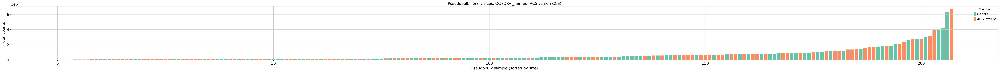

  B-cell: ACS_sterile=13, Control=16 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.33 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...


... done in 0.37 seconds.

Fitting LFCs...
... done in 0.19 seconds.

Calculating cook's distance...


... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AURKAIP1   11.640988       -0.012238  0.193098 -0.063376  0.949467  0.993214
SSU72      12.548323       -0.044003  0.166926 -0.263609  0.792081  0.939005
GNB1       13.850203       -0.084396  0.188368 -0.448038  0.654126  0.893731
TNFRSF14   10.638119       -0.148610  0.177399 -0.837716  0.402190  0.756362
RPL22     285.976251        0.040731  0.062221  0.654618  0.512714  0.824917
...              ...             ...       ...       ...       ...       ...
MT-ND4L    47.430452       -0.531652  0.166459 -3.193888  0.001404  0.063739
MT-ND4    538.407040        0.008600  0.058278  0.147565  0.882686  0.979342
MT-ND5    171.777248       -0.063570  0.084399 -0.753207  0.451326  0.786027
MT-ND6     23.654427       -0.467192  0.163988 -2.848944  0.004386  0.114421
MT-CYB    691.565432        0.144185  0.074052  1.947066  0.051527  0.348806

[12

Fitting dispersions...


... done in 0.42 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.48 seconds.

Fitting LFCs...


... done in 0.29 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.12 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      16.194082        0.496060  0.445238  1.114145  0.265217  0.625387
AURKAIP1   19.080136        0.068199  0.206590  0.330119  0.741310  0.895223
MRPL20     15.861507       -0.283482  0.222788 -1.272426  0.203222  0.568572
SSU72      15.653663        0.050629  0.230862  0.219302  0.826415  0.926691
GNB1       29.500348       -0.131658  0.177320 -0.742487  0.457793  0.779135
...              ...             ...       ...       ...       ...       ...
MT-ND4L    54.441409       -0.634744  0.154279 -4.114263  0.000039  0.004677
MT-ND4    674.182321        0.158682  0.101091  1.569698  0.116485  0.443824
MT-ND5    224.004247        0.014009  0.109366  0.128097  0.898072  0.963622
MT-ND6     19.110394       -0.726100  0.241962 -3.000877  0.002692  0.068962
MT-CYB    710.134731        0.388770  0.110309  3.524366  0.000424  0.026003

[18

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.56 seconds.

Fitting dispersion trend curve...
... done in 0.15 seconds.

Fitting MAP dispersions...


... done in 1.65 seconds.

Fitting LFCs...


... done in 1.30 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.34 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      10.544265       -0.021109  0.179363 -0.117691  0.906312  0.966264
ISG15      70.513296        0.034469  0.253343  0.136056  0.891777  0.962002
SDF4       34.117728        0.043847  0.112786  0.388764  0.697451  0.881512
UBE2J2     23.302975       -0.219702  0.116739 -1.881994  0.059837  0.273152
ACAP3      11.052898        0.111004  0.190484  0.582745  0.560065  0.807475
...              ...             ...       ...       ...       ...       ...
MT-ND4L   268.774534       -0.551374  0.140143 -3.934362  0.000083  0.005093
MT-ND4   2765.314229        0.033827  0.070568  0.479353  0.631688  0.850763
MT-ND5    807.252367       -0.071148  0.083473 -0.852348  0.394021  0.700676
MT-ND6     51.349545       -0.365981  0.128808 -2.841284  0.004493  0.061999
MT-CYB   2420.822035        0.237580  0.070832  3.354156  0.000796  0.021632

[62

Fitting dispersions...


... done in 0.64 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.69 seconds.

Fitting LFCs...


... done in 0.37 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       55.285963       -0.130740  0.168607 -0.775413  0.438096  0.761786
ISG15      49.718410       -0.253098  0.177643 -1.424751  0.154229  0.480908
SDF4       10.905721        0.142864  0.181075  0.788977  0.430125  0.757357
AURKAIP1   24.307281        0.067730  0.140189  0.483135  0.629000  0.869617
MRPL20     19.417616        0.137186  0.140134  0.978961  0.327599  0.688116
...              ...             ...       ...       ...       ...       ...
MT-ND4L    74.242532       -0.523331  0.181281 -2.886850  0.003891  0.072433
MT-ND4    796.989230        0.029297  0.092982  0.315085  0.752697  0.913488
MT-ND5    295.262436       -0.073930  0.102117 -0.723975  0.469081  0.784704
MT-ND6     27.793608       -0.403608  0.198780 -2.030425  0.042313  0.269014
MT-CYB    945.129308        0.240188  0.086224  2.785631  0.005342  0.086170

[26

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.23 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.29 seconds.

Fitting LFCs...


... done in 0.69 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.59 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       16.260847       -0.074717  0.134016 -0.557523  0.577170  0.795277
ISG15       51.256245       -0.322552  0.122207 -2.639389  0.008306  0.080879
TNFRSF18    16.133952       -0.230265  0.297220 -0.774730  0.438499  0.704066
SDF4        38.088923        0.281254  0.111716  2.517590  0.011816  0.100561
UBE2J2      17.925061       -0.200810  0.126057 -1.593009  0.111158  0.354568
...               ...             ...       ...       ...       ...       ...
MT-ND4L    134.265619       -0.508617  0.117323 -4.335197  0.000015  0.001255
MT-ND4    1465.793430       -0.013485  0.053060 -0.254144  0.799385  0.917367
MT-ND5     649.889137       -0.012317  0.066414 -0.185457  0.852871  0.943962
MT-ND6      77.733523       -0.497085  0.155674 -3.193116  0.001407  0.027047
MT-CYB    1955.482520        0.054554  0.063343  0.861247  0.389102  0

Fitting dispersions...


... done in 1.94 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...


... done in 2.04 seconds.

Fitting LFCs...


... done in 1.08 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 3 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.41 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
AL669831.5    15.961554        0.022526  0.162680  0.138467  0.889871   
NOC2L         39.783747        0.019856  0.093719  0.211868  0.832210   
HES4          13.377788       -0.870693  0.340879 -2.554259  0.010641   
ISG15        158.412543       -0.133207  0.141240 -0.943124  0.345617   
TNFRSF18      14.397714        0.271162  0.303769  0.892658  0.372040   
...                 ...             ...       ...       ...       ...   
MT-ND4      5234.294910        0.018813  0.058677  0.320624  0.748495   
MT-ND5      1771.401913       -0.039071  0.067404 -0.579651  0.562150   
MT-ND6       237.917749       -0.476316  0.122338 -3.893426  0.000099   
MT-CYB      8066.976957        0.086122  0.074636  1.153893  0.248544   
AL592183.1    15.285425       -0.017617  0.233829 -0.075340  0.939944   

                padj  
AL669831.5  0.955313  
NOC2L

Fitting dispersions...


... done in 0.38 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...


... done in 0.41 seconds.

Fitting LFCs...


... done in 0.42 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...
... done in 0.10 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      19.699782        0.010969  0.222494  0.049302  0.960679  0.992291
AURKAIP1   14.419759        0.339477  0.152982  2.219073  0.026482  0.197341
MRPL20     14.956031       -0.205217  0.154431 -1.328859  0.183895  0.495014
SSU72      18.478461        0.108792  0.142484  0.763536  0.445144  0.751890
GNB1       17.210938       -0.119348  0.151314 -0.788745  0.430261  0.738403
...              ...             ...       ...       ...       ...       ...
MT-ND4L    48.031875       -0.469247  0.137038 -3.424220  0.000617  0.029045
MT-ND4    599.676530       -0.011159  0.069967 -0.159495  0.873279  0.972030
MT-ND5    238.071244       -0.005583  0.083579 -0.066805  0.946737  0.992102
MT-ND6     31.735252       -0.346261  0.168883 -2.050298  0.040335  0.250954
MT-CYB    932.031807        0.015790  0.078648  0.200773  0.840876  0.959443

[14

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.25 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.28 seconds.

Fitting LFCs...
... done in 0.18 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.08 seconds.



Log2 fold change & Wald test p-value: condition2 ACS_sterile vs Control
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
GNB1      17.736130       -0.378880  0.394300 -0.960892  0.336606  0.881759
RER1       9.934195        0.151467  0.504619  0.300161  0.764054  0.968903
RPL22    142.449107       -0.269999  0.167447 -1.612448  0.106864  0.797888
PARK7     54.464076       -0.121819  0.230177 -0.529240  0.596639  0.949563
ENO1      11.584466        0.407746  0.479110  0.851049  0.394742  0.911482
...             ...             ...       ...       ...       ...       ...
MT-ND4L   21.924317       -0.006988  0.349753 -0.019979  0.984060  0.999407
MT-ND4   297.460608        0.429448  0.156434  2.745233  0.006047  0.441213
MT-ND5   122.264642        0.249315  0.172149  1.448252  0.147547  0.797888
MT-ND6     9.330004       -0.070083  0.514875 -0.136116  0.891730  0.997509
MT-CYB   284.719532        0.405888  0.155052  2.617763  0.008851  0.441213

[1173 rows x 6 

ACS sterile TP1M vs TP4M — 26,074 cells
timepoint
TP1M    14665
TP4M    11409

Patients: 19



Pseudobulk samples: 169


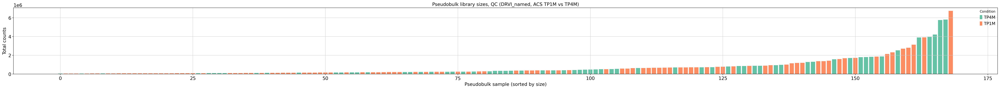

  B-cell: 7 paired patients
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.20 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.26 seconds.

Fitting LFCs...
... done in 0.20 seconds.



Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.08 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     11.916250       -0.139150  0.398573 -0.349119  0.727000       NaN
GNB1      13.176443        0.271661  0.361244  0.752014  0.452043       NaN
RPL22    303.185706       -0.088891  0.097222 -0.914313  0.360552  0.643225
PARK7     21.334088       -0.056753  0.289590 -0.195978  0.844627       NaN
ENO1      16.008243       -0.163259  0.328689 -0.496696  0.619404       NaN
...             ...             ...       ...       ...       ...       ...
MT-ND4L   42.775249       -0.387659  0.234612 -1.652341  0.098465       NaN
MT-ND4   474.042613        0.269879  0.108328  2.491310  0.012727  0.094606
MT-ND5   151.173357        0.298342  0.134434  2.219248  0.026470  0.151353
MT-ND6    21.489206       -0.123012  0.281650 -0.436755  0.662289       NaN
MT-CYB   628.383761        0.417814  0.092137  4.534707  0.000006  0.000322

[1088 rows x 6 columns]
  

Fitting dispersions...


... done in 0.38 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.52 seconds.

Fitting LFCs...


... done in 0.44 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      45.593073       -0.888057  1.058954 -0.838617  0.401684  0.998702
SDF4       10.441539        0.036115  0.706743  0.051101  0.959245  0.998702
AURKAIP1   22.255963       -0.238374  0.521658 -0.456954  0.647704  0.998702
MRPL20     20.563131       -0.482884  0.529760 -0.911515  0.362024  0.998702
SSU72      20.270739        0.229722  0.524663  0.437846  0.661498  0.998702
...              ...             ...       ...       ...       ...       ...
MT-ND4L    52.572382       -0.433103  0.366538 -1.181606  0.237362  0.998702
MT-ND4    714.228329        0.531403  0.209221  2.539914  0.011088  0.998702
MT-ND5    259.406562        0.402703  0.239282  1.682961  0.092383  0.998702
MT-ND6     21.410508       -0.459097  0.525130 -0.874253  0.381980  0.998702
MT-CYB    861.433677        0.415926  0.203261  2.046268  0.040730  0.998702

[2642 rows x 6

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 1.07 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...


... done in 1.56 seconds.

Fitting LFCs...


... done in 1.10 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.36 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
NOC2L         17.924973       -0.167160  0.332225 -0.503152  0.614857   
ISG15        179.351049       -0.946958  0.466625 -2.029379  0.042420   
SDF4          57.210457       -0.043584  0.214917 -0.202795  0.839295   
UBE2J2        35.174087        0.069175  0.253287  0.273110  0.784768   
ACAP3         17.830545       -0.086103  0.320878 -0.268334  0.788442   
...                 ...             ...       ...       ...       ...   
MT-ND4      3970.187715        0.456676  0.123954  3.684249  0.000229   
MT-ND5      1192.283041        0.274930  0.111571  2.464181  0.013733   
MT-ND6        73.796009       -0.131056  0.188018 -0.697041  0.485777   
MT-CYB      3853.086874        0.417341  0.119590  3.489763  0.000483   
AL592183.1    11.013742        0.077050  0.426467  0.180671  0.856626   

                padj  
NOC2L       0.952905  
ISG15       0.41

Fitting dispersions...


... done in 0.33 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.45 seconds.

Fitting LFCs...


... done in 0.34 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.13 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       53.655999       -0.572370  0.251348 -2.277205  0.022774  0.303000
ISG15      63.187081       -0.628990  0.401684 -1.565884  0.117376  0.663094
AURKAIP1   21.981201        0.188382  0.319141  0.590277  0.555005  0.952795
MRPL20     18.866409        0.237501  0.314578  0.754984  0.450259  0.929305
SSU72      24.653256       -0.023115  0.286193 -0.080768  0.935626  0.986529
...              ...             ...       ...       ...       ...       ...
MT-ND4L    59.952968       -0.451999  0.226201 -1.998219  0.045693  0.434968
MT-ND4    710.858440        0.510461  0.181592  2.811025  0.004938  0.141149
MT-ND5    263.747884        0.295018  0.166770  1.769016  0.076891  0.545607
MT-ND6     23.984747       -0.083764  0.319970 -0.261788  0.793485  0.977764
MT-CYB    943.320280        0.218101  0.166128  1.312848  0.189234  0.769131

[1971 rows x 6

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.85 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...


... done in 1.23 seconds.

Fitting LFCs...


... done in 0.92 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.29 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       24.144778       -0.147334  0.219621 -0.670858  0.502311  0.820314
ISG15       89.868505       -0.613932  0.204314 -3.004846  0.002657  0.066778
TNFRSF18    24.319177        0.335044  0.263081  1.273540  0.202827  0.594595
SDF4        61.181470        0.342332  0.174874  1.957594  0.050278  0.334139
UBE2J2      27.409939       -0.186190  0.193832 -0.960574  0.336766  0.714720
...               ...             ...       ...       ...       ...       ...
MT-ND4L    203.513441       -0.451092  0.178519 -2.526859  0.011509  0.160852
MT-ND4    2085.926205        0.282966  0.097874  2.891141  0.003838  0.083187
MT-ND5     937.262531        0.277252  0.090455  3.065091  0.002176  0.057002
MT-ND6     118.721193       -0.331706  0.158792 -2.088929  0.036714  0.290297
MT-CYB    3055.838576        0.138236  0.079784  1.732623  0.083163  0.415686

[5

Fitting dispersions...


... done in 1.41 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...


... done in 1.88 seconds.

Fitting LFCs...


... done in 1.57 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.43 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
AL669831.5    21.633046        0.163759  0.232539  0.704222  0.481294   
NOC2L         49.384751        0.249868  0.164746  1.516681  0.129347   
HES4          13.537181       -0.681577  0.322063 -2.116288  0.034320   
ISG15        252.366640       -0.560366  0.164511 -3.406248  0.000659   
C1orf159      10.709299       -0.499391  0.327565 -1.524555  0.127370   
...                 ...             ...       ...       ...       ...   
MT-ND5      2086.820290        0.358182  0.074353  4.817290  0.000001   
MT-ND6       272.967889       -0.177241  0.086444 -2.050357  0.040330   
MT-CYB      9756.523528        0.309909  0.069090  4.485576  0.000007   
AL592183.1    20.913524       -0.034923  0.266251 -0.131167  0.895643   
AC004556.1    16.550467       -0.481735  0.336767 -1.430470  0.152582   

                padj  
AL669831.5       NaN  
NOC2L       0.48

Fitting dispersions...


... done in 0.50 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.69 seconds.

Fitting LFCs...


... done in 0.57 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.18 seconds.



Log2 fold change & Wald test p-value: timepoint TP1M vs TP4M
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       39.417199       -0.471307  0.260243 -1.811028  0.070137  0.307138
SDF4        12.475860       -0.053944  0.296181 -0.182131  0.855480       NaN
UBE2J2       9.566520       -0.223537  0.318917 -0.700926  0.483349       NaN
AURKAIP1    19.891390       -0.066576  0.235755 -0.282394  0.777641       NaN
CCNL2        9.470395        0.202476  0.342349  0.591433  0.554230       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND4L     64.761552       -0.174611  0.148019 -1.179655  0.238138  0.576019
MT-ND4     781.782492        0.398728  0.108464  3.676150  0.000237  0.008103
MT-ND5     316.076806        0.429121  0.119028  3.605209  0.000312  0.009193
MT-ND6      42.169772       -0.012308  0.174620 -0.070483  0.943809  0.985110
MT-CYB    1292.011567        0.283248  0.083689  3.384523  0.000713  0.017338

[3

ACS sterile (TP1M) vs CCS -- 26,585 cells
condition
ACS_sterile    14665
CCS            11920



Pseudobulk samples: 198


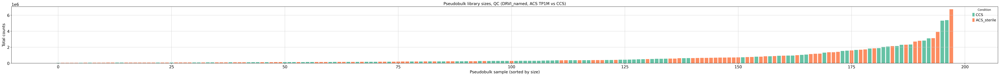

  B-cell: ACS_sterile=13, CCS=13 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.26 seconds.

Fitting dispersion trend curve...
... done in 0.02 seconds.

Fitting MAP dispersions...


... done in 0.29 seconds.

Fitting LFCs...
... done in 0.15 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.07 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     12.349765       -0.200803  0.169712 -1.183196  0.236732  0.564665
RPL22    276.677256        0.021671  0.066501  0.325875  0.744519  0.914338
PARK7     20.002695        0.167419  0.135089  1.239321  0.215227  0.542622
RERE      12.024552       -0.440257  0.191244 -2.302073  0.021331  0.152846
ENO1      15.488072       -0.203797  0.173229 -1.176463  0.239410  0.566815
...             ...             ...       ...       ...       ...       ...
MT-ND4L   35.125219        0.121848  0.155379  0.784195  0.432925  0.729813
MT-ND4   493.822232        0.141024  0.060316  2.338079  0.019383  0.150211
MT-ND5   144.763338        0.282991  0.089987  3.144786  0.001662  0.035999
MT-ND6    18.548381        0.078526  0.188080  0.417514  0.676303  0.891711
MT-CYB   655.157021        0.196543  0.084311  2.331164  0.019745  0.150211

[953 rows x 6 column

Fitting dispersions...


... done in 0.46 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.51 seconds.

Fitting LFCs...


... done in 0.28 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...


Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      20.292680        0.059484  0.394079  0.150945  0.880019  0.959267
AURKAIP1   22.035950       -0.024852  0.199503 -0.124567  0.900866  0.966070
MRPL20     17.572859       -0.176091  0.192214 -0.916122  0.359603  0.766882
SSU72      19.675729       -0.313856  0.177498 -1.768221  0.077024  0.445139
GNB1       31.935525        0.038043  0.155634  0.244442  0.806889  0.940366
...              ...             ...       ...       ...       ...       ...
MT-ND4L    48.518928        0.170346  0.173567  0.981443  0.326375  0.745309
MT-ND4    707.626054        0.470451  0.104025  4.522468  0.000006  0.001258
MT-ND5    226.948939        0.473663  0.119643  3.958973  0.000075  0.010970
MT-ND6     16.163538        0.297318  0.251708  1.181204  0.237522  0.649763
MT-CYB    827.149015        0.265071  0.090306  2.935264  0.003333  0.118693

[2008 ro

... done in 0.01 seconds.



Fitting dispersions...


... done in 1.44 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.55 seconds.

Fitting LFCs...


... done in 1.26 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.31 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L      11.342136       -0.260062  0.169810 -1.531487  1.256491e-01   
ISG15      70.881711       -0.006687  0.244022 -0.027402  9.781393e-01   
SDF4       36.226986       -0.120692  0.102840 -1.173593  2.405582e-01   
UBE2J2     23.882591       -0.310666  0.111709 -2.781022  5.418808e-03   
ACAP3       9.457109        0.249816  0.163933  1.523887  1.275369e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L   189.928810        0.373073  0.121136  3.079781  2.071532e-03   
MT-ND4   2374.730921        0.464540  0.058650  7.920540  2.364804e-15   
MT-ND5    690.783077        0.355744  0.078026  4.559276  5.133032e-06   
MT-ND6     40.476890        0.311023  0.113648  2.736716  6.205588e-03   
MT-CYB   2313.178269        0.331763  0.066679  4.975541  6.506552e-07   

                 padj  
NOC2L    3.007285e-0

Fitting dispersions...


... done in 0.60 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.64 seconds.

Fitting LFCs...


... done in 0.36 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
HES4        56.696132       -0.053516  0.179550 -0.298058  7.656586e-01   
ISG15       49.832558       -0.122765  0.238919 -0.513838  6.073655e-01   
SDF4        11.548462        0.061780  0.185194  0.333598  7.386832e-01   
AURKAIP1    26.698195       -0.060415  0.147557 -0.409438  6.822182e-01   
MRPL20      19.043443        0.292117  0.165481  1.765262  7.751976e-02   
...               ...             ...       ...       ...           ...   
MT-ND4L     60.878986        0.164930  0.136661  1.206852  2.274890e-01   
MT-ND4     750.535905        0.430649  0.081957  5.254576  1.483661e-07   
MT-ND5     272.909618        0.358659  0.090028  3.983854  6.780666e-05   
MT-ND6      21.887734        0.406764  0.152823  2.661661  7.775604e-03   
MT-CYB    1026.103801        0.208327  0.095184  2.188670  2.862084e-02   

              padj  
HES4      0

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.21 seconds.

Fitting dispersion trend curve...
... done in 0.13 seconds.

Fitting MAP dispersions...


... done in 1.27 seconds.

Fitting LFCs...


... done in 0.86 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.26 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       16.050877       -0.025714  0.138086 -0.186219  0.852273  0.922143
ISG15       51.161709       -0.240865  0.124279 -1.938094  0.052612  0.152155
TNFRSF18    14.988210        0.061613  0.248130  0.248309  0.803895  0.892493
SDF4        43.544662       -0.018354  0.108438 -0.169257  0.865594  0.930820
UBE2J2      17.801672       -0.170199  0.129565 -1.313623  0.188973  0.369848
...               ...             ...       ...       ...       ...       ...
MT-ND4L    110.847532        0.054000  0.113817  0.474444  0.635183  0.783158
MT-ND4    1389.500544        0.206543  0.056696  3.642996  0.000269  0.003123
MT-ND5     598.101861        0.305478  0.066438  4.597914  0.000004  0.000116
MT-ND6      63.650142        0.043360  0.109984  0.394236  0.693407  0.823603
MT-CYB    1924.800273        0.165344  0.075326  2.195055  0.028160  0.0987

Fitting dispersions...


... done in 1.93 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...


... done in 2.05 seconds.

Fitting LFCs...


... done in 1.05 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 3 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.39 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AL669831.5    13.894063        0.427035  0.167730  2.545962  1.089771e-02   
NOC2L         41.139518       -0.059411  0.096081 -0.618341  5.363507e-01   
HES4           9.931466       -0.278292  0.275550 -1.009952  3.125183e-01   
ISG15        154.208656       -0.108077  0.126582 -0.853810  3.932104e-01   
TNFRSF18      14.710970        0.160997  0.330230  0.487530  6.258831e-01   
...                 ...             ...       ...       ...           ...   
MT-ND4      4889.055850        0.200330  0.057752  3.468809  5.227714e-04   
MT-ND5      1532.107636        0.380223  0.065711  5.786278  7.196315e-09   
MT-ND6       174.672744        0.369656  0.071770  5.150597  2.596592e-07   
MT-CYB      7982.876632        0.096887  0.074837  1.294640  1.954446e-01   
AL592183.1    14.927942        0.027357  0.319674  0.085579  9.318010e-01   

        

Fitting dispersions...


... done in 0.51 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.53 seconds.

Fitting LFCs...


... done in 0.47 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.12 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      20.724002       -0.017139  0.242248 -0.070750  0.943597  0.977593
SDF4        9.923496       -0.120876  0.179132 -0.674787  0.499811       NaN
AURKAIP1   16.361834       -0.005132  0.137398 -0.037353  0.970203  0.990909
MRPL20     15.322844       -0.172912  0.162735 -1.062534  0.287993  0.602369
SSU72      19.269050        0.131856  0.135387  0.973917  0.330098  0.639395
...              ...             ...       ...       ...       ...       ...
MT-ND4L    38.203447        0.321320  0.119264  2.694187  0.007056  0.083874
MT-ND4    586.129150        0.180616  0.075959  2.377803  0.017416  0.145718
MT-ND5    219.565515        0.383235  0.098357  3.896369  0.000098  0.005150
MT-ND6     26.175897        0.250606  0.120366  2.082025  0.037340  0.221444
MT-CYB    961.828274        0.043004  0.082949  0.518443  0.604149  0.824077

[1994 ro

ACS sterile (TP2M) vs CCS -- 31,631 cells
condition
ACS_sterile    19711
CCS            11920



Pseudobulk samples: 219


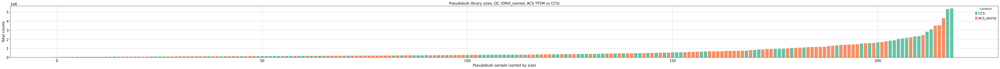

  B-cell: ACS_sterile=19, CCS=13 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.36 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.39 seconds.

Fitting LFCs...


... done in 0.22 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AURKAIP1   11.609353       -0.075070  0.191889 -0.391217  0.695637  0.832248
MRPL20     10.820308        0.199852  0.177656  1.124940  0.260614  0.477564
SSU72      15.020057       -0.097732  0.142766 -0.684558  0.493623  0.693268
GNB1       14.568311        0.180747  0.159873  1.130571  0.258236  0.476347
TNFRSF14   11.936140       -0.268470  0.168165 -1.596464  0.110385  0.293726
...              ...             ...       ...       ...       ...       ...
MT-ND4L    41.927795        0.248002  0.108926  2.276782  0.022799  0.101176
MT-ND4    535.171092        0.024585  0.089873  0.273550  0.784431  0.885833
MT-ND5    167.785926        0.298266  0.086395  3.452361  0.000556  0.006327
MT-ND6     23.864309        0.347518  0.152454  2.279493  0.022638  0.100782
MT-CYB    640.216278       -0.185884  0.100510 -1.849395  0.064401  0.202382

[1389 ro

Fitting dispersions...


... done in 0.49 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.57 seconds.

Fitting LFCs...


... done in 0.32 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.13 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      18.918953        0.002550  0.247594  0.010299  0.991783  0.999191
AURKAIP1   20.304223       -0.115920  0.239505 -0.483998  0.628388  0.883679
MRPL20     16.805823       -0.099442  0.216516 -0.459281  0.646033  0.892441
SSU72      18.945658       -0.239692  0.183183 -1.308486  0.190708  0.578557
GNB1       29.770790        0.024470  0.163045  0.150082  0.880700  0.979021
...              ...             ...       ...       ...       ...       ...
MT-ND4L    49.900196        0.340583  0.138574  2.457778  0.013980  0.170877
MT-ND4    594.683602        0.217019  0.117201  1.851684  0.064071  0.344484
MT-ND5    204.164947        0.373141  0.106108  3.516622  0.000437  0.022503
MT-ND6     17.336646        0.631333  0.206707  3.054248  0.002256  0.060874
MT-CYB    669.733979       -0.083962  0.112121 -0.748850  0.453948  0.785916

[2160 ro

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.31 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.38 seconds.

Fitting LFCs...


... done in 0.74 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.26 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
ISG15       65.505965        0.125461  0.275795  0.454905  6.491775e-01   
SDF4        32.936969       -0.103365  0.094286 -1.096296  2.729493e-01   
UBE2J2      20.932461       -0.332413  0.114247 -2.909595  3.618974e-03   
INTS11      12.792935       -0.192127  0.149875 -1.281913  1.998731e-01   
AURKAIP1    67.240974       -0.335549  0.080682 -4.158901  3.197822e-05   
...               ...             ...       ...       ...           ...   
MT-ND4L    169.710340        0.395898  0.090090  4.394482  1.110371e-05   
MT-ND4    1975.489934        0.291827  0.068780  4.242899  2.206512e-05   
MT-ND5     592.088000        0.269859  0.072607  3.716707  2.018362e-04   
MT-ND6      41.853691        0.698810  0.121063  5.772292  7.820061e-09   
MT-CYB    1834.530768        0.036841  0.068774  0.535681  5.921790e-01   

                  padj  
ISG15  

Fitting dispersions...


... done in 0.69 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.73 seconds.

Fitting LFCs...


... done in 0.40 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.17 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
HES4       52.940068       -0.059096  0.196032 -0.301460  7.630636e-01   
ISG15      41.555272       -0.403603  0.233850 -1.725909  8.436373e-02   
SDF4       10.177985       -0.073967  0.189562 -0.390201  6.963876e-01   
AURKAIP1   23.736115       -0.314890  0.143367 -2.196393  2.806380e-02   
MRPL20     17.340997        0.217253  0.164214  1.322991  1.858385e-01   
...              ...             ...       ...       ...           ...   
MT-ND4L    63.734165        0.401122  0.108078  3.711402  2.061145e-04   
MT-ND4    696.024144        0.370202  0.083851  4.415023  1.009991e-05   
MT-ND5    265.191741        0.414098  0.071833  5.764710  8.179830e-09   
MT-ND6     24.098499        0.826091  0.154848  5.334833  9.563228e-08   
MT-CYB    835.441354       -0.145297  0.072394 -2.007020  4.474757e-02   

              padj  
HES4      0.876075  
IS

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.62 seconds.

Fitting dispersion trend curve...
... done in 0.17 seconds.

Fitting MAP dispersions...


... done in 1.63 seconds.

Fitting LFCs...


... done in 0.87 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.31 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       19.475583       -0.161222  0.121016 -1.332236  0.182783  0.348039
ISG15       64.185626       -0.229149  0.108662 -2.108814  0.034961  0.106889
TNFRSF18    16.102058       -0.484625  0.288882 -1.677586  0.093428  0.217132
SDF4        50.487601       -0.222162  0.087083 -2.551142  0.010737  0.044402
UBE2J2      22.851186       -0.082830  0.111140 -0.745271  0.456108  0.628729
...               ...             ...       ...       ...       ...       ...
MT-ND4L    147.612587        0.171568  0.074901  2.290603  0.021986  0.076249
MT-ND4    1655.302480        0.048789  0.083043  0.587514  0.556859  0.714281
MT-ND5     713.475376        0.143518  0.062249  2.305538  0.021136  0.074129
MT-ND6      88.212558        0.257435  0.085177  3.022354  0.002508  0.014398
MT-CYB    2153.435968       -0.162115  0.087380 -1.855301  0.063553  0.1656

Fitting dispersions...


... done in 2.35 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.



Fitting MAP dispersions...


... done in 2.12 seconds.

Fitting LFCs...


... done in 1.08 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 3 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.40 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE       stat        pvalue  \
AL669831.5    13.552595        0.316729  0.152013   2.083569  3.719939e-02   
NOC2L         38.610997       -0.153132  0.088432  -1.731625  8.334030e-02   
HES4           8.342939       -0.681686  0.326969  -2.084863  3.708171e-02   
ISG15        145.102347       -0.194074  0.122649  -1.582350  1.135698e-01   
TNFRSF18      14.365681        0.102053  0.215076   0.474500  6.351435e-01   
...                 ...             ...       ...        ...           ...   
MT-ND4      4333.252172       -0.066226  0.089791  -0.737561  4.607812e-01   
MT-ND5      1437.164845        0.258466  0.064132   4.030239  5.572019e-05   
MT-ND6       188.489037        0.576817  0.057490  10.033328  1.087868e-23   
MT-CYB      6653.848402       -0.348674  0.101437  -3.437338  5.874622e-04   
AL592183.1    13.845970       -0.119009  0.301122  -0.395219  6.926816e-01 

Fitting dispersions...


... done in 0.67 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 0.70 seconds.

Fitting LFCs...


... done in 0.73 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       23.315686       -0.202976  0.211498 -0.959706  0.337203  0.627837
SDF4        12.376571       -0.128098  0.157446 -0.813597  0.415876  0.684706
AURKAIP1    17.992564       -0.280047  0.126333 -2.216725  0.026642  0.152113
CCNL2        8.552730        0.175805  0.189698  0.926761  0.354051  0.643380
MRPL20      19.738702       -0.012504  0.125480 -0.099647  0.920624  0.966018
...               ...             ...       ...       ...       ...       ...
MT-ND4L     49.833999        0.376314  0.105989  3.550499  0.000385  0.008535
MT-ND4     676.911835        0.037105  0.092258  0.402186  0.687547  0.850426
MT-ND5     261.299201        0.302487  0.073384  4.121978  0.000038  0.001466
MT-ND6      35.031644        0.470975  0.110002  4.281497  0.000019  0.000854
MT-CYB    1031.794100       -0.290575  0.097987 -2.965450  0.003022  0.0368

ACS sterile (TP3M) vs CCS -- 23,191 cells
condition
CCS            11920
ACS_sterile    11271



Pseudobulk samples: 182


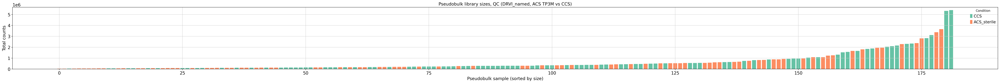

  B-cell: ACS_sterile=13, CCS=13 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


... done in 0.28 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...


... done in 0.29 seconds.

Fitting LFCs...
... done in 0.17 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.07 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
SSU72     12.634261       -0.184383  0.167912 -1.098088  0.272166  0.560589
GNB1      14.168386        0.273036  0.189146  1.443518  0.148875  0.403805
RPL22    279.488129        0.008503  0.068541  0.124065  0.901264  0.960570
PARK7     17.061204       -0.313328  0.154618 -2.026471  0.042717  0.201163
RERE      13.412252       -0.184687  0.195858 -0.942961  0.345701  0.639191
...             ...             ...       ...       ...       ...       ...
MT-ND4L   35.267926        0.138504  0.122623  1.129506  0.258684  0.553067
MT-ND4   462.092493       -0.067925  0.089568 -0.758362  0.448234  0.730431
MT-ND5   131.781132        0.014679  0.111096  0.132132  0.894880  0.958073
MT-ND6    17.576198        0.036936  0.192485  0.191890  0.847829  0.946064
MT-CYB   574.948865       -0.206748  0.101000 -2.047010  0.040657  0.198223

[1069 rows x 6 colum

Fitting dispersions...


... done in 0.45 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.49 seconds.

Fitting LFCs...


... done in 0.29 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      20.235267        0.425893  0.399653  1.065657  0.286579       NaN
AURKAIP1   20.745978        0.049012  0.315012  0.155586  0.876359       NaN
MRPL20     16.232019       -0.140185  0.292415 -0.479403  0.631652       NaN
SSU72      17.851908       -0.580502  0.322623 -1.799318  0.071968       NaN
GNB1       29.247632        0.102619  0.227600  0.450875  0.652080  0.948431
...              ...             ...       ...       ...       ...       ...
MT-ND4L    42.383822        0.132243  0.232501  0.568785  0.569502  0.943998
MT-ND4    507.059665       -0.129746  0.148893 -0.871408  0.383532  0.917903
MT-ND5    173.498396        0.133092  0.182876  0.727775  0.466752  0.927973
MT-ND6     16.114466        0.840083  0.364771  2.303042  0.021276       NaN
MT-CYB    637.316719       -0.219023  0.108010 -2.027813  0.042579  0.617949

[2002 ro

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 1.14 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...


... done in 1.16 seconds.

Fitting LFCs...


... done in 0.65 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.26 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       52.317023        0.411349  0.256462  1.603937  0.108728  0.386458
SDF4        22.267751       -0.141913  0.121369 -1.169271  0.242295  0.546514
UBE2J2      15.298786       -0.185488  0.144024 -1.287899  0.197781  0.493964
AURKAIP1    47.178600       -0.292029  0.096847 -3.015378  0.002567  0.049365
CCNL2       13.331868       -0.132820  0.179099 -0.741598  0.458331  0.742349
...               ...             ...       ...       ...       ...       ...
MT-ND4L    109.567916        0.202426  0.143880  1.406906  0.159455  0.451449
MT-ND4    1275.787496        0.050035  0.080595  0.620817  0.534720  0.784891
MT-ND5     383.510484        0.029930  0.095300  0.314055  0.753479  0.894220
MT-ND6      26.285025        0.439444  0.146044  3.008976  0.002621  0.049473
MT-CYB    1277.385409       -0.026595  0.072578 -0.366438  0.714038  0.8777

Fitting dispersions...


... done in 0.59 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...


... done in 0.63 seconds.

Fitting LFCs...


... done in 0.35 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       47.126130       -0.056252  0.265046 -0.212235  0.831923  0.938329
ISG15      39.688173       -0.255250  0.299457 -0.852378  0.394004  0.698536
SDF4        9.082801       -0.080072  0.269071 -0.297587  0.766018       NaN
AURKAIP1   22.321985       -0.136816  0.195776 -0.698838  0.484654       NaN
MRPL20     14.952897        0.221348  0.233092  0.949621  0.342305       NaN
...              ...             ...       ...       ...       ...       ...
MT-ND4L    50.247482        0.184997  0.185393  0.997864  0.318345  0.642203
MT-ND4    559.122021        0.224409  0.098770  2.272043  0.023084  0.140616
MT-ND5    207.046268        0.186109  0.117902  1.578500  0.114451  0.371666
MT-ND6     16.618732        0.380620  0.211144  1.802651  0.071443       NaN
MT-CYB    776.630988       -0.020264  0.108719 -0.186390  0.852139  0.946595

[2455 ro

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.26 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...


... done in 1.33 seconds.

Fitting LFCs...


... done in 0.69 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.26 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       15.136473       -0.058533  0.141241 -0.414419  0.678568  0.837317
ISG15       52.222435        0.017203  0.160836  0.106959  0.914822  0.966344
TNFRSF18    13.311032       -0.232103  0.261905 -0.886211  0.375504  0.617113
SDF4        38.723288       -0.226067  0.112381 -2.011613  0.044261  0.170393
UBE2J2      16.893742       -0.152938  0.137078 -1.115695  0.264553  0.508396
...               ...             ...       ...       ...       ...       ...
MT-ND4L    108.755809        0.176857  0.125464  1.409632  0.158648  0.376344
MT-ND4    1222.005118        0.015701  0.069139  0.227092  0.820352  0.914899
MT-ND5     532.689733        0.150374  0.071921  2.090835  0.036543  0.151102
MT-ND6      63.892482        0.222926  0.100478  2.218648  0.026511  0.124202
MT-CYB    1650.723524       -0.102149  0.087622 -1.165789  0.243700  0.4846

Fitting dispersions...


... done in 1.98 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...


... done in 2.11 seconds.

Fitting LFCs...


... done in 1.26 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 7 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.41 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AL669831.5    15.177516        0.546100  0.148392  3.680120  2.331240e-04   
NOC2L         43.646797       -0.033827  0.093703 -0.361003  7.180975e-01   
HES4          12.217626        0.138565  0.295123  0.469515  6.387014e-01   
ISG15        173.194911        0.066320  0.149603  0.443308  6.575433e-01   
TNFRSF18      15.432189        0.112620  0.220909  0.509804  6.101887e-01   
...                 ...             ...       ...       ...           ...   
MT-ND4      4782.142387       -0.027189  0.083382 -0.326076  7.443667e-01   
MT-ND5      1512.185203        0.191448  0.095209  2.010817  4.434478e-02   
MT-ND6       188.214002        0.405357  0.073878  5.486858  4.091467e-08   
MT-CYB      7561.522699       -0.239040  0.094205 -2.537444  1.116651e-02   
AL592183.1    17.258854        0.243459  0.296408  0.821364  4.114388e-01   

        

Fitting dispersions...


... done in 0.62 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.63 seconds.

Fitting LFCs...


... done in 0.34 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       24.263166       -0.058320  0.238274 -0.244760  0.806642  0.922849
SDF4        10.608304       -0.516630  0.176851 -2.921271  0.003486  0.067029
AURKAIP1    17.257373       -0.380601  0.139275 -2.732732  0.006281  0.094478
MRPL20      19.790707       -0.029127  0.157961 -0.184392  0.853706  0.943721
SSU72       21.298917       -0.014233  0.132349 -0.107544  0.914357  0.969919
...               ...             ...       ...       ...       ...       ...
MT-ND4L     46.053619        0.305238  0.138984  2.196203  0.028077  0.204881
MT-ND4     648.188532       -0.007196  0.093502 -0.076956  0.938659  0.981606
MT-ND5     240.086900        0.179623  0.105617  1.700707  0.088998  0.349019
MT-ND6      29.693242        0.242125  0.123468  1.961026  0.049876  0.273022
MT-CYB    1037.905772       -0.232166  0.097284 -2.386487  0.017010  0.1565

ACS sterile (TP4M) vs CCS -- 23,329 cells
condition
CCS            11920
ACS_sterile    11409



Pseudobulk samples: 161


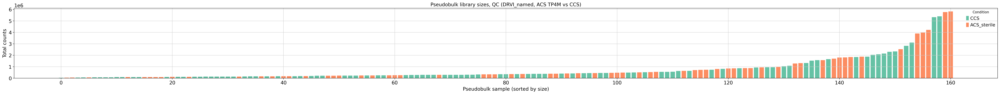

  B-cell: ACS_sterile=11, CCS=13 samples
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 0.34 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...


... done in 0.35 seconds.

Fitting LFCs...
... done in 0.20 seconds.



Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      11.552270        0.673144  0.304111  2.213482  0.026864  0.143570
AURKAIP1   11.616409       -0.024496  0.192234 -0.127425  0.898604  0.959688
SSU72      15.124418       -0.165853  0.166901 -0.993717  0.320361  0.601080
GNB1       13.448398       -0.101243  0.207360 -0.488249  0.625374  0.836397
TNFRSF14   13.217964       -0.072778  0.189371 -0.384313  0.700747  0.882021
...              ...             ...       ...       ...       ...       ...
MT-ND4L    47.090218        0.455491  0.132810  3.429658  0.000604  0.012711
MT-ND4    526.082750       -0.155216  0.084405 -1.838953  0.065922  0.246310
MT-ND5    157.120718        0.090119  0.121764  0.740115  0.459230  0.730288
MT-ND6     22.125048        0.201805  0.156341  1.290801  0.196773  0.473417
MT-CYB    668.732792       -0.222749  0.097318 -2.288867  0.022087  0.125340

[1330 ro

Fitting dispersions...


... done in 0.59 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.67 seconds.

Fitting LFCs...


... done in 0.39 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15      38.119664        1.408383  0.470587  2.992821  0.002764  0.198053
SDF4       12.371658        0.327427  0.333118  0.982916  0.325649  0.963915
UBE2J2      9.805539        0.504116  0.404131  1.247409  0.212248  0.895600
AURKAIP1   27.533413        0.087142  0.260513  0.334503  0.738000  0.983406
MRPL20     23.886592        0.292627  0.228311  1.281700  0.199948  0.893938
...              ...             ...       ...       ...       ...       ...
MT-ND4L    57.719926        0.252742  0.206975  1.221127  0.222038  0.896432
MT-ND4    672.723359       -0.105688  0.148803 -0.710254  0.477547  0.975249
MT-ND5    228.992478        0.144004  0.164880  0.873389  0.382451  0.967277
MT-ND6     20.879535        0.771843  0.260735  2.960253  0.003074  0.200269
MT-CYB    847.773666       -0.181601  0.136002 -1.335289  0.181782  0.886466

[2915 ro

Fitting size factors...
... done in 0.00 seconds.



Fitting dispersions...


... done in 1.32 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...


... done in 1.38 seconds.

Fitting LFCs...


... done in 0.76 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.30 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      10.661318       -0.197174  0.196769 -1.002056  0.316317  0.590012
ISG15      87.313634        1.118763  0.353722  3.162833  0.001562  0.021087
SDF4       31.591331       -0.156706  0.122446 -1.279792  0.200618  0.469300
UBE2J2     21.542002       -0.300281  0.150048 -2.001231  0.045368  0.196228
INTS11     12.417035       -0.309240  0.173344 -1.783967  0.074429  0.265606
...              ...             ...       ...       ...       ...       ...
MT-ND4L   164.574621        0.443243  0.123891  3.577696  0.000347  0.006939
MT-ND4   1783.663177        0.055956  0.092999  0.601689  0.547381  0.765273
MT-ND5    546.316117        0.091861  0.104409  0.879817  0.378958  0.648456
MT-ND6     34.063878        0.334040  0.166565  2.005467  0.044913  0.195046
MT-CYB   1781.877066       -0.055062  0.081180 -0.678274  0.497598  0.738243

[5385 ro

Fitting dispersions...


... done in 0.55 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...


... done in 0.60 seconds.

Fitting LFCs...


... done in 0.35 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4       56.465893        0.333302  0.184759  1.803988  0.071233  0.317733
ISG15      58.897211        0.787653  0.339377  2.320878  0.020293  0.144159
AURKAIP1   22.905080       -0.231958  0.177543 -1.306487  0.191387  0.508300
MRPL20     15.434271        0.089039  0.218833  0.406880  0.684096  0.864307
SSU72      22.872011       -0.144819  0.190318 -0.760932  0.446698  0.743273
...              ...             ...       ...       ...       ...       ...
MT-ND4L    54.455119        0.240560  0.151221  1.590786  0.111658  0.400298
MT-ND4    549.842774       -0.054316  0.085460 -0.635579  0.525051  0.784489
MT-ND5    209.657582        0.025584  0.102139  0.250481  0.802216  0.924074
MT-ND6     18.385788        0.547294  0.198828  2.752593  0.005913  0.068379
MT-CYB    793.752392       -0.162114  0.111004 -1.460436  0.144170  0.444303

[2380 ro

Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.38 seconds.

Fitting dispersion trend curve...
... done in 0.13 seconds.

Fitting MAP dispersions...


... done in 1.42 seconds.

Fitting LFCs...


... done in 1.21 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.30 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat        pvalue  \
NOC2L       20.213350       -0.047612  0.141930 -0.335459  7.372789e-01   
ISG15       77.647917        0.409470  0.163620  2.502571  1.232950e-02   
TNFRSF18    18.430253       -0.009265  0.338126 -0.027401  9.781398e-01   
SDF4        50.310898       -0.280388  0.114231 -2.454568  1.410539e-02   
UBE2J2      23.336867        0.001113  0.126723  0.008785  9.929904e-01   
...               ...             ...       ...       ...           ...   
MT-ND4L    157.005146        0.492613  0.093863  5.248220  1.535760e-07   
MT-ND4    1587.311935       -0.017209  0.071077 -0.242117  8.086895e-01   
MT-ND5     681.737483        0.094228  0.077072  1.222600  2.214808e-01   
MT-ND6      89.130425        0.421771  0.100328  4.203943  2.623049e-05   
MT-CYB    2278.761016        0.054142  0.084306  0.642210  5.207366e-01   

              padj  
NOC2L     0

Fitting dispersions...


... done in 2.03 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.



Fitting MAP dispersions...


... done in 2.17 seconds.

Fitting LFCs...


... done in 1.52 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.44 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AL669831.5    16.775843        0.304148  0.166159  1.830460  6.718122e-02   
NOC2L         51.520551       -0.277711  0.103390 -2.686048  7.230274e-03   
HES4          15.923914        0.364526  0.331202  1.100613  2.710650e-01   
ISG15        246.293342        0.520850  0.199608  2.609365  9.071054e-03   
C1orf159      10.379615        0.456066  0.216313  2.108365  3.499939e-02   
...                 ...             ...       ...       ...           ...   
MT-ND5      1774.710532        0.060865  0.080760  0.753658  4.510547e-01   
MT-ND6       236.014346        0.534924  0.058387  9.161664  5.110294e-20   
MT-CYB      9429.837891       -0.260107  0.087388 -2.976461  2.915957e-03   
AL592183.1    20.391436        0.151832  0.397859  0.381622  7.027415e-01   
AC004556.1    11.570910        0.940618  1.011250  0.930154  3.522913e-01   

        

Fitting dispersions...


... done in 0.87 seconds.

Fitting dispersion trend curve...
... done in 0.13 seconds.

Fitting MAP dispersions...


... done in 0.89 seconds.

Fitting LFCs...


... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


... done in 0.22 seconds.



Log2 fold change & Wald test p-value: condition ACS_sterile vs CCS
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
ISG15       43.375781        0.630666  0.274345  2.298807  0.021516  0.163434
SDF4        16.732952       -0.229043  0.174298 -1.314091  0.188816  0.492976
UBE2J2      11.516626        0.150527  0.175781  0.856333  0.391814       NaN
AURKAIP1    26.604719       -0.151212  0.125025 -1.209455  0.226488  0.524597
CCNL2       10.843936       -0.091460  0.205412 -0.445252  0.656138       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND4L     69.622988        0.526776  0.115599  4.556934  0.000005  0.000616
MT-ND4     884.829184       -0.162563  0.092281 -1.761605  0.078136  0.332147
MT-ND5     324.948097        0.031867  0.096052  0.331765  0.740067  0.894714
MT-ND6      43.886702        0.343529  0.116020  2.960940  0.003067  0.051824
MT-CYB    1496.555343       -0.235954  0.091431 -2.580673  0.009861  0.1039

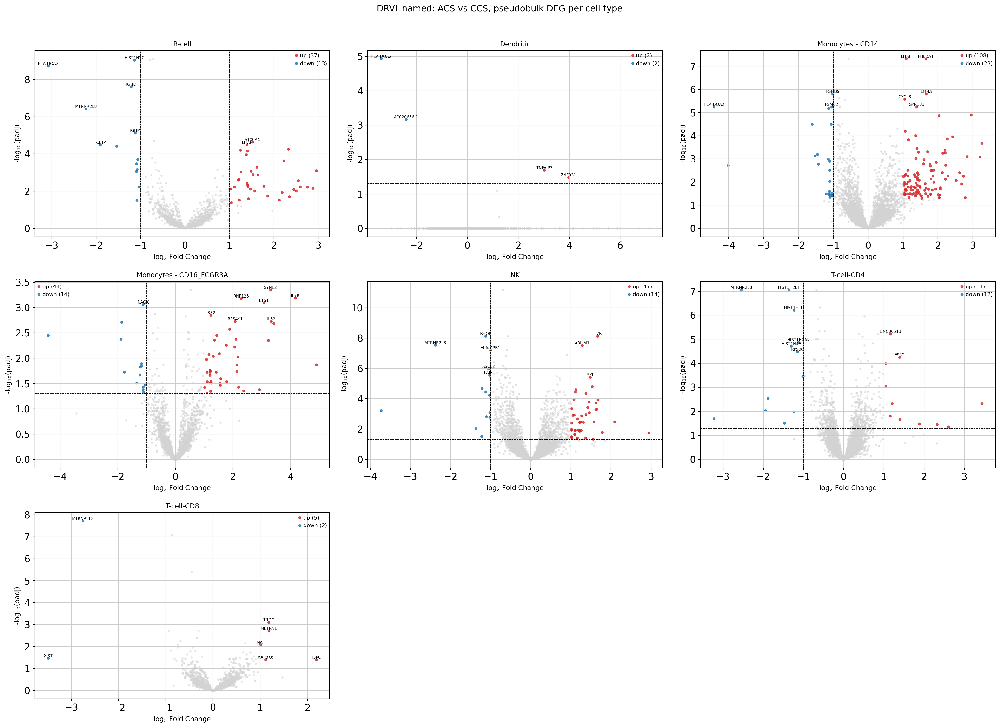

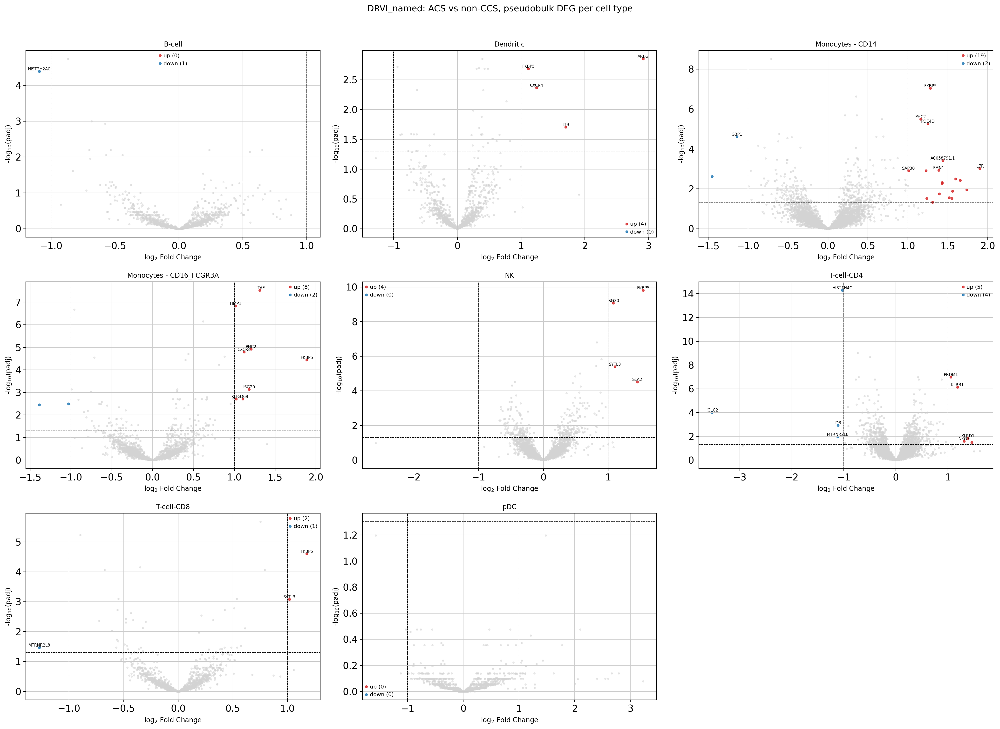

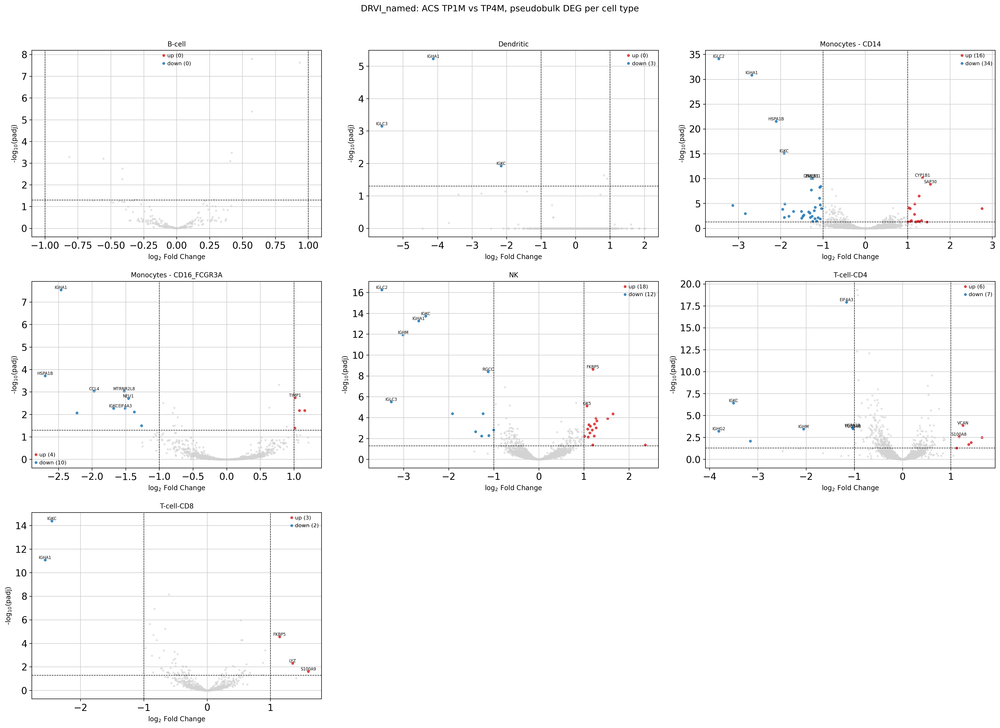

DRVI_named_ACS_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 334
cell_type
Monocytes - CD14           131
NK                          61
Monocytes - CD16_FCGR3A     58
B-cell                      50
T-cell-CD4                  23
T-cell-CD8                   7
Dendritic                    4


DRVI_named_ACS_vs_nonCCS
Significant DEGs (padj<0.05, |LFC|>1.0): 52
cell_type
Monocytes - CD14           21
Monocytes - CD16_FCGR3A    10
T-cell-CD4                  9
NK                          4
Dendritic                   4
T-cell-CD8                  3
B-cell                      1


DRVI_named_ACS_TP1M_vs_TP4M
Significant DEGs (padj<0.05, |LFC|>1.0): 115
cell_type
Monocytes - CD14           50
NK                         30
Monocytes - CD16_FCGR3A    14
T-cell-CD4                 13
T-cell-CD8                  5
Dendritic                   3


DRVI_named_ACS_TP1M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 107
cell_type
Monocytes - CD14           45
NK                         21
Monocytes - CD16_FCGR3A    14
T-cell-CD4                 13
B-cell                      8
T-cell-CD8                  4
Dendritic                   2


DRVI_named_ACS_TP2M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 161
cell_type
Monocytes - CD14           48
NK                         34
T-cell-CD4                 26
Monocytes - CD16_FCGR3A    23
B-cell                     22
Dendritic                   4
T-cell-CD8                  4


DRVI_named_ACS_TP3M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 36
cell_type
Monocytes - CD14           10
T-cell-CD4                  7
NK                          6
B-cell                      5
Monocytes - CD16_FCGR3A     4
Dendritic                   3
T-cell-CD8                  1


DRVI_named_ACS_TP4M_vs_CCS
Significant DEGs (padj<0.05, |LFC|>1.0): 154
cell_type
Monocytes - CD14           58
NK                         30
Dendritic                  18
T-cell-CD4                 17
B-cell                     14
Monocytes - CD16_FCGR3A    12
T-cell-CD8                  5

DRVI_named, ACS vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,B-cell,HIST1H1C,-1.14,9.21e-10,23.8
1,B-cell,HLA-DQA2,-3.08,1.87e-09,9.1
2,NK,RHOC,-1.12,7.41e-09,45.6
3,NK,IL7R,1.67,7.41e-09,137.6
4,T-cell-CD8,MTRNR2L8,-2.76,1.90e-08,24.7
5,B-cell,IGHD,-1.21,2.45e-08,60.6
6,NK,MTRNR2L8,-2.38,2.91e-08,71.6
7,NK,ABLIM1,1.28,3.02e-08,33.1
8,Monocytes - CD14,PHLDA1,1.65,4.82e-08,60.0
9,Monocytes - CD14,LITAF,1.09,4.82e-08,79.5



DRVI_named, ACS vs Control, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,T-cell-CD4,HIST1H4C,-1.03,5.14e-15,527.0
1,NK,FKBP5,1.54,1.55e-10,39.3
2,NK,ISG20,1.08,8.36e-10,93.8
3,Monocytes - CD16_FCGR3A,LITAF,1.31,2.98e-08,26.9
4,Monocytes - CD14,FKBP5,1.28,8.92e-08,85.1
5,T-cell-CD4,PRDM1,1.06,1.01e-07,62.6
6,Monocytes - CD16_FCGR3A,TIMP1,1.01,1.47e-07,238.3
7,T-cell-CD4,KLRB1,1.19,7.20e-07,372.0
8,Monocytes - CD14,PHC2,1.16,3.22e-06,31.6
9,NK,SYTL3,1.10,4.03e-06,99.1



DRVI_named, ACS TP1M vs TP4M, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,Monocytes - CD14,IGLC2,-3.47,7.42e-35,61.7
1,Monocytes - CD14,IGHA1,-2.69,1.40e-31,179.6
2,Monocytes - CD14,HSPA1B,-2.11,2.72e-22,285.2
3,T-cell-CD4,EIF4A3,-1.16,1.19e-18,334.8
4,NK,IGLC2,-3.48,5.59e-17,46.1
5,Monocytes - CD14,IGKC,-1.92,8.06e-16,200.1
6,T-cell-CD8,IGKC,-2.45,4.02e-15,37.7
7,NK,IGKC,-2.51,1.79e-14,140.4
8,NK,IGHA1,-2.67,5.15e-14,107.3
9,NK,IGHM,-3.01,1.11e-12,23.2



DRVI_named, ACS TP1M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,T-cell-CD4,HIST1H4C,-1.28,5.40e-34,583.3
1,T-cell-CD4,LINC00513,1.49,4.73e-27,37.9
2,T-cell-CD4,HIST1H4E,-1.37,4.95e-22,30.9
3,T-cell-CD4,AC058791.1,1.22,3.38e-19,101.6
4,NK,AC058791.1,1.58,2.99e-13,22.4
5,T-cell-CD4,HIST1H1D,-1.21,4.81e-10,209.4
6,T-cell-CD8,HIST1H4C,-1.02,2.36e-09,66.6
7,B-cell,HIST1H4C,-1.12,4.59e-09,43.9
8,Monocytes - CD16_FCGR3A,IRS2,1.13,5.31e-09,39.5
9,Monocytes - CD16_FCGR3A,CXCR4,1.39,5.31e-09,53.9



DRVI_named, ACS TP2M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,T-cell-CD4,HIST2H2AC,-1.01,1.50e-62,158.1
1,T-cell-CD4,HIST1H4C,-1.01,2.18e-54,586.4
2,Monocytes - CD14,IL32,3.32,3.28e-34,36.5
3,T-cell-CD4,HIST1H4E,-1.35,3.67e-26,29.3
4,NK,LTB,1.77,2.53e-24,102.9
5,Monocytes - CD14,HLA-DMB,-1.06,4.88e-21,65.8
6,T-cell-CD4,AC058791.1,1.30,5.42e-21,107.8
7,Monocytes - CD14,SLC38A1,2.75,1.44e-20,13.0
8,NK,RCAN3,2.11,9.39e-20,22.4
9,Monocytes - CD14,BCL11B,3.56,8.31e-18,19.0



DRVI_named, ACS TP3M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,Monocytes - CD16_FCGR3A,CXCL2,1.74,2.45e-07,26.0
1,T-cell-CD4,HIST1H2AK,-1.22,3.16e-07,12.6
2,NK,IGKC,1.29,3.48e-07,15.7
3,NK,AC058791.1,1.38,4.98e-06,19.7
4,NK,EGR1,1.18,9.13e-06,12.9
5,T-cell-CD4,HIST1H1D,-1.06,2.50e-05,230.1
6,NK,MTRNR2L8,-2.05,3.96e-05,80.4
7,NK,GPR183,1.17,5.12e-05,16.0
8,B-cell,CREM,1.09,6.15e-05,19.5
9,T-cell-CD4,BCL3,1.09,1.06e-04,21.6



DRVI_named, ACS TP4M vs CCS, top 5 DEGs per cell type


,cell_type,gene,log2FoldChange,padj,baseMean
0,NK,IGKC,3.95,4.51e-32,81.9
1,Dendritic,IGHA1,5.12,6.80e-29,27.3
2,T-cell-CD4,IGHM,3.22,2.56e-24,45.5
3,Dendritic,IGKC,4.41,2.94e-23,28.0
4,T-cell-CD8,IGKC,3.65,5.04e-22,35.6
5,NK,IGHA1,3.99,1.39e-21,62.3
6,Monocytes - CD14,IGKC,3.67,1.97e-21,58.7
7,NK,IGLC3,4.43,7.31e-21,14.0
8,Monocytes - CD16_FCGR3A,IGKC,3.77,1.28e-20,21.9
9,Monocytes - CD14,IGHA1,4.49,1.54e-20,56.8


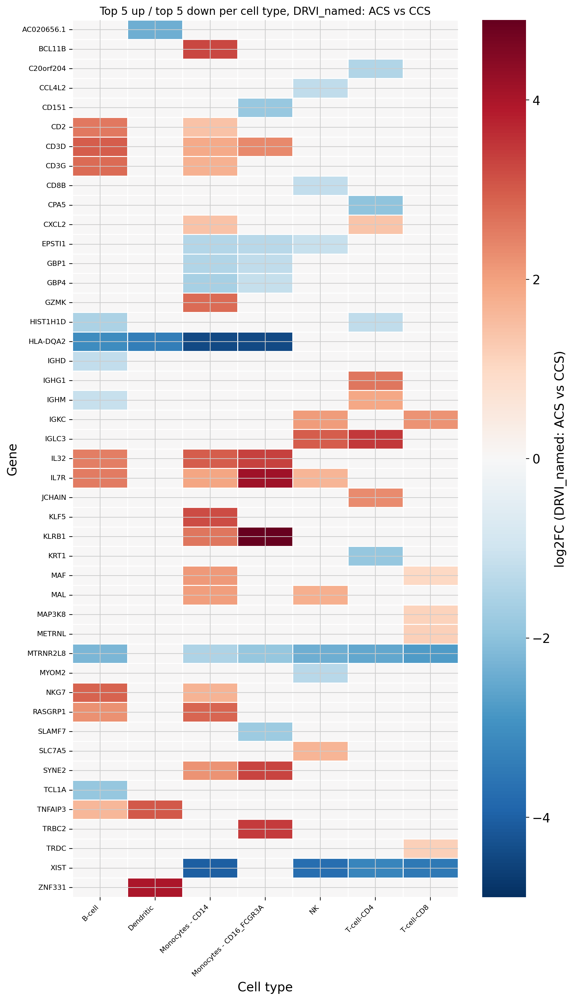

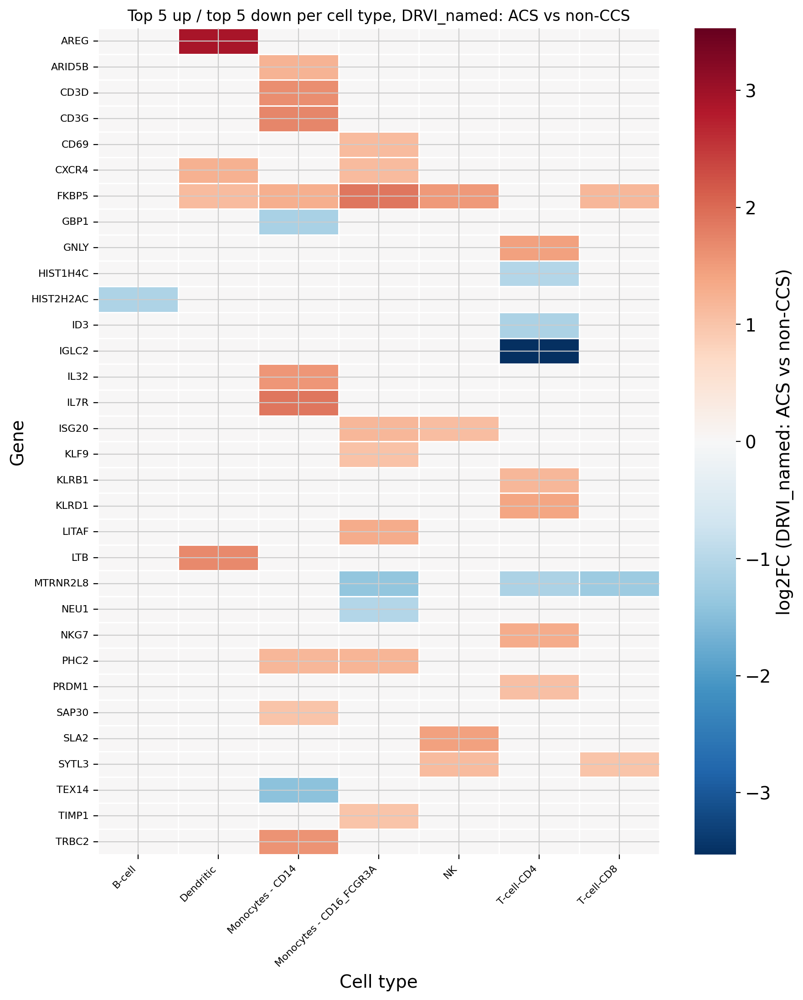

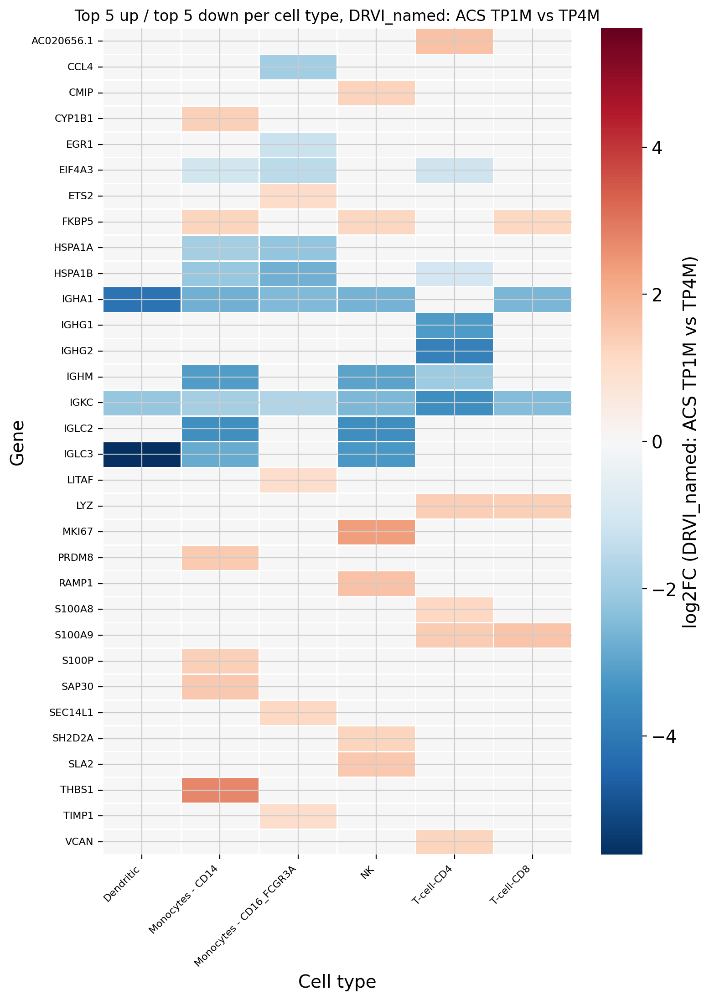



Significant DEG counts per method (padj<0.05, |log2FC|>1.0):
  Harmony_leiden ACS_vs_CCS           200 DEGs
  Harmony_leiden ACS_vs_nonCCS        38 DEGs
  Harmony_leiden ACS_TP1M_vs_TP4M     139 DEGs
  Harmony_leiden ACS_TP1M_vs_CCS      92 DEGs
  Harmony_leiden ACS_TP2M_vs_CCS      125 DEGs


  Harmony_leiden ACS_TP3M_vs_CCS      23 DEGs
  Harmony_leiden ACS_TP4M_vs_CCS      118 DEGs
  Harmony_named ACS_vs_CCS           224 DEGs
  Harmony_named ACS_vs_nonCCS        48 DEGs
  Harmony_named ACS_TP1M_vs_TP4M     92 DEGs
  Harmony_named ACS_TP1M_vs_CCS      100 DEGs


  Harmony_named ACS_TP2M_vs_CCS      143 DEGs
  Harmony_named ACS_TP3M_vs_CCS      34 DEGs
  Harmony_named ACS_TP4M_vs_CCS      129 DEGs
  DRVI_leiden  ACS_vs_CCS           359 DEGs
  DRVI_leiden  ACS_vs_nonCCS        49 DEGs
  DRVI_leiden  ACS_TP1M_vs_TP4M     143 DEGs


  DRVI_leiden  ACS_TP1M_vs_CCS      117 DEGs
  DRVI_leiden  ACS_TP2M_vs_CCS      202 DEGs
  DRVI_leiden  ACS_TP3M_vs_CCS      37 DEGs
  DRVI_leiden  ACS_TP4M_vs_CCS      162 DEGs
  DRVI_named   ACS_vs_CCS           334 DEGs
  DRVI_named   ACS_vs_nonCCS        52 DEGs


  DRVI_named   ACS_TP1M_vs_TP4M     115 DEGs
  DRVI_named   ACS_TP1M_vs_CCS      107 DEGs
  DRVI_named   ACS_TP2M_vs_CCS      161 DEGs
  DRVI_named   ACS_TP3M_vs_CCS      36 DEGs
  DRVI_named   ACS_TP4M_vs_CCS      154 DEGs


In [16]:
all_results = {}

TIMEPOINT_COMPARISONS = ["ACS_TP1M_vs_CCS", "ACS_TP2M_vs_CCS", "ACS_TP3M_vs_CCS", "ACS_TP4M_vs_CCS"]

for method_name, cell_type_col in CELL_TYPE_COLS.items():
    print(f"\n\n{'#'*70}\n# {method_name}  (cell_type_col = '{cell_type_col}')\n{'#'*70}")

    results = run_all_comparisons(adata, cell_type_col, method_name)
    all_results[method_name] = results

    volcano_panel(
        results["ACS_vs_CCS"],
        title=f"{method_name}: ACS vs CCS, pseudobulk DEG per cell type",
        padj_thresh=PADJ_THRESH, lfc_thresh=LFC_THRESH,
        save=os.path.join(OUTPUT_DIR, f"volcano_{method_name}_ACS_vs_CCS.png"),
    )
    volcano_panel(
        results["ACS_vs_nonCCS"],
        title=f"{method_name}: ACS vs non-CCS, pseudobulk DEG per cell type",
        padj_thresh=PADJ_THRESH, lfc_thresh=LFC_THRESH,
        save=os.path.join(OUTPUT_DIR, f"volcano_{method_name}_ACS_vs_nonCCS.png"),
    )
    volcano_panel(
        results["ACS_TP1M_vs_TP4M"],
        title=f"{method_name}: ACS TP1M vs TP4M, pseudobulk DEG per cell type",
        padj_thresh=PADJ_THRESH, lfc_thresh=LFC_THRESH,
        save=os.path.join(OUTPUT_DIR, f"volcano_{method_name}_ACS_TP1M_vs_TP4M.png"),
    )
    # Comparison 4's own volcano/heatmap plots are produced by
    # replot_timepoint_vs_ccs.py (different style, requested separately,
    # now covering all four groupings). This loop only saves the CSVs below.

    res_acs_ccs    = summarise(results["ACS_vs_CCS"],       f"{method_name}_ACS_vs_CCS",       padj_thresh=PADJ_THRESH, lfc_thresh=LFC_THRESH)
    res_acs_nonccs = summarise(results["ACS_vs_nonCCS"],    f"{method_name}_ACS_vs_nonCCS",    padj_thresh=PADJ_THRESH, lfc_thresh=LFC_THRESH)
    res_long       = summarise(results["ACS_TP1M_vs_TP4M"], f"{method_name}_ACS_TP1M_vs_TP4M", padj_thresh=PADJ_THRESH, lfc_thresh=LFC_THRESH)
    res_by_tp = {
        comp: summarise(results[comp], f"{method_name}_{comp}", padj_thresh=PADJ_THRESH, lfc_thresh=LFC_THRESH)
        for comp in TIMEPOINT_COMPARISONS
    }

    labeled_results = [
        ("ACS vs CCS", res_acs_ccs),
        ("ACS vs Control", res_acs_nonccs),
        ("ACS TP1M vs TP4M", res_long),
    ] + [(comp.replace("_", " "), res_by_tp[comp]) for comp in TIMEPOINT_COMPARISONS]

    for label, res in labeled_results:
        if res is None:
            continue
        sig = res[res["significant"]]
        if sig.empty:
            print(f"{method_name}, {label}: no significant DEGs at current thresholds")
            continue
        top = (
            sig.sort_values("padj")
               .groupby("cell_type")
               .head(5)[["cell_type", "gene", "log2FoldChange", "padj", "baseMean"]]
        )
        top["log2FoldChange"] = top["log2FoldChange"].round(2)
        top["padj"] = top["padj"].apply(lambda x: f"{x:.2e}")
        top["baseMean"] = top["baseMean"].round(1)
        print(f"\n{method_name}, {label}, top 5 DEGs per cell type")
        display(top.reset_index(drop=True))

    heatmap_top_degs(res_acs_ccs,    f"{method_name}: ACS vs CCS",
                     save=os.path.join(OUTPUT_DIR, f"heatmap_{method_name}_ACS_vs_CCS.png"))
    heatmap_top_degs(res_acs_nonccs, f"{method_name}: ACS vs non-CCS",
                     save=os.path.join(OUTPUT_DIR, f"heatmap_{method_name}_ACS_vs_nonCCS.png"))
    heatmap_top_degs(res_long,       f"{method_name}: ACS TP1M vs TP4M",
                     save=os.path.join(OUTPUT_DIR, f"heatmap_{method_name}_ACS_TP1M_vs_TP4M.png"))

print(f"\n\nSignificant DEG counts per method (padj<{PADJ_THRESH}, |log2FC|>{LFC_THRESH}):")
for method_name in CELL_TYPE_COLS:
    for comparison in ["ACS_vs_CCS", "ACS_vs_nonCCS", "ACS_TP1M_vs_TP4M"] + TIMEPOINT_COMPARISONS:
        fname = os.path.join(OUTPUT_DIR, f"{method_name}_{comparison}.csv")
        if os.path.exists(fname):
            df = pd.read_csv(fname)
            print(f"  {method_name:12s} {comparison:20s} {int(df['significant'].sum())} DEGs")


In [17]:
print("Done. Output files:")
for f in sorted(os.listdir(OUTPUT_DIR)):
    print(f"  {f}")

Done. Output files:
  DRVI_leiden_ACS_TP1M_vs_CCS.csv
  DRVI_leiden_ACS_TP1M_vs_TP4M.csv
  DRVI_leiden_ACS_TP2M_vs_CCS.csv
  DRVI_leiden_ACS_TP3M_vs_CCS.csv
  DRVI_leiden_ACS_TP4M_vs_CCS.csv
  DRVI_leiden_ACS_vs_CCS.csv
  DRVI_leiden_ACS_vs_nonCCS.csv
  DRVI_named_ACS_TP1M_vs_CCS.csv
  DRVI_named_ACS_TP1M_vs_TP4M.csv
  DRVI_named_ACS_TP2M_vs_CCS.csv
  DRVI_named_ACS_TP3M_vs_CCS.csv
  DRVI_named_ACS_TP4M_vs_CCS.csv
  DRVI_named_ACS_vs_CCS.csv
  DRVI_named_ACS_vs_nonCCS.csv
  Harmony_leiden_ACS_TP1M_vs_CCS.csv
  Harmony_leiden_ACS_TP1M_vs_TP4M.csv
  Harmony_leiden_ACS_TP2M_vs_CCS.csv
  Harmony_leiden_ACS_TP3M_vs_CCS.csv
  Harmony_leiden_ACS_TP4M_vs_CCS.csv
  Harmony_leiden_ACS_vs_CCS.csv
  Harmony_leiden_ACS_vs_nonCCS.csv
  Harmony_named_ACS_TP1M_vs_CCS.csv
  Harmony_named_ACS_TP1M_vs_TP4M.csv
  Harmony_named_ACS_TP2M_vs_CCS.csv
  Harmony_named_ACS_TP3M_vs_CCS.csv
  Harmony_named_ACS_TP4M_vs_CCS.csv
  Harmony_named_ACS_vs_CCS.csv
  Harmony_named_ACS_vs_nonCCS.csv
  celltype_composition.p